In [2]:
import os
# if using Apple MPS, fall back to CPU for unsupported ops
os.environ["PYTORCH_ENABLE_MPS_FALLBACK"] = "1"
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image

In [3]:
# select the device for computation
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"using device: {device}")

if device.type == "cuda":
    # use bfloat16 for the entire notebook
    torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
    # turn on tfloat32 for Ampere GPUs (https://pytorch.org/docs/stable/notes/cuda.html#tensorfloat-32-tf32-on-ampere-devices)
    if torch.cuda.get_device_properties(0).major >= 8:
        torch.backends.cuda.matmul.allow_tf32 = True
        torch.backends.cudnn.allow_tf32 = True
elif device.type == "mps":
    print(
        "\nSupport for MPS devices is preliminary. SAM 2 is trained with CUDA and might "
        "give numerically different outputs and sometimes degraded performance on MPS. "
        "See e.g. https://github.com/pytorch/pytorch/issues/84936 for a discussion."
    )

using device: cuda


In [4]:
np.random.seed(3)

def show_mask(mask, ax, random_color=False, borders = True):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask = mask.astype(np.uint8)
    mask_image =  mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    if borders:
        import cv2
        contours, _ = cv2.findContours(mask,cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE) 
        # Try to smooth contours
        contours = [cv2.approxPolyDP(contour, epsilon=0.01, closed=True) for contour in contours]
        mask_image = cv2.drawContours(mask_image, contours, -1, (1, 1, 1, 0.5), thickness=2) 
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)   

def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0, 0, 0, 0), lw=2))    

def show_masks(image, masks, scores, point_coords=None, box_coords=None, input_labels=None, borders=True):
    for i, (mask, score) in enumerate(zip(masks, scores)):
        plt.figure(figsize=(10, 10))
        plt.imshow(image)
        show_mask(mask, plt.gca(), borders=borders)
        if point_coords is not None:
            assert input_labels is not None
            show_points(point_coords, input_labels, plt.gca())
        if box_coords is not None:
            # boxes
            show_box(box_coords, plt.gca())
        if len(scores) > 1:
            plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
        plt.axis('off')
        plt.show()

In [5]:
import sys
sys.path.append('/home/jeongeun/eun/sam2')

from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

sam2_checkpoint = "../checkpoints/sam2.1_hiera_large.pt"
model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"

sam2_model = build_sam2(model_cfg, sam2_checkpoint, device=device)

predictor = SAM2ImagePredictor(sam2_model)

In [6]:
def load_sam2_encoder(model_cfg, checkpoint_path, device="cuda"):
    """
    build_sam2(...) + SAM2ImagePredictor(...) 세팅
    """
    sam2_model = build_sam2(model_cfg, checkpoint_path, device=device)
    sam2_model.eval()
    
    predictor = SAM2ImagePredictor(sam2_model)
    return sam2_model, predictor


## Find Best Slice

In [7]:
! pip install ace_tools

### label npy --> jpg

In [13]:
import os
import numpy as np
import cv2  # OpenCV 사용
from tqdm import tqdm  # 진행상황 표시

# ✅ BTVC 13개 클래스 색상 팔레트 정의 (RGB 값)
BTVC_COLORS = {
    1: (255, 0, 0),      # 비장 - 빨강
    2: (0, 255, 0),      # 오른쪽 신장 - 초록
    3: (0, 0, 255),      # 왼쪽 신장 - 파랑
    4: (255, 255, 0),    # 담낭 - 노랑
    5: (255, 0, 255),    # 식도 - 핑크
    6: (0, 255, 255),    # 간 - 하늘색
    7: (128, 0, 0),      # 위 - 어두운 빨강
    8: (0, 128, 0),      # 대동맥 - 어두운 초록
    9: (0, 0, 128),      # 하대정맥 - 어두운 파랑
    10: (128, 128, 0),   # 췌장 - 올리브색
    11: (128, 0, 128),   # 부신 - 보라색
    12: (0, 128, 128),   # 십이지장 - 청록색
    13: (192, 192, 192)  # 방광 - 회색
}

def convert_npy_to_jpg(npy_folder, output_folder):
    """
    주어진 폴더 내의 .npy 마스크 파일들을 폴더 구조를 유지하면서 컬러 .jpg 이미지로 변환하여 저장하는 함수.

    Parameters:
        npy_folder (str): .npy 파일이 저장된 최상위 폴더 경로 (예: "./videos/btcv/Training/mask")
        output_folder (str): 변환된 .jpg 파일을 저장할 최상위 폴더 경로 (예: "./videos/btcv/Training/mask_jpg")
    """
    # 최상위 출력 폴더 생성
    os.makedirs(output_folder, exist_ok=True)

    # npy_folder 내의 모든 파일(하위 디렉토리 포함)을 순회
    for root, _, files in os.walk(npy_folder):
        # 현재 root 폴더의 npy_folder 기준 상대 경로 구하기
        relative_path = os.path.relpath(root, npy_folder)
        target_dir = os.path.join(output_folder, relative_path)
        os.makedirs(target_dir, exist_ok=True)  # 출력 폴더에 동일한 하위 폴더 생성

        for file in tqdm(sorted(files), desc=f"Processing files in {relative_path}"):
            if file.endswith(".npy"):
                file_path = os.path.join(root, file)
                mask = np.load(file_path)  # .npy 파일 로드

                # 마스크를 컬러 이미지로 변환 (RGB 이미지 생성)
                mask_rgb = np.zeros((*mask.shape, 3), dtype=np.uint8)
                for class_id, color in BTVC_COLORS.items():
                    mask_rgb[mask == class_id] = color

                # 저장 경로 설정 (확장자만 .jpg로 변경)
                output_file = os.path.join(target_dir, file.replace(".npy", ".jpg"))
                # OpenCV를 사용하여 .jpg 파일로 저장 (BGR 순서이므로 변환)
                cv2.imwrite(output_file, cv2.cvtColor(mask_rgb, cv2.COLOR_RGB2BGR))
    
    print(f"✅ 변환 완료! 저장 경로: {output_folder}")

# 실행 예제
npy_folder = "./videos/btcv/Training/mask"     # 예: mask/img0001/0.npy, mask/img0002/0.npy, ...
output_folder = "./videos/btcv/Training/mask_jpg"  # 변환된 jpg 파일이 저장될 폴더

convert_npy_to_jpg(npy_folder, output_folder)


Processing files in .: 0it [00:00, ?it/s]
Processing files in img0004: 100%|██████████| 140/140 [00:00<00:00, 172.24it/s]

✅ 변환 완료! 저장 경로: ./videos/btcv/Training/mask_jpg


## stage 1 prototype generation

In [5]:
import os
import numpy as np
from tqdm import tqdm
from collections import defaultdict
from PIL import Image
import torch
import torch.nn as nn
import cv2

########################################
# (A) 유틸리티 함수: 이미지/레이블 로드 및 리사이즈
########################################

def load_image_and_label(image_path, label_path):
    """
    이미지를 로드하고, 해당 라벨(np.array)을 함께 반환합니다.
    """
    image_rgb = np.array(Image.open(image_path).convert("RGB"))
    label_2d = np.load(label_path)  # npy 파일, 각 픽셀에 클래스 번호 (0: 배경, 1,2,...)
    return image_rgb, label_2d

def resize_mask_to_match(image_shape, mask):
    """
    이미지 shape (H,W,3)와 mask (H,W)가 다르면, mask를 이미지 크기에 맞게 리사이즈합니다.
    """
    img_h, img_w = image_shape[:2]
    mask_h, mask_w = mask.shape
    if (img_h, img_w) != (mask_h, mask_w):
        resized_mask = cv2.resize(mask, (img_w, img_h), interpolation=cv2.INTER_NEAREST)
        return resized_mask
    return mask

def get_encoder_features(predictor, image_rgb):
    """
    SAM2 모델의 predictor를 이용해 encoder feature를 추출합니다.
    반환형식은 {"image_embed": tensor, "high_res_feats": [...] } 입니다.
    """
    predictor.set_image(image_rgb)
    feats = predictor.get_image_embedding()
    if isinstance(feats, torch.Tensor):
        return {"image_embed": feats.unsqueeze(0), "high_res_feats": []}
    elif isinstance(feats, dict):
        return {"image_embed": feats["image_embed"], "high_res_feats": feats.get("high_res_feats", [])}
    else:
        raise ValueError(f"Unexpected type from get_image_embedding(): {type(feats)}")

########################################
# (B) 중심점(Anchor) 계산 (npy 라벨)
########################################

def get_center_point_from_label(label_path, image_shape):
    """
    npy 형식의 라벨 파일을 불러와, 이미지 크기에 맞게 리사이즈한 후,
    가장 큰 컨투어의 중심점을 계산하여 (cx, cy)를 반환합니다.
    유효한 영역이 없으면 None과 리사이즈된 라벨을 반환합니다.
    """
    if not os.path.isfile(label_path):
        return None, np.zeros((image_shape[0], image_shape[1]), dtype=np.uint8)
    
    true_mask = np.load(label_path)
    true_mask = resize_mask_to_match(image_shape, true_mask)
    
    if np.max(true_mask) == 0:
        return None, true_mask

    contours, _ = cv2.findContours((true_mask > 0).astype(np.uint8),
                                   cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if len(contours) == 0:
        return None, true_mask

    largest_contour = max(contours, key=cv2.contourArea)
    M = cv2.moments(largest_contour)
    if M["m00"] == 0:
        return None, true_mask

    cx = int(M["m10"] / M["m00"])
    cy = int(M["m01"] / M["m00"])
    return (cx, cy), true_mask

########################################
# (C) Global Multi-scale Prototype 계산 관련 함수
########################################

def gather_class_embeddings(feat_map, label_2d, class_id, max_points=1000, boundary_margin=2):
    """
    주어진 feature map에서 특정 클래스에 해당하는 픽셀의 임베딩 벡터들을 수집합니다.
    경계 픽셀은 배제하여 보다 순수한 영역의 임베딩만 사용합니다.
    """
    if feat_map.ndim == 5:
        feat_map = feat_map.squeeze(1)
    _, C, H, W = feat_map.shape
    coords = np.where(label_2d == class_id)
    if len(coords[0]) == 0:
        return None
    # 경계 픽셀 배제
    padded_label = np.pad(label_2d, pad_width=boundary_margin, mode='constant', constant_values=0)
    valid_mask = np.ones_like(label_2d, dtype=bool)
    for y, x in zip(coords[0], coords[1]):
        sub_region = padded_label[y:y+2*boundary_margin+1, x:x+2*boundary_margin+1]
        if not np.all(sub_region == class_id):
            valid_mask[y, x] = False
    coords = np.where((label_2d == class_id) & valid_mask)
    num_pixels = len(coords[0])
    if num_pixels == 0:
        return None
    if num_pixels > max_points:
        rand_idx = np.random.choice(num_pixels, max_points, replace=False)
        coords = (coords[0][rand_idx], coords[1][rand_idx])
    scale_y = H / label_2d.shape[0]
    scale_x = W / label_2d.shape[1]
    feat_map_np = feat_map[0].cpu().numpy()  # [C, H, W]
    embedding_list = []
    for y, x in zip(coords[0], coords[1]):
        hy = int(y * scale_y)
        hx = int(x * scale_x)
        if 0 <= hy < H and 0 <= hx < W:
            emb = feat_map_np[:, hy, hx]
            embedding_list.append(emb)
    if len(embedding_list) == 0:
        return None
    return np.stack(embedding_list, axis=0)  # [N_points, C]

########################################
# (D) Local ROI 기반 Prototype 산출
########################################

def compute_roi_prototype(predictor, rgb_image, label_2d, class_id, margin=20, max_points=5000):
    """
    ROI(관심영역) 기반 프로토타입을 생성합니다.
    1) 해당 클래스의 영역을 바탕으로 ROI를 추출하고, margin을 적용해 확장합니다.
    2) 확장된 ROI 영역 내에서 임베딩을 추출하여 평균 임베딩(프로토타입)을 산출합니다.
    ROI의 너비나 높이가 0인 경우에는 None을 반환합니다.
    """
    coords = np.where(label_2d == class_id)
    if len(coords[0]) == 0:
        return None

    y_min, y_max = np.min(coords[0]), np.max(coords[0])
    x_min, x_max = np.min(coords[1]), np.max(coords[1])
    
    y_min = max(y_min - margin, 0)
    y_max = min(y_max + margin, label_2d.shape[0] - 1)
    x_min = max(x_min - margin, 0)
    x_max = min(x_max + margin, label_2d.shape[1] - 1)
    
    roi_width = x_max - x_min + 1
    roi_height = y_max - y_min + 1
    if roi_width <= 0 or roi_height <= 0:
        print(f"[Warning] ROI dimensions invalid: width={roi_width}, height={roi_height} (x_min={x_min}, x_max={x_max}, y_min={y_min}, y_max={y_max})")
        return None

    roi = rgb_image[y_min:y_max+1, x_min:x_max+1, :]
    roi_label = label_2d[y_min:y_max+1, x_min:x_max+1]
    # 추가 검사: ROI의 실제 shape가 (H,W,3)에서 H or W가 0이면 반환
    if roi.shape[0] == 0 or roi.shape[1] == 0:
        print(f"[Warning] ROI shape is invalid: {roi.shape}")
        return None

    feats_dict = get_encoder_features(predictor, roi)
    feat_map = feats_dict["image_embed"]  # [1, C, H_roi, W_roi]
    emb = gather_class_embeddings(feat_map, roi_label, class_id, max_points=max_points, boundary_margin=2)
    if emb is None or emb.shape[0] == 0:
        return None
    roi_proto = np.mean(emb, axis=0)
    return roi_proto

########################################
# (E) Hybrid Global+Local Prototype Fusion
########################################

def compute_hybrid_prototype(predictor, feat_maps, rgb_image, label_2d, class_id, max_points=1000, area_threshold=200):
    """
    1. Global Prototype: 여러 스케일 임베딩을 수집하여 전역 프로토타입을 계산합니다.
    2. 만약 해당 클래스 영역(pixel count)이 area_threshold 미만이면, ROI 기반 프로토타입을 추가로 산출합니다.
    3. 두 프로토타입을 가중 평균(Fusion)하여 최종 프로토타입을 반환합니다.
    """
    # Global prototype: Adaptive Multi-scale weighted average
    all_embs = []
    all_scale_weights = []
    for idx, fm in enumerate(feat_maps):
        emb_arr = gather_class_embeddings(fm, label_2d, class_id, max_points=max_points)
        if emb_arr is not None:
            region_area = np.sum(label_2d == class_id)
            weight = 1.0 if region_area < area_threshold else 1.0 / (2 ** idx)
            all_embs.append(emb_arr)
            all_scale_weights.append(np.full((emb_arr.shape[0],), weight))
    if len(all_embs) == 0:
        return None
    X = np.concatenate(all_embs, axis=0)  # [N_total, d]
    scale_weights = np.concatenate(all_scale_weights, axis=0)  # [N_total]
    global_proto = np.sum(X * scale_weights[:, None], axis=0) / (np.sum(scale_weights) + 1e-6)
    
    # Local ROI-based prototype
    roi_proto = compute_roi_prototype(predictor, rgb_image, label_2d, class_id, margin=20, max_points=max_points)
    
    # Fusion: 영역이 작으면 ROI 기반 비중을 높게, 영역이 크면 global 비중을 높게
    region_area = np.sum(label_2d == class_id)
    if roi_proto is not None:
        if region_area < area_threshold:
            w_local = 0.7
            w_global = 0.3
        else:
            w_local = 0.3
            w_global = 0.7
        final_proto = w_global * global_proto + w_local * roi_proto
    else:
        final_proto = global_proto

    return final_proto

########################################
# (F) Memory Bank 구축: Hybrid Prototype (Global+Local)
########################################

def build_memory_bank(predictor, image_dir, label_dir, output_path, max_points=1000, area_threshold=200):
    """
    주어진 이미지/레이블 디렉토리에서 multi-scale 임베딩을 추출하고,
    각 클래스별로 Hybrid Global+Local Prototype를 산출하여 Memory Bank를 구성한 후 .npz 파일로 저장합니다.
    """
    slice_files = sorted(os.listdir(image_dir))
    label_files = sorted(os.listdir(label_dir))
    memory_bank = defaultdict(list)
    
    for image_file, label_file in tqdm(zip(slice_files, label_files), total=len(slice_files), desc="Processing Images"):
        image_path = os.path.join(image_dir, image_file)
        label_path = os.path.join(label_dir, label_file)
        rgb_image, label_2d = load_image_and_label(image_path, label_path)
        feats_dict = get_encoder_features(predictor, rgb_image)
        feat_maps = [feats_dict["image_embed"]] + feats_dict["high_res_feats"]
        unique_classes = np.unique(label_2d)
        for cls_id in unique_classes:
            if cls_id == 0:
                continue  # 배경 제외
            proto = compute_hybrid_prototype(predictor, feat_maps, rgb_image, label_2d, cls_id, max_points=max_points, area_threshold=area_threshold)
            if proto is not None:
                memory_bank[cls_id].append(proto)
    final_bank = {}
    for cls_id, proto_list in memory_bank.items():
        arr = np.stack(proto_list, axis=0)
        final_bank[cls_id] = arr.mean(axis=0)
    final_bank_str = {str(int(cls_id)): val for cls_id, val in final_bank.items()}
    np.savez(output_path, **final_bank_str)
    print(f"Memory bank saved to {output_path}")
    return final_bank

########################################
# (G) Main 실행 코드
########################################

if __name__ == "__main__":
    from sam2.build_sam import build_sam2
    from sam2.sam2_image_predictor import SAM2ImagePredictor

    # 경로 설정 (예시)
    image_dir = "./videos/proto_snap/image"
    label_dir = "./videos/proto_snap/mask"
    output_path = "proto_snapse.npz"

    # SAM2 모델 로드
    device = "cuda" if torch.cuda.is_available() else "cpu"
    sam2_ckpt = "../checkpoints/sam2.1_hiera_large.pt"
    model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"
    sam2_model = build_sam2(model_cfg, sam2_ckpt, device=device)
    predictor = SAM2ImagePredictor(sam2_model)
    print(f"Loaded SAM2 model on device {device}")

    # Hybrid Prototype (Global+Local) 기반 Memory Bank 구축
    build_memory_bank(predictor, image_dir, label_dir, output_path, max_points=1000, area_threshold=200)


Loaded SAM2 model on device cuda


Processing Images: 100%|██████████| 10/10 [00:25<00:00,  2.59s/it]

Memory bank saved to proto_snapse.npz


## 10장에 대한 프로토타입

In [12]:
import os
import numpy as np
from tqdm import tqdm
from collections import defaultdict
from PIL import Image
import torch
import torch.nn as nn
import cv2

########################################
# (A) 유틸리티 함수: 이미지/레이블 로드 및 리사이즈
########################################

def load_image_and_label(image_path, label_path):
    """
    이미지를 로드하고, 해당 라벨(np.array)을 함께 반환합니다.
    """
    image_rgb = np.array(Image.open(image_path).convert("RGB"))
    label_2d = np.load(label_path)  # npy 파일, 각 픽셀에 클래스 번호 (0: 배경, 1,2,...)
    return image_rgb, label_2d

def resize_mask_to_match(image_shape, mask):
    """
    이미지 shape (H,W,3)와 mask (H,W)가 다르면, mask를 이미지 크기에 맞게 리사이즈합니다.
    """
    img_h, img_w = image_shape[:2]
    mask_h, mask_w = mask.shape
    if (img_h, img_w) != (mask_h, mask_w):
        resized_mask = cv2.resize(mask, (img_w, img_h), interpolation=cv2.INTER_NEAREST)
        return resized_mask
    return mask

def get_encoder_features(predictor, image_rgb):
    """
    SAM2 모델의 predictor를 이용해 encoder feature를 추출합니다.
    반환형식은 {"image_embed": tensor, "high_res_feats": [...] } 입니다.
    """
    predictor.set_image(image_rgb)
    feats = predictor.get_image_embedding()
    if isinstance(feats, torch.Tensor):
        return {"image_embed": feats.unsqueeze(0), "high_res_feats": []}
    elif isinstance(feats, dict):
        return {"image_embed": feats["image_embed"], "high_res_feats": feats.get("high_res_feats", [])}
    else:
        raise ValueError(f"Unexpected type from get_image_embedding(): {type(feats)}")

########################################
# (B) 중심점(Anchor) 계산 (npy 라벨)
########################################

def get_center_point_from_label(label_path, image_shape):
    """
    npy 형식의 라벨 파일을 불러와, 이미지 크기에 맞게 리사이즈한 후,
    가장 큰 컨투어의 중심점을 계산하여 (cx, cy)를 반환합니다.
    유효한 영역이 없으면 None과 리사이즈된 라벨을 반환합니다.
    """
    if not os.path.isfile(label_path):
        return None, np.zeros((image_shape[0], image_shape[1]), dtype=np.uint8)
    
    true_mask = np.load(label_path)
    true_mask = resize_mask_to_match(image_shape, true_mask)
    
    if np.max(true_mask) == 0:
        return None, true_mask

    contours, _ = cv2.findContours((true_mask > 0).astype(np.uint8),
                                   cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if len(contours) == 0:
        return None, true_mask

    largest_contour = max(contours, key=cv2.contourArea)
    M = cv2.moments(largest_contour)
    if M["m00"] == 0:
        return None, true_mask

    cx = int(M["m10"] / M["m00"])
    cy = int(M["m01"] / M["m00"])
    return (cx, cy), true_mask

########################################
# (C) Global Multi-scale Prototype 계산 관련 함수
########################################

def gather_class_embeddings(feat_map, label_2d, class_id, max_points=1000, boundary_margin=2):
    """
    주어진 feature map에서 특정 클래스에 해당하는 픽셀의 임베딩 벡터들을 수집합니다.
    경계 픽셀은 배제하여 보다 순수한 영역의 임베딩만 사용합니다.
    """
    if feat_map.ndim == 5:
        feat_map = feat_map.squeeze(1)
    _, C, H, W = feat_map.shape
    coords = np.where(label_2d == class_id)
    if len(coords[0]) == 0:
        return None
    # 경계 픽셀 배제
    padded_label = np.pad(label_2d, pad_width=boundary_margin, mode='constant', constant_values=0)
    valid_mask = np.ones_like(label_2d, dtype=bool)
    for y, x in zip(coords[0], coords[1]):
        sub_region = padded_label[y:y+2*boundary_margin+1, x:x+2*boundary_margin+1]
        if not np.all(sub_region == class_id):
            valid_mask[y, x] = False
    coords = np.where((label_2d == class_id) & valid_mask)
    num_pixels = len(coords[0])
    if num_pixels == 0:
        return None
    if num_pixels > max_points:
        rand_idx = np.random.choice(num_pixels, max_points, replace=False)
        coords = (coords[0][rand_idx], coords[1][rand_idx])
    scale_y = H / label_2d.shape[0]
    scale_x = W / label_2d.shape[1]
    feat_map_np = feat_map[0].cpu().numpy()  # [C, H, W]
    embedding_list = []
    for y, x in zip(coords[0], coords[1]):
        hy = int(y * scale_y)
        hx = int(x * scale_x)
        if 0 <= hy < H and 0 <= hx < W:
            emb = feat_map_np[:, hy, hx]
            embedding_list.append(emb)
    if len(embedding_list) == 0:
        return None
    return np.stack(embedding_list, axis=0)  # [N_points, C]

########################################
# (D) Local ROI 기반 Prototype 산출
########################################

def compute_roi_prototype(predictor, rgb_image, label_2d, class_id, margin=20, max_points=5000):
    """
    ROI(관심영역) 기반 프로토타입을 생성합니다.
    1) 해당 클래스의 영역을 바탕으로 ROI를 추출하고, margin을 적용해 확장합니다.
    2) 확장된 ROI 영역 내에서 임베딩을 추출하여 평균 임베딩(프로토타입)을 산출합니다.
    ROI의 너비나 높이가 0인 경우에는 None을 반환합니다.
    """
    coords = np.where(label_2d == class_id)
    if len(coords[0]) == 0:
        return None

    y_min, y_max = np.min(coords[0]), np.max(coords[0])
    x_min, x_max = np.min(coords[1]), np.max(coords[1])
    
    y_min = max(y_min - margin, 0)
    y_max = min(y_max + margin, label_2d.shape[0] - 1)
    x_min = max(x_min - margin, 0)
    x_max = min(x_max + margin, label_2d.shape[1] - 1)
    
    roi_width = x_max - x_min + 1
    roi_height = y_max - y_min + 1
    if roi_width <= 0 or roi_height <= 0:
        print(f"[Warning] ROI dimensions invalid: width={roi_width}, height={roi_height} (x_min={x_min}, x_max={x_max}, y_min={y_min}, y_max={y_max})")
        return None

    roi = rgb_image[y_min:y_max+1, x_min:x_max+1, :]
    roi_label = label_2d[y_min:y_max+1, x_min:x_max+1]
    if roi.shape[0] == 0 or roi.shape[1] == 0:
        print(f"[Warning] ROI shape is invalid: {roi.shape}")
        return None

    feats_dict = get_encoder_features(predictor, roi)
    feat_map = feats_dict["image_embed"]  # [1, C, H_roi, W_roi]
    emb = gather_class_embeddings(feat_map, roi_label, class_id, max_points=max_points, boundary_margin=2)
    if emb is None or emb.shape[0] == 0:
        return None
    roi_proto = np.mean(emb, axis=0)
    return roi_proto

########################################
# (E) Hybrid Global+Local Prototype Fusion
########################################

def compute_hybrid_prototype(predictor, feat_maps, rgb_image, label_2d, class_id, max_points=1000, area_threshold=200):
    """
    1. Global Prototype: 여러 스케일 임베딩을 수집하여 전역 프로토타입을 계산합니다.
    2. 만약 해당 클래스 영역(pixel count)이 area_threshold 미만이면, ROI 기반 프로토타입을 추가로 산출합니다.
    3. 두 프로토타입을 가중 평균(Fusion)하여 최종 프로토타입을 반환합니다.
    """
    # Global prototype: Adaptive Multi-scale weighted average
    all_embs = []
    all_scale_weights = []
    for idx, fm in enumerate(feat_maps):
        emb_arr = gather_class_embeddings(fm, label_2d, class_id, max_points=max_points)
        if emb_arr is not None:
            region_area = np.sum(label_2d == class_id)
            weight = 1.0 if region_area < area_threshold else 1.0 / (2 ** idx)
            all_embs.append(emb_arr)
            all_scale_weights.append(np.full((emb_arr.shape[0],), weight))
    if len(all_embs) == 0:
        return None
    X = np.concatenate(all_embs, axis=0)  # [N_total, d]
    scale_weights = np.concatenate(all_scale_weights, axis=0)  # [N_total]
    global_proto = np.sum(X * scale_weights[:, None], axis=0) / (np.sum(scale_weights) + 1e-6)
    
    # Local ROI-based prototype
    roi_proto = compute_roi_prototype(predictor, rgb_image, label_2d, class_id, margin=20, max_points=max_points)
    
    # Fusion: 영역이 작으면 ROI 기반 비중을 높게, 영역이 크면 global 비중을 높게
    region_area = np.sum(label_2d == class_id)
    if roi_proto is not None:
        if region_area < area_threshold:
            w_local = 0.7
            w_global = 0.3
        else:
            w_local = 0.3
            w_global = 0.7
        final_proto = w_global * global_proto + w_local * roi_proto
    else:
        final_proto = global_proto

    return final_proto

########################################
# (F) Memory Bank 구축: Hybrid Prototype (Global+Local) with Area Weighting
########################################

def build_memory_bank(predictor, image_dir, label_dir, output_path, max_points=1000, area_threshold=200):
    """
    주어진 이미지/레이블 디렉토리에서 multi-scale 임베딩을 추출하고,
    각 클래스별로 Hybrid Global+Local Prototype를 산출합니다.
    
    [개선 아이디어]
    - 적은 이미지 수(예: 10장) 상황에서는 각 이미지에서 산출한 프로토타입의 신뢰도를 해당 장기의 영역 크기(픽셀 수)로 평가합니다.
    - 최종 Memory Bank 구성 시, 각 이미지의 프로토타입을 해당 영역 크기로 가중 평균하여 보다 안정적인 프로토타입을 산출합니다.
    """
    slice_files = sorted(os.listdir(image_dir))
    label_files = sorted(os.listdir(label_dir))
    memory_bank = defaultdict(list)  # 각 클래스별로 (prototype, area) 튜플 저장
    for image_file, label_file in tqdm(zip(slice_files, label_files), total=len(slice_files), desc="Processing Images"):
        image_path = os.path.join(image_dir, image_file)
        label_path = os.path.join(label_dir, label_file)
        rgb_image, label_2d = load_image_and_label(image_path, label_path)
        feats_dict = get_encoder_features(predictor, rgb_image)
        feat_maps = [feats_dict["image_embed"]] + feats_dict["high_res_feats"]
        unique_classes = np.unique(label_2d)
        for cls_id in unique_classes:
            if cls_id == 0:
                continue  # 배경 제외
            # 각 이미지에서 해당 클래스의 면적(픽셀 수)를 계산합니다.
            region_area = np.sum(label_2d == cls_id)
            # 장기들이 상당히 큰 경우라면, 신뢰도가 높다고 판단하고, 
            # 작은 영역(노이즈로 판단될 가능성이 있는 경우)는 가중치를 낮춥니다.
            if region_area < area_threshold * 0.5:
                continue  # 너무 작은 영역은 제외
            proto = compute_hybrid_prototype(predictor, feat_maps, rgb_image, label_2d, cls_id, 
                                             max_points=max_points, area_threshold=area_threshold)
            if proto is not None:
                memory_bank[cls_id].append((proto, region_area))
                
    final_bank = {}
    for cls_id, proto_area_list in memory_bank.items():
        # 가중 평균: 각 이미지의 프로토타입에 해당 영역(픽셀 수)을 가중치로 사용합니다.
        proto_sum = 0
        total_weight = 0
        for proto, area in proto_area_list:
            proto_sum += proto * area
            total_weight += area
        if total_weight > 0:
            final_bank[cls_id] = proto_sum / total_weight
        else:
            final_bank[cls_id] = None
    # 저장 시, 클래스 ID를 문자열로 변환하여 저장합니다.
    final_bank_str = {str(int(cls_id)): val for cls_id, val in final_bank.items() if val is not None}
    np.savez(output_path, **final_bank_str)
    print(f"Memory bank saved to {output_path}")
    return final_bank

########################################
# (G) Main 실행 코드
########################################

if __name__ == "__main__":
    from sam2.build_sam import build_sam2
    from sam2.sam2_image_predictor import SAM2ImagePredictor

    # 경로 설정 (예시)
    image_dir = "./videos/proto_snap/image"  # 적은 수의 이미지 (예: 10장)
    label_dir = "./videos/proto_snap/mask"
    output_path = "proto_snapse.npz"

    # SAM2 모델 로드
    device = "cuda" if torch.cuda.is_available() else "cpu"
    sam2_ckpt = "../checkpoints/sam2.1_hiera_large.pt"
    model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"
    sam2_model = build_sam2(model_cfg, sam2_ckpt, device=device)
    predictor = SAM2ImagePredictor(sam2_model)
    print(f"Loaded SAM2 model on device {device}")

    # Hybrid Prototype (Global+Local) 기반 Memory Bank 구축 (Area Weighting 적용)
    build_memory_bank(predictor, image_dir, label_dir, output_path, max_points=1000, area_threshold=200)


Loaded SAM2 model on device cuda


Processing Images: 100%|██████████| 10/10 [00:25<00:00,  2.55s/it]

Memory bank saved to proto_snapse.npz


## CHOAS 프로토타입 생성

In [36]:
import os
import numpy as np
import cv2
from tqdm import tqdm

def save_individual_class_masks(label_path, output_dir):
    """
    PNG 라벨 이미지에서 각 고유한 픽셀값(클래스 ID)에 해당하는 마스크를 개별적으로 저장.
    (각 클래스의 픽셀값을 유지한 채 저장)

    Parameters:
    - label_path (str): PNG 라벨 파일 경로.
    - output_dir (str): 개별 마스크를 저장할 디렉토리.
    """
    os.makedirs(output_dir, exist_ok=True)

    # 라벨 이미지 불러오기 (grayscale)
    label_img = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if label_img is None:
        raise FileNotFoundError(f"Cannot read label image from {label_path}")

    # 고유한 픽셀값(클래스 ID) 추출
    class_ids = np.unique(label_img)

    for class_id in tqdm(class_ids, desc=f"Processing {os.path.basename(label_path)}"):
        if class_id == 0:
            continue  # 배경(0번 클래스) 제외

        # 해당 클래스 ID에 해당하는 마스크 생성 (클래스 ID 값 유지)
        class_mask = np.where(label_img == class_id, class_id, 0).astype(np.uint8)

        # 개별 PNG 파일로 저장 (8-bit PNG)
        class_output_path = os.path.join(output_dir, f"class_{class_id}.png")
        cv2.imwrite(class_output_path, class_mask)

    print(f"[✔] Class masks saved in {output_dir}")

if __name__ == "__main__":
    # 라벨 PNG 파일 경로
    label_path =  "./videos/CHAOS_Train_Sets/Train_Sets/MR/31/T2SPIR/Ground/IMG-0026-00014.png"


    # 출력 디렉토리 설정
    output_dir = "31-26-14"

    # 개별 클래스 마스크 저장
    save_individual_class_masks(label_path, output_dir)


Processing IMG-0026-00014.png: 100%|██████████| 5/5 [00:00<00:00, 1522.54it/s]

[✔] Class masks saved in 31-26-14


In [ ]:
import os
import pydicom
import numpy as np
import cv2
from tqdm import tqdm

# ✅ 입력 디렉토리 설정
input_root = "./videos/CHAOS_Train_Sets/Train_Sets/MR"

# ✅ DICOM → JPG 변환 및 삭제 함수
def dicom_to_jpg_and_delete(dicom_path):
    try:
        # DICOM 파일 읽기
        dicom = pydicom.dcmread(dicom_path)

        # 픽셀 데이터를 가져와 정규화
        img = dicom.pixel_array.astype(np.float32)
        img = (img - img.min()) / (img.max() - img.min())  # 정규화 (0~1)
        img = (img * 255).astype(np.uint8)  # 0~255 범위로 변환

        # ✅ JPG 파일 저장 (DICOM과 동일한 폴더에 저장)
        jpg_path = dicom_path.replace(".dcm", ".jpg")
        cv2.imwrite(jpg_path, img)

        # ✅ 변환 성공 시 원본 DICOM 파일 삭제
        os.remove(dicom_path)

    except Exception as e:
        print(f"[Error] {dicom_path}: {e}")

# ✅ 모든 DICOM 파일 탐색 및 변환 후 삭제
for patient_id in sorted(os.listdir(input_root)):
    patient_path = os.path.join(input_root, patient_id)
    if not os.path.isdir(patient_path):
        continue  # 디렉토리가 아니면 스킵

    for subdir, _, files in os.walk(patient_path):
        dicom_files = [f for f in files if f.endswith(".dcm")]

        # 진행 상황 표시
        for dicom_file in tqdm(dicom_files, desc=f"Processing {patient_id}"):
            dicom_path = os.path.join(subdir, dicom_file)
            dicom_to_jpg_and_delete(dicom_path)  # 변환 후 삭제 실행

print("\n✅ 모든 DICOM 파일이 JPG로 변환 완료되었으며, 기존 DICOM 파일은 삭제되었습니다!")


In [50]:
import os
import cv2
import pydicom
import numpy as np

# 입력 DICOM 폴더 (원본 위치)
input_root = "./videos/CHAOS_Test_Sets/Test_Sets/MR"

# 출력 JPG 폴더 (변환된 이미지 저장)
output_root = "./videos/CHAOS_Test_Sets/CHOAS_test_JPG"

# 모든 환자 폴더 탐색
for patient_id in sorted(os.listdir(input_root)):
    patient_path = os.path.join(input_root, patient_id, "T2SPIR", "DICOM_anon")
    
    if not os.path.isdir(patient_path):
        continue  # 해당 환자의 T2SPIR/DICOM_anon 폴더 없으면 스킵

    # 출력 폴더 생성
    output_patient_dir = os.path.join(output_root, patient_id, "T2SPIR")
    os.makedirs(output_patient_dir, exist_ok=True)

    print(f"[INFO] Processing patient {patient_id}...")

    # DICOM 파일 변환
    for fname in sorted(os.listdir(patient_path)):
        if not fname.lower().endswith(".dcm"):
            continue  # DICOM 파일이 아니면 스킵

        dicom_path = os.path.join(patient_path, fname)
        output_jpg_path = os.path.join(output_patient_dir, fname.replace(".dcm", ".jpg"))

        try:
            # DICOM 파일 읽기
            dcm = pydicom.dcmread(dicom_path)

            # 픽셀 데이터 정규화 (0-255 범위로 변환)
            img = dcm.pixel_array.astype(np.float32)
            img = (img - img.min()) / (img.max() - img.min()) * 255.0  # Min-Max 정규화
            img = img.astype(np.uint8)

            # JPG 저장 (grayscale)
            cv2.imwrite(output_jpg_path, img)

            print(f"[Saved] {output_jpg_path}")

        except Exception as e:
            print(f"[ERROR] Failed to process {dicom_path}: {str(e)}")


[INFO] Processing patient 11...
[Saved] ./videos/CHAOS_Test_Sets/CHOAS_test_JPG/11/T2SPIR/IMG-0049-00001.jpg
[Saved] ./videos/CHAOS_Test_Sets/CHOAS_test_JPG/11/T2SPIR/IMG-0049-00002.jpg
[Saved] ./videos/CHAOS_Test_Sets/CHOAS_test_JPG/11/T2SPIR/IMG-0049-00003.jpg
[Saved] ./videos/CHAOS_Test_Sets/CHOAS_test_JPG/11/T2SPIR/IMG-0049-00004.jpg
[Saved] ./videos/CHAOS_Test_Sets/CHOAS_test_JPG/11/T2SPIR/IMG-0049-00005.jpg
[Saved] ./videos/CHAOS_Test_Sets/CHOAS_test_JPG/11/T2SPIR/IMG-0049-00006.jpg
[Saved] ./videos/CHAOS_Test_Sets/CHOAS_test_JPG/11/T2SPIR/IMG-0049-00007.jpg
[Saved] ./videos/CHAOS_Test_Sets/CHOAS_test_JPG/11/T2SPIR/IMG-0049-00008.jpg
[Saved] ./videos/CHAOS_Test_Sets/CHOAS_test_JPG/11/T2SPIR/IMG-0049-00009.jpg
[Saved] ./videos/CHAOS_Test_Sets/CHOAS_test_JPG/11/T2SPIR/IMG-0049-00010.jpg
[Saved] ./videos/CHAOS_Test_Sets/CHOAS_test_JPG/11/T2SPIR/IMG-0049-00011.jpg
[Saved] ./videos/CHAOS_Test_Sets/CHOAS_test_JPG/11/T2SPIR/IMG-0049-00012.jpg
[Saved] ./videos/CHAOS_Test_Sets/CHOAS_test_

In [ ]:
import os
import cv2

def get_png_info(png_folder):
    """
    주어진 폴더에서 모든 PNG 파일의 해상도를 확인하는 함수
    """
    png_files = sorted([f for f in os.listdir(png_folder) if f.lower().endswith('.png')])

    if not png_files:
        print("PNG 파일이 없습니다.")
        return

    for png_file in png_files:
        png_path = os.path.join(png_folder, png_file)
        img = cv2.imread(png_path)

        if img is None:
            print(f"⚠️ {png_file}을(를) 읽을 수 없습니다.")
            continue
        
        height, width = img.shape[:2]

        print(f"파일명: {png_file}")
        print(f" - Width (가로): {width} px")
        print(f" - Height (세로): {height} px")
        print("-" * 50)

# 실행 예시
png_folder = "sam2/notebooks/predictedtest_masks/12/T2SPIR"
get_png_info(png_folder)


## 프로토타입 생성하기 - 각 클래스에 대해 한 장씩만

In [37]:
import os
import re
import numpy as np
import torch
import cv2
import matplotlib.pyplot as plt
from collections import defaultdict
from PIL import Image

########################################
# (A) SAM2 Feature + Hybrid Prototype 유틸
########################################

def load_image_as_rgb(image_path):
    """
    JPG 이미지 로드 -> RGB
    """
    bgr = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if bgr is None:
        raise FileNotFoundError(f"Cannot read image from {image_path}")
    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
    return rgb

def load_label_as_binary(image_shape, label_path):
    """
    라벨 PNG (예: class_63.png) -> Grayscale
    라벨이 단일 클래스 영역만 255, 배경 0 이라고 가정.
    (혹은 라벨이 배경=0, 클래스 ID=63 일 수도 있음. 상황에 맞게 수정 필요)
    """
    label_gray = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if label_gray is None:
        raise FileNotFoundError(f"Cannot read label from {label_path}")

    # 필요하면 이미지 크기에 맞게 리사이즈
    h, w = image_shape[:2]
    if label_gray.shape != (h, w):
        label_gray = cv2.resize(label_gray, (w, h), interpolation=cv2.INTER_NEAREST)
    return label_gray

def get_encoder_features(predictor, rgb_image):
    """
    SAM2 모델 predictor -> encoder feature
    """
    predictor.set_image(rgb_image)
    feats = predictor.get_image_embedding()
    if isinstance(feats, torch.Tensor):
        return {
            "image_embed": feats.unsqueeze(0),
            "high_res_feats": []
        }
    elif isinstance(feats, dict):
        return {
            "image_embed": feats["image_embed"],
            "high_res_feats": feats.get("high_res_feats", [])
        }
    else:
        raise ValueError(f"Unexpected feature type: {type(feats)}")

def gather_class_embeddings(feat_map, binary_mask, max_points=2000):
    """
    feat_map: (1,C,H,W)
    binary_mask: (H,W) in {0,255} (해당 클래스 영역)
    반환: shape [N, C], 클래스 영역 내 임베딩
    """
    if feat_map.ndim == 5:
        feat_map = feat_map.squeeze(1)

    _, C, H, W = feat_map.shape
    # binary_mask가 이미지 해상도와 다를 경우 리사이즈
    if binary_mask.shape != (H, W):
        binary_mask = cv2.resize(binary_mask, (W, H), interpolation=cv2.INTER_NEAREST)

    coords = np.where(binary_mask > 0)
    if len(coords[0]) == 0:
        return None

    num_pixels = len(coords[0])
    if num_pixels > max_points:
        rand_idx = np.random.choice(num_pixels, max_points, replace=False)
        coords = (coords[0][rand_idx], coords[1][rand_idx])

    feat_map_np = feat_map[0].cpu().numpy()  # (C,H,W)
    embedding_list = []
    for y, x in zip(coords[0], coords[1]):
        emb = feat_map_np[:, y, x]
        embedding_list.append(emb)
    if len(embedding_list) == 0:
        return None

    return np.stack(embedding_list, axis=0)  # (N, C)

def compute_global_prototype(predictor, rgb_image, label_bin, max_points=2000):
    """
    전역(Global) 프로토타입: 이미지 전체 해상도 feature를 통해
    label_bin (H,W)에 해당하는 영역의 임베딩 평균
    """
    feats_dict = get_encoder_features(predictor, rgb_image)
    feat_map = feats_dict["image_embed"]  # (1,C,H,W)
    embs = gather_class_embeddings(feat_map, label_bin, max_points=max_points)
    if embs is None or embs.shape[0] == 0:
        return None
    proto = embs.mean(axis=0)
    return proto

def compute_local_roi_prototype(predictor, rgb_image, label_bin, margin=20, max_points=2000):
    """
    영역(ROI)을 찾고 margin을 적용하여 지역(Local) 프로토타입 계산
    1) 라벨 바이너리에서 min/max 좌표
    2) margin 적용 → ROI 추출
    3) ROI 영역 내 임베딩 평균
    """
    coords = np.where(label_bin > 0)
    if len(coords[0]) == 0:
        return None
    y_min, y_max = np.min(coords[0]), np.max(coords[0])
    x_min, x_max = np.min(coords[1]), np.max(coords[1])
    y_min = max(y_min - margin, 0)
    y_max = min(y_max + margin, label_bin.shape[0] - 1)
    x_min = max(x_min - margin, 0)
    x_max = min(x_max + margin, label_bin.shape[1] - 1)

    roi_width = x_max - x_min + 1
    roi_height = y_max - y_min + 1
    if roi_width <= 0 or roi_height <= 0:
        return None

    roi = rgb_image[y_min:y_max+1, x_min:x_max+1, :]
    roi_label = label_bin[y_min:y_max+1, x_min:x_max+1]
    feats_dict = get_encoder_features(predictor, roi)
    feat_map = feats_dict["image_embed"]  # (1,C,H_roi,W_roi)
    embs = gather_class_embeddings(feat_map, roi_label, max_points=max_points)
    if embs is None or embs.shape[0] == 0:
        return None
    roi_proto = embs.mean(axis=0)
    return roi_proto

def compute_hybrid_prototype(predictor, rgb_image, label_bin, area_threshold=200, margin=20, max_points=2000):
    """
    Hybrid: Global + ROI Local → 가중 평균
      - label_bin의 픽셀 수 < area_threshold → ROI 기반 비중 ↑
    """
    region_area = (label_bin > 0).sum()
    global_proto = compute_global_prototype(predictor, rgb_image, label_bin, max_points=max_points)
    local_proto = compute_local_roi_prototype(predictor, rgb_image, label_bin, margin=margin, max_points=max_points)
    if global_proto is None and local_proto is None:
        return None
    elif global_proto is None:
        return local_proto
    elif local_proto is None:
        return global_proto
    else:
        # 둘 다 존재 -> 가중 평균
        if region_area < area_threshold:
            w_local = 0.7
            w_global = 0.3
        else:
            w_local = 0.3
            w_global = 0.7
        fused = w_global * global_proto + w_local * local_proto
        return fused

########################################
# (B) Dice 계산 시, "GT에 해당 클래스 없음 → Dice=1"
########################################

def compute_dice_per_class(pred_map, gt_map, cls_val):
    """
    🔸 pred_map, gt_map: (H,W)
    🔸 cls_val: 평가할 클래스 값
    🔸 GT에 cls_val이 전혀 없으면 => Dice=1
    """
    if pred_map.shape != gt_map.shape:
        gt_map = cv2.resize(gt_map, (pred_map.shape[1], pred_map.shape[0]), interpolation=cv2.INTER_NEAREST)

    pm = (pred_map == cls_val).astype(np.uint8)
    gm = (gt_map  == cls_val).astype(np.uint8)

    # GT에 cls_val이 전혀 없는데, pred에만 cls_val이 있으면 => dice=0 (분할오류)
    # 문제 조건에 "GT에 없는 클래스 → dice=1"이라고 했으므로 아래처럼
    # GT가 없으면 => dice=1
    if np.sum(gm) == 0:
        # 🔸 예측에 cls_val이 있더라도 GT가 없으면 => dice=1
        # (사용자 요구사항에 맞춤)
        return 1.0

    inter = np.sum(pm * gm)
    union = np.sum(pm) + np.sum(gm)
    if union == 0:
        return 1.0 if inter == 0 else 0.0
    dice = 2.0 * inter / union
    return dice


########################################
# (C) Main: 여러 (image_path, label_path) → 여러 클래스 ID → npz 저장
########################################

def build_prototypes_multi_images(
    predictor,
    image_paths,
    label_paths,
    output_npz,
    margin=20,
    area_threshold=200,
    max_points=2000
):
    """
    여러 이미지 (image_paths) + 라벨(label_paths)이 주어졌을 때,
    각 pair가 특정 class_id에 해당 (예: label_path가 'class_63.png'처럼),
    Hybrid Prototype을 산출하여, 동일 class_id면 평균 후 저장.

    주의:
      - label은 배경=0, 객체영역=255 라고 가정할 수도 있고,
        파일명에서 class_id를 파싱하는 로직 필요(예: "class_63.png")
      - hybrid_prototype = global + local(ROI)
    """
    # class_id -> list of proto vectors
    memory_bank = defaultdict(list)

    # (image_path, label_path)가 1:1 대응
    for img_path, lbl_path in zip(image_paths, label_paths):
        # 1) class_id 파싱 (예: 'class_63.png' -> 63)
        #    정규식 또는 split 사용
        basename = os.path.basename(lbl_path)  # e.g. "class_63.png"
        m = re.search(r'class_(\d+)', basename)
        if not m:
            print(f"[Warn] Cannot parse class_id from {lbl_path}, skipping.")
            continue
        class_id = int(m.group(1))

        # 2) 로드
        rgb = load_image_as_rgb(img_path)
        lbl_gray = cv2.imread(lbl_path, cv2.IMREAD_GRAYSCALE)
        if lbl_gray is None:
            print(f"[Warn] Label not found for {lbl_path}, skipping.")
            continue
        # resize if needed
        if lbl_gray.shape != rgb.shape[:2]:
            lbl_gray = cv2.resize(lbl_gray, (rgb.shape[1], rgb.shape[0]), interpolation=cv2.INTER_NEAREST)

        # 3) Hybrid prototype
        proto = compute_hybrid_prototype(
            predictor, rgb, lbl_gray,
            area_threshold=area_threshold,
            margin=margin,
            max_points=max_points
        )
        if proto is not None:
            memory_bank[class_id].append(proto)
            print(f"[Info] {img_path}, Class={class_id} -> proto shape= {proto.shape}")
        else:
            print(f"[Warn] proto is None => skipping. class_id={class_id}")

    # (2) class_id별 평균
    final_bank = {}
    for cls_id, proto_list in memory_bank.items():
        arr = np.stack(proto_list, axis=0)  # (N, d)
        mean_proto = arr.mean(axis=0)
        final_bank[cls_id] = mean_proto

    # (3) npz 저장
    final_npz_dict = {str(cls_id): proto for cls_id, proto in final_bank.items()}
    np.savez(output_npz, **final_npz_dict)
    print(f"[DONE] Saved prototypes to {output_npz}")
    return final_bank


########################################
# (D) 여러 클래스 Dice Eval
########################################

def evaluate_prototypes_on_pairs(
    predictor,
    prototypes_dict,
    image_paths,
    label_paths,
    margin=20,
    area_threshold=200,
    max_points=2000
):
    """
    1) prototypes_dict => {class_id(str): vector}, e.g. "63": np.array(..., shape=d)
    2) image_paths, label_paths => N쌍 (각각 class_X.png)
    3) Hybrid Prototype -> (여기서는 Memory Bank 방식을 사용하지 않고,
       이미 dict로 만든 prototypes_dict를 => stack -> sorted keys -> index)
    4) final prediction => class map => dice (user wants a "GT 없는 클래스 => dice=1" rule)

    하지만 여기서는, user wants to just "compute dice"?
    -> final class map => each pixel => best prototype index => actual_class_ids[index]
       => compare with label => dice
    """
    # prototypes stack
    sorted_cls_ids = sorted([int(k) for k in prototypes_dict.keys()])
    sorted_cls_ids = [int(k) for k in sorted_cls_ids]
    sorted_keys = [str(k) for k in sorted_cls_ids]
    prototypes_arr = np.stack([prototypes_dict[k] for k in sorted_keys], axis=0)  # (N,d)
    print("[Debug] Using prototypes => shape:", prototypes_arr.shape, "class_ids:", sorted_cls_ids)

    dice_scores = []
    for (img_path, lbl_path) in zip(image_paths, label_paths):
        # class_id
        basename = os.path.basename(lbl_path)
        m = re.search(r'class_(\d+)', basename)
        if not m:
            print(f"[Warn] cannot parse class_id from {lbl_path}. skip.")
            dice_scores.append(0.0)
            continue
        class_id = int(m.group(1))

        # read
        rgb = load_image_as_rgb(img_path)
        lbl_gray = cv2.imread(lbl_path, cv2.IMREAD_GRAYSCALE)
        if lbl_gray is None:
            dice_scores.append(0.0)
            continue
        if lbl_gray.shape != rgb.shape[:2]:
            lbl_gray = cv2.resize(lbl_gray, (rgb.shape[1], rgb.shape[0]), interpolation=cv2.INTER_NEAREST)

        # class map => pick best prototype => final_map => each pixel => int from sorted_cls_ids
        predictor.reset_predictor()
        predictor.set_image(rgb)
        proto_t = torch.tensor(prototypes_arr, dtype=torch.float32, device=predictor.device)
        feats = predictor._features["image_embed"]  # (1,C,H,W)
        feats_up = torch.nn.functional.interpolate(
            feats, size=(rgb.shape[0], rgb.shape[1]), mode='bilinear', align_corners=False
        )[0]  # (C,H,W)
        feats_norm = torch.nn.functional.normalize(feats_up, p=2, dim=0)
        sim = torch.einsum('nc,chw->nhw', proto_t, feats_norm)  # (N,H,W)
        index_map = sim.argmax(dim=0).cpu().numpy()  # (H,W), 0..N-1
        # actual label
        final_map = np.zeros_like(index_map, dtype=np.uint8)
        for i, cls_val in enumerate(sorted_cls_ids):
            final_map[index_map == i] = cls_val

        # compute dice => cls_val
        dsc = compute_dice_per_class(final_map, lbl_gray, cls_val=class_id)
        dice_scores.append(dsc)
        print(f"[Eval] {img_path}, GT class={class_id}, Dice={dsc:.4f}")

    mean_dice = np.mean(dice_scores) if dice_scores else 0.0
    print(f"[DONE] Evaluate => #pairs={len(dice_scores)}, MeanDice={mean_dice:.4f}")
    return dice_scores, mean_dice


########################################
# (E) Main
########################################

import re

if __name__ == "__main__":
    from sam2.build_sam import build_sam2
    from sam2.sam2_image_predictor import SAM2ImagePredictor

    device = "cuda" if torch.cuda.is_available() else "cpu"
    sam2_ckpt = "../checkpoints/sam2.1_hiera_large.pt"
    model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"

    sam2_model = build_sam2(model_cfg, sam2_ckpt, device=device)
    predictor = SAM2ImagePredictor(sam2_model)
    print("[Info] SAM2 model loaded on", device)

    # 1) (image_paths, label_paths) 정의
    image_paths = [
        "./videos/CHAOS_Train_Sets/Train_Sets/MR/32/T2SPIR/DICOM_anon/IMG-0030-00032.jpg",
        "./videos/CHAOS_Train_Sets/Train_Sets/MR/31/T2SPIR/DICOM_anon/IMG-0026-00014.jpg",
        "./videos/CHAOS_Train_Sets/Train_Sets/MR/19/T2SPIR/DICOM_anon/IMG-0024-00014.jpg",
        "./videos/CHAOS_Train_Sets/Train_Sets/MR/31/T2SPIR/DICOM_anon/IMG-0026-00014.jpg"
    ]
    label_paths = [
        "./32-30-32/class_63.png",
        "./31-26-14/class_252.png",
        "./19-24-14/class_126.png",
        "./31-26-14/class_189.png"
    ]

    # 2) 여러 (image, label)에 대해 Hybrid Prototype 생성 -> 동일 class_id는 평균
    output_npz = "multi_class_prototypes.npz"
    build_result = build_prototypes_multi_images(
        predictor=predictor,
        image_paths=image_paths,
        label_paths=label_paths,
        output_npz=output_npz,
        margin=20,
        area_threshold=200,
        max_points=2000
    )

    # build_result => {class_id: prototype_vec}

    # 3) (선택) 결과 프로토타입을 이용해 다시 (image_paths, label_paths)에 대한 Dice 측정
    #    "GT에 없는 클래스 => dice=1" 규칙
    # => prototypes_dict
    print("\n[Check] Evaluate the same pairs with the built prototypes:")
    dice_scores, mean_dice = evaluate_prototypes_on_pairs(
        predictor=predictor,
        prototypes_dict={str(k): v for k, v in build_result.items()},  # string key
        image_paths=image_paths,
        label_paths=label_paths,
        margin=20,
        area_threshold=200,
        max_points=2000
    )
    print("[Final] mean dice =", mean_dice)


[Info] SAM2 model loaded on cuda
[Info] ./videos/CHAOS_Train_Sets/Train_Sets/MR/32/T2SPIR/DICOM_anon/IMG-0030-00032.jpg, Class=63 -> proto shape= (256,)
[Info] ./videos/CHAOS_Train_Sets/Train_Sets/MR/31/T2SPIR/DICOM_anon/IMG-0026-00014.jpg, Class=252 -> proto shape= (256,)
[Info] ./videos/CHAOS_Train_Sets/Train_Sets/MR/19/T2SPIR/DICOM_anon/IMG-0024-00014.jpg, Class=126 -> proto shape= (256,)
[Info] ./videos/CHAOS_Train_Sets/Train_Sets/MR/31/T2SPIR/DICOM_anon/IMG-0026-00014.jpg, Class=189 -> proto shape= (256,)
[DONE] Saved prototypes to multi_class_prototypes.npz

[Check] Evaluate the same pairs with the built prototypes:
[Debug] Using prototypes => shape: (4, 256) class_ids: [63, 126, 189, 252]
[Eval] ./videos/CHAOS_Train_Sets/Train_Sets/MR/32/T2SPIR/DICOM_anon/IMG-0030-00032.jpg, GT class=63, Dice=0.1754
[Eval] ./videos/CHAOS_Train_Sets/Train_Sets/MR/31/T2SPIR/DICOM_anon/IMG-0026-00014.jpg, GT class=252, Dice=0.1159
[Eval] ./videos/CHAOS_Train_Sets/Train_Sets/MR/19/T2SPIR/DICOM_anon/

In [ ]:
import os
import re
import numpy as np
import torch
import cv2
import matplotlib.pyplot as plt
from collections import defaultdict
from PIL import Image

########################################
# (A) 기본 유틸 함수: 이미지/라벨 로드, Feature 추출
########################################

def load_image_as_rgb(image_path):
    """
    JPG 이미지를 RGB로 로드 (OpenCV는 BGR이므로 변환)
    """
    bgr = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if bgr is None:
        raise FileNotFoundError(f"Cannot read image from {image_path}")
    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
    return rgb

def load_label_as_binary(image_shape, label_path):
    """
    PNG 라벨(예: class_63.png)을 Grayscale로 로드.
    - 배경=0, 클래스 영역=255 로 가정 (또는 필요하면 수정)
    - 이미지 크기에 맞게 리사이즈
    """
    label_gray = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if label_gray is None:
        raise FileNotFoundError(f"Cannot read label from {label_path}")

    h, w = image_shape[:2]
    if label_gray.shape != (h, w):
        label_gray = cv2.resize(label_gray, (w, h), interpolation=cv2.INTER_NEAREST)
    return label_gray

def get_encoder_features(predictor, rgb_image):
    """
    SAM2 Predictor를 사용해 encoder feature를 추출
    반환 형태:
        {
          "image_embed": Tensor(shape=(1,C,H,W)),
          "high_res_feats": List[Tensor(...), ...]
        }
    """
    predictor.set_image(rgb_image)
    feats = predictor.get_image_embedding()
    if isinstance(feats, torch.Tensor):
        # (C,H,W) -> 배치를 1로 만듦
        return {
            "image_embed": feats.unsqueeze(0),
            "high_res_feats": []
        }
    elif isinstance(feats, dict):
        return {
            "image_embed": feats["image_embed"],
            "high_res_feats": feats.get("high_res_feats", [])
        }
    else:
        raise ValueError(f"Unexpected feature type: {type(feats)}")


########################################
# (B) Feature와 Prototype 유사도 기반 중심 좌표 선택
########################################

def compute_sim_map_with_prototype(feature_map, prototype):
    """
    Feature Map과 Prototype 간의 유사도를 계산하여 유사도 맵(similarity map)을 반환
    - feature_map: (1, C, H, W)  # 또는 (C,H,W)
    - prototype: (C,)  # Prototype 벡터
    - return: (H, W) 유사도 맵 (0~1 정규화)
    """
    # 배치 차원 제거 (C, H, W)
    feature_map = feature_map.squeeze(0)

    # Feature 차원 정보 가져오기
    C, H, W = feature_map.shape  # <-- 여기에 C 정의 추가

    # Feature 및 Prototype 정규화
    feature_map = torch.nn.functional.normalize(feature_map, p=2, dim=0)  # (C, H, W)
    prototype_t = torch.tensor(prototype, dtype=torch.float32, device=feature_map.device)
    prototype_t = torch.nn.functional.normalize(prototype_t, p=2, dim=0)

    # Prototype 차원 변경 (C,) -> (C,1,1) -> Broadcast 가능하게 함
    prototype_t = prototype_t.view(C, 1, 1)  # ✅ C를 명시적으로 정의했으므로 오류 없음

    # Cosine Similarity 계산
    sim_map = torch.sum(prototype_t * feature_map, dim=0)  # (H, W)

    # 0~1 정규화
    sim_map = (sim_map - sim_map.min()) / (sim_map.max() - sim_map.min() + 1e-6)

    return sim_map.cpu().numpy()


def get_most_similar_region_center(label_bin, sim_map):
    """
    Feature와 Prototype 간 유사도 맵에서,
    해당 클래스 바이너리 마스크(label_bin) 범위 내 가장 유사도가 높은 (cx, cy) 좌표를 반환.
      - label_bin: (H, W) {0,255}
      - sim_map: (H, W) 0~1
      - return: (cx, cy)
    """
    # 크기가 다른 경우, sim_map을 label_bin 크기에 맞춤
    if label_bin.shape != sim_map.shape:
        sim_map = cv2.resize(sim_map, (label_bin.shape[1], label_bin.shape[0]), interpolation=cv2.INTER_LINEAR)

    # 해당 클래스 영역(>0)에 대해서만 유사도 적용
    masked_sim_map = sim_map * (label_bin > 0)
    max_idx = np.argmax(masked_sim_map)
    cy, cx = np.unravel_index(max_idx, masked_sim_map.shape)
    return (cx, cy)

def get_center_point_from_label(predictor, rgb_image, label_bin, prototype):
    """
    Feature Map과 Prototype 간 유사도를 기반으로 중심점을 구해 (cx, cy)로 반환.
      - predictor: SAM2 Predictor
      - rgb_image: (H,W,3)
      - label_bin: (H,W) 바이너리 마스크 (해당 클래스 영역)
      - prototype: (C,)
      - return: (cx, cy)
    """
    feats_dict = get_encoder_features(predictor, rgb_image)
    feature_map = feats_dict["image_embed"]  # (1,C,H,W) 예상

    # 유사도 맵 계산
    sim_map = compute_sim_map_with_prototype(feature_map[0], prototype)  # (H, W)

    # 가장 유사도가 높은 위치
    center_point = get_most_similar_region_center(label_bin, sim_map)
    return center_point


########################################
# (C) Prototype 계산 (Global, Local, Hybrid)
########################################

def gather_class_embeddings(feat_map, binary_mask, max_points=2000):
    """
    feat_map: (1,C,H,W)
    binary_mask: (H,W) in {0,255}
    해당 클래스 영역에서 임의의 점들을 샘플링하여 (N,C) 임베딩을 수집
    """
    if feat_map.ndim == 5:
        feat_map = feat_map.squeeze(1)

    _, C, H, W = feat_map.shape
    # mask 크기가 다르면 리사이즈
    if binary_mask.shape != (H, W):
        binary_mask = cv2.resize(binary_mask, (W, H), interpolation=cv2.INTER_NEAREST)

    coords = np.where(binary_mask > 0)
    if len(coords[0]) == 0:
        return None

    num_pixels = len(coords[0])
    if num_pixels > max_points:
        rand_idx = np.random.choice(num_pixels, max_points, replace=False)
        coords = (coords[0][rand_idx], coords[1][rand_idx])

    feat_map_np = feat_map[0].cpu().numpy()  # (C,H,W)
    embedding_list = []
    for y, x in zip(coords[0], coords[1]):
        emb = feat_map_np[:, y, x]
        embedding_list.append(emb)
    if len(embedding_list) == 0:
        return None

    return np.stack(embedding_list, axis=0)  # (N, C)

def compute_global_prototype(predictor, rgb_image, label_bin, max_points=2000):
    """
    전역(Global) 프로토타입 계산
      - label_bin에서 해당 영역 임베딩 모아서 평균
    """
    feats_dict = get_encoder_features(predictor, rgb_image)
    feat_map = feats_dict["image_embed"]  # (1,C,H,W)
    embs = gather_class_embeddings(feat_map, label_bin, max_points=max_points)
    if embs is None or embs.shape[0] == 0:
        return None
    return embs.mean(axis=0)

def compute_local_roi_prototype(predictor, rgb_image, label_bin, margin=20, max_points=2000):
    """
    지역(Local) 프로토타입 계산
      - label_bin의 bounding box를 구한 뒤 margin을 적용하여 ROI 추출
      - ROI에서 해당 클래스 임베딩 평균
    """
    coords = np.where(label_bin > 0)
    if len(coords[0]) == 0:
        return None
    y_min, y_max = np.min(coords[0]), np.max(coords[0])
    x_min, x_max = np.min(coords[1]), np.max(coords[1])
    y_min = max(y_min - margin, 0)
    y_max = min(y_max + margin, label_bin.shape[0] - 1)
    x_min = max(x_min - margin, 0)
    x_max = min(x_max + margin, label_bin.shape[1] - 1)

    roi_width = x_max - x_min + 1
    roi_height = y_max - y_min + 1
    if roi_width <= 0 or roi_height <= 0:
        return None

    roi = rgb_image[y_min:y_max+1, x_min:x_max+1, :]
    roi_label = label_bin[y_min:y_max+1, x_min:x_max+1]
    feats_dict = get_encoder_features(predictor, roi)
    feat_map = feats_dict["image_embed"]  # (1,C,H_roi,W_roi)
    embs = gather_class_embeddings(feat_map, roi_label, max_points=max_points)
    if embs is None or embs.shape[0] == 0:
        return None
    return embs.mean(axis=0)

def compute_hybrid_prototype(predictor, rgb_image, label_bin, area_threshold=200, margin=20, max_points=2000):
    """
    Hybrid Prototype: Global + Local(ROI) 가중 평균
      - 클래스 영역 픽셀이 area_threshold 미만이면 ROI 비중↑
      - 그 외엔 Global 비중↑
    """
    region_area = (label_bin > 0).sum()
    global_proto = compute_global_prototype(predictor, rgb_image, label_bin, max_points=max_points)
    local_proto = compute_local_roi_prototype(predictor, rgb_image, label_bin, margin=margin, max_points=max_points)
    if global_proto is None and local_proto is None:
        return None
    elif global_proto is None:
        return local_proto
    elif local_proto is None:
        return global_proto
    else:
        if region_area < area_threshold:
            w_local = 0.7
            w_global = 0.3
        else:
            w_local = 0.3
            w_global = 0.7
        return w_global * global_proto + w_local * local_proto


########################################
# (D) Dice 계산 시, "GT에 해당 클래스 없음 → Dice=1"
########################################

def compute_dice_per_class(pred_map, gt_map, cls_val):
    """
    pred_map, gt_map: (H,W)
    cls_val: 평가 대상 클래스
      - GT에 cls_val이 없다면 => dice=1
    """
    if pred_map.shape != gt_map.shape:
        gt_map = cv2.resize(gt_map, (pred_map.shape[1], pred_map.shape[0]), interpolation=cv2.INTER_NEAREST)

    pm = (pred_map == cls_val).astype(np.uint8)
    gm = (gt_map == cls_val).astype(np.uint8)

    if np.sum(gm) == 0:
        # GT에 cls_val이 전혀 없으면 => dice=1
        return 1.0

    inter = np.sum(pm * gm)
    union = np.sum(pm) + np.sum(gm)
    if union == 0:
        return 1.0 if inter == 0 else 0.0
    dice = 2.0 * inter / union
    return dice


########################################
# (E) 여러 이미지/라벨 -> Prototype 생성 -> npz 저장
########################################

def build_prototypes_multi_images(
    predictor,
    image_paths,
    label_paths,
    output_npz,
    margin=20,
    area_threshold=200,
    max_points=2000
):
    """
    여러 (image_path, label_path) 쌍에 대해 하이브리드 프로토타입을 구하고,
    동일 class_id는 평균 후 .npz에 저장.
      - label PNG 파일명에서 "class_(\d+)" 정규식을 이용해 class_id 파싱
      - 라벨은 배경=0, 객체=255 가정 (필요시 수정)
    """
    memory_bank = defaultdict(list)

    for img_path, lbl_path in zip(image_paths, label_paths):
        basename = os.path.basename(lbl_path)
        m = re.search(r'class_(\d+)', basename)
        if not m:
            print(f"[Warn] Cannot parse class_id from {lbl_path}")
            continue
        class_id = int(m.group(1))

        rgb = load_image_as_rgb(img_path)
        lbl_gray = cv2.imread(lbl_path, cv2.IMREAD_GRAYSCALE)
        if lbl_gray is None:
            print(f"[Warn] Label not found: {lbl_path}")
            continue

        # 사이즈 맞추기
        if lbl_gray.shape != rgb.shape[:2]:
            lbl_gray = cv2.resize(lbl_gray, (rgb.shape[1], rgb.shape[0]), interpolation=cv2.INTER_NEAREST)

        # 프로토타입 계산
        proto = compute_hybrid_prototype(
            predictor, rgb, lbl_gray,
            area_threshold=area_threshold,
            margin=margin,
            max_points=max_points
        )
        if proto is not None:
            memory_bank[class_id].append(proto)
            print(f"[Info] Build proto => {img_path}, class={class_id}, proto.shape={proto.shape}")
        else:
            print(f"[Warn] No prototype => skip. class_id={class_id}")

    final_bank = {}
    for cls_id, proto_list in memory_bank.items():
        arr = np.stack(proto_list, axis=0)  # (N, d)
        mean_proto = arr.mean(axis=0)
        final_bank[cls_id] = mean_proto

    # npz로 저장
    final_npz_dict = {str(k): v for k, v in final_bank.items()}
    np.savez(output_npz, **final_npz_dict)
    print(f"[DONE] Saved prototypes to {output_npz}")
    return final_bank


########################################
# (F) Prototype을 이용한 Segmentation + Dice 평가
########################################

def evaluate_prototypes_on_pairs(
    predictor,
    prototypes_dict,
    image_paths,
    label_paths,
    margin=20,
    area_threshold=200,
    max_points=2000
):
    """
    저장된 prototypes_dict( {cls_id(str): prototype_vec} )를 기반으로
    각 (image, label)에 대해 segmentation -> dice를 측정.
      - 라벨에서 class_id 파싱
      - 모든 prototype과 pixel간 cosine 유사도 계산 -> argmax -> 예측 class
      - GT에 해당 클래스 없으면 dice=1
    """
    # prototype들 (N,d), class id는 sorted
    sorted_cls_ids = sorted([int(k) for k in prototypes_dict.keys()])
    sorted_keys = [str(k) for k in sorted_cls_ids]
    prototypes_arr = np.stack([prototypes_dict[k] for k in sorted_keys], axis=0)  # (N, d)

    print("[Debug] Evaluate -> Using prototypes:", sorted_cls_ids, " shape:", prototypes_arr.shape)
    dice_scores = []

    for img_path, lbl_path in zip(image_paths, label_paths):
        basename = os.path.basename(lbl_path)
        m = re.search(r'class_(\d+)', basename)
        if not m:
            dice_scores.append(0.0)
            continue
        class_id = int(m.group(1))

        rgb = load_image_as_rgb(img_path)
        lbl_gray = cv2.imread(lbl_path, cv2.IMREAD_GRAYSCALE)
        if lbl_gray is None:
            dice_scores.append(0.0)
            continue
        # 사이즈 맞추기
        if lbl_gray.shape != rgb.shape[:2]:
            lbl_gray = cv2.resize(lbl_gray, (rgb.shape[1], rgb.shape[0]), interpolation=cv2.INTER_NEAREST)

        # Feature -> Cosine유사도 -> argmax로 class map
        predictor.reset_predictor()
        predictor.set_image(rgb)
        proto_t = torch.tensor(prototypes_arr, dtype=torch.float32, device=predictor.device)

        feats = predictor._features["image_embed"]  # (1,C,H,W)
        feats_up = torch.nn.functional.interpolate(
            feats, size=(rgb.shape[0], rgb.shape[1]), mode='bilinear', align_corners=False
        )[0]  # (C,H,W)
        feats_norm = torch.nn.functional.normalize(feats_up, p=2, dim=0)  # (C,H,W)
        # sim: (N,H,W)
        sim = torch.einsum('nc,chw->nhw', proto_t, feats_norm)
        index_map = sim.argmax(dim=0).cpu().numpy()  # (H,W) in [0..N-1]
        # index_map -> 실제 클래스 id
        final_map = np.zeros_like(index_map, dtype=np.uint8)
        for i, clsval in enumerate(sorted_cls_ids):
            final_map[index_map == i] = clsval

        dsc = compute_dice_per_class(final_map, lbl_gray, cls_val=class_id)
        dice_scores.append(dsc)
        print(f"[Eval] {img_path}, GT={class_id}, Dice={dsc:.4f}")

    mean_dice = np.mean(dice_scores) if dice_scores else 0.0
    print(f"[DONE] #pairs={len(dice_scores)}, MeanDice={mean_dice:.4f}")
    return dice_scores, mean_dice


########################################
# (G) 메인 실행부
########################################

if __name__ == "__main__":
    """
    예시:
      1) 사전 학습된 SAM2 모델 로드
      2) (image_paths, label_paths) -> 여러 클래스 프로토타입 생성 후 npz 저장
      3) (선택) 동일 세트에 대해 Dice 평가
      4) 추가로, 각 이미지/라벨에 대해:
         - build된 prototype으로 segmentation
         - 유사도가 가장 높은 좌표(get_center_point_from_label)도 확인 가능
    """
    from sam2.build_sam import build_sam2
    from sam2.sam2_image_predictor import SAM2ImagePredictor

    device = "cuda" if torch.cuda.is_available() else "cpu"
    sam2_ckpt = "../checkpoints/sam2.1_hiera_large.pt"
    model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"

    sam2_model = build_sam2(model_cfg, sam2_ckpt, device=device)
    predictor = SAM2ImagePredictor(sam2_model)
    print("[Info] SAM2 model loaded on", device)

    # 1) (image_paths, label_paths) 예시
    image_paths = [
        "./videos/CHAOS_Train_Sets/Train_Sets/MR/32/T2SPIR/DICOM_anon/IMG-0030-00032.jpg",
        "./videos/CHAOS_Train_Sets/Train_Sets/MR/31/T2SPIR/DICOM_anon/IMG-0026-00014.jpg",
        "./videos/CHAOS_Train_Sets/Train_Sets/MR/19/T2SPIR/DICOM_anon/IMG-0024-00014.jpg",
        "./videos/CHAOS_Train_Sets/Train_Sets/MR/31/T2SPIR/DICOM_anon/IMG-0026-00014.jpg"
    ]
    label_paths = [
        "./32-30-32/class_63.png",
        "./31-26-14/class_252.png",
        "./19-24-14/class_126.png",
        "./31-26-14/class_189.png"
    ]
    # 2) 여러 (image, label)에 대해 Hybrid Prototype 생성 -> 동일 class_id별로 평균
    output_npz = "multi_class_prototypes.npz"
    build_result = build_prototypes_multi_images(
        predictor=predictor,
        image_paths=image_paths,
        label_paths=label_paths,
        output_npz=output_npz,
        margin=20,
        area_threshold=200,
        max_points=2000
    )
    # build_result => {class_id: prototype_vec}

    # 3) (선택) 위에서 생성한 prototype을 이용해 동일 세트 Dice 평가
    print("\n[Check] Evaluate the same pairs with the built prototypes:")
    dice_scores, mean_dice = evaluate_prototypes_on_pairs(
        predictor=predictor,
        prototypes_dict={str(k): v for k, v in build_result.items()},  # dict의 key를 str로
        image_paths=image_paths,
        label_paths=label_paths,
        margin=20,
        area_threshold=200,
        max_points=2000
    )
    print("[Final] mean dice =", mean_dice)

    # 4) 추가로, 각 이미지/라벨에 대해 "가장 유사도가 높은 중심 좌표" 예시
    print("\n[Extra] Check center points by similarity for each pair:")
    for img_path, lbl_path in zip(image_paths, label_paths):
        # class_id 파싱
        basename = os.path.basename(lbl_path)
        m = re.search(r'class_(\d+)', basename)
        if not m:
            continue
        class_id = int(m.group(1))

        rgb = load_image_as_rgb(img_path)
        lbl_gray = cv2.imread(lbl_path, cv2.IMREAD_GRAYSCALE)
        if lbl_gray is None:
            continue
        if lbl_gray.shape != rgb.shape[:2]:
            lbl_gray = cv2.resize(lbl_gray, (rgb.shape[1], rgb.shape[0]), interpolation=cv2.INTER_NEAREST)

        # 이미 빌드된 prototype 획득
        if class_id not in build_result:
            print(f"Class {class_id} not in prototype bank. skip.")
            continue
        proto_vec = build_result[class_id]  # (C,)

        # 유사도 기반 중심점
        center_pt = get_center_point_from_label(predictor, rgb, lbl_gray, proto_vec)
        print(f"Image={os.path.basename(img_path)}, Class={class_id}, Center={center_pt}")


<>:282: SyntaxWarning: invalid escape sequence '\d'
<>:282: SyntaxWarning: invalid escape sequence '\d'
/tmp/ipykernel_1085190/2371160085.py:282: SyntaxWarning: invalid escape sequence '\d'
  """


[Info] SAM2 model loaded on cuda
[Info] Build proto => ./videos/CHAOS_Train_Sets/Train_Sets/MR/32/T2SPIR/DICOM_anon/IMG-0030-00032.jpg, class=63, proto.shape=(256,)
[Info] Build proto => ./videos/CHAOS_Train_Sets/Train_Sets/MR/31/T2SPIR/DICOM_anon/IMG-0026-00014.jpg, class=252, proto.shape=(256,)
[Info] Build proto => ./videos/CHAOS_Train_Sets/Train_Sets/MR/19/T2SPIR/DICOM_anon/IMG-0024-00014.jpg, class=126, proto.shape=(256,)
[Info] Build proto => ./videos/CHAOS_Train_Sets/Train_Sets/MR/31/T2SPIR/DICOM_anon/IMG-0026-00014.jpg, class=189, proto.shape=(256,)
[DONE] Saved prototypes to multi_class_prototypes.npz

[Check] Evaluate the same pairs with the built prototypes:
[Debug] Evaluate -> Using prototypes: [63, 126, 189, 252]  shape: (4, 256)
[Eval] ./videos/CHAOS_Train_Sets/Train_Sets/MR/32/T2SPIR/DICOM_anon/IMG-0030-00032.jpg, GT=63, Dice=0.1754
[Eval] ./videos/CHAOS_Train_Sets/Train_Sets/MR/31/T2SPIR/DICOM_anon/IMG-0026-00014.jpg, GT=252, Dice=0.1159
[Eval] ./videos/CHAOS_Train_Sets

### 프로토타입 생성하기 - 4 클래스가 한 번에 있는 한 장의 이미지만

In [15]:
import os
import numpy as np
from tqdm import tqdm
from collections import defaultdict
from PIL import Image
import torch
import torch.nn as nn
import cv2
import matplotlib.pyplot as plt

########################################
# (A) 유틸리티 함수: 이미지/라벨 로드 및 리사이즈
########################################

def load_image_and_label(image_path, label_path):
    """
    이미지를 로드하고, 해당 라벨(PNG 파일, 각 픽셀에 클래스 번호가 기록됨)을 함께 반환합니다.
    이미지: JPG, 라벨: PNG (grayscale)
    """
    image_rgb = np.array(Image.open(image_path).convert("RGB"))
    label_img = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if label_img is None:
        raise FileNotFoundError(f"Cannot read label image from {label_path}")
    return image_rgb, label_img

def resize_mask_to_match(image_shape, mask):
    """
    이미지 shape (H,W,3)와 mask (H,W)가 다르면, mask를 이미지 크기에 맞게 리사이즈합니다.
    """
    img_h, img_w = image_shape[:2]
    mask_h, mask_w = mask.shape
    if (img_h, img_w) != (mask_h, mask_w):
        resized_mask = cv2.resize(mask, (img_w, img_h), interpolation=cv2.INTER_NEAREST)
        return resized_mask
    return mask

def get_encoder_features(predictor, image_rgb):
    """
    SAM2 모델의 predictor를 이용해 encoder feature를 추출합니다.
    반환형식: {"image_embed": tensor, "high_res_feats": [...]}
    """
    predictor.set_image(image_rgb)
    feats = predictor.get_image_embedding()
    if isinstance(feats, torch.Tensor):
        return {"image_embed": feats.unsqueeze(0), "high_res_feats": []}
    elif isinstance(feats, dict):
        return {"image_embed": feats["image_embed"], "high_res_feats": feats.get("high_res_feats", [])}
    else:
        raise ValueError(f"Unexpected type from get_image_embedding(): {type(feats)}")

########################################
# (B) Feature와 Prototype 유사도 기반 중심 좌표 선택
########################################

def compute_sim_map_with_prototype(feature_map, prototype):
    """
    Feature Map과 Prototype 간의 유사도를 계산하여 유사도 맵(similarity map)을 반환합니다.
    - feature_map: (1, C, H, W)  # Feature Tensor
    - prototype: (C,)  # Prototype 벡터
    - return: (H, W) 유사도 맵 (0~1 정규화)
    """
    if feature_map.ndim == 5:
        feature_map = feature_map.squeeze(1)  # (C, H, W)
    feature_map = torch.nn.functional.normalize(feature_map, p=2, dim=0)
    prototype = torch.tensor(prototype, dtype=torch.float32, device=feature_map.device)
    prototype = torch.nn.functional.normalize(prototype, p=2, dim=0)
    sim_map = torch.einsum('c,chw->hw', prototype, feature_map)  # (H, W)
    sim_map = (sim_map - sim_map.min()) / (sim_map.max() - sim_map.min() + 1e-6)
    return sim_map.cpu().numpy()

def get_most_similar_region_center(label_bin, sim_map):
    """
    Feature와 Prototype 간 유사도 맵에서 가장 높은 유사도를 가진 영역의 중심 좌표 반환.
    - label_bin: (H, W) 바이너리 마스크 (해당 클래스 영역)
    - sim_map: (H, W) 유사도 맵
    - return: (cx, cy) 유사도가 가장 높은 좌표
    """
    if label_bin.shape != sim_map.shape:
        sim_map = cv2.resize(sim_map, (label_bin.shape[1], label_bin.shape[0]), interpolation=cv2.INTER_LINEAR)
    masked_sim_map = sim_map * (label_bin > 0)
    max_idx = np.argmax(masked_sim_map)
    cy, cx = np.unravel_index(max_idx, masked_sim_map.shape)
    return (cx, cy)

def get_center_point_from_label(predictor, rgb_image, label_bin, prototype):
    """
    Feature Map과 Prototype 간 유사도를 기반으로 중심점을 선택하여 반환.
    """
    feats_dict = get_encoder_features(predictor, rgb_image)
    feature_map = feats_dict["image_embed"]
    sim_map = compute_sim_map_with_prototype(feature_map[0], prototype)
    center_point = get_most_similar_region_center(label_bin, sim_map)
    return center_point

########################################
# (C) Global Multi-scale Prototype 계산 관련 함수
########################################

def gather_class_embeddings(feat_map, label_2d, class_id, max_points=1000, boundary_margin=2):
    """
    주어진 feature map에서 특정 클래스에 해당하는 픽셀 임베딩들을 수집합니다.
    (경계 픽셀은 배제)
    반환: [N_points, C] numpy 배열
    """
    if feat_map.ndim == 5:
        feat_map = feat_map.squeeze(1)
    _, C, H, W = feat_map.shape
    coords = np.where(label_2d == class_id)
    if len(coords[0]) == 0:
        return None
    padded_label = np.pad(label_2d, pad_width=boundary_margin, mode='constant', constant_values=0)
    valid_mask = np.ones_like(label_2d, dtype=bool)
    for y, x in zip(coords[0], coords[1]):
        sub_region = padded_label[y:y+2*boundary_margin+1, x:x+2*boundary_margin+1]
        if not np.all(sub_region == class_id):
            valid_mask[y, x] = False
    coords = np.where((label_2d == class_id) & valid_mask)
    num_pixels = len(coords[0])
    if num_pixels == 0:
        return None
    if num_pixels > max_points:
        rand_idx = np.random.choice(num_pixels, max_points, replace=False)
        coords = (coords[0][rand_idx], coords[1][rand_idx])
    scale_y = H / label_2d.shape[0]
    scale_x = W / label_2d.shape[1]
    feat_map_np = feat_map[0].cpu().numpy()
    embedding_list = []
    for y, x in zip(coords[0], coords[1]):
        hy = int(y * scale_y)
        hx = int(x * scale_x)
        if 0 <= hy < H and 0 <= hx < W:
            emb = feat_map_np[:, hy, hx]
            embedding_list.append(emb)
    if len(embedding_list) == 0:
        return None
    return np.stack(embedding_list, axis=0)

def compute_roi_prototype(predictor, rgb_image, label_2d, class_id, margin=20, max_points=5000):
    """
    ROI 기반 프로토타입을 생성합니다.
    """
    coords = np.where(label_2d == class_id)
    if len(coords[0]) == 0:
        return None
    y_min, y_max = np.min(coords[0]), np.max(coords[0])
    x_min, x_max = np.min(coords[1]), np.max(coords[1])
    y_min = max(y_min - margin, 0)
    y_max = min(y_max + margin, label_2d.shape[0] - 1)
    x_min = max(x_min - margin, 0)
    x_max = min(x_max + margin, label_2d.shape[1] - 1)
    roi_width = x_max - x_min + 1
    roi_height = y_max - y_min + 1
    if roi_width <= 0 or roi_height <= 0:
        print(f"[Warning] ROI dimensions invalid: width={roi_width}, height={roi_height}")
        return None
    roi = rgb_image[y_min:y_max+1, x_min:x_max+1, :]
    roi_label = label_2d[y_min:y_max+1, x_min:x_max+1]
    print(f"[Debug] Valid ROI size: {roi.shape}")
    feats_dict = get_encoder_features(predictor, roi)
    feat_map = feats_dict["image_embed"]
    emb = gather_class_embeddings(feat_map, roi_label, class_id, max_points=max_points, boundary_margin=2)
    if emb is None or emb.shape[0] == 0:
        return None
    roi_proto = np.mean(emb, axis=0)
    return roi_proto

def compute_hybrid_prototype(predictor, feat_maps, rgb_image, label_2d, class_id, max_points=1000, area_threshold=200):
    """
    Global + Local (ROI) 프로토타입 Fusion 방식.
    """
    all_embs = []
    all_scale_weights = []
    for idx, fm in enumerate(feat_maps):
        emb_arr = gather_class_embeddings(fm, label_2d, class_id, max_points=max_points)
        if emb_arr is not None:
            region_area = np.sum(label_2d == class_id)
            weight = 1.0 if region_area < area_threshold else 1.0 / (2 ** idx)
            all_embs.append(emb_arr)
            all_scale_weights.append(np.full((emb_arr.shape[0],), weight))
    if len(all_embs) == 0:
        return None
    X = np.concatenate(all_embs, axis=0)
    scale_weights = np.concatenate(all_scale_weights, axis=0)
    global_proto = np.sum(X * scale_weights[:, None], axis=0) / (np.sum(scale_weights) + 1e-6)
    
    roi_proto = compute_roi_prototype(predictor, rgb_image, label_2d, class_id, margin=20, max_points=max_points)
    
    region_area = np.sum(label_2d == class_id)
    if roi_proto is not None:
        if region_area < area_threshold:
            w_local = 0.7
            w_global = 0.3
        else:
            w_local = 0.3
            w_global = 0.7
        final_proto = w_global * global_proto + w_local * roi_proto
    else:
        final_proto = global_proto

    return final_proto

########################################
# (New) 여러 이미지에서 각 클래스별 프로토타입 산출
########################################

def build_prototypes_from_multiple_images(predictor, image_label_pairs, output_path, max_points=1000, area_threshold=200):
    """
    여러 이미지/라벨 쌍에 대해, 각 클래스(배경 제외)별 임베딩을 모아서
    하나의 최종 프로토타입을 산출하고 npz 파일로 저장합니다.
    
    image_label_pairs: [(image_path, label_path), ...]
    """
    classes_embeddings_dict = defaultdict(list)  # {class_id: [prototype_vector_from_image, ...]}
    
    for (img_path, lbl_path) in image_label_pairs:
        print(f"\n[Multi] Processing: {img_path}")
        rgb_image, label_2d = load_image_and_label(img_path, lbl_path)
        label_2d = resize_mask_to_match(rgb_image.shape, label_2d)
        feats_dict = get_encoder_features(predictor, rgb_image)
        feat_maps = [feats_dict["image_embed"]] + feats_dict["high_res_feats"]
        
        unique_classes = np.unique(label_2d)
        for cls_id in unique_classes:
            if cls_id == 0:
                continue
            print(f"  [Multi] Collecting for class {cls_id} ...")
            proto = compute_hybrid_prototype(predictor, feat_maps, rgb_image, label_2d, cls_id,
                                             max_points=max_points, area_threshold=area_threshold)
            if proto is not None:
                classes_embeddings_dict[cls_id].append(proto)
    
    prototypes_dict = {}
    for cls_id, proto_list in classes_embeddings_dict.items():
        proto_arr = np.stack(proto_list, axis=0)  # (N, C)
        final_proto = np.mean(proto_arr, axis=0)
        prototypes_dict[int(cls_id)] = final_proto
        print(f"[Multi] Class {cls_id}: Aggregated {len(proto_list)} prototypes, final shape: {final_proto.shape}")
    
    np.savez(output_path, **{str(k): v for k, v in prototypes_dict.items()})
    print(f"[Multi] Prototypes saved to {output_path}")
    return prototypes_dict

########################################
# (H) Main 실행 코드: 3쌍 이미지/라벨 버전
########################################

if __name__ == "__main__":
    from sam2.build_sam import build_sam2
    from sam2.sam2_image_predictor import SAM2ImagePredictor

    # SAM2 모델 로드
    device = "cuda" if torch.cuda.is_available() else "cpu"
    sam2_ckpt = "../checkpoints/sam2.1_hiera_large.pt"
    model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"
    sam2_model = build_sam2(model_cfg, sam2_ckpt, device=device)
    predictor = SAM2ImagePredictor(sam2_model)
    print(f"[Main] Loaded SAM2 model on {device}")

    # 3쌍의 이미지 및 라벨 경로 목록
    image_label_pairs = [

        (
            "./videos/CHAOS_Train_Sets/Train_Sets/MR/31/T2SPIR/DICOM_anon/IMG-0026-00014.jpg",
            "./videos/CHAOS_Train_Sets/Train_Sets/MR/31/T2SPIR/Ground/IMG-0026-00014.png"
        )

    ]

    output_path = "multi_image_prototypes_1pairs.npz"
    prototypes = build_prototypes_from_multiple_images(
        predictor,
        image_label_pairs=image_label_pairs,
        output_path=output_path,
        max_points=1000,
        area_threshold=200
    )

    print("\n[Main] Final aggregated prototypes:")
    for cls, proto in prototypes.items():
        print(f"  Class {cls}: Prototype shape: {proto.shape}")


[Main] Loaded SAM2 model on cuda

[Multi] Processing: ./videos/CHAOS_Train_Sets/Train_Sets/MR/31/T2SPIR/DICOM_anon/IMG-0026-00014.jpg
  [Multi] Collecting for class 63 ...
[Debug] Valid ROI size: (105, 80, 3)
  [Multi] Collecting for class 126 ...
[Debug] Valid ROI size: (68, 70, 3)
  [Multi] Collecting for class 189 ...
[Debug] Valid ROI size: (70, 74, 3)
  [Multi] Collecting for class 252 ...
[Debug] Valid ROI size: (89, 63, 3)
[Multi] Class 63: Aggregated 1 prototypes, final shape: (256,)
[Multi] Class 126: Aggregated 1 prototypes, final shape: (256,)
[Multi] Class 189: Aggregated 1 prototypes, final shape: (256,)
[Multi] Class 252: Aggregated 1 prototypes, final shape: (256,)
[Multi] Prototypes saved to multi_image_prototypes_1pairs.npz

[Main] Final aggregated prototypes:
  Class 63: Prototype shape: (256,)
  Class 126: Prototype shape: (256,)
  Class 189: Prototype shape: (256,)
  Class 252: Prototype shape: (256,)


In [19]:
import os
import numpy as np
from tqdm import tqdm
from collections import defaultdict
from PIL import Image
import torch
import torch.nn as nn
import cv2
import time  # 실행 시간 측정을 위한 모듈
import matplotlib.pyplot as plt

########################################
# (A) 유틸리티 함수: 이미지/라벨 로드 및 리사이즈
########################################

def load_image_and_label(image_path, label_path):
    """
    이미지를 로드하고, 해당 라벨(PNG 파일, 각 픽셀에 클래스 번호가 기록됨)을 함께 반환합니다.
    이미지: JPG, 라벨: PNG (grayscale)
    """
    image_rgb = np.array(Image.open(image_path).convert("RGB"))
    label_img = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if label_img is None:
        raise FileNotFoundError(f"Cannot read label image from {label_path}")
    return image_rgb, label_img

def resize_mask_to_match(image_shape, mask):
    """
    이미지 shape (H,W,3)와 mask (H,W)가 다르면, mask를 이미지 크기에 맞게 리사이즈합니다.
    """
    img_h, img_w = image_shape[:2]
    mask_h, mask_w = mask.shape
    if (img_h, img_w) != (mask_h, mask_w):
        resized_mask = cv2.resize(mask, (img_w, img_h), interpolation=cv2.INTER_NEAREST)
        return resized_mask
    return mask

def get_encoder_features(predictor, image_rgb):
    """
    SAM2 모델의 predictor를 이용해 encoder feature를 추출합니다.
    반환형식: {"image_embed": tensor, "high_res_feats": [...]}
    """
    predictor.set_image(image_rgb)
    feats = predictor.get_image_embedding()
    if isinstance(feats, torch.Tensor):
        return {"image_embed": feats.unsqueeze(0), "high_res_feats": []}
    elif isinstance(feats, dict):
        return {"image_embed": feats["image_embed"], "high_res_feats": feats.get("high_res_feats", [])}
    else:
        raise ValueError(f"Unexpected type from get_image_embedding(): {type(feats)}")

########################################
# (B) Feature와 Prototype 유사도 기반 중심 좌표 선택
########################################

def compute_sim_map_with_prototype(feature_map, prototype):
    """
    Feature Map과 Prototype 간의 유사도를 계산하여 유사도 맵(similarity map)을 반환합니다.
    - feature_map: (1, C, H, W)  # Feature Tensor
    - prototype: (C,)  # Prototype 벡터
    - return: (H, W) 유사도 맵 (0~1 정규화)
    """
    if feature_map.ndim == 5:
        feature_map = feature_map.squeeze(1)  # (C, H, W)
    feature_map = torch.nn.functional.normalize(feature_map, p=2, dim=0)
    prototype = torch.tensor(prototype, dtype=torch.float32, device=feature_map.device)
    prototype = torch.nn.functional.normalize(prototype, p=2, dim=0)
    sim_map = torch.einsum('c,chw->hw', prototype, feature_map)  # (H, W)
    sim_map = (sim_map - sim_map.min()) / (sim_map.max() - sim_map.min() + 1e-6)
    return sim_map.cpu().numpy()

def get_most_similar_region_center(label_bin, sim_map):
    """
    Feature와 Prototype 간 유사도 맵에서 가장 높은 유사도를 가진 영역의 중심 좌표 반환.
    - label_bin: (H, W) 바이너리 마스크 (해당 클래스 영역)
    - sim_map: (H, W) 유사도 맵
    - return: (cx, cy) 유사도가 가장 높은 좌표
    """
    if label_bin.shape != sim_map.shape:
        sim_map = cv2.resize(sim_map, (label_bin.shape[1], label_bin.shape[0]), interpolation=cv2.INTER_LINEAR)
    masked_sim_map = sim_map * (label_bin > 0)
    max_idx = np.argmax(masked_sim_map)
    cy, cx = np.unravel_index(max_idx, masked_sim_map.shape)
    return (cx, cy)

def get_center_point_from_label(predictor, rgb_image, label_bin, prototype):
    """
    Feature Map과 Prototype 간 유사도를 기반으로 중심점을 선택하여 반환.
    """
    feats_dict = get_encoder_features(predictor, rgb_image)
    feature_map = feats_dict["image_embed"]
    sim_map = compute_sim_map_with_prototype(feature_map[0], prototype)
    center_point = get_most_similar_region_center(label_bin, sim_map)
    return center_point

########################################
# (C) Global Multi-scale Prototype 계산 관련 함수
########################################

def gather_class_embeddings(feat_map, label_2d, class_id, max_points=1000, boundary_margin=2):
    """
    주어진 feature map에서 특정 클래스에 해당하는 픽셀 임베딩들을 수집합니다.
    (경계 픽셀은 배제)
    반환: [N_points, C] numpy 배열
    """
    if feat_map.ndim == 5:
        feat_map = feat_map.squeeze(1)
    _, C, H, W = feat_map.shape
    coords = np.where(label_2d == class_id)
    if len(coords[0]) == 0:
        return None
    padded_label = np.pad(label_2d, pad_width=boundary_margin, mode='constant', constant_values=0)
    valid_mask = np.ones_like(label_2d, dtype=bool)
    for y, x in zip(coords[0], coords[1]):
        sub_region = padded_label[y:y+2*boundary_margin+1, x:x+2*boundary_margin+1]
        if not np.all(sub_region == class_id):
            valid_mask[y, x] = False
    coords = np.where((label_2d == class_id) & valid_mask)
    num_pixels = len(coords[0])
    if num_pixels == 0:
        return None
    if num_pixels > max_points:
        rand_idx = np.random.choice(num_pixels, max_points, replace=False)
        coords = (coords[0][rand_idx], coords[1][rand_idx])
    scale_y = H / label_2d.shape[0]
    scale_x = W / label_2d.shape[1]
    feat_map_np = feat_map[0].cpu().numpy()
    embedding_list = []
    for y, x in zip(coords[0], coords[1]):
        hy = int(y * scale_y)
        hx = int(x * scale_x)
        if 0 <= hy < H and 0 <= hx < W:
            emb = feat_map_np[:, hy, hx]
            embedding_list.append(emb)
    if len(embedding_list) == 0:
        return None
    return np.stack(embedding_list, axis=0)

def compute_roi_prototype(predictor, rgb_image, label_2d, class_id, margin=20, max_points=5000):
    """
    ROI 기반 프로토타입을 생성합니다.
    """
    coords = np.where(label_2d == class_id)
    if len(coords[0]) == 0:
        return None
    y_min, y_max = np.min(coords[0]), np.max(coords[0])
    x_min, x_max = np.min(coords[1]), np.max(coords[1])
    y_min = max(y_min - margin, 0)
    y_max = min(y_max + margin, label_2d.shape[0] - 1)
    x_min = max(x_min - margin, 0)
    x_max = min(x_max + margin, label_2d.shape[1] - 1)
    roi_width = x_max - x_min + 1
    roi_height = y_max - y_min + 1
    if roi_width <= 0 or roi_height <= 0:
        print(f"[Warning] ROI dimensions invalid: width={roi_width}, height={roi_height}")
        return None
    roi = rgb_image[y_min:y_max+1, x_min:x_max+1, :]
    roi_label = label_2d[y_min:y_max+1, x_min:x_max+1]
    print(f"[Debug] Valid ROI size: {roi.shape}")
    feats_dict = get_encoder_features(predictor, roi)
    feat_map = feats_dict["image_embed"]
    emb = gather_class_embeddings(feat_map, roi_label, class_id, max_points=max_points, boundary_margin=2)
    if emb is None or emb.shape[0] == 0:
        return None
    roi_proto = np.mean(emb, axis=0)
    return roi_proto

def compute_hybrid_prototype(predictor, feat_maps, rgb_image, label_2d, class_id, max_points=1000, area_threshold=200):
    """
    Global + Local (ROI) 프로토타입 Fusion 방식.
    """
    all_embs = []
    all_scale_weights = []
    for idx, fm in enumerate(feat_maps):
        emb_arr = gather_class_embeddings(fm, label_2d, class_id, max_points=max_points)
        if emb_arr is not None:
            region_area = np.sum(label_2d == class_id)
            weight = 1.0 if region_area < area_threshold else 1.0 / (2 ** idx)
            all_embs.append(emb_arr)
            all_scale_weights.append(np.full((emb_arr.shape[0],), weight))
    if len(all_embs) == 0:
        return None
    X = np.concatenate(all_embs, axis=0)
    scale_weights = np.concatenate(all_scale_weights, axis=0)
    global_proto = np.sum(X * scale_weights[:, None], axis=0) / (np.sum(scale_weights) + 1e-6)
    
    roi_proto = compute_roi_prototype(predictor, rgb_image, label_2d, class_id, margin=20, max_points=max_points)
    
    region_area = np.sum(label_2d == class_id)
    if roi_proto is not None:
        if region_area < area_threshold:
            w_local = 0.7
            w_global = 0.3
        else:
            w_local = 0.3
            w_global = 0.7
        final_proto = w_global * global_proto + w_local * roi_proto
    else:
        final_proto = global_proto

    return final_proto

########################################
# (New) 여러 이미지에서 각 클래스별 프로토타입 산출
########################################


def build_prototypes_from_multiple_images(predictor, image_label_pairs, output_path, max_points=1000, area_threshold=200):
    """
    여러 이미지/라벨 쌍에 대해, 각 클래스별 임베딩을 모아서 최종 프로토타입을 산출하고 npz 파일로 저장합니다.
    """
    start_time = time.time()  # 전체 실행 시간 측정 시작

    classes_embeddings_dict = defaultdict(list)  # {class_id: [prototype_vector_from_image, ...]}

    for (img_path, lbl_path) in tqdm(image_label_pairs, desc="Processing Images"):
        img_start_time = time.time()  # 개별 이미지 처리 시간 측정 시작
        print(f"\n[Processing] {img_path}")

        rgb_image, label_2d = load_image_and_label(img_path, lbl_path)
        label_2d = resize_mask_to_match(rgb_image.shape, label_2d)
        feats_dict = get_encoder_features(predictor, rgb_image)
        feat_maps = [feats_dict["image_embed"]] + feats_dict["high_res_feats"]

        unique_classes = np.unique(label_2d)
        for cls_id in unique_classes:
            if cls_id == 0:
                continue  # 배경 제외

            print(f"  [Collecting] Class {cls_id} ...")
            proto = compute_hybrid_prototype(predictor, feat_maps, rgb_image, label_2d, cls_id,
                                             max_points=max_points, area_threshold=area_threshold)
            if proto is not None:
                classes_embeddings_dict[cls_id].append(proto)

        img_elapsed_time = time.time() - img_start_time
        print(f"✅ [Finished] {img_path} 처리 완료 (⏱ {img_elapsed_time:.4f} 초)")

    prototypes_dict = {}
    for cls_id, proto_list in classes_embeddings_dict.items():
        proto_arr = np.stack(proto_list, axis=0)  # (N, C)
        final_proto = np.mean(proto_arr, axis=0)
        prototypes_dict[int(cls_id)] = final_proto
        print(f"[Final Aggregation] Class {cls_id}: {len(proto_list)}개 프로토타입 평균 계산 완료")

    np.savez(output_path, **{str(k): v for k, v in prototypes_dict.items()})
    total_time = time.time() - start_time  # 전체 실행 시간 측정 종료
    print(f"\n✅ [Complete] 메모리 뱅크 제작 완료! 총 실행 시간: {total_time:.4f} 초 (저장 위치: {output_path})")

    return prototypes_dict
########################################
# (H) Main 실행 코드: 3쌍 이미지/라벨 버전
########################################

if __name__ == "__main__":
    from sam2.build_sam import build_sam2
    from sam2.sam2_image_predictor import SAM2ImagePredictor

    # SAM2 모델 로드
    device = "cuda" if torch.cuda.is_available() else "cpu"
    sam2_ckpt = "../checkpoints/sam2.1_hiera_large.pt"
    model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"
    sam2_model = build_sam2(model_cfg, sam2_ckpt, device=device)
    predictor = SAM2ImagePredictor(sam2_model)
    print(f"[Main] Loaded SAM2 model on {device}")

    # 3쌍의 이미지 및 라벨 경로 목록
    image_label_pairs = [

        (
            "./videos/CHAOS_Train_Sets/Train_Sets/MR/31/T2SPIR/DICOM_anon/IMG-0026-00014.jpg",
            "./videos/CHAOS_Train_Sets/Train_Sets/MR/31/T2SPIR/Ground/IMG-0026-00014.png"
        )

    ]

    output_path = "multi_image_prototypes_1pairs.npz"
    prototypes = build_prototypes_from_multiple_images(
        predictor,
        image_label_pairs=image_label_pairs,
        output_path=output_path,
        max_points=1000,
        area_threshold=200
    )

    print("\n[Main] Final aggregated prototypes:")
    for cls, proto in prototypes.items():
        print(f"  Class {cls}: Prototype shape: {proto.shape}")


[Main] Loaded SAM2 model on cuda


Processing Images:   0%|          | 0/1 [00:00<?, ?it/s]


[Processing] ./videos/CHAOS_Train_Sets/Train_Sets/MR/31/T2SPIR/DICOM_anon/IMG-0026-00014.jpg
  [Collecting] Class 63 ...
[Debug] Valid ROI size: (105, 80, 3)
  [Collecting] Class 126 ...
[Debug] Valid ROI size: (68, 70, 3)
  [Collecting] Class 189 ...
[Debug] Valid ROI size: (70, 74, 3)
  [Collecting] Class 252 ...
[Debug] Valid ROI size: (89, 63, 3)


Processing Images: 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]

✅ [Finished] ./videos/CHAOS_Train_Sets/Train_Sets/MR/31/T2SPIR/DICOM_anon/IMG-0026-00014.jpg 처리 완료 (⏱ 1.3687 초)
[Final Aggregation] Class 63: 1개 프로토타입 평균 계산 완료
[Final Aggregation] Class 126: 1개 프로토타입 평균 계산 완료
[Final Aggregation] Class 189: 1개 프로토타입 평균 계산 완료
[Final Aggregation] Class 252: 1개 프로토타입 평균 계산 완료

✅ [Complete] 메모리 뱅크 제작 완료! 총 실행 시간: 1.3752 초 (저장 위치: multi_image_prototypes_1pairs.npz)

[Main] Final aggregated prototypes:
  Class 63: Prototype shape: (256,)
  Class 126: Prototype shape: (256,)
  Class 189: Prototype shape: (256,)
  Class 252: Prototype shape: (256,)


In [6]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2

########################################
# 1) 코사인 유사도 계산 함수
########################################
def compute_cosine_similarity(features, prototypes):
    """
    features: (N, C) - 각 샘플의 특징 벡터
    prototypes: (M, C) - ProtoBank의 프로토타입 벡터
    """
    features = torch.nn.functional.normalize(features, p=2, dim=-1)
    prototypes = torch.nn.functional.normalize(prototypes, p=2, dim=-1)
    similarity = torch.matmul(features, prototypes.T)  # (N, M)
    return similarity.cpu().numpy()

########################################
# 2) 클래스별 유사도 분포 계산
########################################
def compute_classwise_similarity(predictor, prototypes, images, labels, class_ids):
    """
    predictor: SAM2 모델
    prototypes: (M, C) 형태의 ProtoBank
    images: 입력 이미지 리스트
    labels: 각 이미지의 GT 마스크 리스트
    class_ids: 분석할 클래스 ID 리스트
    
    반환: class_similarities - {클래스 ID: [유사도 값 리스트]}
    """
    class_similarities = {cls: [] for cls in class_ids}
    
    for img, label in zip(images, labels):
        predictor.reset_predictor()
        predictor.set_image(img)
        feats = predictor._features["image_embed"]  # (1, C, H, W)
        feats = feats[0].permute(1, 2, 0).reshape(-1, feats.shape[1])  # (H*W, C)
        
        sim = compute_cosine_similarity(feats, prototypes)  # (H*W, M)
        class_map = cv2.resize(label, (sim.shape[0], 1), interpolation=cv2.INTER_NEAREST).flatten()
        
        for cls in class_ids:
            cls_mask = (class_map == cls)
            if np.sum(cls_mask) > 0:
                cls_similarities = sim[cls_mask, cls]  # 해당 클래스의 유사도만 가져오기
                class_similarities[cls].extend(cls_similarities)
                
    return class_similarities

########################################
# 3) 시각화 함수 (Boxplot, Histogram, Line plot)
########################################
def plot_similarity_distributions(class_similarities):
    """
    유사도 값을 이용하여 Boxplot, Histogram, Line plot을 시각화
    """
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    
    # ✅ Boxplot (클래스별 유사도 분포)
    axes[0].boxplot(class_similarities.values(), labels=[f"Class {c}" for c in class_similarities.keys()])
    axes[0].set_title("Intra-Class Variance (Boxplot)")
    axes[0].set_ylabel("Cosine Similarity")
    axes[0].set_xlabel("Class")
    
    # ✅ Histogram (클래스별 유사도 분포)
    for cls, sims in class_similarities.items():
        axes[1].hist(sims, bins=10, alpha=0.6, label=f"Class {cls}")
    
    axes[1].set_title("Cosine Similarity Distribution (Histogram)")
    axes[1].set_ylabel("Frequency")
    axes[1].set_xlabel("Cosine Similarity")
    axes[1].legend()
    
    # ✅ Line plot (샘플별 유사도 변화)
    for cls, sims in class_similarities.items():
        axes[2].plot(range(len(sims)), sims, marker='o', label=f"Class {cls}")
    
    axes[2].set_title("Sample-wise Similarity")
    axes[2].set_ylabel("Cosine Similarity")
    axes[2].set_xlabel("Sample Index")
    axes[2].legend()
    
    plt.tight_layout()
    plt.show()

########################################
# 4) 실행 코드 (테스트)
########################################
if __name__ == "__main__":
    from sam2.build_sam import build_sam2
    from sam2.sam2_image_predictor import SAM2ImagePredictor

    device = "cuda" if torch.cuda.is_available() else "cpu"
    ckpt = "../checkpoints/sam2.1_hiera_large.pt"
    cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"
    sam2_model = build_sam2(cfg, ckpt, device=device)
    predictor = SAM2ImagePredictor(sam2_model)
    
    # 프로토타입 로드
    mem_bank = np.load("chaos_prototypes4.npz")
    sorted_keys = sorted(mem_bank.files, key=lambda x: int(x))
    prototypes = np.stack([mem_bank[k] for k in sorted_keys], axis=0)
    actual_class_ids = [int(k) for k in sorted_keys]
    print("[Debug] Prototypes shape:", prototypes.shape, "Actual Class IDs:", actual_class_ids)
    
    # 테스트 데이터 로드 (이미지 & 라벨)
    img_paths = [
        "./videos/CHAOS_Train_Sets/Train_Sets/MR/1/T2SPIR/DICOM_anon/IMG-0002-00024.jpg",
        "./videos/CHAOS_Train_Sets/Train_Sets/MR/1/T2SPIR/DICOM_anon/IMG-0002-00023.jpg",
    ]
    label_paths = [
        "./videos/CHAOS_Train_Sets/Train_Sets/MR/1/T2SPIR/Ground/IMG-0002-00024.png",
        "./videos/CHAOS_Train_Sets/Train_Sets/MR/1/T2SPIR/Ground/IMG-0002-00023.png",
    ]
    
    images = [cv2.imread(p) for p in img_paths]
    images = [cv2.cvtColor(img, cv2.COLOR_BGR2RGB) for img in images]
    labels = [cv2.imread(p, cv2.IMREAD_GRAYSCALE) for p in label_paths]
    
    # 클래스별 유사도 계산
    class_similarities = compute_classwise_similarity(predictor, prototypes, images, labels, actual_class_ids)
    
    # 시각화
    plot_similarity_distributions(class_similarities)


[Debug] Prototypes shape: (4, 256) Actual Class IDs: [63, 126, 189, 252]


AttributeError: 'numpy.ndarray' object has no attribute 'norm'

### prototype - 3장

In [24]:
import os
import numpy as np
from tqdm import tqdm
from collections import defaultdict
from PIL import Image
import torch
import torch.nn as nn
import cv2
import matplotlib.pyplot as plt

########################################
# (A) 유틸리티 함수: 이미지/라벨 로드 및 리사이즈
########################################

def load_image_and_label(image_path, label_path):
    """
    이미지를 로드하고, 해당 라벨(PNG 파일, 각 픽셀에 클래스 번호가 기록됨)을 함께 반환합니다.
    이미지: JPG, 라벨: PNG (grayscale)
    """
    image_rgb = np.array(Image.open(image_path).convert("RGB"))
    label_img = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if label_img is None:
        raise FileNotFoundError(f"Cannot read label image from {label_path}")
    return image_rgb, label_img

def resize_mask_to_match(image_shape, mask):
    """
    이미지 shape (H,W,3)와 mask (H,W)가 다르면, mask를 이미지 크기에 맞게 리사이즈합니다.
    """
    img_h, img_w = image_shape[:2]
    mask_h, mask_w = mask.shape
    if (img_h, img_w) != (mask_h, mask_w):
        resized_mask = cv2.resize(mask, (img_w, img_h), interpolation=cv2.INTER_NEAREST)
        return resized_mask
    return mask

def get_encoder_features(predictor, image_rgb):
    """
    SAM2 모델의 predictor를 이용해 encoder feature를 추출합니다.
    반환형식: {"image_embed": tensor, "high_res_feats": [...]}
    """
    predictor.set_image(image_rgb)
    feats = predictor.get_image_embedding()
    if isinstance(feats, torch.Tensor):
        return {"image_embed": feats.unsqueeze(0), "high_res_feats": []}
    elif isinstance(feats, dict):
        return {"image_embed": feats["image_embed"], "high_res_feats": feats.get("high_res_feats", [])}
    else:
        raise ValueError(f"Unexpected type from get_image_embedding(): {type(feats)}")

########################################
# (B) Feature와 Prototype 유사도 기반 중심 좌표 선택
########################################

def compute_sim_map_with_prototype(feature_map, prototype):
    """
    Feature Map과 Prototype 간의 유사도를 계산하여 유사도 맵(similarity map)을 반환합니다.
    - feature_map: (1, C, H, W)  # Feature Tensor
    - prototype: (C,)  # Prototype 벡터
    - return: (H, W) 유사도 맵 (0~1 정규화)
    """
    if feature_map.ndim == 5:
        feature_map = feature_map.squeeze(1)  # (C, H, W)
    feature_map = torch.nn.functional.normalize(feature_map, p=2, dim=0)
    prototype = torch.tensor(prototype, dtype=torch.float32, device=feature_map.device)
    prototype = torch.nn.functional.normalize(prototype, p=2, dim=0)
    sim_map = torch.einsum('c,chw->hw', prototype, feature_map)  # (H, W)
    sim_map = (sim_map - sim_map.min()) / (sim_map.max() - sim_map.min() + 1e-6)
    return sim_map.cpu().numpy()

def get_most_similar_region_center(label_bin, sim_map):
    """
    Feature와 Prototype 간 유사도 맵에서 가장 높은 유사도를 가진 영역의 중심 좌표 반환.
    - label_bin: (H, W) 바이너리 마스크 (해당 클래스 영역)
    - sim_map: (H, W) 유사도 맵
    - return: (cx, cy) 유사도가 가장 높은 좌표
    """
    if label_bin.shape != sim_map.shape:
        sim_map = cv2.resize(sim_map, (label_bin.shape[1], label_bin.shape[0]), interpolation=cv2.INTER_LINEAR)
    masked_sim_map = sim_map * (label_bin > 0)
    max_idx = np.argmax(masked_sim_map)
    cy, cx = np.unravel_index(max_idx, masked_sim_map.shape)
    return (cx, cy)

def get_center_point_from_label(predictor, rgb_image, label_bin, prototype):
    """
    Feature Map과 Prototype 간 유사도를 기반으로 중심점을 선택하여 반환.
    """
    feats_dict = get_encoder_features(predictor, rgb_image)
    feature_map = feats_dict["image_embed"]
    sim_map = compute_sim_map_with_prototype(feature_map[0], prototype)
    center_point = get_most_similar_region_center(label_bin, sim_map)
    return center_point

########################################
# (C) Global Multi-scale Prototype 계산 관련 함수
########################################

def gather_class_embeddings(feat_map, label_2d, class_id, max_points=1000, boundary_margin=2):
    """
    주어진 feature map에서 특정 클래스에 해당하는 픽셀 임베딩들을 수집합니다.
    (경계 픽셀은 배제)
    반환: [N_points, C] numpy 배열
    """
    if feat_map.ndim == 5:
        feat_map = feat_map.squeeze(1)
    _, C, H, W = feat_map.shape
    coords = np.where(label_2d == class_id)
    if len(coords[0]) == 0:
        return None
    padded_label = np.pad(label_2d, pad_width=boundary_margin, mode='constant', constant_values=0)
    valid_mask = np.ones_like(label_2d, dtype=bool)
    for y, x in zip(coords[0], coords[1]):
        sub_region = padded_label[y:y+2*boundary_margin+1, x:x+2*boundary_margin+1]
        if not np.all(sub_region == class_id):
            valid_mask[y, x] = False
    coords = np.where((label_2d == class_id) & valid_mask)
    num_pixels = len(coords[0])
    if num_pixels == 0:
        return None
    if num_pixels > max_points:
        rand_idx = np.random.choice(num_pixels, max_points, replace=False)
        coords = (coords[0][rand_idx], coords[1][rand_idx])
    scale_y = H / label_2d.shape[0]
    scale_x = W / label_2d.shape[1]
    feat_map_np = feat_map[0].cpu().numpy()
    embedding_list = []
    for y, x in zip(coords[0], coords[1]):
        hy = int(y * scale_y)
        hx = int(x * scale_x)
        if 0 <= hy < H and 0 <= hx < W:
            emb = feat_map_np[:, hy, hx]
            embedding_list.append(emb)
    if len(embedding_list) == 0:
        return None
    return np.stack(embedding_list, axis=0)

def compute_roi_prototype(predictor, rgb_image, label_2d, class_id, margin=20, max_points=5000):
    """
    ROI 기반 프로토타입을 생성합니다.
    """
    coords = np.where(label_2d == class_id)
    if len(coords[0]) == 0:
        return None
    y_min, y_max = np.min(coords[0]), np.max(coords[0])
    x_min, x_max = np.min(coords[1]), np.max(coords[1])
    y_min = max(y_min - margin, 0)
    y_max = min(y_max + margin, label_2d.shape[0] - 1)
    x_min = max(x_min - margin, 0)
    x_max = min(x_max + margin, label_2d.shape[1] - 1)
    roi_width = x_max - x_min + 1
    roi_height = y_max - y_min + 1
    if roi_width <= 0 or roi_height <= 0:
        print(f"[Warning] ROI dimensions invalid: width={roi_width}, height={roi_height}")
        return None
    roi = rgb_image[y_min:y_max+1, x_min:x_max+1, :]
    roi_label = label_2d[y_min:y_max+1, x_min:x_max+1]
    print(f"[Debug] Valid ROI size: {roi.shape}")
    feats_dict = get_encoder_features(predictor, roi)
    feat_map = feats_dict["image_embed"]
    emb = gather_class_embeddings(feat_map, roi_label, class_id, max_points=max_points, boundary_margin=2)
    if emb is None or emb.shape[0] == 0:
        return None
    roi_proto = np.mean(emb, axis=0)
    return roi_proto

def compute_hybrid_prototype(predictor, feat_maps, rgb_image, label_2d, class_id, max_points=1000, area_threshold=200):
    """
    Global + Local (ROI) 프로토타입 Fusion 방식.
    """
    all_embs = []
    all_scale_weights = []
    for idx, fm in enumerate(feat_maps):
        emb_arr = gather_class_embeddings(fm, label_2d, class_id, max_points=max_points)
        if emb_arr is not None:
            region_area = np.sum(label_2d == class_id)
            weight = 1.0 if region_area < area_threshold else 1.0 / (2 ** idx)
            all_embs.append(emb_arr)
            all_scale_weights.append(np.full((emb_arr.shape[0],), weight))
    if len(all_embs) == 0:
        return None
    X = np.concatenate(all_embs, axis=0)
    scale_weights = np.concatenate(all_scale_weights, axis=0)
    global_proto = np.sum(X * scale_weights[:, None], axis=0) / (np.sum(scale_weights) + 1e-6)
    
    roi_proto = compute_roi_prototype(predictor, rgb_image, label_2d, class_id, margin=20, max_points=max_points)
    
    region_area = np.sum(label_2d == class_id)
    if roi_proto is not None:
        if region_area < area_threshold:
            w_local = 0.7
            w_global = 0.3
        else:
            w_local = 0.3
            w_global = 0.7
        final_proto = w_global * global_proto + w_local * roi_proto
    else:
        final_proto = global_proto

    return final_proto

########################################
# (New) 여러 이미지에서 각 클래스별 프로토타입 산출
########################################

def build_prototypes_from_multiple_images(predictor, image_label_pairs, output_path, max_points=1000, area_threshold=200):
    """
    여러 이미지/라벨 쌍에 대해, 각 클래스(배경 제외)별 임베딩을 모아서
    하나의 최종 프로토타입을 산출하고 npz 파일로 저장합니다.
    
    image_label_pairs: [(image_path, label_path), ...]
    """
    classes_embeddings_dict = defaultdict(list)  # {class_id: [prototype_vector_from_image, ...]}
    
    for (img_path, lbl_path) in image_label_pairs:
        print(f"\n[Multi] Processing: {img_path}")
        rgb_image, label_2d = load_image_and_label(img_path, lbl_path)
        label_2d = resize_mask_to_match(rgb_image.shape, label_2d)
        feats_dict = get_encoder_features(predictor, rgb_image)
        feat_maps = [feats_dict["image_embed"]] + feats_dict["high_res_feats"]
        
        unique_classes = np.unique(label_2d)
        for cls_id in unique_classes:
            if cls_id == 0:
                continue
            print(f"  [Multi] Collecting for class {cls_id} ...")
            proto = compute_hybrid_prototype(predictor, feat_maps, rgb_image, label_2d, cls_id,
                                             max_points=max_points, area_threshold=area_threshold)
            if proto is not None:
                classes_embeddings_dict[cls_id].append(proto)
    
    prototypes_dict = {}
    for cls_id, proto_list in classes_embeddings_dict.items():
        proto_arr = np.stack(proto_list, axis=0)  # (N, C)
        final_proto = np.mean(proto_arr, axis=0)
        prototypes_dict[int(cls_id)] = final_proto
        print(f"[Multi] Class {cls_id}: Aggregated {len(proto_list)} prototypes, final shape: {final_proto.shape}")
    
    np.savez(output_path, **{str(k): v for k, v in prototypes_dict.items()})
    print(f"[Multi] Prototypes saved to {output_path}")
    return prototypes_dict

########################################
# (H) Main 실행 코드: 3쌍 이미지/라벨 버전
########################################

if __name__ == "__main__":
    from sam2.build_sam import build_sam2
    from sam2.sam2_image_predictor import SAM2ImagePredictor

    # SAM2 모델 로드
    device = "cuda" if torch.cuda.is_available() else "cpu"
    sam2_ckpt = "../checkpoints/sam2.1_hiera_large.pt"
    model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"
    sam2_model = build_sam2(model_cfg, sam2_ckpt, device=device)
    predictor = SAM2ImagePredictor(sam2_model)
    print(f"[Main] Loaded SAM2 model on {device}")

    # 3쌍의 이미지 및 라벨 경로 목록
    image_label_pairs = [
        (
            "./videos/CHAOS_Train_Sets/Train_Sets/MR/3/T2SPIR/DICOM_anon/IMG-0002-00013.jpg",
            "./videos/CHAOS_Train_Sets/Train_Sets/MR/3/T2SPIR/Ground/IMG-0002-00013.png"
        ),
        (
            "./videos/CHAOS_Train_Sets/Train_Sets/MR/31/T2SPIR/DICOM_anon/IMG-0026-00014.jpg",
            "./videos/CHAOS_Train_Sets/Train_Sets/MR/31/T2SPIR/Ground/IMG-0026-00014.png"
        ),
        (
            "./videos/CHAOS_Train_Sets/Train_Sets/MR/8/T2SPIR/DICOM_anon/IMG-0031-00017.jpg",
            "./videos/CHAOS_Train_Sets/Train_Sets/MR/8/T2SPIR/Ground/IMG-0031-00017.png"
        ),
    ]

    output_path = "multi_image_prototypes_3pairs.npz"
    prototypes = build_prototypes_from_multiple_images(
        predictor,
        image_label_pairs=image_label_pairs,
        output_path=output_path,
        max_points=1000,
        area_threshold=200
    )

    print("\n[Main] Final aggregated prototypes:")
    for cls, proto in prototypes.items():
        print(f"  Class {cls}: Prototype shape: {proto.shape}")


[Main] Loaded SAM2 model on cuda

[Multi] Processing: ./videos/CHAOS_Train_Sets/Train_Sets/MR/3/T2SPIR/DICOM_anon/IMG-0002-00013.jpg
  [Multi] Collecting for class 63 ...
[Debug] Valid ROI size: (123, 93, 3)
  [Multi] Collecting for class 126 ...
[Debug] Valid ROI size: (77, 94, 3)
  [Multi] Collecting for class 189 ...
[Debug] Valid ROI size: (77, 82, 3)
  [Multi] Collecting for class 252 ...
[Debug] Valid ROI size: (143, 86, 3)

[Multi] Processing: ./videos/CHAOS_Train_Sets/Train_Sets/MR/31/T2SPIR/DICOM_anon/IMG-0026-00014.jpg
  [Multi] Collecting for class 63 ...
[Debug] Valid ROI size: (105, 80, 3)
  [Multi] Collecting for class 126 ...
[Debug] Valid ROI size: (68, 70, 3)
  [Multi] Collecting for class 189 ...
[Debug] Valid ROI size: (70, 74, 3)
  [Multi] Collecting for class 252 ...
[Debug] Valid ROI size: (89, 63, 3)

[Multi] Processing: ./videos/CHAOS_Train_Sets/Train_Sets/MR/8/T2SPIR/DICOM_anon/IMG-0031-00017.jpg
  [Multi] Collecting for class 63 ...
[Debug] Valid ROI size: (14

In [50]:
import os
import numpy as np
from tqdm import tqdm
from collections import defaultdict
from PIL import Image
import torch
import torch.nn as nn
import cv2
import matplotlib.pyplot as plt

########################################
# (A) 유틸리티 함수: 이미지/라벨 로드 및 리사이즈
########################################

def load_image_and_label(image_path, label_path):
    """
    이미지를 로드하고, 해당 라벨(PNG 파일, 각 픽셀에 클래스 번호가 기록됨)을 함께 반환합니다.
    이미지: JPG, 라벨: PNG (grayscale)
    """
    image_rgb = np.array(Image.open(image_path).convert("RGB"))
    label_img = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if label_img is None:
        raise FileNotFoundError(f"Cannot read label image from {label_path}")
    return image_rgb, label_img

def resize_mask_to_match(image_shape, mask):
    """
    이미지 shape (H,W,3)와 mask (H,W)가 다르면, mask를 이미지 크기에 맞게 리사이즈합니다.
    """
    img_h, img_w = image_shape[:2]
    mask_h, mask_w = mask.shape
    if (img_h, img_w) != (mask_h, mask_w):
        resized_mask = cv2.resize(mask, (img_w, img_h), interpolation=cv2.INTER_NEAREST)
        return resized_mask
    return mask

def get_encoder_features(predictor, image_rgb):
    """
    SAM2 모델의 predictor를 이용해 encoder feature를 추출합니다.
    반환형식: {"image_embed": tensor, "high_res_feats": [...]}
    """
    predictor.set_image(image_rgb)
    feats = predictor.get_image_embedding()
    if isinstance(feats, torch.Tensor):
        return {"image_embed": feats.unsqueeze(0), "high_res_feats": []}
    elif isinstance(feats, dict):
        return {"image_embed": feats["image_embed"], "high_res_feats": feats.get("high_res_feats", [])}
    else:
        raise ValueError(f"Unexpected type from get_image_embedding(): {type(feats)}")

########################################
# (B) Feature와 Prototype 유사도 기반 중심 좌표 선택
########################################

def compute_sim_map_with_prototype(feature_map, prototype):
    """
    Feature Map과 Prototype 간의 유사도를 계산하여 유사도 맵(similarity map)을 반환합니다.
    - feature_map: (1, C, H, W)  # Feature Tensor
    - prototype: (C,)  # Prototype 벡터
    - return: (H, W) 유사도 맵 (0~1 정규화)
    """
    if feature_map.ndim == 5:
        feature_map = feature_map.squeeze(1)  # (C, H, W)
    feature_map = torch.nn.functional.normalize(feature_map, p=2, dim=0)
    prototype = torch.tensor(prototype, dtype=torch.float32, device=feature_map.device)
    prototype = torch.nn.functional.normalize(prototype, p=2, dim=0)
    sim_map = torch.einsum('c,chw->hw', prototype, feature_map)  # (H, W)
    sim_map = (sim_map - sim_map.min()) / (sim_map.max() - sim_map.min() + 1e-6)
    return sim_map.cpu().numpy()

def get_most_similar_region_center(label_bin, sim_map):
    """
    Feature와 Prototype 간 유사도 맵에서 가장 높은 유사도를 가진 영역의 중심 좌표 반환.
    - label_bin: (H, W) 바이너리 마스크 (해당 클래스 영역)
    - sim_map: (H, W) 유사도 맵
    - return: (cx, cy) 유사도가 가장 높은 좌표
    """
    if label_bin.shape != sim_map.shape:
        sim_map = cv2.resize(sim_map, (label_bin.shape[1], label_bin.shape[0]), interpolation=cv2.INTER_LINEAR)
    masked_sim_map = sim_map * (label_bin > 0)
    max_idx = np.argmax(masked_sim_map)
    cy, cx = np.unravel_index(max_idx, masked_sim_map.shape)
    return (cx, cy)

def get_center_point_from_label(predictor, rgb_image, label_bin, prototype):
    """
    Feature Map과 Prototype 간 유사도를 기반으로 중심점을 선택하여 반환.
    """
    feats_dict = get_encoder_features(predictor, rgb_image)
    feature_map = feats_dict["image_embed"]
    sim_map = compute_sim_map_with_prototype(feature_map[0], prototype)
    center_point = get_most_similar_region_center(label_bin, sim_map)
    return center_point

########################################
# (C) Global Multi-scale Prototype 계산 관련 함수
########################################

def gather_class_embeddings(feat_map, label_2d, class_id, max_points=1000, boundary_margin=2):
    """
    주어진 feature map에서 특정 클래스에 해당하는 픽셀 임베딩들을 수집합니다.
    (경계 픽셀은 배제)
    반환: [N_points, C] numpy 배열
    """
    if feat_map.ndim == 5:
        feat_map = feat_map.squeeze(1)
    _, C, H, W = feat_map.shape
    coords = np.where(label_2d == class_id)
    if len(coords[0]) == 0:
        return None
    padded_label = np.pad(label_2d, pad_width=boundary_margin, mode='constant', constant_values=0)
    valid_mask = np.ones_like(label_2d, dtype=bool)
    for y, x in zip(coords[0], coords[1]):
        sub_region = padded_label[y:y+2*boundary_margin+1, x:x+2*boundary_margin+1]
        if not np.all(sub_region == class_id):
            valid_mask[y, x] = False
    coords = np.where((label_2d == class_id) & valid_mask)
    num_pixels = len(coords[0])
    if num_pixels == 0:
        return None
    if num_pixels > max_points:
        rand_idx = np.random.choice(num_pixels, max_points, replace=False)
        coords = (coords[0][rand_idx], coords[1][rand_idx])
    scale_y = H / label_2d.shape[0]
    scale_x = W / label_2d.shape[1]
    feat_map_np = feat_map[0].cpu().numpy()
    embedding_list = []
    for y, x in zip(coords[0], coords[1]):
        hy = int(y * scale_y)
        hx = int(x * scale_x)
        if 0 <= hy < H and 0 <= hx < W:
            emb = feat_map_np[:, hy, hx]
            embedding_list.append(emb)
    if len(embedding_list) == 0:
        return None
    return np.stack(embedding_list, axis=0)

def compute_roi_prototype(predictor, rgb_image, label_2d, class_id, margin=20, max_points=5000):
    """
    ROI 기반 프로토타입을 생성합니다.
    """
    coords = np.where(label_2d == class_id)
    if len(coords[0]) == 0:
        return None
    y_min, y_max = np.min(coords[0]), np.max(coords[0])
    x_min, x_max = np.min(coords[1]), np.max(coords[1])
    y_min = max(y_min - margin, 0)
    y_max = min(y_max + margin, label_2d.shape[0] - 1)
    x_min = max(x_min - margin, 0)
    x_max = min(x_max + margin, label_2d.shape[1] - 1)
    roi_width = x_max - x_min + 1
    roi_height = y_max - y_min + 1
    if roi_width <= 0 or roi_height <= 0:
        print(f"[Warning] ROI dimensions invalid: width={roi_width}, height={roi_height}")
        return None
    roi = rgb_image[y_min:y_max+1, x_min:x_max+1, :]
    roi_label = label_2d[y_min:y_max+1, x_min:x_max+1]
    print(f"[Debug] Valid ROI size: {roi.shape}")
    feats_dict = get_encoder_features(predictor, roi)
    feat_map = feats_dict["image_embed"]
    emb = gather_class_embeddings(feat_map, roi_label, class_id, max_points=max_points, boundary_margin=2)
    if emb is None or emb.shape[0] == 0:
        return None
    roi_proto = np.mean(emb, axis=0)
    return roi_proto

def compute_hybrid_prototype(predictor, feat_maps, rgb_image, label_2d, class_id, max_points=1000, area_threshold=1000):
    """
    Global + Local (ROI) 프로토타입 Fusion 방식.
    """
    all_embs = []
    all_scale_weights = []
    for idx, fm in enumerate(feat_maps):
        emb_arr = gather_class_embeddings(fm, label_2d, class_id, max_points=max_points)
        if emb_arr is not None:
            region_area = np.sum(label_2d == class_id)
            weight = 1.0 if region_area < area_threshold else 1.0 / (2 ** idx)
            all_embs.append(emb_arr)
            all_scale_weights.append(np.full((emb_arr.shape[0],), weight))
    if len(all_embs) == 0:
        return None
    X = np.concatenate(all_embs, axis=0)
    scale_weights = np.concatenate(all_scale_weights, axis=0)
    global_proto = np.sum(X * scale_weights[:, None], axis=0) / (np.sum(scale_weights) + 1e-6)
    
    roi_proto = compute_roi_prototype(predictor, rgb_image, label_2d, class_id, margin=20, max_points=max_points)
    
    region_area = np.sum(label_2d == class_id)
    if roi_proto is not None:
        if region_area < area_threshold:
            w_local = 0.9
            w_global = 0.1
        else:
            w_local = 0.1
            w_global = 0.9
        final_proto = w_global * global_proto + w_local * roi_proto
    else:
        final_proto = global_proto

    return final_proto

########################################
# (New) 여러 이미지에서 각 클래스별 프로토타입 산출
########################################

def build_prototypes_from_multiple_images(predictor, image_label_pairs, output_path, max_points=1000, area_threshold=1000):
    """
    여러 이미지/라벨 쌍에 대해, 각 클래스(배경 제외)별 임베딩을 모아서
    하나의 최종 프로토타입을 산출하고 npz 파일로 저장합니다.
    
    image_label_pairs: [(image_path, label_path), ...]
    """
    classes_embeddings_dict = defaultdict(list)  # {class_id: [prototype_vector_from_image, ...]}
    
    for (img_path, lbl_path) in image_label_pairs:
        print(f"\n[Multi] Processing: {img_path}")
        rgb_image, label_2d = load_image_and_label(img_path, lbl_path)
        label_2d = resize_mask_to_match(rgb_image.shape, label_2d)
        
        # ---- 클래스별 픽셀 수 출력 (배경 제외) ----
        unique_cls, counts = np.unique(label_2d, return_counts=True)
        for cls, count in zip(unique_cls, counts):
            if cls == 0:
                continue
            print(f"    [Info] Class {cls}: {count} pixels")
        
        feats_dict = get_encoder_features(predictor, rgb_image)
        feat_maps = [feats_dict["image_embed"]] + feats_dict["high_res_feats"]
        
        unique_classes = np.unique(label_2d)
        for cls_id in unique_classes:
            if cls_id == 0:
                continue
            print(f"  [Multi] Collecting for class {cls_id} ...")
            proto = compute_hybrid_prototype(predictor, feat_maps, rgb_image, label_2d, cls_id,
                                             max_points=max_points, area_threshold=area_threshold)
            if proto is not None:
                classes_embeddings_dict[cls_id].append(proto)
    
    prototypes_dict = {}
    for cls_id, proto_list in classes_embeddings_dict.items():
        proto_arr = np.stack(proto_list, axis=0)  # (N, C)
        final_proto = np.mean(proto_arr, axis=0)
        prototypes_dict[int(cls_id)] = final_proto
        print(f"[Multi] Class {cls_id}: Aggregated {len(proto_list)} prototypes, final shape: {final_proto.shape}")
    
    np.savez(output_path, **{str(k): v for k, v in prototypes_dict.items()})
    print(f"[Multi] Prototypes saved to {output_path}")
    return prototypes_dict

########################################
# (H) Main 실행 코드: 3쌍 이미지/라벨 버전
########################################

if __name__ == "__main__":
    from sam2.build_sam import build_sam2
    from sam2.sam2_image_predictor import SAM2ImagePredictor

    # SAM2 모델 로드
    device = "cuda" if torch.cuda.is_available() else "cpu"
    sam2_ckpt = "../checkpoints/sam2.1_hiera_large.pt"
    model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"
    sam2_model = build_sam2(model_cfg, sam2_ckpt, device=device)
    predictor = SAM2ImagePredictor(sam2_model)
    print(f"[Main] Loaded SAM2 model on {device}")

    # 3쌍의 이미지 및 라벨 경로 목록
    image_label_pairs = [
        (
            "./videos/CHAOS_Train_Sets/Train_Sets/MR/3/T2SPIR/DICOM_anon/IMG-0002-00013.jpg",
            "./videos/CHAOS_Train_Sets/Train_Sets/MR/3/T2SPIR/Ground/IMG-0002-00013.png"
        ),
        (
            "./videos/CHAOS_Train_Sets/Train_Sets/MR/31/T2SPIR/DICOM_anon/IMG-0026-00014.jpg",
            "./videos/CHAOS_Train_Sets/Train_Sets/MR/31/T2SPIR/Ground/IMG-0026-00014.png"
        ),
        (
            "./videos/CHAOS_Train_Sets/Train_Sets/MR/8/T2SPIR/DICOM_anon/IMG-0031-00017.jpg",
            "./videos/CHAOS_Train_Sets/Train_Sets/MR/8/T2SPIR/Ground/IMG-0031-00017.png"
        ),
    ]

    output_path = "w1_9_prototypes_3pairs.npz"
    prototypes = build_prototypes_from_multiple_images(
        predictor,
        image_label_pairs=image_label_pairs,
        output_path=output_path,
        max_points=1000,
        area_threshold=1000
    )

    print("\n[Main] Final aggregated prototypes:")
    for cls, proto in prototypes.items():
        print(f"  Class {cls}: Prototype shape: {proto.shape}")


[Main] Loaded SAM2 model on cuda

[Multi] Processing: ./videos/CHAOS_Train_Sets/Train_Sets/MR/3/T2SPIR/DICOM_anon/IMG-0002-00013.jpg
    [Info] Class 63: 2913 pixels
    [Info] Class 126: 1574 pixels
    [Info] Class 189: 1166 pixels
    [Info] Class 252: 3220 pixels
  [Multi] Collecting for class 63 ...
[Debug] Valid ROI size: (123, 93, 3)
  [Multi] Collecting for class 126 ...
[Debug] Valid ROI size: (77, 94, 3)
  [Multi] Collecting for class 189 ...
[Debug] Valid ROI size: (77, 82, 3)
  [Multi] Collecting for class 252 ...
[Debug] Valid ROI size: (143, 86, 3)

[Multi] Processing: ./videos/CHAOS_Train_Sets/Train_Sets/MR/31/T2SPIR/DICOM_anon/IMG-0026-00014.jpg
    [Info] Class 63: 1475 pixels
    [Info] Class 126: 628 pixels
    [Info] Class 189: 758 pixels
    [Info] Class 252: 818 pixels
  [Multi] Collecting for class 63 ...
[Debug] Valid ROI size: (105, 80, 3)
  [Multi] Collecting for class 126 ...
[Debug] Valid ROI size: (68, 70, 3)
  [Multi] Collecting for class 189 ...
[Debug] V

## 프로토타입 upgrade

### 프로토타입 생성 --> local prototype

In [18]:
import os
import re
import numpy as np
import torch
import cv2
import matplotlib.pyplot as plt
from collections import defaultdict
from PIL import Image

########################################
# (A) 유틸리티 함수: 이미지/라벨 로드 및 리사이즈
########################################

def load_image_and_label(image_path, label_path):
    """
    이미지를 로드하고, 해당 라벨(PNG 파일, 각 픽셀에 클래스 번호가 기록됨)을 함께 반환합니다.
    이미지: JPG, 라벨: PNG (grayscale)
    """
    image_rgb = np.array(Image.open(image_path).convert("RGB"))
    label_img = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if label_img is None:
        raise FileNotFoundError(f"Cannot read label image from {label_path}")
    return image_rgb, label_img

def resize_mask_to_match(image_shape, mask):
    """
    이미지 shape (H,W,3)와 mask (H,W)가 다르면, mask를 이미지 크기에 맞게 리사이즈합니다.
    """
    img_h, img_w = image_shape[:2]
    mask_h, mask_w = mask.shape
    if (img_h, img_w) != (mask_h, mask_w):
        resized_mask = cv2.resize(mask, (img_w, img_h), interpolation=cv2.INTER_NEAREST)
        return resized_mask
    return mask

def get_encoder_features(predictor, image_rgb):
    """
    SAM2 모델의 predictor를 이용해 encoder feature를 추출합니다.
    반환형식: {"image_embed": tensor, "high_res_feats": [...]}
    """
    predictor.set_image(image_rgb)
    feats = predictor.get_image_embedding()
    if isinstance(feats, torch.Tensor):
        return {"image_embed": feats.unsqueeze(0), "high_res_feats": []}
    elif isinstance(feats, dict):
        return {"image_embed": feats["image_embed"], "high_res_feats": feats.get("high_res_feats", [])}
    else:
        raise ValueError(f"Unexpected type from get_image_embedding(): {type(feats)}")

########################################
# (B) Feature Map과 Prototype 간 유사도 계산
########################################

def compute_sim_map_with_prototype(feature_map, prototype):
    """
    Feature Map과 Prototype 간의 유사도를 계산하여 유사도 맵(similarity map)을 반환합니다.
      - feature_map: (1, C, H, W) 또는 (C, H, W)
      - prototype: (C,)
      - return: (H, W) 유사도 맵 (0~1 범위로 정규화)
    """
    if feature_map.ndim == 4:  # (B, C, H, W)
        feature_map = feature_map.squeeze(0)  # (C, H, W)

    feature_map = feature_map.float()
    feature_map = torch.nn.functional.normalize(feature_map, p=2, dim=0)

    prototype_t = torch.tensor(prototype, dtype=torch.float32, device=feature_map.device)
    prototype_t = torch.nn.functional.normalize(prototype_t, p=2, dim=0)

    sim_map = torch.einsum('c,chw->hw', prototype_t, feature_map)  # (H, W)
    sim_map = (sim_map - sim_map.min()) / (sim_map.max() - sim_map.min() + 1e-6)
    return sim_map.to(torch.float32).cpu().numpy()

def get_most_similar_region_center(label_bin, sim_map):
    """
    Feature와 Prototype 간 유사도 맵에서 가장 높은 유사도를 가진 영역의 중심 좌표 반환.
    - label_bin: (H, W) 바이너리 마스크 (해당 클래스 영역)
    - sim_map: (H, W) 유사도 맵
    - return: (cx, cy)
    """
    if label_bin.shape != sim_map.shape:
        sim_map = cv2.resize(sim_map, (label_bin.shape[1], label_bin.shape[0]), interpolation=cv2.INTER_LINEAR)
    masked_sim_map = sim_map * (label_bin > 0)
    max_idx = np.argmax(masked_sim_map)
    cy, cx = np.unravel_index(max_idx, masked_sim_map.shape)
    return (cx, cy)

########################################
# (C) Feature 기반 중심점 선택
########################################

def get_center_point_from_label(predictor, image_rgb, label_bin, prototype):
    """
    Feature Map과 Prototype 간 유사도를 기반으로 중심점을 선택하여 반환합니다.
    - predictor: SAM2 Predictor
    - image_rgb: (H, W, 3) RGB 이미지
    - label_bin: (H, W) 바이너리 마스크 (해당 클래스 영역)
    - prototype: (C,) 프로토타입 벡터
    - return: (cx, cy)
    """
    feats_dict = get_encoder_features(predictor, image_rgb)
    feature_map = feats_dict["image_embed"]  # (1, C, H, W)
    sim_map = compute_sim_map_with_prototype(feature_map[0], prototype)
    center_point = get_most_similar_region_center(label_bin, sim_map)
    return center_point

########################################
# (D) Global Multi-scale Prototype 계산 관련 함수 (공통)
########################################

def gather_class_embeddings(feat_map, label_2d, class_id, max_points=1000, boundary_margin=2):
    """
    주어진 feature map에서 특정 클래스에 해당하는 픽셀 임베딩들을 수집합니다.
    (경계 픽셀 배제)
    반환: [N, C] numpy 배열
    """
    if feat_map.ndim == 5:
        feat_map = feat_map.squeeze(1)
    _, C, H, W = feat_map.shape
    coords = np.where(label_2d == class_id)
    if len(coords[0]) == 0:
        return None
    padded_label = np.pad(label_2d, pad_width=boundary_margin, mode='constant', constant_values=0)
    valid_mask = np.ones_like(label_2d, dtype=bool)
    for y, x in zip(coords[0], coords[1]):
        sub_region = padded_label[y:y+2*boundary_margin+1, x:x+2*boundary_margin+1]
        if not np.all(sub_region == class_id):
            valid_mask[y, x] = False
    coords = np.where((label_2d == class_id) & valid_mask)
    num_pixels = len(coords[0])
    if num_pixels == 0:
        return None
    if num_pixels > max_points:
        rand_idx = np.random.choice(num_pixels, max_points, replace=False)
        coords = (coords[0][rand_idx], coords[1][rand_idx])
    scale_y = H / label_2d.shape[0]
    scale_x = W / label_2d.shape[1]
    feat_map_np = feat_map[0].cpu().numpy()
    embedding_list = []
    for y, x in zip(coords[0], coords[1]):
        hy = int(y * scale_y)
        hx = int(x * scale_x)
        if 0 <= hy < H and 0 <= hx < W:
            emb = feat_map_np[:, hy, hx]
            embedding_list.append(emb)
    if len(embedding_list) == 0:
        return None
    return np.stack(embedding_list, axis=0)

########################################
# (E) Local ROI 기반 Prototype 산출
########################################

def compute_roi_prototype(predictor, image_rgb, label_2d, class_id, margin=20, max_points=5000):
    """
    ROI(관심영역) 기반 프로토타입을 생성합니다.
    1) 해당 클래스의 라벨 영역에서 bounding box를 계산한 후, margin을 적용하여 ROI를 확장합니다.
    2) 확장된 ROI 내에서 feature 임베딩을 추출하고 평균값을 계산하여 Local Prototype을 산출합니다.
    """
    coords = np.where(label_2d == class_id)
    if len(coords[0]) == 0:
        return None
    y_min, y_max = np.min(coords[0]), np.max(coords[0])
    x_min, x_max = np.min(coords[1]), np.max(coords[1])
    y_min = max(y_min - margin, 0)
    y_max = min(y_max + margin, label_2d.shape[0] - 1)
    x_min = max(x_min - margin, 0)
    x_max = min(x_max + margin, label_2d.shape[1] - 1)
    roi_width = x_max - x_min + 1
    roi_height = y_max - y_min + 1
    if roi_width <= 0 or roi_height <= 0:
        print(f"[Warning] ROI dimensions invalid: width={roi_width}, height={roi_height}")
        return None
    roi = image_rgb[y_min:y_max+1, x_min:x_max+1, :]
    roi_label = label_2d[y_min:y_max+1, x_min:x_max+1]
    print(f"[Debug] Valid ROI size: {roi.shape}")
    feats_dict = get_encoder_features(predictor, roi)
    feat_map = feats_dict["image_embed"]
    emb = gather_class_embeddings(feat_map, roi_label, class_id, max_points=max_points, boundary_margin=2)
    if emb is None or emb.shape[0] == 0:
        return None
    roi_proto = np.mean(emb, axis=0)
    return roi_proto

########################################
# (F) 단일 이미지에서 각 클래스 Local Prototype 산출
########################################

def build_local_prototypes_from_single_image(predictor, image_path, label_path, output_path, max_points=1000, margin=20):
    """
    단일 이미지와 라벨을 입력받아, 해당 이미지 내 모든 클래스(배경 제외)의
    **Local ROI 기반 Prototype**을 산출하고 npz 파일로 저장합니다.
    """
    image_rgb, label_2d = load_image_and_label(image_path, label_path)
    label_2d = resize_mask_to_match(image_rgb.shape, label_2d)
    prototypes_dict = {}
    unique_classes = np.unique(label_2d)
    for cls_id in unique_classes:
        if cls_id == 0:
            continue  # 배경 제외
        print(f"[Info] Computing local prototype for class {cls_id}...")
        proto = compute_roi_prototype(predictor, image_rgb, label_2d, cls_id, margin=margin, max_points=max_points)
        if proto is not None:
            prototypes_dict[int(cls_id)] = proto
            print(f"[Debug] Class {cls_id} local prototype shape: {proto.shape}")
        else:
            print(f"[Warn] Class {cls_id} local prototype not computed.")
    np.savez(output_path, **{str(k): v for k, v in prototypes_dict.items()})
    print(f"Local prototypes saved to {output_path}")
    return prototypes_dict

########################################
# (G) Main 실행 코드
########################################

if __name__ == "__main__":
    from sam2.build_sam import build_sam2
    from sam2.sam2_image_predictor import SAM2ImagePredictor

    # 단일 이미지 및 라벨 경로 설정 (예시)
    image_path = "./videos/CHAOS_Train_Sets/Train_Sets/MR/31/T2SPIR/DICOM_anon/IMG-0026-00014.jpg"
    label_path = "./videos/CHAOS_Train_Sets/Train_Sets/MR/31/T2SPIR/Ground/IMG-0026-00014.png"
    output_path = "chaos_prototypes_local.npz"

    # SAM2 모델 로드
    device = "cuda" if torch.cuda.is_available() else "cpu"
    sam2_ckpt = "../checkpoints/sam2.1_hiera_large.pt"
    model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"
    sam2_model = build_sam2(model_cfg, sam2_ckpt, device=device)
    predictor = SAM2ImagePredictor(sam2_model)
    print(f"Loaded SAM2 model on device {device}")

    # 단일 이미지에서 각 클래스의 Local Prototype 산출
    prototypes = build_local_prototypes_from_single_image(predictor, image_path, label_path, output_path,
                                                           max_points=1000, margin=20)

    for cls, proto in prototypes.items():
        print(f"Class {cls}: Local Prototype shape: {proto.shape}")


Loaded SAM2 model on device cuda
[Info] Computing local prototype for class 63...
[Debug] Valid ROI size: (105, 80, 3)
[Debug] Class 63 local prototype shape: (256,)
[Info] Computing local prototype for class 126...
[Debug] Valid ROI size: (68, 70, 3)
[Debug] Class 126 local prototype shape: (256,)
[Info] Computing local prototype for class 189...
[Debug] Valid ROI size: (70, 74, 3)
[Debug] Class 189 local prototype shape: (256,)
[Info] Computing local prototype for class 252...
[Debug] Valid ROI size: (89, 63, 3)
[Debug] Class 252 local prototype shape: (256,)
Local prototypes saved to chaos_prototypes_local.npz
Class 63: Local Prototype shape: (256,)
Class 126: Local Prototype shape: (256,)
Class 189: Local Prototype shape: (256,)
Class 252: Local Prototype shape: (256,)


### 프로토타입 생성 --> global prototype

In [19]:
import os
import re
import numpy as np
import torch
import cv2
import matplotlib.pyplot as plt
from collections import defaultdict
from PIL import Image

########################################
# (A) 유틸리티 함수: 이미지/라벨 로드 및 리사이즈
########################################

def load_image_and_label(image_path, label_path):
    """
    이미지를 로드하고, 해당 라벨(PNG 파일, 각 픽셀에 클래스 번호가 기록됨)을 함께 반환합니다.
    이미지: JPG, 라벨: PNG (grayscale)
    """
    image_rgb = np.array(Image.open(image_path).convert("RGB"))
    label_img = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if label_img is None:
        raise FileNotFoundError(f"Cannot read label image from {label_path}")
    return image_rgb, label_img

def resize_mask_to_match(image_shape, mask):
    """
    이미지 shape (H,W,3)와 mask (H,W)가 다르면, mask를 이미지 크기에 맞게 리사이즈합니다.
    """
    img_h, img_w = image_shape[:2]
    mask_h, mask_w = mask.shape
    if (img_h, img_w) != (mask_h, mask_w):
        resized_mask = cv2.resize(mask, (img_w, img_h), interpolation=cv2.INTER_NEAREST)
        return resized_mask
    return mask

def get_encoder_features(predictor, image_rgb):
    """
    SAM2 모델의 predictor를 이용해 encoder feature를 추출합니다.
    반환형식: {"image_embed": tensor, "high_res_feats": [...]}
    """
    predictor.set_image(image_rgb)
    feats = predictor.get_image_embedding()
    if isinstance(feats, torch.Tensor):
        return {"image_embed": feats.unsqueeze(0), "high_res_feats": []}
    elif isinstance(feats, dict):
        return {"image_embed": feats["image_embed"], "high_res_feats": feats.get("high_res_feats", [])}
    else:
        raise ValueError(f"Unexpected type from get_image_embedding(): {type(feats)}")

########################################
# (B) Feature Map과 Prototype 간 유사도 계산
########################################

def compute_sim_map_with_prototype(feature_map, prototype):
    """
    Feature Map과 Prototype 간의 유사도를 계산하여 유사도 맵(similarity map)을 반환합니다.
      - feature_map: (1, C, H, W) 또는 (C, H, W)
      - prototype: (C,)
      - return: (H, W) 유사도 맵 (0~1 범위로 정규화)
    """
    if feature_map.ndim == 4:  # (B, C, H, W)
        feature_map = feature_map.squeeze(0)  # (C, H, W)

    # float 변환 + L2 정규화
    feature_map = feature_map.float()
    feature_map = torch.nn.functional.normalize(feature_map, p=2, dim=0)

    prototype = torch.tensor(prototype, dtype=torch.float32, device=feature_map.device)
    prototype = torch.nn.functional.normalize(prototype, p=2, dim=0)

    # Cosine Similarity 계산
    sim_map = torch.einsum('c,chw->hw', prototype, feature_map)  # (H, W)

    # 0~1 정규화
    sim_map = (sim_map - sim_map.min()) / (sim_map.max() - sim_map.min() + 1e-6)
    return sim_map.cpu().numpy()

def get_most_similar_region_center(label_bin, sim_map):
    """
    Feature와 Prototype 간 유사도 맵에서 가장 높은 유사도를 가진 영역의 중심 좌표 반환.
      - label_bin: (H, W) 바이너리 마스크 (해당 클래스 영역)
      - sim_map: (H, W) 유사도 맵
      - return: (cx, cy)
    """
    if label_bin.shape != sim_map.shape:
        sim_map = cv2.resize(sim_map, (label_bin.shape[1], label_bin.shape[0]), interpolation=cv2.INTER_LINEAR)
    masked_sim_map = sim_map * (label_bin > 0)
    max_idx = np.argmax(masked_sim_map)
    cy, cx = np.unravel_index(max_idx, masked_sim_map.shape)
    return (cx, cy)

########################################
# (C) Global Prototype 계산 관련 함수
########################################

def gather_class_embeddings(feat_map, label_2d, class_id, max_points=1000, boundary_margin=2):
    """
    주어진 feature map에서 특정 클래스에 해당하는 픽셀 임베딩들을 수집합니다.
    (경계 픽셀은 배제)
    반환: [N, C] numpy 배열
    """
    if feat_map.ndim == 5:
        feat_map = feat_map.squeeze(1)
    _, C, H, W = feat_map.shape
    coords = np.where(label_2d == class_id)
    if len(coords[0]) == 0:
        return None
    padded_label = np.pad(label_2d, pad_width=boundary_margin, mode='constant', constant_values=0)
    valid_mask = np.ones_like(label_2d, dtype=bool)
    for y, x in zip(coords[0], coords[1]):
        sub_region = padded_label[y:y+2*boundary_margin+1, x:x+2*boundary_margin+1]
        if not np.all(sub_region == class_id):
            valid_mask[y, x] = False
    coords = np.where((label_2d == class_id) & valid_mask)
    num_pixels = len(coords[0])
    if num_pixels == 0:
        return None
    if num_pixels > max_points:
        rand_idx = np.random.choice(num_pixels, max_points, replace=False)
        coords = (coords[0][rand_idx], coords[1][rand_idx])
    scale_y = H / label_2d.shape[0]
    scale_x = W / label_2d.shape[1]
    feat_map_np = feat_map[0].cpu().numpy()  # [C, H, W]
    embedding_list = []
    for y, x in zip(coords[0], coords[1]):
        hy = int(y * scale_y)
        hx = int(x * scale_x)
        if 0 <= hy < H and 0 <= hx < W:
            embedding_list.append(feat_map_np[:, hy, hx])
    if len(embedding_list) == 0:
        return None
    return np.stack(embedding_list, axis=0)

def compute_global_prototype(predictor, rgb_image, label_2d, class_id, max_points=1000, area_threshold=200):
    """
    Global Prototype 계산
      - 전체 이미지에 대한 multi-scale feature들을 사용하여, 해당 클래스의 전역 프로토타입을 계산합니다.
    """
    region_area = (label_2d == class_id).sum()
    feats_dict = get_encoder_features(predictor, rgb_image)
    feat_maps = [feats_dict["image_embed"]] + feats_dict.get("high_res_feats", [])
    
    global_embs = []
    global_weights = []
    for idx, fm in enumerate(feat_maps):
        emb_arr = gather_class_embeddings(fm, label_2d, class_id, max_points=max_points)
        if emb_arr is not None:
            # 영역이 작으면 가중치 1.0, 그렇지 않으면 해상도에 따라 가중치 감소
            weight = 1.0 if region_area < area_threshold else 1.0 / (2 ** idx)
            global_embs.append(emb_arr)
            global_weights.append(np.full((emb_arr.shape[0],), weight))
    if len(global_embs) == 0:
        return None
    X = np.concatenate(global_embs, axis=0)
    W = np.concatenate(global_weights, axis=0)
    global_proto = np.sum(X * W[:, None], axis=0) / (np.sum(W) + 1e-6)
    return global_proto

########################################
# (D) 단일 이미지에서 각 클래스 프로토타입 산출 (Global Prototype만 사용)
########################################

def build_prototypes_from_single_image(predictor, image_path, label_path, output_path, max_points=1000, area_threshold=200):
    """
    단일 이미지와 라벨(PNG/JPG)를 입력받아, 해당 이미지 내 모든 클래스(배경 제외)의
    Global Prototype을 산출하고 npz 파일로 저장합니다.
    """
    rgb_image, label_2d = load_image_and_label(image_path, label_path)
    label_2d = resize_mask_to_match(rgb_image.shape, label_2d)
    
    unique_classes = np.unique(label_2d)
    prototypes_dict = {}
    for cls_id in unique_classes:
        if cls_id == 0:
            continue  # 배경 제외
        print(f"[Info] Computing global prototype for class {cls_id} ...")
        proto = compute_global_prototype(predictor, rgb_image, label_2d, cls_id,
                                         max_points=max_points, area_threshold=area_threshold)
        if proto is not None:
            prototypes_dict[int(cls_id)] = proto
            print(f"[Debug] Class {cls_id} prototype shape: {proto.shape}")
        else:
            print(f"[Warn] Class {cls_id} prototype not computed.")
    
    np.savez(output_path, **{str(k): v for k, v in prototypes_dict.items()})
    print(f"Prototypes saved to {output_path}")
    return prototypes_dict

########################################
# (E) Main 실행 코드
########################################

if __name__ == "__main__":
    from sam2.build_sam import build_sam2
    from sam2.sam2_image_predictor import SAM2ImagePredictor

    # 단일 이미지 및 라벨 경로 설정 (예시)
    image_path = "./videos/CHAOS_Train_Sets/Train_Sets/MR/31/T2SPIR/DICOM_anon/IMG-0026-00014.jpg"
    label_path = "./videos/CHAOS_Train_Sets/Train_Sets/MR/31/T2SPIR/Ground/IMG-0026-00014.png"
    output_path = "global_prototypes.npz"

    # SAM2 모델 로드
    device = "cuda" if torch.cuda.is_available() else "cpu"
    sam2_ckpt = "../checkpoints/sam2.1_hiera_large.pt"
    model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"
    sam2_model = build_sam2(model_cfg, sam2_ckpt, device=device)
    predictor = SAM2ImagePredictor(sam2_model)
    print(f"Loaded SAM2 model on device {device}")

    # 단일 이미지에서 각 클래스의 Global Prototype 산출
    prototypes = build_prototypes_from_single_image(predictor, image_path, label_path, output_path,
                                                     max_points=1000, area_threshold=200)

    for cls, proto in prototypes.items():
        print(f"Class {cls}: Global Prototype shape: {proto.shape}")


Loaded SAM2 model on device cuda
[Info] Computing global prototype for class 63 ...
[Debug] Class 63 prototype shape: (256,)
[Info] Computing global prototype for class 126 ...
[Debug] Class 126 prototype shape: (256,)
[Info] Computing global prototype for class 189 ...
[Debug] Class 189 prototype shape: (256,)
[Info] Computing global prototype for class 252 ...
[Debug] Class 252 prototype shape: (256,)
Prototypes saved to global_prototypes.npz
Class 63: Global Prototype shape: (256,)
Class 126: Global Prototype shape: (256,)
Class 189: Global Prototype shape: (256,)
Class 252: Global Prototype shape: (256,)


## prototype ablation - TSNE

### 1. propsed 

[Info] SAM2 model loaded on cuda
[Info] Class 63 has 1483 pixels in the label.
[Info] Class 126 has 634 pixels in the label.
[Info] Class 189 has 510 pixels in the label.
[Info] Class 252 has 531 pixels in the label.


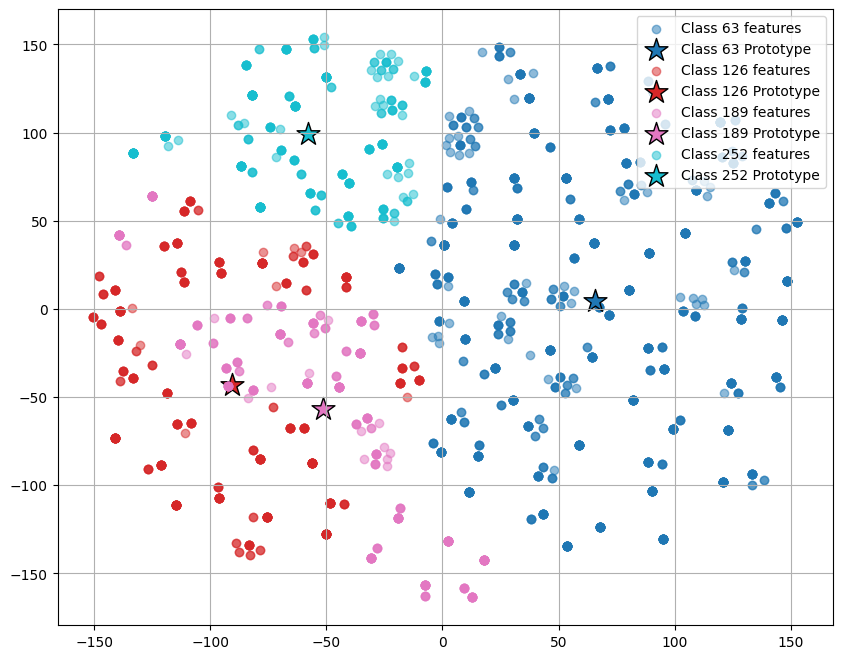

In [51]:
import os
import numpy as np
import torch
import cv2
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.manifold import TSNE

# (1) 필요한 유틸리티 함수 재정의
def load_image_and_label(image_path, label_path):
    """
    이미지를 로드하고, 해당 라벨(PNG 파일, 각 픽셀에 클래스 번호가 기록됨)을 함께 반환합니다.
    이미지: JPG, 라벨: PNG (grayscale)
    """
    image_rgb = np.array(Image.open(image_path).convert("RGB"))
    label_img = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if label_img is None:
        raise FileNotFoundError(f"Cannot read label image from {label_path}")
    return image_rgb, label_img

def resize_mask_to_match(image_shape, mask):
    """
    이미지 shape (H,W,3)와 mask (H,W)가 다르면, mask를 이미지 크기에 맞게 리사이즈합니다.
    """
    img_h, img_w = image_shape[:2]
    mask_h, mask_w = mask.shape
    if (img_h, img_w) != (mask_h, mask_w):
        resized_mask = cv2.resize(mask, (img_w, img_h), interpolation=cv2.INTER_NEAREST)
        return resized_mask
    return mask

def get_encoder_features(predictor, rgb_image):
    """
    SAM2 모델의 predictor를 이용해 encoder feature를 추출합니다.
    반환형식: {"image_embed": tensor, "high_res_feats": [...]}
    """
    predictor.set_image(rgb_image)
    feats = predictor.get_image_embedding()
    if isinstance(feats, torch.Tensor):
        # (C,H,W) -> (1,C,H,W)
        return {"image_embed": feats.unsqueeze(0), "high_res_feats": []}
    elif isinstance(feats, dict):
        return {"image_embed": feats["image_embed"], "high_res_feats": feats.get("high_res_feats", [])}
    else:
        raise ValueError(f"Unexpected feature type from get_image_embedding(): {type(feats)}")

def gather_class_embeddings(feat_map, label_2d, class_id, max_points=5000, boundary_margin=2):
    """
    주어진 feature map에서 (class_id)에 해당하는 픽셀 임베딩을 수집합니다.
    feat_map: (1, C, H, W)
    label_2d: (H,W)
    """
    if feat_map.ndim == 5:
        feat_map = feat_map.squeeze(1)
    _, C, H, W = feat_map.shape

    coords = np.where(label_2d == class_id)
    if len(coords[0]) == 0:
        return None

    # 경계 부분 배제용
    padded_label = np.pad(label_2d, pad_width=boundary_margin, mode='constant', constant_values=0)
    valid_mask = np.ones_like(label_2d, dtype=bool)
    for y, x in zip(coords[0], coords[1]):
        sub_region = padded_label[y:y+2*boundary_margin+1, x:x+2*boundary_margin+1]
        if not np.all(sub_region == class_id):
            valid_mask[y, x] = False
    coords = np.where((label_2d == class_id) & valid_mask)
    num_pixels = len(coords[0])
    if num_pixels == 0:
        return None
    if num_pixels > max_points:
        rand_idx = np.random.choice(num_pixels, max_points, replace=False)
        coords = (coords[0][rand_idx], coords[1][rand_idx])

    scale_y = H / label_2d.shape[0]
    scale_x = W / label_2d.shape[1]
    feat_map_np = feat_map[0].cpu().numpy()  # (C,H,W)

    embedding_list = []
    for y, x in zip(coords[0], coords[1]):
        hy = int(y * scale_y)
        hx = int(x * scale_x)
        if 0 <= hy < H and 0 <= hx < W:
            emb = feat_map_np[:, hy, hx]
            embedding_list.append(emb)
    if len(embedding_list) == 0:
        return None

    return np.stack(embedding_list, axis=0)

# (2) SAM2 모델 및 데이터 로드 (경로는 필요에 따라 수정)
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

device = "cuda" if torch.cuda.is_available() else "cpu"
sam2_ckpt = "../checkpoints/sam2.1_hiera_large.pt"
model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"
sam2_model = build_sam2(model_cfg, sam2_ckpt, device=device)
predictor = SAM2ImagePredictor(sam2_model)
print("[Info] SAM2 model loaded on", device)

# 이미지 및 라벨 경로 (적절히 수정)
image_path = "./videos/CHAOS_Train_Sets/Train_Sets/MR/33/T2SPIR/DICOM_anon/IMG-0034-00011.jpg"
label_path = "./videos/CHAOS_Train_Sets/Train_Sets/MR/33/T2SPIR/Ground/IMG-0034-00011.png"

# (3) 이미지, 라벨, feature map 로드
rgb_image, label_2d = load_image_and_label(image_path, label_path)
label_2d = resize_mask_to_match(rgb_image.shape, label_2d)

# ---- 추가: 클래스별 픽셀 수 출력 ----
unique_cls = np.unique(label_2d)
for cls_id in unique_cls:
    if cls_id == 0:
        continue
    coords = np.where(label_2d == cls_id)
    print(f"[Info] Class {cls_id} has {len(coords[0])} pixels in the label.")

feats_dict = get_encoder_features(predictor, rgb_image)
feature_map = feats_dict["image_embed"]  # (1, C, H, W)

# (4) 저장된 프로토타입 로드 (여기서는 클래스 목록 확인용으로만 사용)
proto_file = "w1_9_prototypes_3pairs.npz"
prototypes = np.load(proto_file)  # keys: 클래스 id (str), values: prototype vector

# (5) 각 클래스별로 feature 임베딩을 모두 모으기
features_list = []    # 각 feature의 임베딩 (N, C)
features_labels = []  # 해당 feature의 클래스 id

for cls_id_str in prototypes.files:
    cls_id = int(cls_id_str)
    emb_arr = gather_class_embeddings(feature_map, label_2d, cls_id, max_points=5000)
    if emb_arr is None:
        print(f"[Warning] No features found for class {cls_id}.")
        continue
    features_list.append(emb_arr)
    features_labels.extend([cls_id] * emb_arr.shape[0])

X_features = np.concatenate(features_list, axis=0)
features_labels = np.array(features_labels)

# (6) TSNE 임베딩 (features만 사용)
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
X_tsne_features = tsne.fit_transform(X_features)

# (7) TSNE 공간에서 각 클래스별 centroid(중심점) 계산
unique_classes = np.unique(features_labels)
centroids_tsne = {}
for cls in unique_classes:
    idx_cls = np.where(features_labels == cls)[0]
    centroids_tsne[cls] = np.mean(X_tsne_features[idx_cls], axis=0)

# (8) TSNE 결과 시각화: feature 점과 각 클래스의 centroid 표시
plt.figure(figsize=(10, 8))
cmap = plt.get_cmap("tab10", len(unique_classes))

for i, cls in enumerate(unique_classes):
    idx_cls = np.where(features_labels == cls)[0]
    plt.scatter(X_tsne_features[idx_cls, 0], X_tsne_features[idx_cls, 1],
                color=cmap(i), alpha=0.5, label=f'Class {cls} features')
    plt.scatter(centroids_tsne[cls][0], centroids_tsne[cls][1],
                color=cmap(i), marker='*', s=300, edgecolor='k',
                label=f'Class {cls} Prototype')

plt.legend()
plt.grid(True)
plt.show()


[Info] SAM2 model loaded on cuda


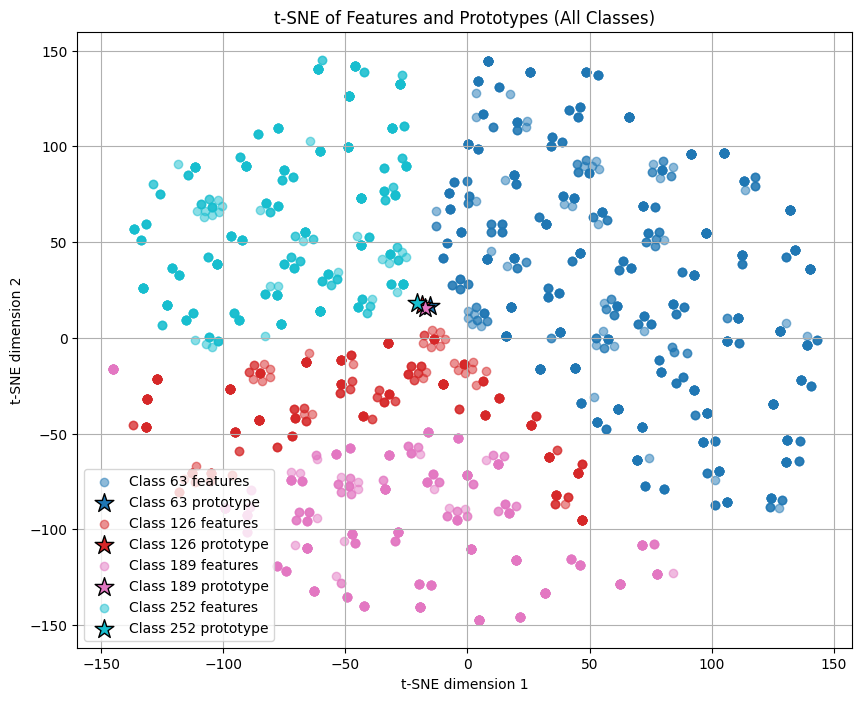

In [36]:
import os
import numpy as np
import torch
import cv2
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.manifold import TSNE

# (1) 필요한 유틸리티 함수 재정의
def load_image_and_label(image_path, label_path):
    """
    이미지를 로드하고, 해당 라벨(PNG 파일, 각 픽셀에 클래스 번호가 기록됨)을 함께 반환합니다.
    이미지: JPG, 라벨: PNG (grayscale)
    """
    image_rgb = np.array(Image.open(image_path).convert("RGB"))
    label_img = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if label_img is None:
        raise FileNotFoundError(f"Cannot read label image from {label_path}")
    return image_rgb, label_img

def resize_mask_to_match(image_shape, mask):
    """
    이미지 shape (H,W,3)와 mask (H,W)가 다르면, mask를 이미지 크기에 맞게 리사이즈합니다.
    """
    img_h, img_w = image_shape[:2]
    mask_h, mask_w = mask.shape
    if (img_h, img_w) != (mask_h, mask_w):
        resized_mask = cv2.resize(mask, (img_w, img_h), interpolation=cv2.INTER_NEAREST)
        return resized_mask
    return mask

def get_encoder_features(predictor, rgb_image):
    """
    SAM2 모델의 predictor를 이용해 encoder feature를 추출합니다.
    반환형식: {"image_embed": tensor, "high_res_feats": [...]}
    """
    predictor.set_image(rgb_image)
    feats = predictor.get_image_embedding()
    if isinstance(feats, torch.Tensor):
        # (C,H,W) -> (1,C,H,W)
        return {"image_embed": feats.unsqueeze(0), "high_res_feats": []}
    elif isinstance(feats, dict):
        return {"image_embed": feats["image_embed"], "high_res_feats": feats.get("high_res_feats", [])}
    else:
        raise ValueError(f"Unexpected feature type from get_image_embedding(): {type(feats)}")

def gather_class_embeddings(feat_map, label_2d, class_id, max_points=5000, boundary_margin=2):
    """
    주어진 feature map에서 (class_id)에 해당하는 픽셀 임베딩을 수집합니다.
    feat_map: (1, C, H, W)
    label_2d: (H,W)
    """
    if feat_map.ndim == 5:
        feat_map = feat_map.squeeze(1)
    _, C, H, W = feat_map.shape

    coords = np.where(label_2d == class_id)
    if len(coords[0]) == 0:
        return None

    # 경계 부분 배제용
    padded_label = np.pad(label_2d, pad_width=boundary_margin, mode='constant', constant_values=0)
    valid_mask = np.ones_like(label_2d, dtype=bool)
    for y, x in zip(coords[0], coords[1]):
        sub_region = padded_label[y:y+2*boundary_margin+1, x:x+2*boundary_margin+1]
        if not np.all(sub_region == class_id):
            valid_mask[y, x] = False
    coords = np.where((label_2d == class_id) & valid_mask)
    num_pixels = len(coords[0])
    if num_pixels == 0:
        return None
    if num_pixels > max_points:
        rand_idx = np.random.choice(num_pixels, max_points, replace=False)
        coords = (coords[0][rand_idx], coords[1][rand_idx])

    scale_y = H / label_2d.shape[0]
    scale_x = W / label_2d.shape[1]
    feat_map_np = feat_map[0].cpu().numpy()  # (C,H,W)

    embedding_list = []
    for y, x in zip(coords[0], coords[1]):
        hy = int(y * scale_y)
        hx = int(x * scale_x)
        if 0 <= hy < H and 0 <= hx < W:
            emb = feat_map_np[:, hy, hx]
            embedding_list.append(emb)
    if len(embedding_list) == 0:
        return None

    return np.stack(embedding_list, axis=0)

# (2) SAM2 모델 및 데이터 로드 (경로는 필요에 따라 수정)
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

device = "cuda" if torch.cuda.is_available() else "cpu"
sam2_ckpt = "../checkpoints/sam2.1_hiera_large.pt"
model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"
sam2_model = build_sam2(model_cfg, sam2_ckpt, device=device)
predictor = SAM2ImagePredictor(sam2_model)
print("[Info] SAM2 model loaded on", device)

# 이미지 및 라벨 경로 (적절히 수정)
image_path = "./videos/CHAOS_Train_Sets/Train_Sets/MR/31/T2SPIR/DICOM_anon/IMG-0026-00014.jpg"
label_path = "./videos/CHAOS_Train_Sets/Train_Sets/MR/31/T2SPIR/Ground/IMG-0026-00014.png"

# (3) 이미지, 라벨, feature map 로드
rgb_image, label_2d = load_image_and_label(image_path, label_path)
label_2d = resize_mask_to_match(rgb_image.shape, label_2d)
feats_dict = get_encoder_features(predictor, rgb_image)
feature_map = feats_dict["image_embed"]  # (1, C, H, W)

# (4) 저장된 프로토타입 로드
proto_file = "chaos_prototypes_com_local.npz"
prototypes = np.load(proto_file)  # keys: 클래스 id (str), values: prototype vector

# (5) 모든 클래스의 feature 및 프로토타입을 하나의 리스트에 저장
all_points = []       # 각 feature/prototype의 임베딩 (N, C)
all_labels = []       # 해당 feature/prototype의 클래스 id
all_is_proto = []     # 해당 점이 프로토타입이면 True, 아니면 False

for cls_id_str in prototypes.files:
    cls_id = int(cls_id_str)
    prototype = prototypes[cls_id_str]  # (C,)
    
    # 해당 클래스 feature 임베딩 샘플링 (최대 5000개로 변경)
    emb_arr = gather_class_embeddings(feature_map, label_2d, cls_id, max_points=5000)
    if emb_arr is None:
        print(f"[Warning] No features found for class {cls_id}.")
        continue

    # feature들 추가
    all_points.append(emb_arr)  # (N, C)
    all_labels.extend([cls_id] * emb_arr.shape[0])
    all_is_proto.extend([False] * emb_arr.shape[0])
    
    # 프로토타입 하나 추가
    all_points.append(prototype[None, :])  # (1, C)
    all_labels.append(cls_id)
    all_is_proto.append(True)

# 하나의 배열로 합치기
X_all = np.concatenate(all_points, axis=0)
all_labels = np.array(all_labels)
all_is_proto = np.array(all_is_proto)

# (6) t-SNE로 2차원 임베딩 수행
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
X_tsne = tsne.fit_transform(X_all)

# (7) 하나의 t-SNE 공간에 클래스별로 다른 색상으로 scatter plot
plt.figure(figsize=(10, 8))
unique_classes = np.unique(all_labels)
cmap = plt.get_cmap("tab10", len(unique_classes))
plotted_proto = set()  # 중복 범례 방지를 위한 set

for i, cls in enumerate(unique_classes):
    # 해당 클래스의 인덱스
    idx_cls = np.where(all_labels == cls)[0]
    # feature와 프로토타입 인덱스를 분리
    idx_features = idx_cls[~all_is_proto[idx_cls]]
    idx_proto = idx_cls[all_is_proto[idx_cls]]
    
    # feature 점들 그리기
    plt.scatter(X_tsne[idx_features, 0], X_tsne[idx_features, 1],
                color=cmap(i), alpha=0.5, label=f'Class {cls} features' if f'Class {cls} features' not in plotted_proto else "")
    plotted_proto.add(f'Class {cls} features')
    
    # 프로토타입 점 (별표) 그리기
    plt.scatter(X_tsne[idx_proto, 0], X_tsne[idx_proto, 1],
                color=cmap(i), marker='*', s=200, edgecolor='k',
                label=f'Class {cls} prototype' if f'Class {cls} prototype' not in plotted_proto else "")
    plotted_proto.add(f'Class {cls} prototype')

plt.title("t-SNE of Features and Prototypes (All Classes)")
plt.xlabel("t-SNE dimension 1")
plt.ylabel("t-SNE dimension 2")
plt.legend()
plt.grid(True)
plt.show()


## Test (단일 이미지, 단일 클래스)

[Debug] Prototypes shape: (4, 256) Actual Class IDs: [63, 126, 189, 252]

[Info] Evaluating for Class 63 (Memory Bank index: 0)
[Info] Evaluating for target_index: 0, semantic_label: 63
[Info] Anchor coordinate: (np.int64(60), np.int64(103))


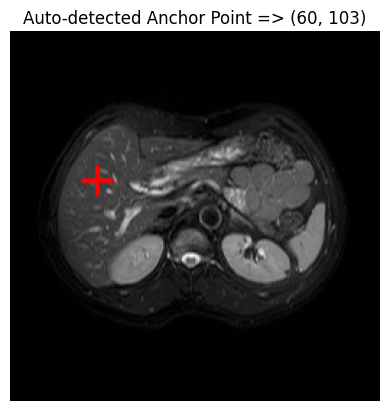

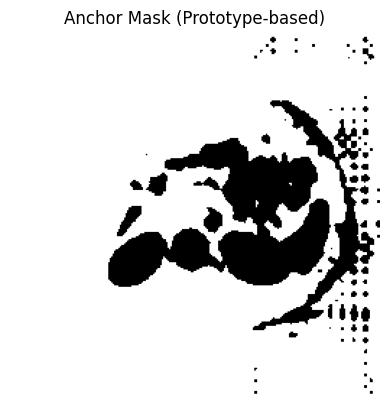

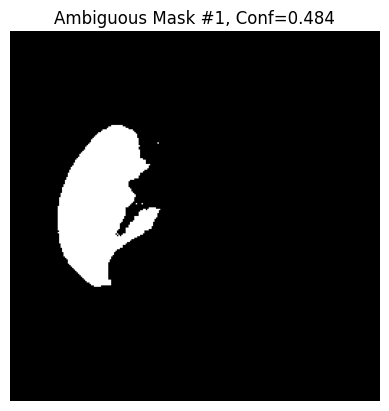

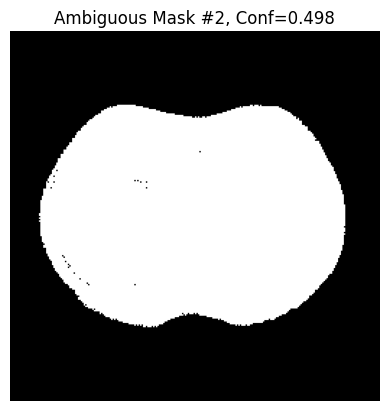

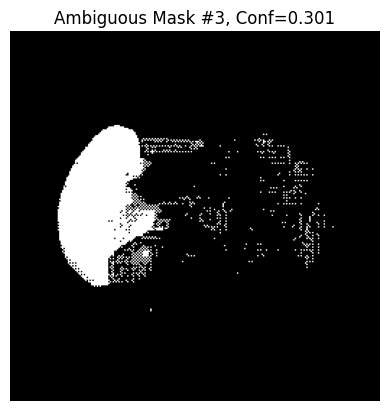

=== Ambiguous Mask Info ===
 Mask#1: Conf=0.484, Score=0.960
 Mask#2: Conf=0.498, Score=0.762
 Mask#3: Conf=0.301, Score=0.912
[Info] Best => Score=0.960
[Result] Dice Score => 0.892


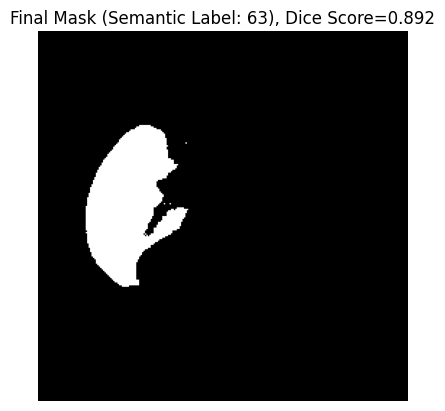


[Info] Evaluating for Class 126 (Memory Bank index: 1)
[Info] Evaluating for target_index: 1, semantic_label: 126
[Info] Anchor coordinate: (np.int64(84), np.int64(152))


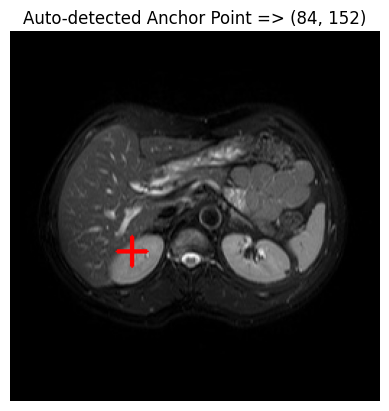

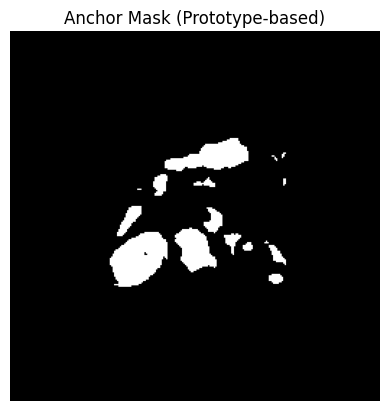

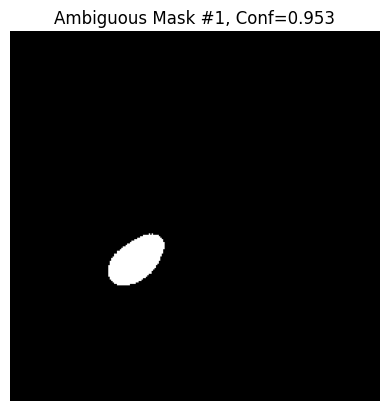

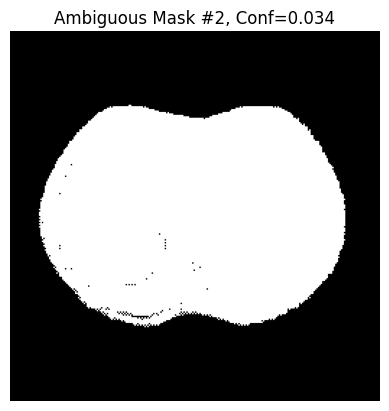

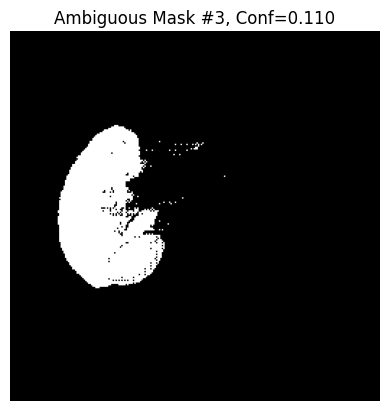

=== Ambiguous Mask Info ===
 Mask#1: Conf=0.953, Score=0.932
 Mask#2: Conf=0.034, Score=0.443
 Mask#3: Conf=0.110, Score=0.557
[Info] Best => Score=0.932
[Result] Dice Score => 0.956


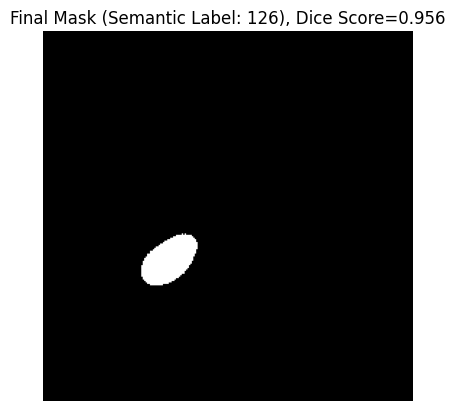


[Info] Evaluating for Class 189 (Memory Bank index: 2)
[Info] Evaluating for target_index: 2, semantic_label: 189
[Info] Anchor coordinate: (np.int64(163), np.int64(163))


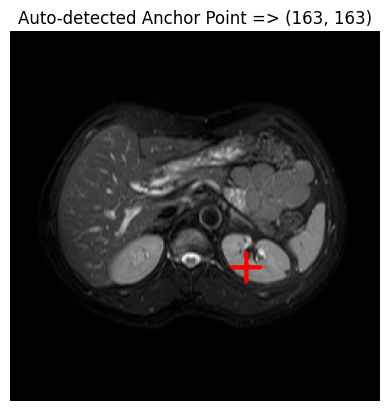

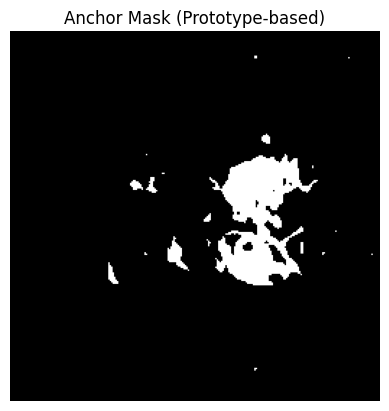

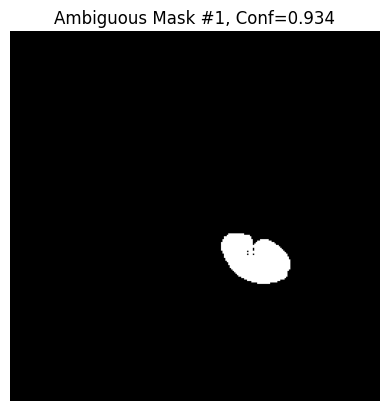

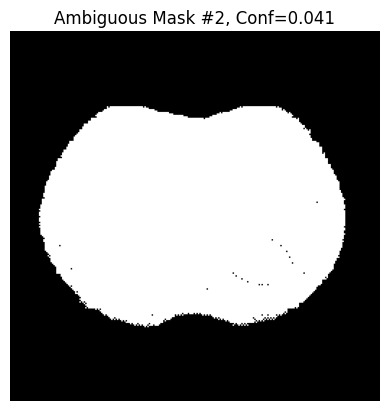

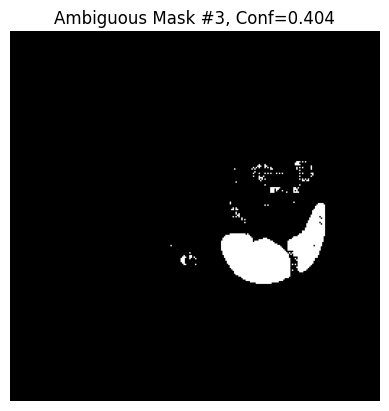

=== Ambiguous Mask Info ===
 Mask#1: Conf=0.934, Score=0.824
 Mask#2: Conf=0.041, Score=0.451
 Mask#3: Conf=0.404, Score=0.727
[Info] Best => Score=0.824
[Result] Dice Score => 0.962


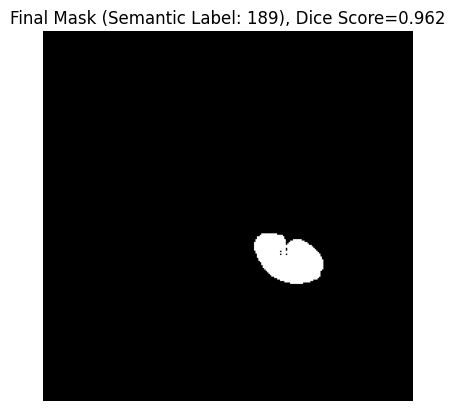


[Info] Evaluating for Class 252 (Memory Bank index: 3)
[Info] Evaluating for target_index: 3, semantic_label: 252
[Info] Anchor coordinate: (np.int64(208), np.int64(143))


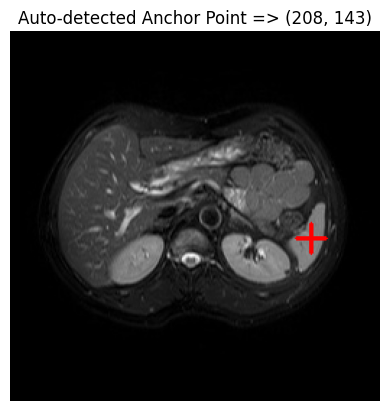

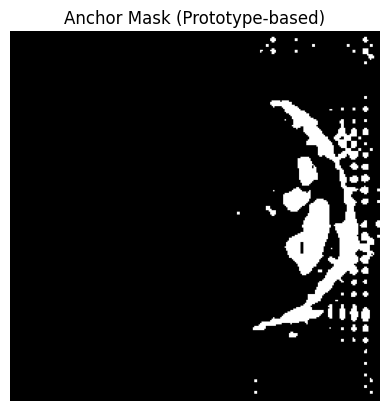

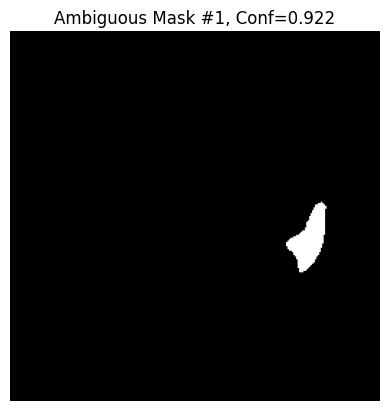

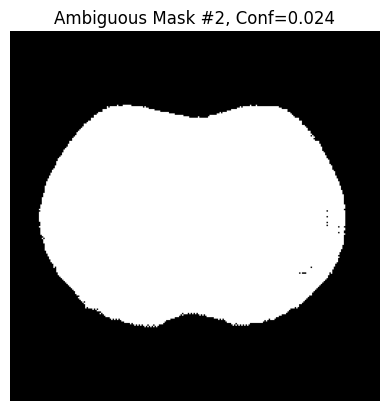

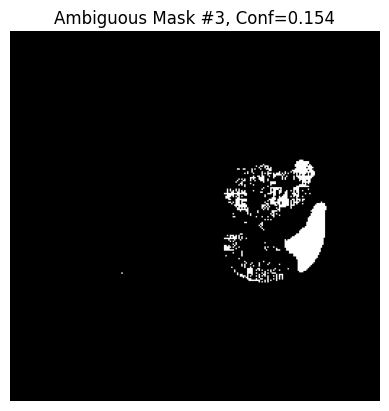

=== Ambiguous Mask Info ===
 Mask#1: Conf=0.922, Score=0.886
 Mask#2: Conf=0.024, Score=0.369
 Mask#3: Conf=0.154, Score=0.720
[Info] Best => Score=0.886
[Result] Dice Score => 0.954


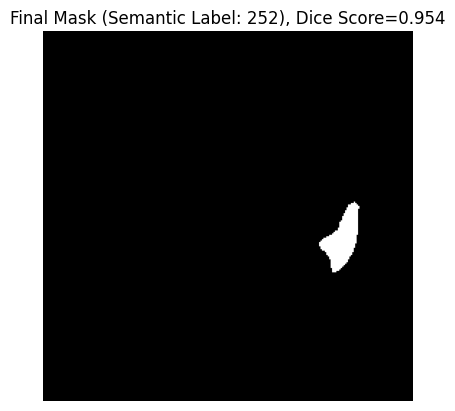


[Final Dice Scores]
 Class 63: Dice = 0.8919
 Class 126: Dice = 0.9561
 Class 189: Dice = 0.9623
 Class 252: Dice = 0.9537


In [16]:
import os
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt

########################################
# 유틸리티: 이미지 및 라벨 로드 함수
########################################
def load_image_and_label(image_path, label_path):
    """
    image_path: 입력 이미지 경로 (BGR 이미지)
    label_path: GT 마스크 경로 (Grayscale)
    
    반환:
      - rgb_image: RGB 이미지 (numpy array)
      - gt_mask: 그레이스케일 GT 마스크 (numpy array)
    """
    rgb_image = cv2.imread(image_path)
    if rgb_image is None:
        raise ValueError(f"Cannot read image from {image_path}")
    # OpenCV는 기본 BGR이므로 RGB로 변환
    rgb_image = cv2.cvtColor(rgb_image, cv2.COLOR_BGR2RGB)
    
    gt_mask = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if gt_mask is None:
        raise ValueError(f"Cannot read label from {label_path}")
    return rgb_image, gt_mask

########################################
# 0) Dice Function (평가용)
########################################
def compute_dice_score(pred_mask, gt_mask, target_label):
    """
    pred_mask, gt_mask: (H,W) 배열, 예측 및 GT에서 target_label 영역만 평가 (배경=0은 무시)
    만약 두 마스크의 크기가 다르면, gt_mask를 pred_mask 크기로 resize (최근접 보간)
    """
    if pred_mask.shape != gt_mask.shape:
        gt_mask = cv2.resize(gt_mask, (pred_mask.shape[1], pred_mask.shape[0]), interpolation=cv2.INTER_NEAREST)
    # target_label인 영역만 추출 (배경 0 무시)
    pm = (pred_mask == target_label).astype(np.uint8)
    gm = (gt_mask == target_label).astype(np.uint8)
    inter = np.sum(pm * gm)
    union = np.sum(pm) + np.sum(gm)
    if union == 0:
        return 1.0 if inter == 0 else 0.0
    dice = 2.0 * inter / union
    return dice

########################################
# 1) Prototypes 및 Class Assignment
########################################
def normalize_prototypes(prototypes, device):
    pt = torch.from_numpy(prototypes).float().to(device)
    pt = torch.nn.functional.normalize(pt, p=2, dim=-1)
    return pt

def generate_class_masks(predictor, prototypes, rgb_image):
    """
    SAM2의 image_embed를 이용하여 픽셀 단위 특징을 추출하고,
    각 프로토타입과의 코사인 유사도를 계산하여 각 클래스별 마스크를 생성합니다.
    
    반환:
      - out_masks: (N,H,W), 각 채널은 해당 프로토타입 영역 (객체=255, 배경=0)
      - class_map: 각 픽셀에 대해 가장 높은 유사도를 가진 프로토타입 인덱스
      - sim: (N,H,W) 유사도 맵
    """
    predictor.reset_predictor()
    predictor.set_image(rgb_image)
    proto_t = normalize_prototypes(prototypes, device=predictor.device)
    feats = predictor._features["image_embed"]  # (1,C,H,W)
    feats_up = torch.nn.functional.interpolate(
        feats, size=(rgb_image.shape[0], rgb_image.shape[1]),
        mode='bilinear', align_corners=False
    )[0]  # (C,H,W)
    feats_norm = torch.nn.functional.normalize(feats_up, p=2, dim=0)
    sim = torch.einsum('nc,chw->nhw', proto_t, feats_norm)  # (N,H,W)
    class_map = torch.argmax(sim, dim=0).cpu().numpy()
    num_classes = proto_t.shape[0]
    H, W = class_map.shape
    out_masks = np.zeros((num_classes, H, W), dtype=np.uint8)
    for c in range(num_classes):
        out_masks[c] = (class_map == c).astype(np.uint8) * 255
    return out_masks, class_map, sim

########################################
# 2) 개선된 앵커 좌표 결정: 유사도 기반 선택
########################################
def compute_anchor_coordinate_similarity_only(anchor_mask, sim_map):
    """
    유사도 맵(sim_map)에서, anchor_mask 영역 중 가장 높은 값을 가지는 픽셀을
    앵커 좌표로 선택합니다.
    """
    sim_region = sim_map.copy()
    sim_region[anchor_mask == 0] = 0
    idx = np.argmax(sim_region)
    H, W = sim_map.shape
    cy, cx = np.unravel_index(idx, (H, W))
    return (cx, cy)

########################################
# 3) Compute Custom Score (Global Prototype 기반 평가)
########################################
def compute_custom_score(mask_bin, prototypes, predictor, target_index, class_mask, alpha=0.5):
    """
    score = alpha * similarity + (1 - alpha) * coverage
      - coverage: ambiguous mask와 prototype 기반 class_mask의 중첩 비율
      - similarity: ambiguous mask 내부 임베딩의 평균과 target prototype의 코사인 유사도
      
    target_index: 0-based 인덱스로, prototypes[target_index]를 대상 프로토타입으로 사용
    """
    if mask_bin.shape != class_mask.shape:
        cm_ = cv2.resize(class_mask, (mask_bin.shape[1], mask_bin.shape[0]), interpolation=cv2.INTER_NEAREST)
    else:
        cm_ = class_mask
    mask_reg = (mask_bin > 0)
    class_reg = (cm_ > 0)
    area_mask = float(mask_reg.sum())
    if area_mask < 1:
        coverage = 0.0
    else:
        overlap = float(np.sum(mask_reg & class_reg))
        coverage = overlap / area_mask

    feats = predictor.get_image_embedding()
    if isinstance(feats, dict):
        feats = feats["image_embed"]  # (1,C,H,W)
    if feats.ndim == 4:
        feats = feats[0]  # (C,H,W)
    base = feats.cpu().numpy()
    C_feat, H_feat, W_feat = base.shape
    if mask_bin.shape != (H_feat, W_feat):
        mask_rs = cv2.resize(mask_bin, (W_feat, H_feat), interpolation=cv2.INTER_NEAREST)
    else:
        mask_rs = mask_bin
    region = (mask_rs > 0)
    if region.sum() < 1:
        emb_mean = np.zeros((C_feat,), dtype=np.float32)
    else:
        pix = base[:, region]
        emb_mean = pix.mean(axis=1)
    device = predictor.device
    emb_mean_t = torch.tensor(emb_mean, dtype=torch.float32, device=device)
    if isinstance(prototypes, np.ndarray):
        prototypes_t = torch.tensor(prototypes, dtype=torch.float32, device=device)
    else:
        prototypes_t = prototypes
    proto_vec = prototypes_t[target_index]
    normA = emb_mean_t / (emb_mean_t.norm() + 1e-6)
    normB = proto_vec / (proto_vec.norm() + 1e-6)
    similarity = float((normA * normB).sum().detach().cpu())
    score = alpha * similarity + (1 - alpha) * coverage
    return score

########################################
# 4) Improved Final Mask Selection: 임계값 없이 최고 score 선택
########################################
def select_final_mask_by_maxscore(ambiguous_masks, confidences, prototypes, predictor, target_index, class_mask, alpha=0.5):
    """
    각 ambiguous mask에 대해 custom score를 계산한 후, 가장 높은 score를 가진 mask를 반환합니다.
    
    target_index: 0-based 인덱스로, 해당 프로토타입을 대상 클래스로 사용
    """
    best_score = -1e9
    best_mask = None
    info_list = []
    for i, amb_mask in enumerate(ambiguous_masks):
        sc = compute_custom_score(amb_mask, prototypes, predictor, target_index, class_mask, alpha=alpha)
        info = {"mask_idx": i, "score": sc, "confidence": confidences[i]}
        info_list.append(info)
        if sc > best_score:
            best_score = sc
            best_mask = amb_mask
    print("=== Ambiguous Mask Info ===")
    for e in info_list:
        print(f" Mask#{e['mask_idx']+1}: Conf={e['confidence']:.3f}, Score={e['score']:.3f}")
    print("================================")
    print(f"[Info] Best => Score={best_score:.3f}")
    return best_mask, info_list

########################################
# 5) Main Processing Function (테스트용)
########################################
def process_image_and_evaluate(predictor, prototypes, rgb_image, gt_mask,
                               target_index, semantic_label, alpha=0.5, threshold=0.3,
                               w_dist=0.5, w_sim=0.5):
    """
    평가 함수  
      - target_index: 0-based 인덱스 (예, prototypes[target_index]가 대상 프로토타입)
      - semantic_label: 최종 예측 마스크에 부여할 실제 semantic label (예, 63, 126, …)
    
    동작 순서:
      1) Prototype 기반 Class Mask 생성  
      2) 대상 클래스의 유사도 맵을 추출하여, 유사도 기반 앵커 좌표 결정  
      3) 해당 앵커 좌표를 prompt로 ambiguous mask 후보 예측  
      4) 각 ambiguous mask에 대해 custom score를 계산하여 최고 score mask 선택  
      5) 최종 mask (binary → semantic label mask 변환)와 GT mask 간 Dice score 계산 (배경 무시)
    """
    print(f"[Info] Evaluating for target_index: {target_index}, semantic_label: {semantic_label}")

    # (0) Prototype 기반 Class Mask 생성
    masks, class_map, sim = generate_class_masks(predictor, prototypes, rgb_image)
    target_mask = masks[target_index]
    
    # (1) 대상 클래스 유사도 맵 추출
    target_sim_map = sim[target_index].float().cpu().numpy()
    
    # (2) 유사도 기반 앵커 좌표 결정
    anchor = compute_anchor_coordinate_similarity_only(target_mask, target_sim_map)
    if anchor is None:
        print("[Warn] Anchor coordinate not found, using fallback (zeros)")
        final_mask = np.zeros_like(target_mask)
        dice_val = compute_dice_score(final_mask, gt_mask, target_label=semantic_label)
        return final_mask, dice_val
    print(f"[Info] Anchor coordinate: {anchor}")
    
    # (3) 앵커 좌표 시각화
    anchor_img = rgb_image.copy()
    cv2.drawMarker(anchor_img, (anchor[0], anchor[1]), (255, 0, 0), markerType=cv2.MARKER_CROSS, thickness=2)
    plt.figure()
    plt.imshow(anchor_img)
    plt.title(f"Auto-detected Anchor Point => ({anchor[0]}, {anchor[1]})")
    plt.axis("off")
    plt.show()
    
    # (4) 앵커 마스크 시각화
    plt.figure()
    plt.imshow(target_mask, cmap="gray")
    plt.title("Anchor Mask (Prototype-based)")
    plt.axis("off")
    plt.show()
    
    # (5) ambiguous mask 예측
    point_coords = np.array([[anchor[0], anchor[1]]])
    point_labels = np.array([1])
    ambiguous_masks, confidences, _ = predictor.predict(
        point_coords=point_coords,
        point_labels=point_labels,
        multimask_output=True
    )
    for i, (am, conf) in enumerate(zip(ambiguous_masks, confidences)):
        plt.figure()
        plt.imshow(am, cmap="gray")
        plt.title(f"Ambiguous Mask #{i+1}, Conf={conf:.3f}")
        plt.axis("off")
        plt.show()
    
    # (6) 최종 마스크 선택: 임계값 없이 최고 custom score 선택
    final_mask, info_list = select_final_mask_by_maxscore(ambiguous_masks, confidences,
                                                          prototypes, predictor,
                                                          target_index, class_mask=target_mask,
                                                          alpha=alpha)
    if final_mask is None:
        print("[Warn] Final mask not selected, using empty mask")
        final_mask = np.zeros_like(target_mask)
    
    # (7) 최종 마스크를 binary (0/255)에서 semantic label mask로 변환 (객체 영역은 semantic_label, 배경은 0)
    final_mask = (final_mask > 0).astype(np.uint8) * semantic_label

    # (8) Dice Score 계산 (배경 무시, target label만 평가)
    dice_val = compute_dice_score(final_mask, gt_mask, target_label=semantic_label)
    print(f"[Result] Dice Score => {dice_val:.3f}")
    plt.figure()
    plt.imshow(final_mask, cmap="gray")
    plt.title(f"Final Mask (Semantic Label: {semantic_label}), Dice Score={dice_val:.3f}")
    plt.axis("off")
    plt.show()
    
    return final_mask, dice_val

########################################
# 6) Main (테스트 실행 코드)
########################################
if __name__ == "__main__":
    from sam2.build_sam import build_sam2
    from sam2.sam2_image_predictor import SAM2ImagePredictor

    device = "cuda" if torch.cuda.is_available() else "cpu"
    ckpt = "../checkpoints/sam2.1_hiera_large.pt"
    cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"
    sam2_model = build_sam2(cfg, ckpt, device=device)
    predictor = SAM2ImagePredictor(sam2_model)

    # Memory Bank로부터 prototype 불러오기  
    # 예: 실제 클래스 번호가 [63, 126, 189, 252]라면, Memory Bank 순서는 0~3
    mem_bank = np.load("multi_image_prototypes_3pairs.npz")
    sorted_keys = sorted(mem_bank.files, key=lambda x: int(x))
    prototypes = np.stack([mem_bank[k] for k in sorted_keys], axis=0)
    # 실제 semantic label 값 (예, 63, 126, 189, 252)
    actual_class_ids = [int(k) for k in sorted_keys]
    print("[Debug] Prototypes shape:", prototypes.shape, "Actual Class IDs:", actual_class_ids)

    # 테스트 이미지 및 GT 마스크 로드
    img_path = "./videos/CHAOS_Train_Sets/Train_Sets/MR/1/T2SPIR/DICOM_anon/IMG-0002-00024.jpg"
    label_path = "./videos/CHAOS_Train_Sets/Train_Sets/MR/1/T2SPIR/Ground/IMG-0002-00024.png"
    rgb_image, gt_mask = load_image_and_label(img_path, label_path)

    # 각 클래스에 대해 Dice Score 계산 (배경 무시)
    dice_scores = {}
    for i, actual_cls in enumerate(actual_class_ids):
        print(f"\n[Info] Evaluating for Class {actual_cls} (Memory Bank index: {i})")
        # target_index: 0-based 인덱스, semantic_label: 실제 클래스 label (예, 63 등)
        final_mask, dice_val = process_image_and_evaluate(predictor, prototypes, rgb_image, gt_mask,
                                                          target_index=i, semantic_label=actual_cls,
                                                          alpha=0.6, threshold=0.3)
        dice_scores[actual_cls] = dice_val

    print("\n[Final Dice Scores]")
    for cls, d in dice_scores.items():
        print(f" Class {cls}: Dice = {d:.4f}")


In [ ]:
import os
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt

########################################
# 유틸리티: 이미지 및 라벨 로드 함수
########################################
def load_image_and_label(image_path, label_path):
    """
    image_path: 입력 이미지 경로 (BGR 이미지)
    label_path: GT 마스크 경로 (Grayscale)
    
    반환:
      - rgb_image: RGB 이미지 (numpy array)
      - gt_mask: 그레이스케일 GT 마스크 (numpy array)
    """
    rgb_image = cv2.imread(image_path)
    if rgb_image is None:
        raise ValueError(f"Cannot read image from {image_path}")
    # OpenCV는 기본 BGR이므로 RGB로 변환
    rgb_image = cv2.cvtColor(rgb_image, cv2.COLOR_BGR2RGB)
    
    gt_mask = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if gt_mask is None:
        raise ValueError(f"Cannot read label from {label_path}")
    return rgb_image, gt_mask

########################################
# 0) Dice Function (평가용)
########################################
def compute_dice_score(pred_mask, gt_mask, target_label):
    """
    pred_mask, gt_mask: (H,W) 배열, 예측 및 GT에서 target_label 영역만 평가 (배경=0은 무시)
    만약 두 마스크의 크기가 다르면, gt_mask를 pred_mask 크기로 resize (최근접 보간)
    """
    if pred_mask.shape != gt_mask.shape:
        gt_mask = cv2.resize(gt_mask, (pred_mask.shape[1], pred_mask.shape[0]), interpolation=cv2.INTER_NEAREST)
    # target_label인 영역만 추출 (배경 0 무시)
    pm = (pred_mask == target_label).astype(np.uint8)
    gm = (gt_mask == target_label).astype(np.uint8)
    inter = np.sum(pm * gm)
    union = np.sum(pm) + np.sum(gm)
    if union == 0:
        return 1.0 if inter == 0 else 0.0
    dice = 2.0 * inter / union
    return dice

########################################
# 1) Prototypes 및 Class Assignment
########################################
def normalize_prototypes(prototypes, device):
    pt = torch.from_numpy(prototypes).float().to(device)
    pt = torch.nn.functional.normalize(pt, p=2, dim=-1)
    return pt

def generate_class_masks(predictor, prototypes, rgb_image):
    """
    SAM2의 image_embed를 이용하여 픽셀 단위 특징을 추출하고,
    각 프로토타입과의 코사인 유사도를 계산하여 각 클래스별 마스크를 생성합니다.
    
    반환:
      - out_masks: (N,H,W), 각 채널은 해당 프로토타입 영역 (객체=255, 배경=0)
      - class_map: 각 픽셀에 대해 가장 높은 유사도를 가진 프로토타입 인덱스
      - sim: (N,H,W) 유사도 맵
    """
    predictor.reset_predictor()
    predictor.set_image(rgb_image)
    proto_t = normalize_prototypes(prototypes, device=predictor.device)
    feats = predictor._features["image_embed"]  # (1,C,H,W)
    feats_up = torch.nn.functional.interpolate(
        feats, size=(rgb_image.shape[0], rgb_image.shape[1]),
        mode='bilinear', align_corners=False
    )[0]  # (C,H,W)
    feats_norm = torch.nn.functional.normalize(feats_up, p=2, dim=0)
    sim = torch.einsum('nc,chw->nhw', proto_t, feats_norm)  # (N,H,W)
    class_map = torch.argmax(sim, dim=0).cpu().numpy()
    num_classes = proto_t.shape[0]
    H, W = class_map.shape
    out_masks = np.zeros((num_classes, H, W), dtype=np.uint8)
    for c in range(num_classes):
        out_masks[c] = (class_map == c).astype(np.uint8) * 255
    return out_masks, class_map, sim

########################################
# 2) 개선된 앵커 좌표 결정: 유사도 기반 선택
########################################
def compute_anchor_coordinate_similarity_only(anchor_mask, sim_map):
    """
    유사도 맵(sim_map)에서, anchor_mask 영역 중 가장 높은 값을 가지는 픽셀을
    앵커 좌표로 선택합니다.
    """
    sim_region = sim_map.copy()
    sim_region[anchor_mask == 0] = 0
    idx = np.argmax(sim_region)
    H, W = sim_map.shape
    cy, cx = np.unravel_index(idx, (H, W))
    return (cx, cy)

########################################
# 3) Compute Custom Score (Global Prototype 기반 평가)
########################################
def compute_custom_score(mask_bin, prototypes, predictor, target_index, class_mask, alpha=0.5):
    """
    score = alpha * similarity + (1 - alpha) * coverage
      - coverage: ambiguous mask와 prototype 기반 class_mask의 중첩 비율
      - similarity: ambiguous mask 내부 임베딩의 평균과 target prototype의 코사인 유사도
      
    target_index: 0-based 인덱스로, prototypes[target_index]를 대상 프로토타입으로 사용
    """
    if mask_bin.shape != class_mask.shape:
        cm_ = cv2.resize(class_mask, (mask_bin.shape[1], mask_bin.shape[0]), interpolation=cv2.INTER_NEAREST)
    else:
        cm_ = class_mask
    mask_reg = (mask_bin > 0)
    class_reg = (cm_ > 0)
    area_mask = float(mask_reg.sum())
    if area_mask < 1:
        coverage = 0.0
    else:
        overlap = float(np.sum(mask_reg & class_reg))
        coverage = overlap / area_mask

    feats = predictor.get_image_embedding()
    if isinstance(feats, dict):
        feats = feats["image_embed"]  # (1,C,H,W)
    if feats.ndim == 4:
        feats = feats[0]  # (C,H,W)
    base = feats.cpu().numpy()
    C_feat, H_feat, W_feat = base.shape
    if mask_bin.shape != (H_feat, W_feat):
        mask_rs = cv2.resize(mask_bin, (W_feat, H_feat), interpolation=cv2.INTER_NEAREST)
    else:
        mask_rs = mask_bin
    region = (mask_rs > 0)
    if region.sum() < 1:
        emb_mean = np.zeros((C_feat,), dtype=np.float32)
    else:
        pix = base[:, region]
        emb_mean = pix.mean(axis=1)
    device = predictor.device
    emb_mean_t = torch.tensor(emb_mean, dtype=torch.float32, device=device)
    if isinstance(prototypes, np.ndarray):
        prototypes_t = torch.tensor(prototypes, dtype=torch.float32, device=device)
    else:
        prototypes_t = prototypes
    proto_vec = prototypes_t[target_index]
    normA = emb_mean_t / (emb_mean_t.norm() + 1e-6)
    normB = proto_vec / (proto_vec.norm() + 1e-6)
    similarity = float((normA * normB).sum().detach().cpu())
    score = alpha * similarity + (1 - alpha) * coverage
    return score

########################################
# 4) Improved Final Mask Selection: 임계값 없이 최고 score 선택
########################################
def select_final_mask_by_maxscore(ambiguous_masks, confidences, prototypes, predictor, target_index, class_mask, alpha=0.5):
    """
    각 ambiguous mask에 대해 custom score를 계산한 후, 가장 높은 score를 가진 mask를 반환합니다.
    
    target_index: 0-based 인덱스로, 해당 프로토타입을 대상 클래스로 사용
    """
    best_score = -1e9
    best_mask = None
    info_list = []
    for i, amb_mask in enumerate(ambiguous_masks):
        sc = compute_custom_score(amb_mask, prototypes, predictor, target_index, class_mask, alpha=alpha)
        info = {"mask_idx": i, "score": sc, "confidence": confidences[i]}
        info_list.append(info)
        if sc > best_score:
            best_score = sc
            best_mask = amb_mask
    print("=== Ambiguous Mask Info ===")
    for e in info_list:
        print(f" Mask#{e['mask_idx']+1}: Conf={e['confidence']:.3f}, Score={e['score']:.3f}")
    print("================================")
    print(f"[Info] Best => Score={best_score:.3f}")
    return best_mask, info_list

########################################
# 5) Main Processing Function (테스트용)
########################################
def process_image_and_evaluate(predictor, prototypes, rgb_image, gt_mask,
                               target_index, semantic_label, alpha=0.5, threshold=0.3,
                               w_dist=0.5, w_sim=0.5):
    """
    평가 함수  
      - target_index: 0-based 인덱스 (예, prototypes[target_index]가 대상 프로토타입)
      - semantic_label: 최종 예측 마스크에 부여할 실제 semantic label (예, 63, 126, …)
    
    동작 순서:
      1) Prototype 기반 Class Mask 생성  
      2) 대상 클래스의 유사도 맵을 추출하여, 유사도 기반 앵커 좌표 결정  
      3) 해당 앵커 좌표를 prompt로 ambiguous mask 후보 예측  
      4) 각 ambiguous mask에 대해 custom score를 계산하여 최고 score mask 선택  
      5) 최종 mask (binary → semantic label mask 변환)와 GT mask 간 Dice score 계산 (배경 무시)
    """
    print(f"[Info] Evaluating for target_index: {target_index}, semantic_label: {semantic_label}")

    # (0) Prototype 기반 Class Mask 생성
    masks, class_map, sim = generate_class_masks(predictor, prototypes, rgb_image)
    target_mask = masks[target_index]
    
    # (1) 대상 클래스 유사도 맵 추출
    target_sim_map = sim[target_index].float().cpu().numpy()
    
    # (2) 유사도 기반 앵커 좌표 결정
    anchor = compute_anchor_coordinate_similarity_only(target_mask, target_sim_map)
    if anchor is None:
        print("[Warn] Anchor coordinate not found, using fallback (zeros)")
        final_mask = np.zeros_like(target_mask)
        dice_val = compute_dice_score(final_mask, gt_mask, target_label=semantic_label)
        return final_mask, dice_val
    print(f"[Info] Anchor coordinate: {anchor}")
    
    # (3) 앵커 좌표 시각화
    anchor_img = rgb_image.copy()
    cv2.drawMarker(anchor_img, (anchor[0], anchor[1]), (255, 0, 0), markerType=cv2.MARKER_CROSS, thickness=2)
    plt.figure()
    plt.imshow(anchor_img)
    plt.title(f"Auto-detected Anchor Point => ({anchor[0]}, {anchor[1]})")
    plt.axis("off")
    plt.show()
    
    # (4) 앵커 마스크 시각화
    plt.figure()
    plt.imshow(target_mask, cmap="gray")
    plt.title("Anchor Mask (Prototype-based)")
    plt.axis("off")
    plt.show()
    
    # (5) ambiguous mask 예측
    point_coords = np.array([[anchor[0], anchor[1]]])
    point_labels = np.array([1])
    ambiguous_masks, confidences, _ = predictor.predict(
        point_coords=point_coords,
        point_labels=point_labels,
        multimask_output=True
    )
    for i, (am, conf) in enumerate(zip(ambiguous_masks, confidences)):
        plt.figure()
        plt.imshow(am, cmap="gray")
        plt.title(f"Ambiguous Mask #{i+1}, Conf={conf:.3f}")
        plt.axis("off")
        plt.show()
    
    # (6) 최종 마스크 선택: 임계값 없이 최고 custom score 선택
    final_mask, info_list = select_final_mask_by_maxscore(ambiguous_masks, confidences,
                                                          prototypes, predictor,
                                                          target_index, class_mask=target_mask,
                                                          alpha=alpha)
    if final_mask is None:
        print("[Warn] Final mask not selected, using empty mask")
        final_mask = np.zeros_like(target_mask)
    
    # (7) 최종 마스크를 binary (0/255)에서 semantic label mask로 변환 (객체 영역은 semantic_label, 배경은 0)
    final_mask = (final_mask > 0).astype(np.uint8) * semantic_label

    # (8) Dice Score 계산 (배경 무시, target label만 평가)
    dice_val = compute_dice_score(final_mask, gt_mask, target_label=semantic_label)
    print(f"[Result] Dice Score => {dice_val:.3f}")
    plt.figure()
    plt.imshow(final_mask, cmap="gray")
    plt.title(f"Final Mask (Semantic Label: {semantic_label}), Dice Score={dice_val:.3f}")
    plt.axis("off")
    plt.show()
    
    return final_mask, dice_val

########################################
# 6) Main (테스트 실행 코드)
########################################
if __name__ == "__main__":
    from sam2.build_sam import build_sam2
    from sam2.sam2_image_predictor import SAM2ImagePredictor

    device = "cuda" if torch.cuda.is_available() else "cpu"
    ckpt = "../checkpoints/sam2.1_hiera_large.pt"
    cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"
    sam2_model = build_sam2(cfg, ckpt, device=device)
    predictor = SAM2ImagePredictor(sam2_model)

    # Memory Bank로부터 prototype 불러오기  
    # 예: 실제 클래스 번호가 [63, 126, 189, 252]라면, Memory Bank 순서는 0~3
    mem_bank = np.load("synapse_prototypes.npz")
    sorted_keys = sorted(mem_bank.files, key=lambda x: int(x))
    prototypes = np.stack([mem_bank[k] for k in sorted_keys], axis=0)
    # 실제 semantic label 값 (예, 63, 126, 189, 252)
    actual_class_ids = [int(k) for k in sorted_keys]
    print("[Debug] Prototypes shape:", prototypes.shape, "Actual Class IDs:", actual_class_ids)

    # 테스트 이미지 및 GT 마스크 로드
    img_path = "./videos/CHAOS_Train_Sets/Train_Sets/MR/1/T2SPIR/DICOM_anon/IMG-0002-00024.jpg"
    label_path = "./videos/CHAOS_Train_Sets/Train_Sets/MR/1/T2SPIR/Ground/IMG-0002-00024.png"
    rgb_image, gt_mask = load_image_and_label(img_path, label_path)

    # 각 클래스에 대해 Dice Score 계산 (배경 무시)
    dice_scores = {}
    for i, actual_cls in enumerate(actual_class_ids):
        print(f"\n[Info] Evaluating for Class {actual_cls} (Memory Bank index: {i})")
        # target_index: 0-based 인덱스, semantic_label: 실제 클래스 label (예, 63 등)
        final_mask, dice_val = process_image_and_evaluate(predictor, prototypes, rgb_image, gt_mask,
                                                          target_index=i, semantic_label=actual_cls,
                                                          alpha=0.6, threshold=0.3)
        dice_scores[actual_cls] = dice_val

    print("\n[Final Dice Scores]")
    for cls, d in dice_scores.items():
        print(f" Class {cls}: Dice = {d:.4f}")


### 휴리스틱 좌표에 대한 segmentation 수행

[Debug] Prototypes shape: (4, 256) Actual Class IDs: [63, 126, 189, 252]

[Info] Evaluating for Class 63, using manual coords=(70, 120)
[Info] Evaluating for target_index=0, semantic_label=63


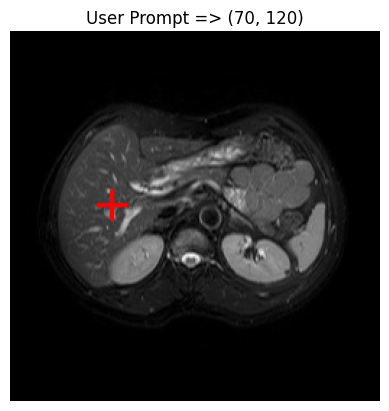

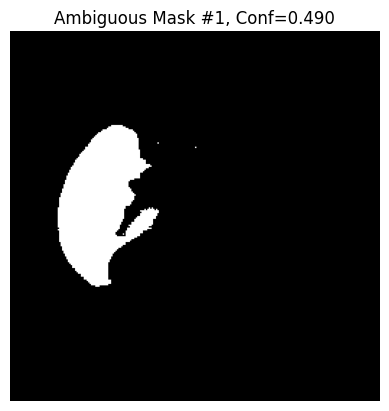

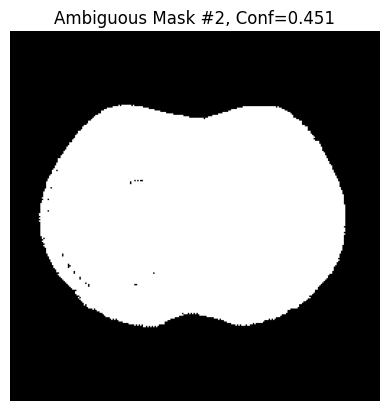

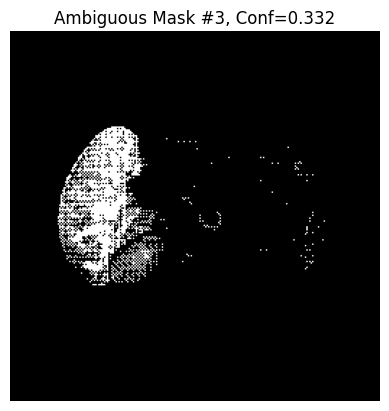

=== Ambiguous Mask Info ===
 Mask#1: Conf=0.490, Score=0.962
 Mask#2: Conf=0.451, Score=0.762
 Mask#3: Conf=0.332, Score=0.905
[Info] Best => Score=0.962
[Result] Dice Score => 0.888


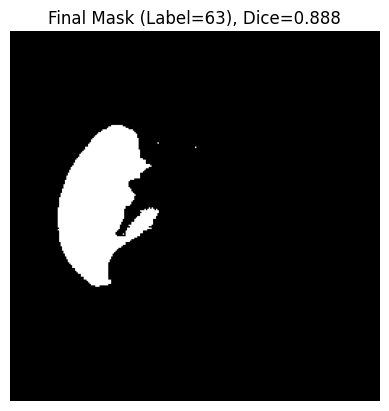


[Info] Evaluating for Class 126, using manual coords=(85, 155)
[Info] Evaluating for target_index=1, semantic_label=126


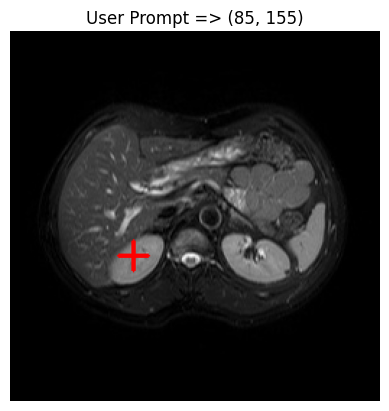

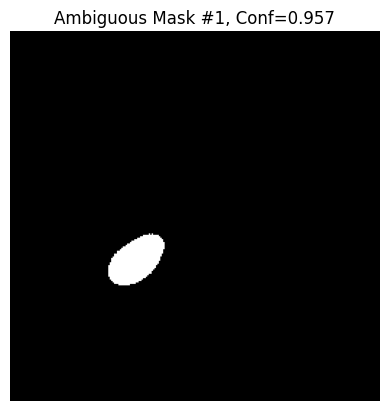

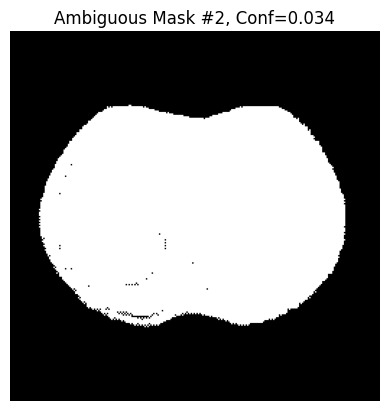

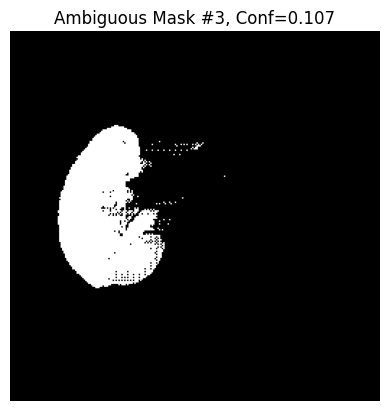

=== Ambiguous Mask Info ===
 Mask#1: Conf=0.957, Score=0.932
 Mask#2: Conf=0.034, Score=0.443
 Mask#3: Conf=0.107, Score=0.555
[Info] Best => Score=0.932
[Result] Dice Score => 0.957


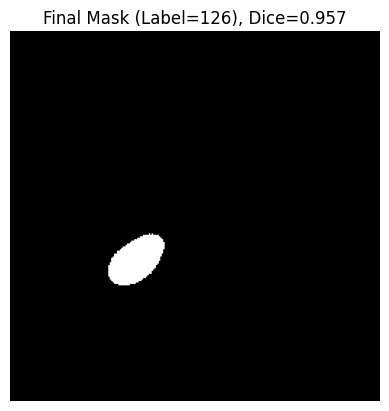


[Info] Evaluating for Class 189, using manual coords=(165, 163)
[Info] Evaluating for target_index=2, semantic_label=189


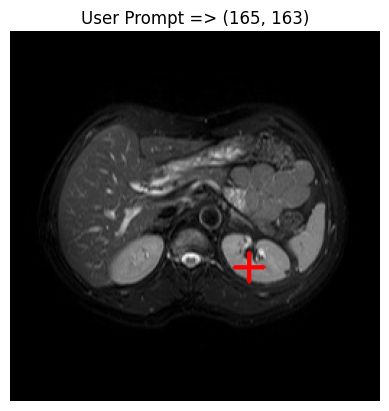

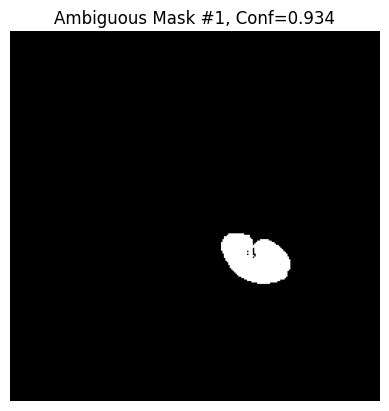

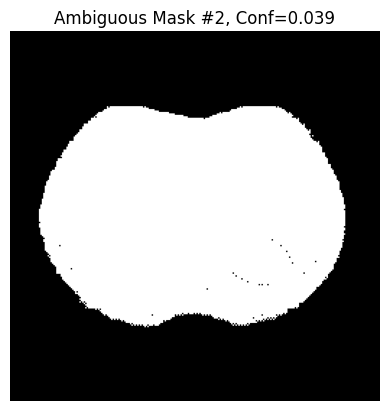

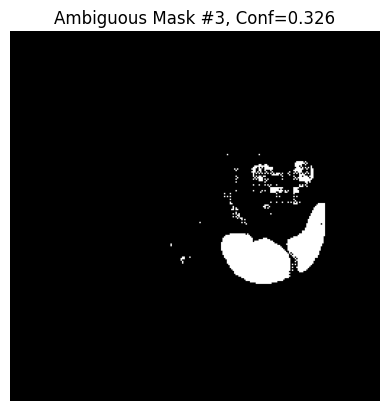

=== Ambiguous Mask Info ===
 Mask#1: Conf=0.934, Score=0.822
 Mask#2: Conf=0.039, Score=0.450
 Mask#3: Conf=0.326, Score=0.730
[Info] Best => Score=0.822
[Result] Dice Score => 0.960


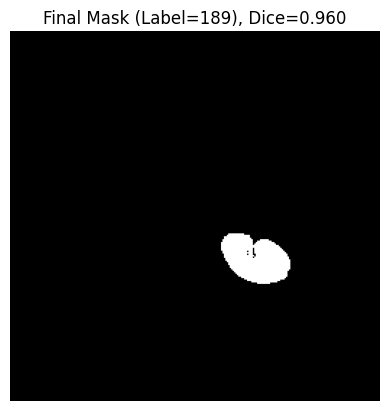


[Info] Evaluating for Class 252, using manual coords=(200, 145)
[Info] Evaluating for target_index=3, semantic_label=252


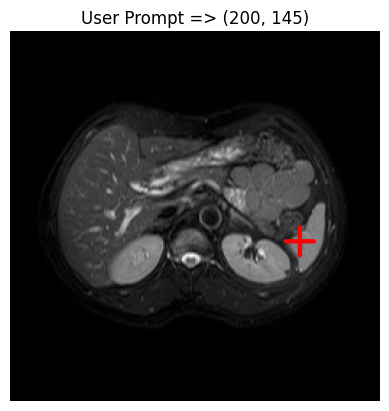

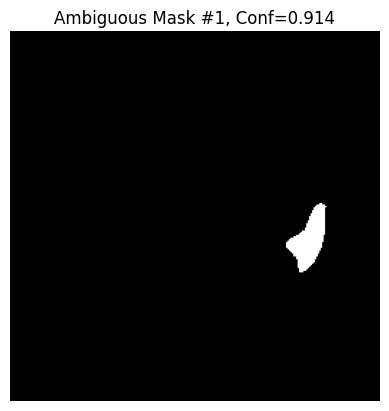

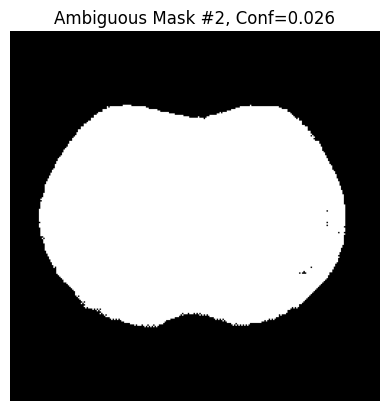

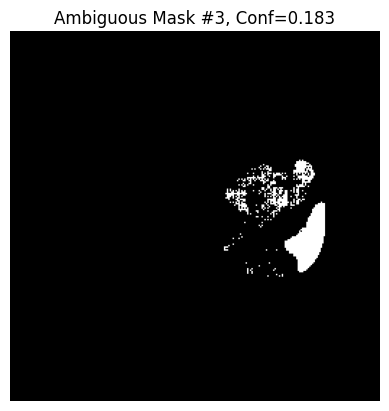

=== Ambiguous Mask Info ===
 Mask#1: Conf=0.914, Score=0.886
 Mask#2: Conf=0.026, Score=0.369
 Mask#3: Conf=0.183, Score=0.751
[Info] Best => Score=0.886
[Result] Dice Score => 0.954


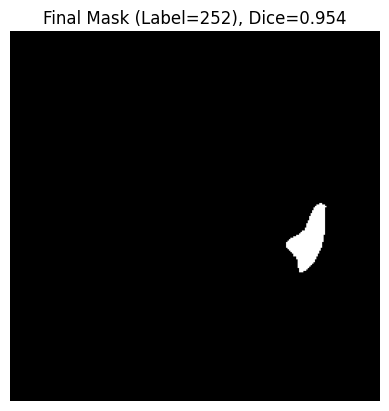


[Final Dice Scores]
 Class 63: Dice = 0.8878
 Class 126: Dice = 0.9572
 Class 189: Dice = 0.9605
 Class 252: Dice = 0.9543


In [24]:
import os
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt

########################################
# 유틸리티: 이미지 및 라벨 로드 함수
########################################
def load_image_and_label(image_path, label_path):
    """
    image_path: 입력 이미지 경로 (BGR 이미지)
    label_path: GT 마스크 경로 (Grayscale)
    
    반환:
      - rgb_image: RGB 이미지 (numpy array)
      - gt_mask: 그레이스케일 GT 마스크 (numpy array)
    """
    rgb_image = cv2.imread(image_path)
    if rgb_image is None:
        raise ValueError(f"Cannot read image from {image_path}")
    # OpenCV는 기본 BGR이므로 RGB로 변환
    rgb_image = cv2.cvtColor(rgb_image, cv2.COLOR_BGR2RGB)
    
    gt_mask = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if gt_mask is None:
        raise ValueError(f"Cannot read label from {label_path}")
    return rgb_image, gt_mask

########################################
# 0) Dice Function (평가용)
########################################
def compute_dice_score(pred_mask, gt_mask, target_label):
    if pred_mask.shape != gt_mask.shape:
        gt_mask = cv2.resize(gt_mask, (pred_mask.shape[1], pred_mask.shape[0]), interpolation=cv2.INTER_NEAREST)
    pm = (pred_mask == target_label).astype(np.uint8)
    gm = (gt_mask == target_label).astype(np.uint8)
    inter = np.sum(pm * gm)
    union = np.sum(pm) + np.sum(gm)
    if union == 0:
        return 1.0 if inter == 0 else 0.0
    dice = 2.0 * inter / union
    return dice

########################################
# 1) Prototypes 및 Class Assignment
########################################
def normalize_prototypes(prototypes, device):
    pt = torch.from_numpy(prototypes).float().to(device)
    pt = torch.nn.functional.normalize(pt, p=2, dim=-1)
    return pt

def generate_class_masks(predictor, prototypes, rgb_image):
    """
    SAM2의 image_embed를 이용하여 픽셀 단위 특징을 추출하고,
    각 프로토타입과의 코사인 유사도를 계산하여 각 클래스별 마스크를 생성합니다.
    
    반환:
      - out_masks: (N,H,W), 각 채널은 해당 프로토타입 영역 (객체=255, 배경=0)
      - class_map: 각 픽셀에 대해 가장 높은 유사도를 가진 프로토타입 인덱스
      - sim: (N,H,W) 유사도 맵
    """
    predictor.reset_predictor()
    predictor.set_image(rgb_image)
    proto_t = normalize_prototypes(prototypes, device=predictor.device)
    feats = predictor._features["image_embed"]  # (1,C,H,W)
    feats_up = torch.nn.functional.interpolate(
        feats, size=(rgb_image.shape[0], rgb_image.shape[1]),
        mode='bilinear', align_corners=False
    )[0]  # (C,H,W)
    feats_norm = torch.nn.functional.normalize(feats_up, p=2, dim=0)
    sim = torch.einsum('nc,chw->nhw', proto_t, feats_norm)  # (N,H,W)
    class_map = torch.argmax(sim, dim=0).cpu().numpy()
    num_classes = proto_t.shape[0]
    H, W = class_map.shape
    out_masks = np.zeros((num_classes, H, W), dtype=np.uint8)
    for c in range(num_classes):
        out_masks[c] = (class_map == c).astype(np.uint8) * 255
    return out_masks, class_map, sim

########################################
# 2) Compute Custom Score (Global Prototype 기반 평가)
########################################
def compute_custom_score(mask_bin, prototypes, predictor, target_index, class_mask, alpha=0.5):
    """
    score = alpha * similarity + (1 - alpha) * coverage
    """
    if mask_bin.shape != class_mask.shape:
        cm_ = cv2.resize(class_mask, (mask_bin.shape[1], mask_bin.shape[0]), interpolation=cv2.INTER_NEAREST)
    else:
        cm_ = class_mask

    mask_reg = (mask_bin > 0)
    class_reg = (cm_ > 0)
    area_mask = float(mask_reg.sum())
    if area_mask < 1:
        coverage = 0.0
    else:
        overlap = float(np.sum(mask_reg & class_reg))
        coverage = overlap / area_mask

    feats = predictor.get_image_embedding()
    if isinstance(feats, dict):
        feats = feats["image_embed"]  # (1,C,H,W)
    if feats.ndim == 4:
        feats = feats[0]  # (C,H,W)

    base = feats.cpu().numpy()
    C_feat, H_feat, W_feat = base.shape
    if mask_bin.shape != (H_feat, W_feat):
        mask_rs = cv2.resize(mask_bin, (W_feat, H_feat), interpolation=cv2.INTER_NEAREST)
    else:
        mask_rs = mask_bin
    region = (mask_rs > 0)
    if region.sum() < 1:
        emb_mean = np.zeros((C_feat,), dtype=np.float32)
    else:
        pix = base[:, region]
        emb_mean = pix.mean(axis=1)

    device = predictor.device
    emb_mean_t = torch.tensor(emb_mean, dtype=torch.float32, device=device)
    if isinstance(prototypes, np.ndarray):
        prototypes_t = torch.tensor(prototypes, dtype=torch.float32, device=device)
    else:
        prototypes_t = prototypes

    proto_vec = prototypes_t[target_index]
    normA = emb_mean_t / (emb_mean_t.norm() + 1e-6)
    normB = proto_vec / (proto_vec.norm() + 1e-6)
    similarity = float((normA * normB).sum().detach().cpu())

    score = alpha * similarity + (1 - alpha) * coverage
    return score

########################################
# 3) Improved Final Mask Selection: 최고 score 선택
########################################
def select_final_mask_by_maxscore(ambiguous_masks, confidences, prototypes, predictor,
                                  target_index, class_mask, alpha=0.5):
    best_score = -1e9
    best_mask = None
    info_list = []
    for i, amb_mask in enumerate(ambiguous_masks):
        sc = compute_custom_score(amb_mask, prototypes, predictor, target_index, class_mask, alpha=alpha)
        info = {"mask_idx": i, "score": sc, "confidence": confidences[i]}
        info_list.append(info)
        if sc > best_score:
            best_score = sc
            best_mask = amb_mask

    print("=== Ambiguous Mask Info ===")
    for e in info_list:
        print(f" Mask#{e['mask_idx']+1}: Conf={e['confidence']:.3f}, Score={e['score']:.3f}")
    print("================================")
    print(f"[Info] Best => Score={best_score:.3f}")
    return best_mask, info_list

########################################
# 4) 메인 처리 함수: (사용자 지정 좌표 사용 버전)
########################################
def process_image_and_evaluate_manual_prompt(
    predictor, prototypes, rgb_image, gt_mask,
    target_index, semantic_label,
    manual_coords,  # (x, y)를 담은 tuple/list
    alpha=0.5
):
    """
    manual_coords: 사용자가 지정한 (x, y) 좌표 (정수형)
    
    수행 순서:
      1) Prototype 기반 Class Mask 생성
      2) user가 지정한 (x,y) 좌표를 prompt로 사용
      3) ambiguous mask 예측
      4) custom score 계산으로 best mask 선택
      5) Dice 계산 후 결과 리턴
    """
    print(f"[Info] Evaluating for target_index={target_index}, semantic_label={semantic_label}")
    
    # (1) Prototype 기반 Class Mask 생성
    masks, class_map, sim = generate_class_masks(predictor, prototypes, rgb_image)
    target_mask = masks[target_index]

    # (2) 사용자 지정 좌표 시각화
    anchor_img = rgb_image.copy()
    user_x, user_y = manual_coords
    cv2.drawMarker(anchor_img, (user_x, user_y), (255,0,0), markerType=cv2.MARKER_CROSS, thickness=2)
    plt.figure()
    plt.imshow(anchor_img)
    plt.title(f"User Prompt => ({user_x}, {user_y})")
    plt.axis("off")
    plt.show()

    # (3) ambiguous mask 예측
    point_coords = np.array([[user_x, user_y]], dtype=np.int32)
    point_labels = np.array([1], dtype=np.int32)
    ambiguous_masks, confidences, _ = predictor.predict(
        point_coords=point_coords,
        point_labels=point_labels,
        multimask_output=True
    )

    # 시각화 (필요 시 주석 처리 가능)
    for i, (am, conf) in enumerate(zip(ambiguous_masks, confidences)):
        plt.figure()
        plt.imshow(am, cmap="gray")
        plt.title(f"Ambiguous Mask #{i+1}, Conf={conf:.3f}")
        plt.axis("off")
        plt.show()

    # (4) custom score 계산 -> best mask 선택
    best_mask, info_list = select_final_mask_by_maxscore(
        ambiguous_masks, confidences,
        prototypes, predictor,
        target_index, class_mask=target_mask,
        alpha=alpha
    )
    if best_mask is None:
        print("[Warn] Final mask not selected, using empty mask")
        best_mask = np.zeros_like(target_mask)

    # semantic_label로 변환
    final_mask = (best_mask > 0).astype(np.uint8) * semantic_label

    # (5) Dice 계산
    dice_val = compute_dice_score(final_mask, gt_mask, target_label=semantic_label)
    print(f"[Result] Dice Score => {dice_val:.3f}")

    # 최종 마스크 시각화
    plt.figure()
    plt.imshow(final_mask, cmap="gray")
    plt.title(f"Final Mask (Label={semantic_label}), Dice={dice_val:.3f}")
    plt.axis("off")
    plt.show()

    return final_mask, dice_val

########################################
# 5) Main (테스트 실행)
########################################
if __name__ == "__main__":
    from sam2.build_sam import build_sam2
    from sam2.sam2_image_predictor import SAM2ImagePredictor

    device = "cuda" if torch.cuda.is_available() else "cpu"
    ckpt = "../checkpoints/sam2.1_hiera_large.pt"
    cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"
    sam2_model = build_sam2(cfg, ckpt, device=device)
    predictor = SAM2ImagePredictor(sam2_model)

    # Memory Bank 로드
    mem_bank = np.load("multi_image_prototypes_3pairs.npz")
    sorted_keys = sorted(mem_bank.files, key=lambda x: int(x))
    prototypes = np.stack([mem_bank[k] for k in sorted_keys], axis=0)
    actual_class_ids = [int(k) for k in sorted_keys]
    print("[Debug] Prototypes shape:", prototypes.shape, "Actual Class IDs:", actual_class_ids)

    # 테스트 이미지 및 GT 마스크 로드
    img_path = "./videos/CHAOS_Train_Sets/Train_Sets/MR/1/T2SPIR/DICOM_anon/IMG-0002-00024.jpg"
    label_path = "./videos/CHAOS_Train_Sets/Train_Sets/MR/1/T2SPIR/Ground/IMG-0002-00024.png"
    rgb_image, gt_mask = load_image_and_label(img_path, label_path)

    # (예시) 사용자 지정 좌표 목록 - 클래스별로 다르게 지정할 수도 있음
    #  예: 클래스가 4개면 아래처럼 4개 점을 정의할 수 있음.
    #  여기서는 단순 예시로 한 클래스만 사용한다고 가정.
    user_prompt_coords = {
        63 : (70, 120),  # 클래스 63에 대해 (x=100, y=120)에서 포인트
        126: (85, 155),  # 클래스 126에 대해 ...
        189: (165, 163),
        252: (200, 145)
    }

    # 예시: 모든 클래스에 대해 사용자 지정 좌표로 결과 확인
    dice_scores = {}
    for i, actual_cls in enumerate(actual_class_ids):
        if actual_cls not in user_prompt_coords:
            print(f"[Warn] No user coord for class {actual_cls}, skip")
            continue
        coords = user_prompt_coords[actual_cls]
        print(f"\n[Info] Evaluating for Class {actual_cls}, using manual coords={coords}")
        final_mask, dice_val = process_image_and_evaluate_manual_prompt(
            predictor=predictor,
            prototypes=prototypes,
            rgb_image=rgb_image,
            gt_mask=gt_mask,
            target_index=i,          # Memory Bank 상에서 i번째 프로토타입
            semantic_label=actual_cls,
            manual_coords=coords,    # 사용자 지정 (x,y)
            alpha=0.6
        )
        dice_scores[actual_cls] = dice_val

    print("\n[Final Dice Scores]")
    for cls, d in dice_scores.items():
        print(f" Class {cls}: Dice = {d:.4f}")


   image_root = "./videos/btcv/Test/image"
    label_root = "./converted_masks_test1236_original"

[Debug] Prototypes shape: (4, 256) Actual Class IDs: [1, 2, 3, 6]

[Info] Evaluating for Class 1 (Memory Bank index: 0)
[Info] Evaluating for target_index: 0, semantic_label: 1
[Info] Anchor coordinate: (np.int64(304), np.int64(204))


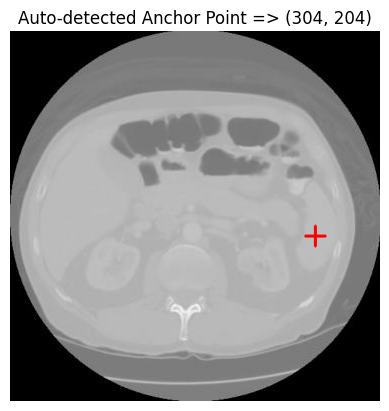

[Candidate 1] Confidence: 0.021, PSC Score: 0.925


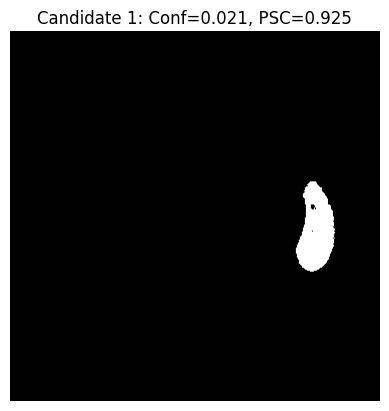

[Candidate 2] Confidence: 0.898, PSC Score: 0.485


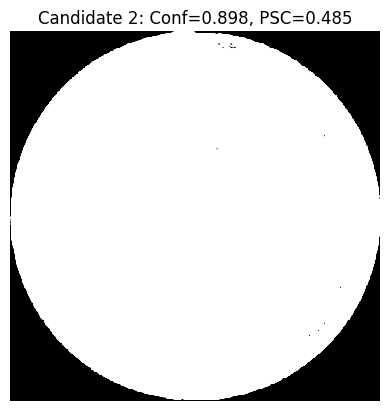

[Candidate 3] Confidence: 0.648, PSC Score: 0.518


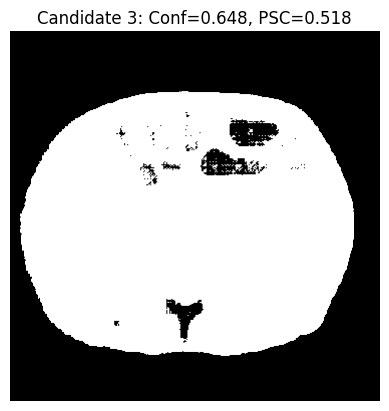

=== Ambiguous Mask Info ===
 Mask#1: Conf=0.021, Score=0.925
 Mask#2: Conf=0.898, Score=0.485
 Mask#3: Conf=0.648, Score=0.518
[Info] Best => Score=0.925
[Result] Dice Score => 0.948


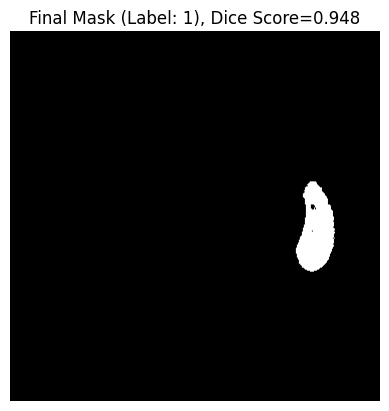


[Info] Evaluating for Class 2 (Memory Bank index: 1)
[Info] Evaluating for target_index: 1, semantic_label: 2
[Info] Anchor coordinate: (np.int64(116), np.int64(237))


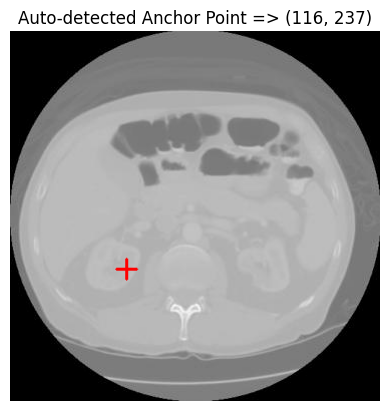

[Candidate 1] Confidence: 0.918, PSC Score: 0.908


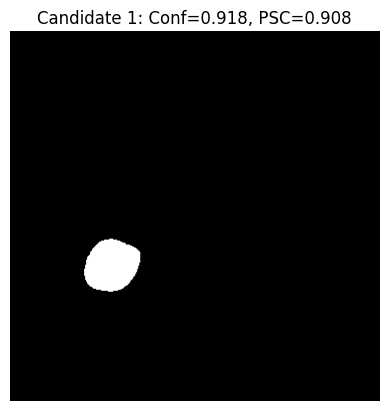

[Candidate 2] Confidence: 0.032, PSC Score: 0.432


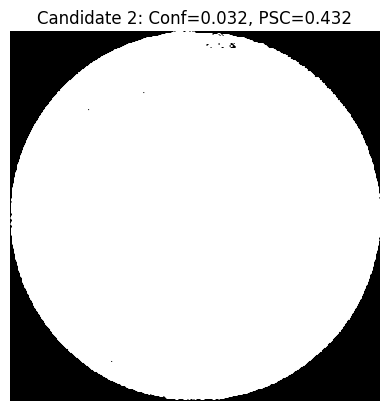

[Candidate 3] Confidence: 0.053, PSC Score: 0.483


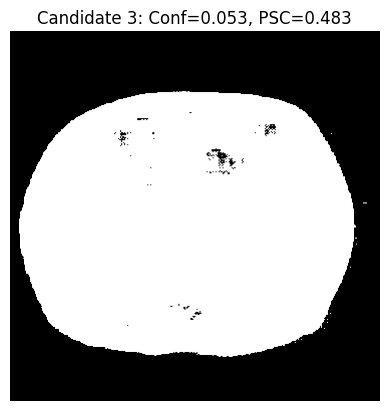

=== Ambiguous Mask Info ===
 Mask#1: Conf=0.918, Score=0.908
 Mask#2: Conf=0.032, Score=0.432
 Mask#3: Conf=0.053, Score=0.483
[Info] Best => Score=0.908
[Result] Dice Score => 0.952


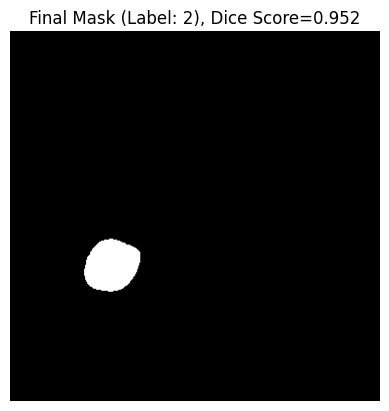


[Info] Evaluating for Class 3 (Memory Bank index: 2)
[Info] Evaluating for target_index: 2, semantic_label: 3
[Info] Anchor coordinate: (np.int64(264), np.int64(246))


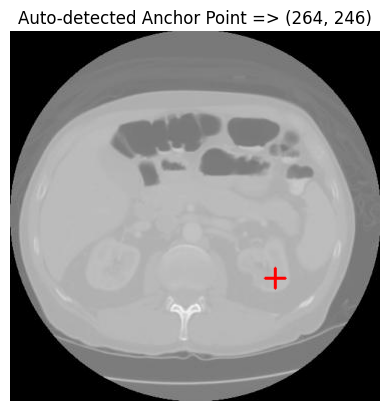

[Candidate 1] Confidence: 0.043, PSC Score: 0.817


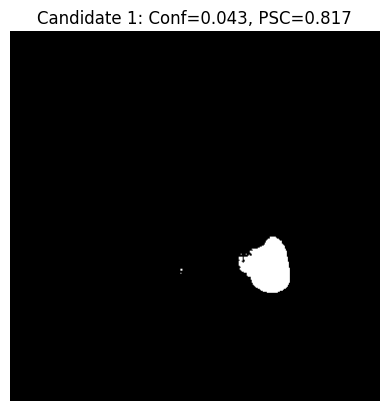

[Candidate 2] Confidence: 0.836, PSC Score: 0.455


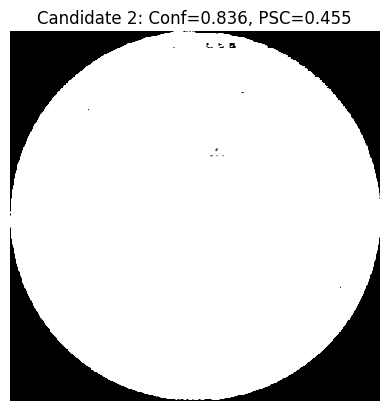

[Candidate 3] Confidence: 0.504, PSC Score: 0.505


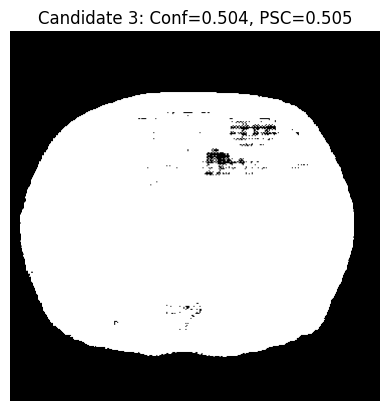

=== Ambiguous Mask Info ===
 Mask#1: Conf=0.043, Score=0.817
 Mask#2: Conf=0.836, Score=0.455
 Mask#3: Conf=0.504, Score=0.505
[Info] Best => Score=0.817
[Result] Dice Score => 0.906


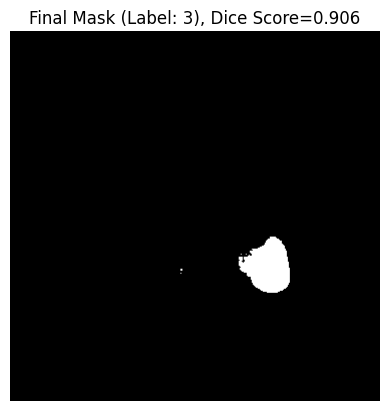


[Info] Evaluating for Class 6 (Memory Bank index: 3)
[Info] Evaluating for target_index: 3, semantic_label: 6
[Info] Anchor coordinate: (np.int64(81), np.int64(148))


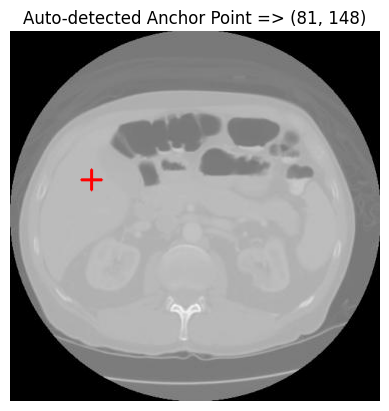

[Candidate 1] Confidence: 0.297, PSC Score: 0.904


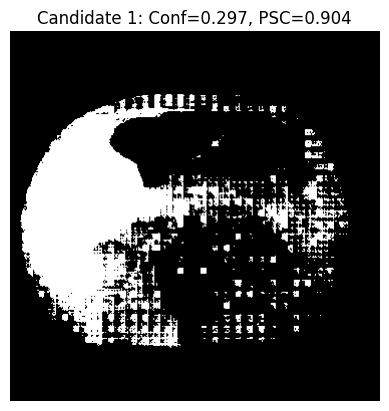

[Candidate 2] Confidence: 0.926, PSC Score: 0.784


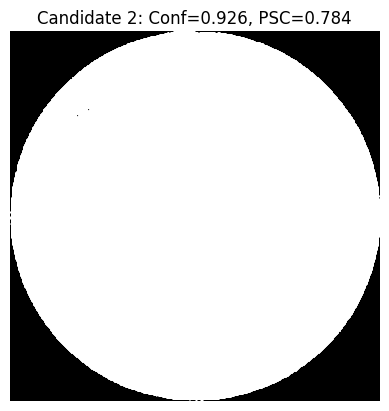

[Candidate 3] Confidence: 0.602, PSC Score: 0.793


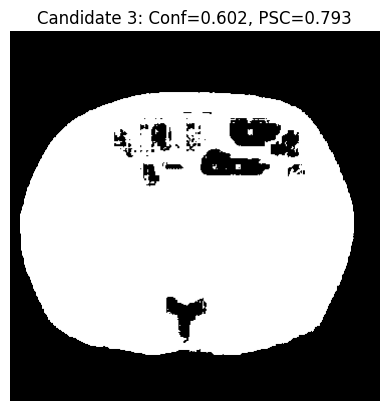

=== Ambiguous Mask Info ===
 Mask#1: Conf=0.297, Score=0.904
 Mask#2: Conf=0.926, Score=0.784
 Mask#3: Conf=0.602, Score=0.793
[Info] Best => Score=0.904
[Result] Dice Score => 0.431


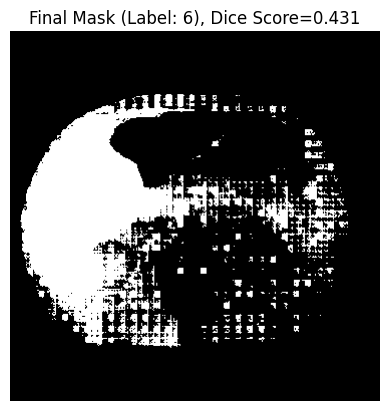


[Final Dice Scores]
 Class 1: Dice = 0.9479
 Class 2: Dice = 0.9521
 Class 3: Dice = 0.9055
 Class 6: Dice = 0.4306


In [16]:
import os
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt

########################################
# 유틸리티: 이미지 및 라벨 로드 함수
########################################
def load_image_and_label(image_path, label_path):
    """
    image_path: 입력 이미지 경로 (BGR 이미지)
    label_path: GT 마스크 경로 (Grayscale)
    
    반환:
      - rgb_image: RGB 이미지 (numpy array)
      - gt_mask: 그레이스케일 GT 마스크 (numpy array)
    """
    rgb_image = cv2.imread(image_path)
    if rgb_image is None:
        raise ValueError(f"Cannot read image from {image_path}")
    # OpenCV는 기본 BGR이므로 RGB로 변환
    rgb_image = cv2.cvtColor(rgb_image, cv2.COLOR_BGR2RGB)
    
    gt_mask = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if gt_mask is None:
        raise ValueError(f"Cannot read label from {label_path}")
    return rgb_image, gt_mask

########################################
# 0) Dice Function (평가용)
########################################
def compute_dice_score(pred_mask, gt_mask, target_label):
    """
    pred_mask, gt_mask: (H,W) 배열, 예측 및 GT에서 target_label 영역만 평가 (배경=0은 무시)
    만약 두 마스크의 크기가 다르면, gt_mask를 pred_mask 크기로 resize (최근접 보간)
    """
    if pred_mask.shape != gt_mask.shape:
        gt_mask = cv2.resize(gt_mask, (pred_mask.shape[1], pred_mask.shape[0]), interpolation=cv2.INTER_NEAREST)
    # target_label인 영역만 추출 (배경 0 무시)
    pm = (pred_mask == target_label).astype(np.uint8)
    gm = (gt_mask == target_label).astype(np.uint8)
    inter = np.sum(pm * gm)
    union = np.sum(pm) + np.sum(gm)
    if union == 0:
        return 1.0 if inter == 0 else 0.0
    dice = 2.0 * inter / union
    return dice

########################################
# 1) Prototypes 및 Class Assignment
########################################
def normalize_prototypes(prototypes, device):
    pt = torch.from_numpy(prototypes).float().to(device)
    pt = torch.nn.functional.normalize(pt, p=2, dim=-1)
    return pt

def generate_class_masks(predictor, prototypes, rgb_image):
    """
    SAM2의 image_embed를 이용하여 픽셀 단위 특징을 추출하고,
    각 프로토타입과의 코사인 유사도를 계산하여 각 클래스별 마스크를 생성합니다.
    
    반환:
      - out_masks: (N,H,W), 각 채널은 해당 프로토타입 영역 (객체=255, 배경=0)
      - class_map: 각 픽셀에 대해 가장 높은 유사도를 가진 프로토타입 인덱스
      - sim: (N,H,W) 유사도 맵
    """
    predictor.reset_predictor()
    predictor.set_image(rgb_image)
    proto_t = normalize_prototypes(prototypes, device=predictor.device)
    feats = predictor._features["image_embed"]  # (1,C,H,W)
    feats_up = torch.nn.functional.interpolate(
        feats, size=(rgb_image.shape[0], rgb_image.shape[1]),
        mode='bilinear', align_corners=False
    )[0]  # (C,H,W)
    feats_norm = torch.nn.functional.normalize(feats_up, p=2, dim=0)
    sim = torch.einsum('nc,chw->nhw', proto_t, feats_norm)  # (N,H,W)
    class_map = torch.argmax(sim, dim=0).cpu().numpy()
    num_classes = proto_t.shape[0]
    H, W = class_map.shape
    out_masks = np.zeros((num_classes, H, W), dtype=np.uint8)
    for c in range(num_classes):
        out_masks[c] = (class_map == c).astype(np.uint8) * 255
    return out_masks, class_map, sim

########################################
# 2) 개선된 앵커 좌표 결정: 유사도 기반 선택
########################################
def compute_anchor_coordinate_similarity_only(anchor_mask, sim_map):
    """
    유사도 맵(sim_map)에서, anchor_mask 영역 중 가장 높은 값을 가지는 픽셀을
    앵커 좌표로 선택합니다.
    """
    sim_region = sim_map.copy()
    sim_region[anchor_mask == 0] = 0
    idx = np.argmax(sim_region)
    H, W = sim_map.shape
    cy, cx = np.unravel_index(idx, (H, W))
    return (cx, cy)

########################################
# 3) Compute Custom Score (Global Prototype 기반 평가)
########################################
def compute_custom_score(mask_bin, prototypes, predictor, target_index, class_mask, alpha=0.5):
    """
    score = alpha * similarity + (1 - alpha) * coverage
      - coverage: ambiguous mask와 prototype 기반 class_mask의 중첩 비율
      - similarity: ambiguous mask 내부 임베딩의 평균과 target prototype의 코사인 유사도
      
    target_index: 0-based 인덱스로, prototypes[target_index]를 대상 프로토타입으로 사용
    """
    if mask_bin.shape != class_mask.shape:
        cm_ = cv2.resize(class_mask, (mask_bin.shape[1], mask_bin.shape[0]), interpolation=cv2.INTER_NEAREST)
    else:
        cm_ = class_mask
    mask_reg = (mask_bin > 0)
    class_reg = (cm_ > 0)
    area_mask = float(mask_reg.sum())
    if area_mask < 1:
        coverage = 0.0
    else:
        overlap = float(np.sum(mask_reg & class_reg))
        coverage = overlap / area_mask

    feats = predictor.get_image_embedding()
    if isinstance(feats, dict):
        feats = feats["image_embed"]  # (1,C,H,W)
    if feats.ndim == 4:
        feats = feats[0]  # (C,H,W)
    base = feats.cpu().numpy()
    C_feat, H_feat, W_feat = base.shape
    if mask_bin.shape != (H_feat, W_feat):
        mask_rs = cv2.resize(mask_bin, (W_feat, H_feat), interpolation=cv2.INTER_NEAREST)
    else:
        mask_rs = mask_bin
    region = (mask_rs > 0)
    if region.sum() < 1:
        emb_mean = np.zeros((C_feat,), dtype=np.float32)
    else:
        pix = base[:, region]
        emb_mean = pix.mean(axis=1)
    device = predictor.device
    emb_mean_t = torch.tensor(emb_mean, dtype=torch.float32, device=device)
    if isinstance(prototypes, np.ndarray):
        prototypes_t = torch.tensor(prototypes, dtype=torch.float32, device=device)
    else:
        prototypes_t = prototypes
    proto_vec = prototypes_t[target_index]
    normA = emb_mean_t / (emb_mean_t.norm() + 1e-6)
    normB = proto_vec / (proto_vec.norm() + 1e-6)
    similarity = float((normA * normB).sum().detach().cpu())
    score = alpha * similarity + (1 - alpha) * coverage
    return score

########################################
# 4) Improved Final Mask Selection: 임계값 없이 최고 score 선택
########################################
def select_final_mask_by_maxscore(ambiguous_masks, confidences, prototypes, predictor, target_index, class_mask, alpha=0.5):
    """
    각 ambiguous mask에 대해 custom score를 계산한 후, 가장 높은 score를 가진 mask를 반환합니다.
    
    target_index: 0-based 인덱스로, 해당 프로토타입을 대상 클래스로 사용
    """
    best_score = -1e9
    best_mask = None
    info_list = []
    for i, amb_mask in enumerate(ambiguous_masks):
        sc = compute_custom_score(amb_mask, prototypes, predictor, target_index, class_mask, alpha=alpha)
        info = {"mask_idx": i, "score": sc, "confidence": confidences[i]}
        info_list.append(info)
        if sc > best_score:
            best_score = sc
            best_mask = amb_mask
    print("=== Ambiguous Mask Info ===")
    for e in info_list:
        print(f" Mask#{e['mask_idx']+1}: Conf={e['confidence']:.3f}, Score={e['score']:.3f}")
    print("================================")
    print(f"[Info] Best => Score={best_score:.3f}")
    return best_mask, info_list

########################################
# 5) Main Processing Function (테스트용)
########################################
def process_image_and_evaluate(predictor, prototypes, rgb_image, gt_mask,
                               target_index, semantic_label, alpha=0.5, threshold=0.3,
                               w_dist=0.5, w_sim=0.5):
    """
    평가 함수  
      - target_index: 0-based 인덱스 (예, prototypes[target_index]가 대상 프로토타입)
      - semantic_label: 최종 예측 마스크에 부여할 실제 semantic label (예, 63, 126, …)
    
    동작 순서:
      1) Prototype 기반 Class Mask 생성  
      2) 대상 클래스의 유사도 맵을 추출하여, 유사도 기반 앵커 좌표 결정  
      3) 해당 앵커 좌표를 prompt로 ambiguous mask 후보 예측  
      4) 각 ambiguous mask에 대해 custom (PSC) score를 계산하여 출력하고, 최고 score mask 선택  
      5) 최종 mask (binary → semantic label mask 변환)와 GT mask 간 Dice score 계산 (배경 무시)
    """
    print(f"[Info] Evaluating for target_index: {target_index}, semantic_label: {semantic_label}")

    # (0) Prototype 기반 Class Mask 생성
    masks, class_map, sim = generate_class_masks(predictor, prototypes, rgb_image)
    target_mask = masks[target_index]
    
    # (1) 대상 클래스 유사도 맵 추출
    target_sim_map = sim[target_index].float().cpu().numpy()
    
    # (2) 유사도 기반 앵커 좌표 결정
    anchor = compute_anchor_coordinate_similarity_only(target_mask, target_sim_map)
    if anchor is None:
        print("[Warn] Anchor coordinate not found, using fallback (zeros)")
        final_mask = np.zeros_like(target_mask)
        dice_val = compute_dice_score(final_mask, gt_mask, target_label=semantic_label)
        return final_mask, dice_val
    print(f"[Info] Anchor coordinate: {anchor}")
    
    # (3) 앵커 좌표 시각화 (생략 가능)
    anchor_img = rgb_image.copy()
    cv2.drawMarker(anchor_img, (anchor[0], anchor[1]), (255, 0, 0),
                   markerType=cv2.MARKER_CROSS, thickness=2)
    plt.figure()
    plt.imshow(anchor_img)
    plt.title(f"Auto-detected Anchor Point => ({anchor[0]}, {anchor[1]})")
    plt.axis("off")
    plt.show()
    
    # (4) ambiguous mask 예측
    point_coords = np.array([[anchor[0], anchor[1]]])
    point_labels = np.array([1])
    ambiguous_masks, confidences, _ = predictor.predict(
        point_coords=point_coords,
        point_labels=point_labels,
        multimask_output=True
    )
    
    # 각 후보 마스크에 대한 PSC score 계산 및 출력
    psc_scores = []
    for i, amb_mask in enumerate(ambiguous_masks):
        score = compute_custom_score(amb_mask, prototypes, predictor, target_index, class_mask=target_mask, alpha=alpha)
        psc_scores.append(score)
        print(f"[Candidate {i+1}] Confidence: {confidences[i]:.3f}, PSC Score: {score:.3f}")
        plt.figure()
        plt.imshow(amb_mask, cmap="gray")
        plt.title(f"Candidate {i+1}: Conf={confidences[i]:.3f}, PSC={score:.3f}")
        plt.axis("off")
        plt.show()
    
    # (5) 최종 마스크 선택: 최고 PSC score 선택
    final_mask, info_list = select_final_mask_by_maxscore(ambiguous_masks, confidences,
                                                          prototypes, predictor,
                                                          target_index, class_mask=target_mask,
                                                          alpha=alpha)
    if final_mask is None:
        print("[Warn] Final mask not selected, using empty mask")
        final_mask = np.zeros_like(target_mask)
    
    # (6) 최종 마스크를 binary (0/255)에서 semantic label mask로 변환 (객체 영역은 semantic_label, 배경은 0)
    final_mask = (final_mask > 0).astype(np.uint8) * semantic_label

    # (7) Dice Score 계산 (배경 무시, target label만 평가)
    dice_val = compute_dice_score(final_mask, gt_mask, target_label=semantic_label)
    print(f"[Result] Dice Score => {dice_val:.3f}")
    plt.figure()
    plt.imshow(final_mask, cmap="gray")
    plt.title(f"Final Mask (Label: {semantic_label}), Dice Score={dice_val:.3f}")
    plt.axis("off")
    plt.show()
    
    return final_mask, dice_val


########################################
# 6) Main (테스트 실행 코드)
########################################
if __name__ == "__main__":
    from sam2.build_sam import build_sam2
    from sam2.sam2_image_predictor import SAM2ImagePredictor

    device = "cuda" if torch.cuda.is_available() else "cpu"
    ckpt = "../checkpoints/sam2.1_hiera_large.pt"
    cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"
    sam2_model = build_sam2(cfg, ckpt, device=device)
    predictor = SAM2ImagePredictor(sam2_model)

    # Memory Bank로부터 prototype 불러오기  
    # 예: 실제 클래스 번호가 [63, 126, 189, 252]라면, Memory Bank 순서는 0~3
    mem_bank = np.load("synapse_prototypes.npz")
    sorted_keys = sorted(mem_bank.files, key=lambda x: int(x))
    prototypes = np.stack([mem_bank[k] for k in sorted_keys], axis=0)
    # 실제 semantic label 값 (예, 63, 126, 189, 252)
    actual_class_ids = [int(k) for k in sorted_keys]
    print("[Debug] Prototypes shape:", prototypes.shape, "Actual Class IDs:", actual_class_ids)

    # 테스트 이미지 및 GT 마스크 로드
    img_path = "./videos/btcv/Test/image/img0037/70.jpg"
    label_path = "./converted_masks_test1236_original/img0037/70.png"
    rgb_image, gt_mask = load_image_and_label(img_path, label_path)

    # 각 클래스에 대해 Dice Score 계산 (배경 무시)
    dice_scores = {}
    for i, actual_cls in enumerate(actual_class_ids):
        print(f"\n[Info] Evaluating for Class {actual_cls} (Memory Bank index: {i})")
        # target_index: 0-based 인덱스, semantic_label: 실제 클래스 label (예, 63 등)
        final_mask, dice_val = process_image_and_evaluate(predictor, prototypes, rgb_image, gt_mask,
                                                          target_index=i, semantic_label=actual_cls,
                                                          alpha=0.6, threshold=0.3)
        dice_scores[actual_cls] = dice_val

    print("\n[Final Dice Scores]")
    for cls, d in dice_scores.items():
        print(f" Class {cls}: Dice = {d:.4f}")


### 수동 프롬프트

[Debug] Prototypes shape: (4, 256) Actual Class IDs: [1, 2, 3, 6]

[Info] Evaluating for Class 1, using manual coords=[(300, 200), (305, 180)]
[Info] Evaluating for target_index=0, semantic_label=1


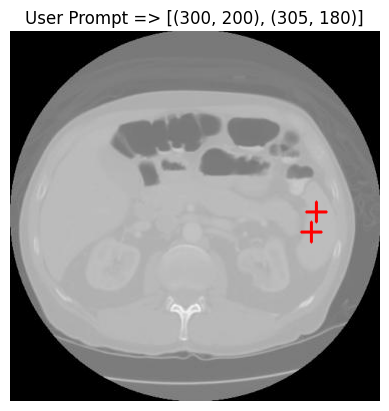

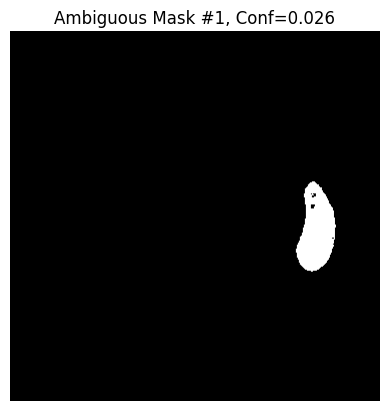

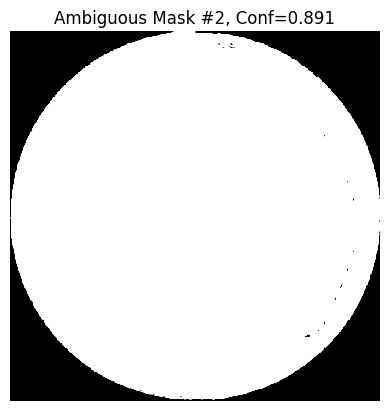

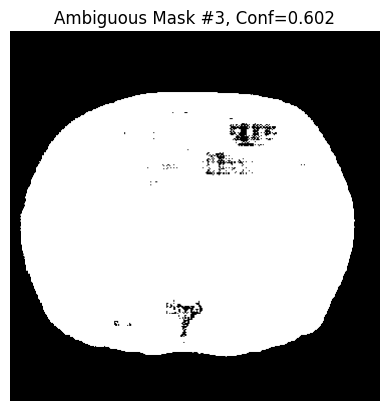

=== Ambiguous Mask Info ===
 Mask#1: Conf=0.026, Score=0.924
 Mask#2: Conf=0.891, Score=0.485
 Mask#3: Conf=0.602, Score=0.521
[Info] Best => Score=0.924
[Result] Dice Score => 0.957


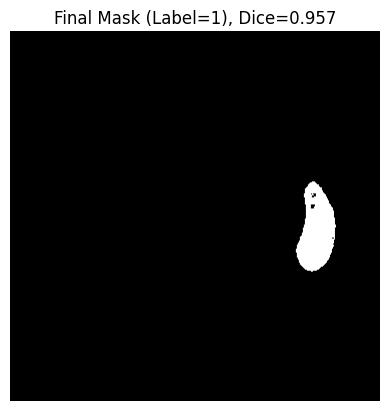


[Info] Evaluating for Class 2, using manual coords=[(110, 235), (110, 250)]
[Info] Evaluating for target_index=1, semantic_label=2


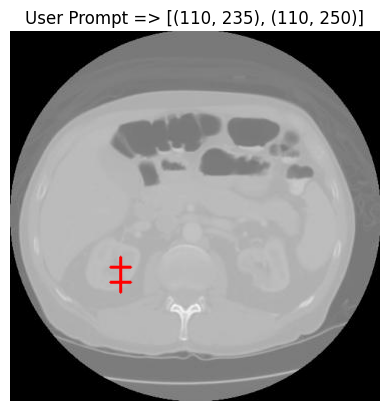

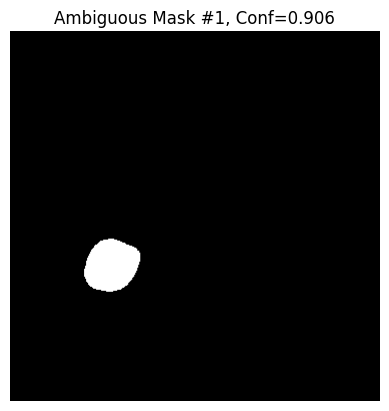

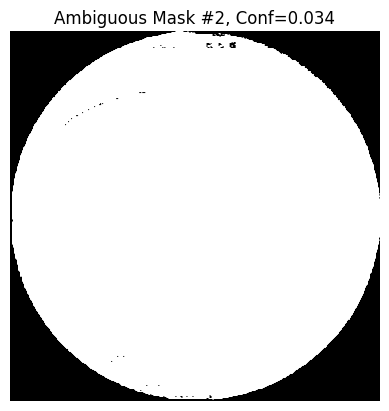

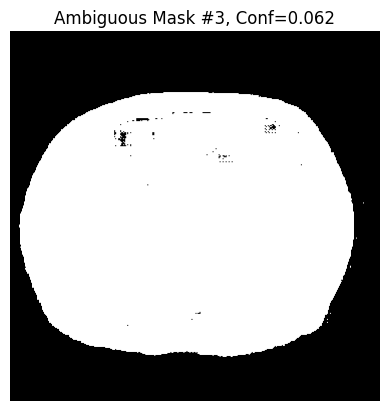

=== Ambiguous Mask Info ===
 Mask#1: Conf=0.906, Score=0.907
 Mask#2: Conf=0.034, Score=0.432
 Mask#3: Conf=0.062, Score=0.484
[Info] Best => Score=0.907
[Result] Dice Score => 0.953


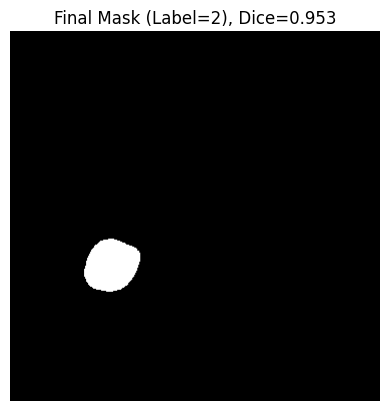


[Info] Evaluating for Class 3, using manual coords=[(245, 245), (260, 240)]
[Info] Evaluating for target_index=2, semantic_label=3


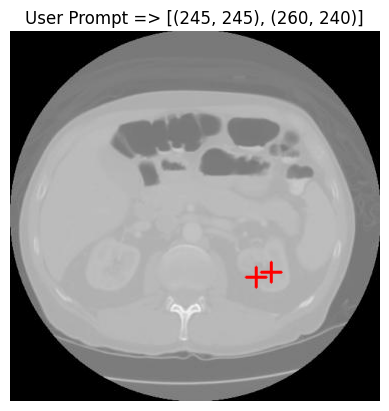

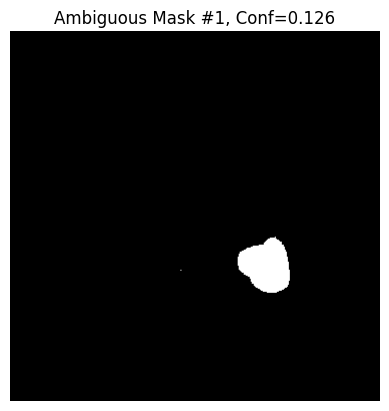

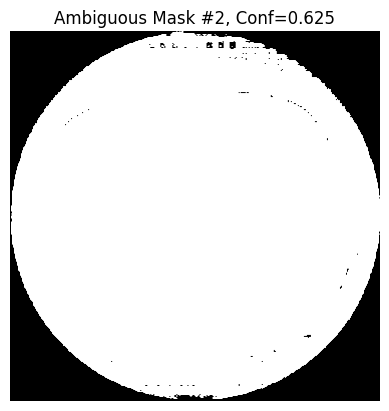

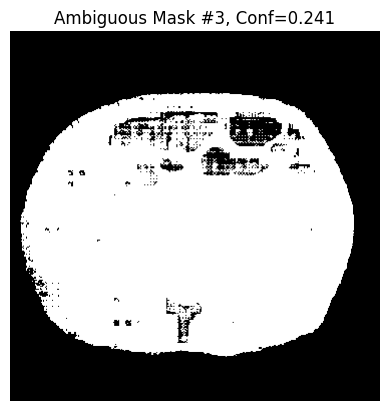

=== Ambiguous Mask Info ===
 Mask#1: Conf=0.126, Score=0.800
 Mask#2: Conf=0.625, Score=0.456
 Mask#3: Conf=0.241, Score=0.499
[Info] Best => Score=0.800
[Result] Dice Score => 0.924


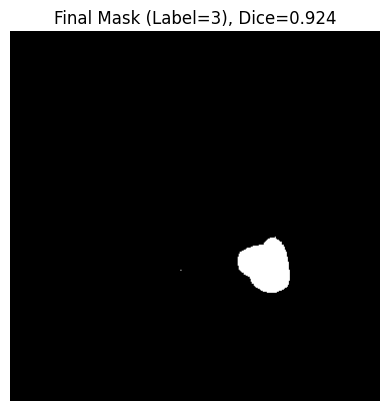


[Info] Evaluating for Class 6, using manual coords=[(85, 145), (95, 170)]
[Info] Evaluating for target_index=3, semantic_label=6


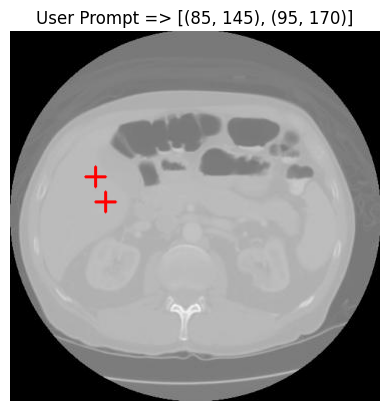

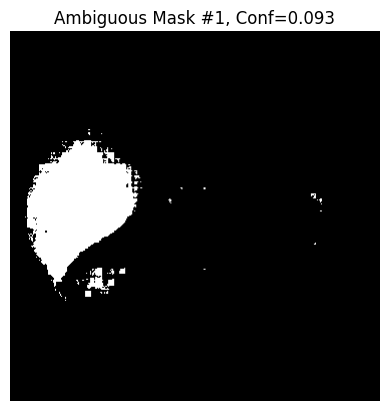

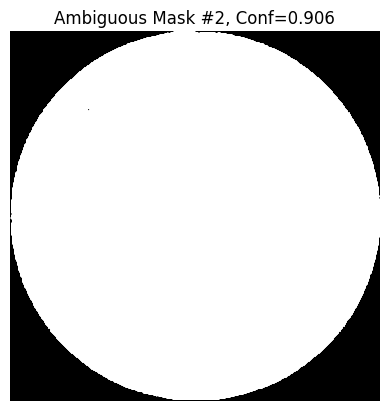

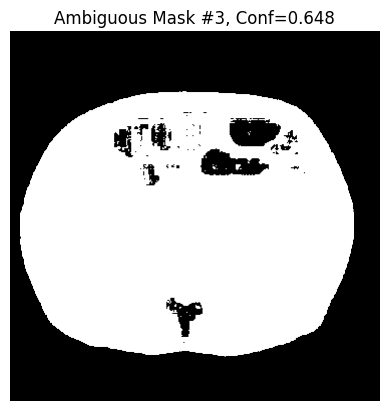

=== Ambiguous Mask Info ===
 Mask#1: Conf=0.093, Score=0.950
 Mask#2: Conf=0.906, Score=0.784
 Mask#3: Conf=0.648, Score=0.788
[Info] Best => Score=0.950
[Result] Dice Score => 0.803


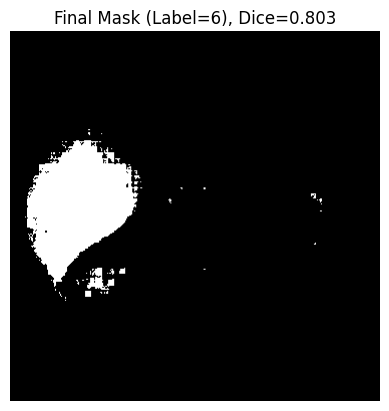


[Final Dice Scores]
 Class 1: Dice = 0.9569
 Class 2: Dice = 0.9534
 Class 3: Dice = 0.9241
 Class 6: Dice = 0.8031


In [64]:
import os
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt

########################################
# 유틸리티: 이미지 및 라벨 로드 함수
########################################
def load_image_and_label(image_path, label_path):
    """
    image_path: 입력 이미지 경로 (BGR 이미지)
    label_path: GT 마스크 경로 (Grayscale)
    
    반환:
      - rgb_image: RGB 이미지 (numpy array)
      - gt_mask: 그레이스케일 GT 마스크 (numpy array)
    """
    rgb_image = cv2.imread(image_path)
    if rgb_image is None:
        raise ValueError(f"Cannot read image from {image_path}")
    # OpenCV는 기본 BGR이므로 RGB로 변환
    rgb_image = cv2.cvtColor(rgb_image, cv2.COLOR_BGR2RGB)
    
    gt_mask = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if gt_mask is None:
        raise ValueError(f"Cannot read label from {label_path}")
    return rgb_image, gt_mask

########################################
# 0) Dice Function (평가용)
########################################
def compute_dice_score(pred_mask, gt_mask, target_label):
    if pred_mask.shape != gt_mask.shape:
        gt_mask = cv2.resize(gt_mask, (pred_mask.shape[1], pred_mask.shape[0]), interpolation=cv2.INTER_NEAREST)
    pm = (pred_mask == target_label).astype(np.uint8)
    gm = (gt_mask == target_label).astype(np.uint8)
    inter = np.sum(pm * gm)
    union = np.sum(pm) + np.sum(gm)
    if union == 0:
        return 1.0 if inter == 0 else 0.0
    dice = 2.0 * inter / union
    return dice

########################################
# 1) Prototypes 및 Class Assignment
########################################
def normalize_prototypes(prototypes, device):
    pt = torch.from_numpy(prototypes).float().to(device)
    pt = torch.nn.functional.normalize(pt, p=2, dim=-1)
    return pt

def generate_class_masks(predictor, prototypes, rgb_image):
    """
    SAM2의 image_embed를 이용하여 픽셀 단위 특징을 추출하고,
    각 프로토타입과의 코사인 유사도를 계산하여 각 클래스별 마스크를 생성합니다.
    
    반환:
      - out_masks: (N,H,W), 각 채널은 해당 프로토타입 영역 (객체=255, 배경=0)
      - class_map: 각 픽셀에 대해 가장 높은 유사도를 가진 프로토타입 인덱스
      - sim: (N,H,W) 유사도 맵
    """
    predictor.reset_predictor()
    predictor.set_image(rgb_image)
    proto_t = normalize_prototypes(prototypes, device=predictor.device)
    feats = predictor._features["image_embed"]  # (1,C,H,W)
    feats_up = torch.nn.functional.interpolate(
        feats, size=(rgb_image.shape[0], rgb_image.shape[1]),
        mode='bilinear', align_corners=False
    )[0]  # (C,H,W)
    feats_norm = torch.nn.functional.normalize(feats_up, p=2, dim=0)
    sim = torch.einsum('nc,chw->nhw', proto_t, feats_norm)  # (N,H,W)
    class_map = torch.argmax(sim, dim=0).cpu().numpy()
    num_classes = proto_t.shape[0]
    H, W = class_map.shape
    out_masks = np.zeros((num_classes, H, W), dtype=np.uint8)
    for c in range(num_classes):
        out_masks[c] = (class_map == c).astype(np.uint8) * 255
    return out_masks, class_map, sim

########################################
# 2) Compute Custom Score (Global Prototype 기반 평가)
########################################
def compute_custom_score(mask_bin, prototypes, predictor, target_index, class_mask, alpha=0.5):
    """
    score = alpha * similarity + (1 - alpha) * coverage
    """
    if mask_bin.shape != class_mask.shape:
        cm_ = cv2.resize(class_mask, (mask_bin.shape[1], mask_bin.shape[0]), interpolation=cv2.INTER_NEAREST)
    else:
        cm_ = class_mask

    mask_reg = (mask_bin > 0)
    class_reg = (cm_ > 0)
    area_mask = float(mask_reg.sum())
    if area_mask < 1:
        coverage = 0.0
    else:
        overlap = float(np.sum(mask_reg & class_reg))
        coverage = overlap / area_mask

    feats = predictor.get_image_embedding()
    if isinstance(feats, dict):
        feats = feats["image_embed"]  # (1,C,H,W)
    if feats.ndim == 4:
        feats = feats[0]  # (C,H,W)

    base = feats.cpu().numpy()
    C_feat, H_feat, W_feat = base.shape
    if mask_bin.shape != (H_feat, W_feat):
        mask_rs = cv2.resize(mask_bin, (W_feat, H_feat), interpolation=cv2.INTER_NEAREST)
    else:
        mask_rs = mask_bin
    region = (mask_rs > 0)
    if region.sum() < 1:
        emb_mean = np.zeros((C_feat,), dtype=np.float32)
    else:
        pix = base[:, region]
        emb_mean = pix.mean(axis=1)

    device = predictor.device
    emb_mean_t = torch.tensor(emb_mean, dtype=torch.float32, device=device)
    if isinstance(prototypes, np.ndarray):
        prototypes_t = torch.tensor(prototypes, dtype=torch.float32, device=device)
    else:
        prototypes_t = prototypes

    proto_vec = prototypes_t[target_index]
    normA = emb_mean_t / (emb_mean_t.norm() + 1e-6)
    normB = proto_vec / (proto_vec.norm() + 1e-6)
    similarity = float((normA * normB).sum().detach().cpu())

    score = alpha * similarity + (1 - alpha) * coverage
    return score

########################################
# 3) Improved Final Mask Selection: 최고 score 선택
########################################
def select_final_mask_by_maxscore(ambiguous_masks, confidences, prototypes, predictor,
                                  target_index, class_mask, alpha=0.5):
    best_score = -1e9
    best_mask = None
    info_list = []
    for i, amb_mask in enumerate(ambiguous_masks):
        sc = compute_custom_score(amb_mask, prototypes, predictor, target_index, class_mask, alpha=alpha)
        info = {"mask_idx": i, "score": sc, "confidence": confidences[i]}
        info_list.append(info)
        if sc > best_score:
            best_score = sc
            best_mask = amb_mask

    print("=== Ambiguous Mask Info ===")
    for e in info_list:
        print(f" Mask#{e['mask_idx']+1}: Conf={e['confidence']:.3f}, Score={e['score']:.3f}")
    print("================================")
    print(f"[Info] Best => Score={best_score:.3f}")
    return best_mask, info_list

########################################
# 4) 메인 처리 함수: (사용자 지정 좌표 사용 버전)
########################################
def process_image_and_evaluate_manual_prompt(
    predictor, prototypes, rgb_image, gt_mask,
    target_index, semantic_label,
    manual_coords,  # (x, y)를 담은 tuple/list
    alpha=0.5
):
    """
    manual_coords: 사용자가 지정한 (x, y) 좌표 (정수형)
    
    수행 순서:
      1) Prototype 기반 Class Mask 생성
      2) user가 지정한 (x,y) 좌표를 prompt로 사용
      3) ambiguous mask 예측
      4) custom score 계산으로 best mask 선택
      5) Dice 계산 후 결과 리턴
    """
    print(f"[Info] Evaluating for target_index={target_index}, semantic_label={semantic_label}")
    
    # (1) Prototype 기반 Class Mask 생성
    masks, class_map, sim = generate_class_masks(predictor, prototypes, rgb_image)
    target_mask = masks[target_index]

    # (2) 사용자 지정 좌표 시각화
    # 사용자 지정 좌표 시각화
    anchor_img = rgb_image.copy()
    for x, y in manual_coords:
        cv2.drawMarker(anchor_img, (x, y), (255,0,0), markerType=cv2.MARKER_CROSS, thickness=2)
    plt.figure()
    plt.imshow(anchor_img)
    plt.title(f"User Prompt => {manual_coords}")
    plt.axis("off")
    plt.show()

    # 두 개의 점 사용
    point_coords = np.array(manual_coords, dtype=np.int32)
    point_labels = np.ones(len(manual_coords), dtype=np.int32)
    ambiguous_masks, confidences, _ = predictor.predict(
        point_coords=point_coords,
        point_labels=point_labels,
        multimask_output=True
    )

    # 시각화 (필요 시 주석 처리 가능)
    for i, (am, conf) in enumerate(zip(ambiguous_masks, confidences)):
        plt.figure()
        plt.imshow(am, cmap="gray")
        plt.title(f"Ambiguous Mask #{i+1}, Conf={conf:.3f}")
        plt.axis("off")
        plt.show()

    # (4) custom score 계산 -> best mask 선택
    best_mask, info_list = select_final_mask_by_maxscore(
        ambiguous_masks, confidences,
        prototypes, predictor,
        target_index, class_mask=target_mask,
        alpha=alpha
    )
    if best_mask is None:
        print("[Warn] Final mask not selected, using empty mask")
        best_mask = np.zeros_like(target_mask)

    # semantic_label로 변환
    final_mask = (best_mask > 0).astype(np.uint8) * semantic_label

    # (5) Dice 계산
    dice_val = compute_dice_score(final_mask, gt_mask, target_label=semantic_label)
    print(f"[Result] Dice Score => {dice_val:.3f}")

    # 최종 마스크 시각화
    plt.figure()
    plt.imshow(final_mask, cmap="gray")
    plt.title(f"Final Mask (Label={semantic_label}), Dice={dice_val:.3f}")
    plt.axis("off")
    plt.show()

    return final_mask, dice_val

########################################
# 5) Main (테스트 실행)
########################################
if __name__ == "__main__":
    from sam2.build_sam import build_sam2
    from sam2.sam2_image_predictor import SAM2ImagePredictor

    device = "cuda" if torch.cuda.is_available() else "cpu"
    ckpt = "../checkpoints/sam2.1_hiera_large.pt"
    cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"
    sam2_model = build_sam2(cfg, ckpt, device=device)
    predictor = SAM2ImagePredictor(sam2_model)

    # Memory Bank 로드
    mem_bank = np.load("synapse_prototypes.npz")
    sorted_keys = sorted(mem_bank.files, key=lambda x: int(x))
    prototypes = np.stack([mem_bank[k] for k in sorted_keys], axis=0)
    actual_class_ids = [int(k) for k in sorted_keys]
    print("[Debug] Prototypes shape:", prototypes.shape, "Actual Class IDs:", actual_class_ids)

    # 테스트 이미지 및 GT 마스크 로드
    img_path = "./videos/btcv/Test/image/img0037/70.jpg"
    label_path = "./converted_masks_test1236_original/img0037/70.png"
    rgb_image, gt_mask = load_image_and_label(img_path, label_path)

    # (예시) 사용자 지정 좌표 목록 - 클래스별로 다르게 지정할 수도 있음
    #  예: 클래스가 4개면 아래처럼 4개 점을 정의할 수 있음.
    #  여기서는 단순 예시로 한 클래스만 사용한다고 가정.
    user_prompt_coords = {
        1: [(300, 200), (305, 180)],
        2: [(110, 235), (110, 250)],
        3: [(245, 245), (260, 240)],
        6: [(85, 145), (95, 170)]
    }

    # 예시: 모든 클래스에 대해 사용자 지정 좌표로 결과 확인
    dice_scores = {}
    for i, actual_cls in enumerate(actual_class_ids):
        if actual_cls not in user_prompt_coords:
            print(f"[Warn] No user coord for class {actual_cls}, skip")
            continue
        coords = user_prompt_coords[actual_cls]
        print(f"\n[Info] Evaluating for Class {actual_cls}, using manual coords={coords}")
        final_mask, dice_val = process_image_and_evaluate_manual_prompt(
            predictor=predictor,
            prototypes=prototypes,
            rgb_image=rgb_image,
            gt_mask=gt_mask,
            target_index=i,          # Memory Bank 상에서 i번째 프로토타입
            semantic_label=actual_cls,
            manual_coords=coords,    # 사용자 지정 (x,y)
            alpha=0.6
        )
        dice_scores[actual_cls] = dice_val

    print("\n[Final Dice Scores]")
    for cls, d in dice_scores.items():
        print(f" Class {cls}: Dice = {d:.4f}")


### 자동 프롬프트

[Debug] Prototypes shape: (4, 256) Actual Class IDs: [1, 2, 3, 6]

[Info] Evaluating for Class 1 (Memory Bank index: 0)
[Info] Evaluating for target_index: 0, semantic_label: 1
[Info] Anchor coordinate: (np.int64(304), np.int64(204))


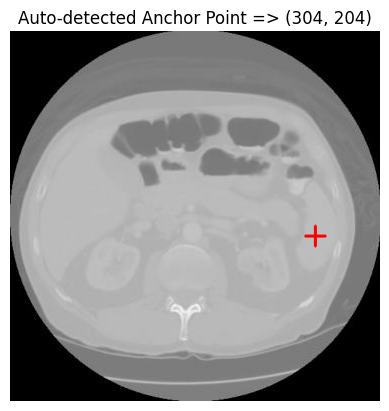

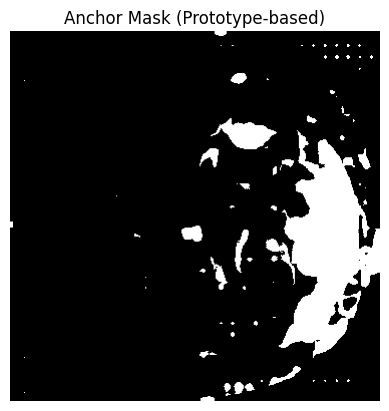

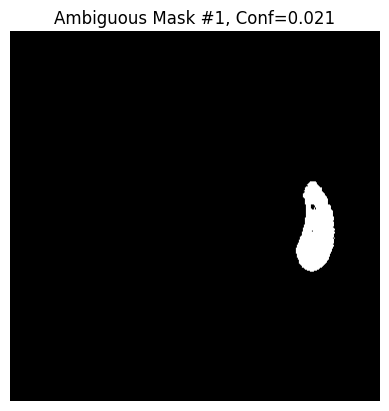

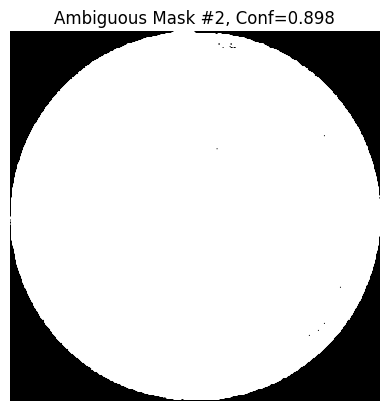

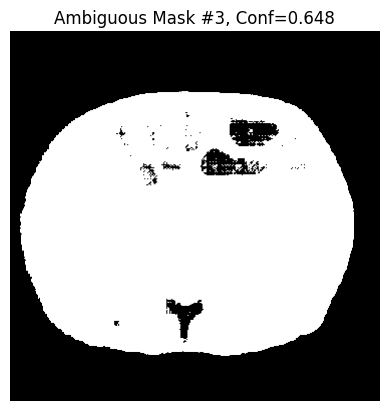

=== Ambiguous Mask Info ===
 Mask#1: Conf=0.021, Score=0.925
 Mask#2: Conf=0.898, Score=0.485
 Mask#3: Conf=0.648, Score=0.518
[Info] Best => Score=0.925
[Result] Dice Score => 0.948


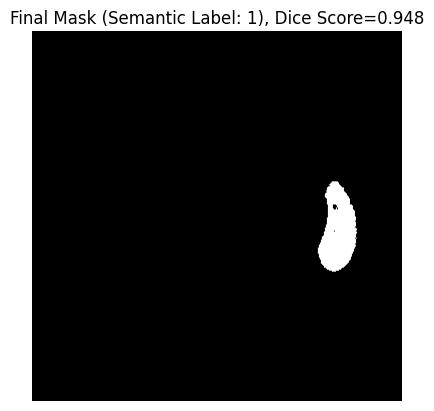


[Info] Evaluating for Class 2 (Memory Bank index: 1)
[Info] Evaluating for target_index: 1, semantic_label: 2
[Info] Anchor coordinate: (np.int64(116), np.int64(237))


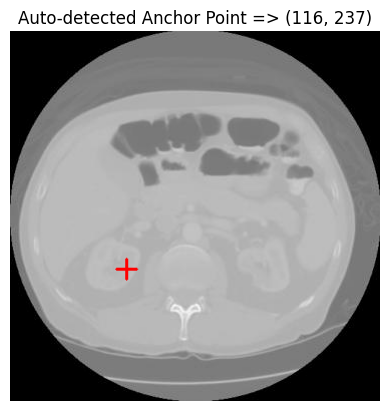

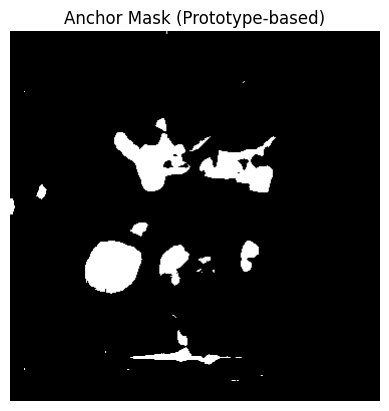

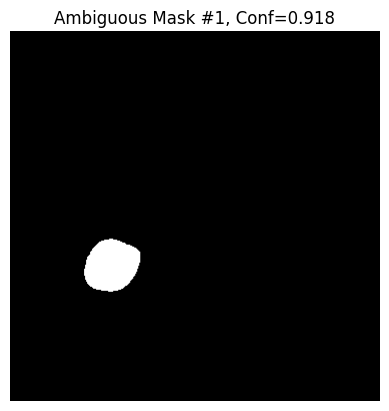

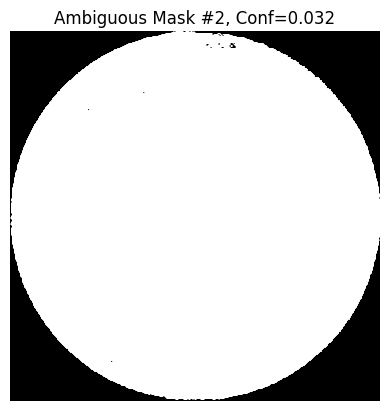

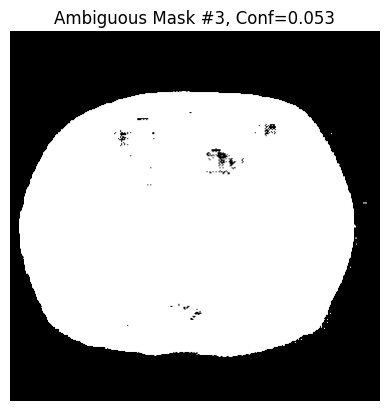

=== Ambiguous Mask Info ===
 Mask#1: Conf=0.918, Score=0.908
 Mask#2: Conf=0.032, Score=0.432
 Mask#3: Conf=0.053, Score=0.483
[Info] Best => Score=0.908
[Result] Dice Score => 0.952


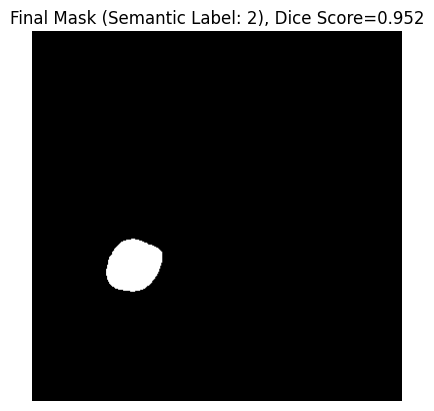


[Info] Evaluating for Class 3 (Memory Bank index: 2)
[Info] Evaluating for target_index: 2, semantic_label: 3
[Info] Anchor coordinate: (np.int64(264), np.int64(246))


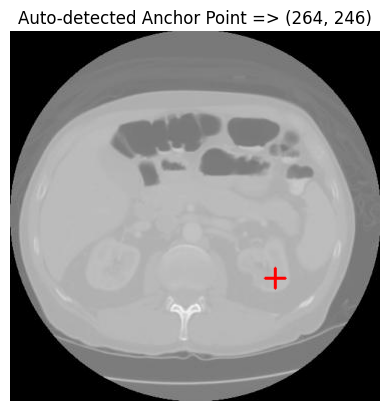

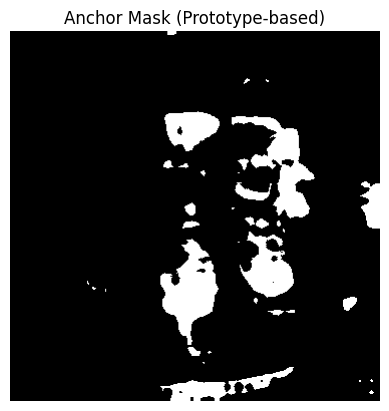

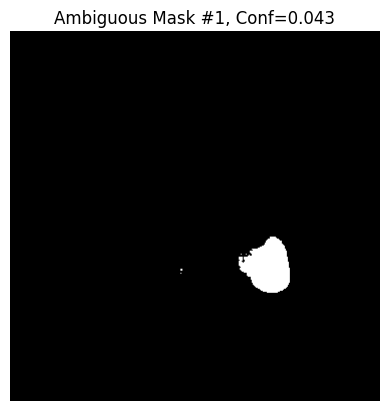

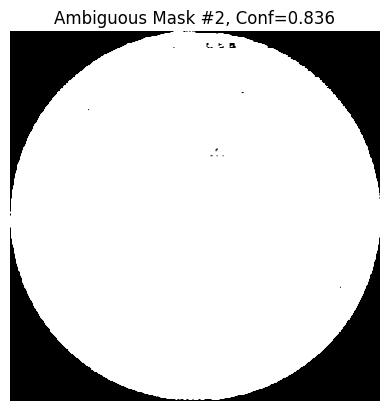

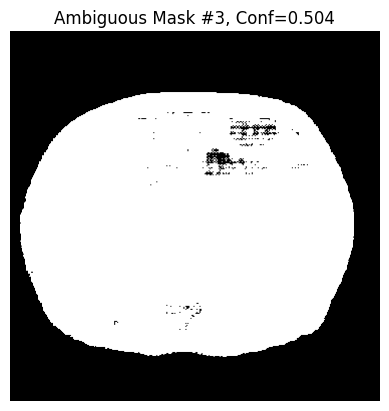

=== Ambiguous Mask Info ===
 Mask#1: Conf=0.043, Score=0.817
 Mask#2: Conf=0.836, Score=0.455
 Mask#3: Conf=0.504, Score=0.505
[Info] Best => Score=0.817
[Result] Dice Score => 0.906


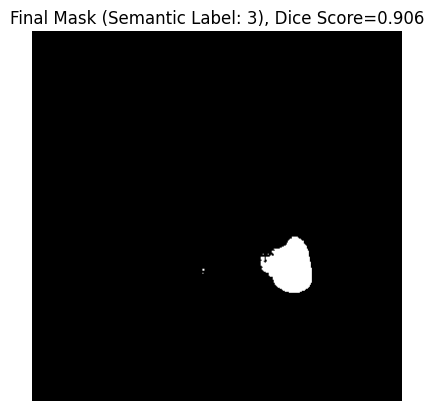


[Info] Evaluating for Class 6 (Memory Bank index: 3)
[Info] Evaluating for target_index: 3, semantic_label: 6
[Info] Anchor coordinate: (np.int64(81), np.int64(148))


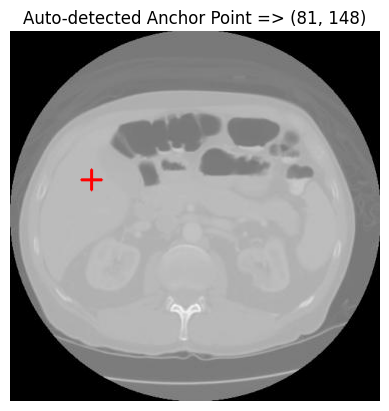

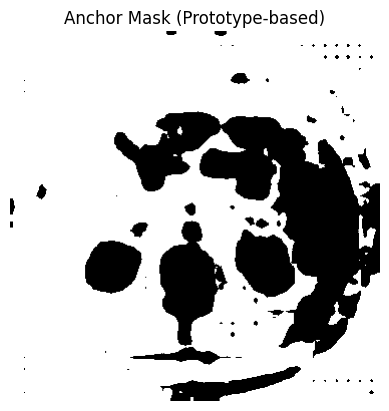

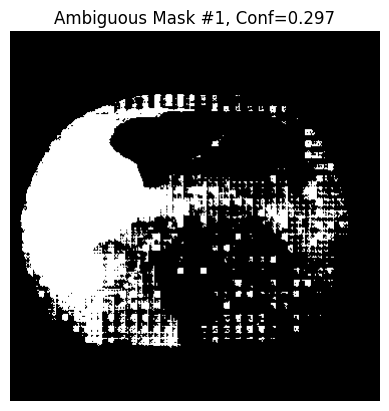

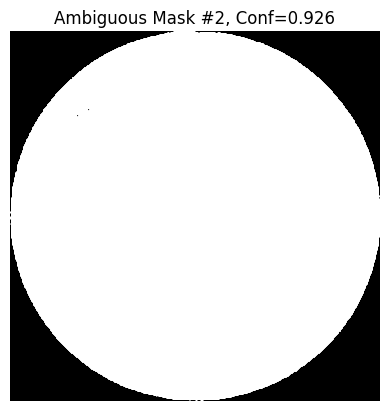

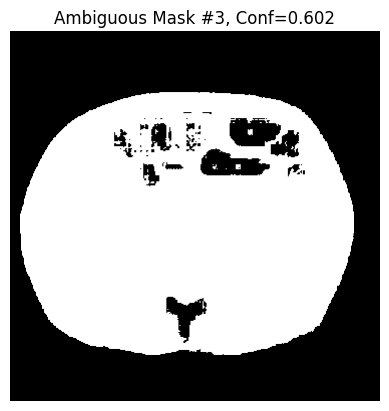

=== Ambiguous Mask Info ===
 Mask#1: Conf=0.297, Score=0.904
 Mask#2: Conf=0.926, Score=0.784
 Mask#3: Conf=0.602, Score=0.793
[Info] Best => Score=0.904
[Result] Dice Score => 0.431


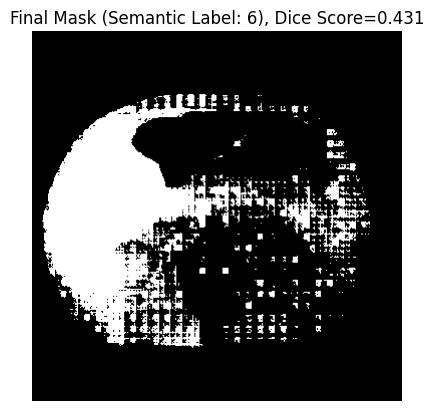


[Final Dice Scores]
 Class 1: Dice = 0.9479
 Class 2: Dice = 0.9521
 Class 3: Dice = 0.9055
 Class 6: Dice = 0.4306


In [9]:
import os
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt

########################################
# 유틸리티: 이미지 및 라벨 로드 함수
########################################
def load_image_and_label(image_path, label_path):
    """
    image_path: 입력 이미지 경로 (BGR 이미지)
    label_path: GT 마스크 경로 (Grayscale)
    
    반환:
      - rgb_image: RGB 이미지 (numpy array)
      - gt_mask: 그레이스케일 GT 마스크 (numpy array)
    """
    rgb_image = cv2.imread(image_path)
    if rgb_image is None:
        raise ValueError(f"Cannot read image from {image_path}")
    # OpenCV는 기본 BGR이므로 RGB로 변환
    rgb_image = cv2.cvtColor(rgb_image, cv2.COLOR_BGR2RGB)
    
    gt_mask = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if gt_mask is None:
        raise ValueError(f"Cannot read label from {label_path}")
    return rgb_image, gt_mask

########################################
# 0) Dice Function (평가용)
########################################
def compute_dice_score(pred_mask, gt_mask, target_label):
    """
    pred_mask, gt_mask: (H,W) 배열, 예측 및 GT에서 target_label 영역만 평가 (배경=0은 무시)
    만약 두 마스크의 크기가 다르면, gt_mask를 pred_mask 크기로 resize (최근접 보간)
    """
    if pred_mask.shape != gt_mask.shape:
        gt_mask = cv2.resize(gt_mask, (pred_mask.shape[1], pred_mask.shape[0]), interpolation=cv2.INTER_NEAREST)
    # target_label인 영역만 추출 (배경 0 무시)
    pm = (pred_mask == target_label).astype(np.uint8)
    gm = (gt_mask == target_label).astype(np.uint8)
    inter = np.sum(pm * gm)
    union = np.sum(pm) + np.sum(gm)
    if union == 0:
        return 1.0 if inter == 0 else 0.0
    dice = 2.0 * inter / union
    return dice

########################################
# 1) Prototypes 및 Class Assignment
########################################
def normalize_prototypes(prototypes, device):
    pt = torch.from_numpy(prototypes).float().to(device)
    pt = torch.nn.functional.normalize(pt, p=2, dim=-1)
    return pt

def generate_class_masks(predictor, prototypes, rgb_image):
    """
    SAM2의 image_embed를 이용하여 픽셀 단위 특징을 추출하고,
    각 프로토타입과의 코사인 유사도를 계산하여 각 클래스별 마스크를 생성합니다.
    
    반환:
      - out_masks: (N,H,W), 각 채널은 해당 프로토타입 영역 (객체=255, 배경=0)
      - class_map: 각 픽셀에 대해 가장 높은 유사도를 가진 프로토타입 인덱스
      - sim: (N,H,W) 유사도 맵
    """
    predictor.reset_predictor()
    predictor.set_image(rgb_image)
    proto_t = normalize_prototypes(prototypes, device=predictor.device)
    feats = predictor._features["image_embed"]  # (1,C,H,W)
    feats_up = torch.nn.functional.interpolate(
        feats, size=(rgb_image.shape[0], rgb_image.shape[1]),
        mode='bilinear', align_corners=False
    )[0]  # (C,H,W)
    feats_norm = torch.nn.functional.normalize(feats_up, p=2, dim=0)
    sim = torch.einsum('nc,chw->nhw', proto_t, feats_norm)  # (N,H,W)
    class_map = torch.argmax(sim, dim=0).cpu().numpy()
    num_classes = proto_t.shape[0]
    H, W = class_map.shape
    out_masks = np.zeros((num_classes, H, W), dtype=np.uint8)
    for c in range(num_classes):
        out_masks[c] = (class_map == c).astype(np.uint8) * 255
    return out_masks, class_map, sim

########################################
# 2) 개선된 앵커 좌표 결정: 유사도 기반 선택
########################################
def compute_anchor_coordinate_similarity_only(anchor_mask, sim_map):
    """
    유사도 맵(sim_map)에서, anchor_mask 영역 중 가장 높은 값을 가지는 픽셀을
    앵커 좌표로 선택합니다.
    """
    sim_region = sim_map.copy()
    sim_region[anchor_mask == 0] = 0
    idx = np.argmax(sim_region)
    H, W = sim_map.shape
    cy, cx = np.unravel_index(idx, (H, W))
    return (cx, cy)

########################################
# 3) Compute Custom Score (Global Prototype 기반 평가)
########################################
def compute_custom_score(mask_bin, prototypes, predictor, target_index, class_mask, alpha=0.5):
    """
    score = alpha * similarity + (1 - alpha) * coverage
      - coverage: ambiguous mask와 prototype 기반 class_mask의 중첩 비율
      - similarity: ambiguous mask 내부 임베딩의 평균과 target prototype의 코사인 유사도
      
    target_index: 0-based 인덱스로, prototypes[target_index]를 대상 프로토타입으로 사용
    """
    if mask_bin.shape != class_mask.shape:
        cm_ = cv2.resize(class_mask, (mask_bin.shape[1], mask_bin.shape[0]), interpolation=cv2.INTER_NEAREST)
    else:
        cm_ = class_mask
    mask_reg = (mask_bin > 0)
    class_reg = (cm_ > 0)
    area_mask = float(mask_reg.sum())
    if area_mask < 1:
        coverage = 0.0
    else:
        overlap = float(np.sum(mask_reg & class_reg))
        coverage = overlap / area_mask

    feats = predictor.get_image_embedding()
    if isinstance(feats, dict):
        feats = feats["image_embed"]  # (1,C,H,W)
    if feats.ndim == 4:
        feats = feats[0]  # (C,H,W)
    base = feats.cpu().numpy()
    C_feat, H_feat, W_feat = base.shape
    if mask_bin.shape != (H_feat, W_feat):
        mask_rs = cv2.resize(mask_bin, (W_feat, H_feat), interpolation=cv2.INTER_NEAREST)
    else:
        mask_rs = mask_bin
    region = (mask_rs > 0)
    if region.sum() < 1:
        emb_mean = np.zeros((C_feat,), dtype=np.float32)
    else:
        pix = base[:, region]
        emb_mean = pix.mean(axis=1)
    device = predictor.device
    emb_mean_t = torch.tensor(emb_mean, dtype=torch.float32, device=device)
    if isinstance(prototypes, np.ndarray):
        prototypes_t = torch.tensor(prototypes, dtype=torch.float32, device=device)
    else:
        prototypes_t = prototypes
    proto_vec = prototypes_t[target_index]
    normA = emb_mean_t / (emb_mean_t.norm() + 1e-6)
    normB = proto_vec / (proto_vec.norm() + 1e-6)
    similarity = float((normA * normB).sum().detach().cpu())
    score = alpha * similarity + (1 - alpha) * coverage
    return score

########################################
# 4) Improved Final Mask Selection: 임계값 없이 최고 score 선택
########################################
def select_final_mask_by_maxscore(ambiguous_masks, confidences, prototypes, predictor, target_index, class_mask, alpha=0.5):
    """
    각 ambiguous mask에 대해 custom score를 계산한 후, 가장 높은 score를 가진 mask를 반환합니다.
    
    target_index: 0-based 인덱스로, 해당 프로토타입을 대상 클래스로 사용
    """
    best_score = -1e9
    best_mask = None
    info_list = []
    for i, amb_mask in enumerate(ambiguous_masks):
        sc = compute_custom_score(amb_mask, prototypes, predictor, target_index, class_mask, alpha=alpha)
        info = {"mask_idx": i, "score": sc, "confidence": confidences[i]}
        info_list.append(info)
        if sc > best_score:
            best_score = sc
            best_mask = amb_mask
    print("=== Ambiguous Mask Info ===")
    for e in info_list:
        print(f" Mask#{e['mask_idx']+1}: Conf={e['confidence']:.3f}, Score={e['score']:.3f}")
    print("================================")
    print(f"[Info] Best => Score={best_score:.3f}")
    return best_mask, info_list

########################################
# 5) Main Processing Function (테스트용)
########################################
def process_image_and_evaluate(predictor, prototypes, rgb_image, gt_mask,
                               target_index, semantic_label, alpha=0.5, threshold=0.3,
                               w_dist=0.5, w_sim=0.5):
    """
    평가 함수  
      - target_index: 0-based 인덱스 (예, prototypes[target_index]가 대상 프로토타입)
      - semantic_label: 최종 예측 마스크에 부여할 실제 semantic label (예, 63, 126, …)
    
    동작 순서:
      1) Prototype 기반 Class Mask 생성  
      2) 대상 클래스의 유사도 맵을 추출하여, 유사도 기반 앵커 좌표 결정  
      3) 해당 앵커 좌표를 prompt로 ambiguous mask 후보 예측  
      4) 각 ambiguous mask에 대해 custom score를 계산하여 최고 score mask 선택  
      5) 최종 mask (binary → semantic label mask 변환)와 GT mask 간 Dice score 계산 (배경 무시)
    """
    print(f"[Info] Evaluating for target_index: {target_index}, semantic_label: {semantic_label}")

    # (0) Prototype 기반 Class Mask 생성
    masks, class_map, sim = generate_class_masks(predictor, prototypes, rgb_image)
    target_mask = masks[target_index]
    
    # (1) 대상 클래스 유사도 맵 추출
    target_sim_map = sim[target_index].float().cpu().numpy()
    
    # (2) 유사도 기반 앵커 좌표 결정
    anchor = compute_anchor_coordinate_similarity_only(target_mask, target_sim_map)
    if anchor is None:
        print("[Warn] Anchor coordinate not found, using fallback (zeros)")
        final_mask = np.zeros_like(target_mask)
        dice_val = compute_dice_score(final_mask, gt_mask, target_label=semantic_label)
        return final_mask, dice_val
    print(f"[Info] Anchor coordinate: {anchor}")
    
    # (3) 앵커 좌표 시각화
    anchor_img = rgb_image.copy()
    cv2.drawMarker(anchor_img, (anchor[0], anchor[1]), (255, 0, 0), markerType=cv2.MARKER_CROSS, thickness=2)
    plt.figure()
    plt.imshow(anchor_img)
    plt.title(f"Auto-detected Anchor Point => ({anchor[0]}, {anchor[1]})")
    plt.axis("off")
    plt.show()
    
    # (4) 앵커 마스크 시각화
    plt.figure()
    plt.imshow(target_mask, cmap="gray")
    plt.title("Anchor Mask (Prototype-based)")
    plt.axis("off")
    plt.show()
    
    # (5) ambiguous mask 예측
    point_coords = np.array([[anchor[0], anchor[1]]])
    point_labels = np.array([1])
    ambiguous_masks, confidences, _ = predictor.predict(
        point_coords=point_coords,
        point_labels=point_labels,
        multimask_output=True
    )
    for i, (am, conf) in enumerate(zip(ambiguous_masks, confidences)):
        plt.figure()
        plt.imshow(am, cmap="gray")
        plt.title(f"Ambiguous Mask #{i+1}, Conf={conf:.3f}")
        plt.axis("off")
        plt.show()
    
    # (6) 최종 마스크 선택: 임계값 없이 최고 custom score 선택
    final_mask, info_list = select_final_mask_by_maxscore(ambiguous_masks, confidences,
                                                          prototypes, predictor,
                                                          target_index, class_mask=target_mask,
                                                          alpha=alpha)
    if final_mask is None:
        print("[Warn] Final mask not selected, using empty mask")
        final_mask = np.zeros_like(target_mask)
    
    # (7) 최종 마스크를 binary (0/255)에서 semantic label mask로 변환 (객체 영역은 semantic_label, 배경은 0)
    final_mask = (final_mask > 0).astype(np.uint8) * semantic_label

    # (8) Dice Score 계산 (배경 무시, target label만 평가)
    dice_val = compute_dice_score(final_mask, gt_mask, target_label=semantic_label)
    print(f"[Result] Dice Score => {dice_val:.3f}")
    plt.figure()
    plt.imshow(final_mask, cmap="gray")
    plt.title(f"Final Mask (Semantic Label: {semantic_label}), Dice Score={dice_val:.3f}")
    plt.axis("off")
    plt.show()
    
    return final_mask, dice_val

########################################
# 6) Main (테스트 실행 코드)
########################################
if __name__ == "__main__":
    from sam2.build_sam import build_sam2
    from sam2.sam2_image_predictor import SAM2ImagePredictor

    device = "cuda" if torch.cuda.is_available() else "cpu"
    ckpt = "../checkpoints/sam2.1_hiera_large.pt"
    cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"
    sam2_model = build_sam2(cfg, ckpt, device=device)
    predictor = SAM2ImagePredictor(sam2_model)

    # Memory Bank로부터 prototype 불러오기  
    # 예: 실제 클래스 번호가 [63, 126, 189, 252]라면, Memory Bank 순서는 0~3
    mem_bank = np.load("synapse_prototypes.npz")
    sorted_keys = sorted(mem_bank.files, key=lambda x: int(x))
    prototypes = np.stack([mem_bank[k] for k in sorted_keys], axis=0)
    # 실제 semantic label 값 (예, 63, 126, 189, 252)
    actual_class_ids = [int(k) for k in sorted_keys]
    print("[Debug] Prototypes shape:", prototypes.shape, "Actual Class IDs:", actual_class_ids)

    # 테스트 이미지 및 GT 마스크 로드
    img_path = "./videos/btcv/Test/image/img0037/70.jpg"
    label_path = "./converted_masks_test1236_original/img0037/70.png"
    rgb_image, gt_mask = load_image_and_label(img_path, label_path)

    # 각 클래스에 대해 Dice Score 계산 (배경 무시)
    dice_scores = {}
    for i, actual_cls in enumerate(actual_class_ids):
        print(f"\n[Info] Evaluating for Class {actual_cls} (Memory Bank index: {i})")
        # target_index: 0-based 인덱스, semantic_label: 실제 클래스 label (예, 63 등)
        final_mask, dice_val = process_image_and_evaluate(predictor, prototypes, rgb_image, gt_mask,
                                                          target_index=i, semantic_label=actual_cls,
                                                          alpha=0.6, threshold=0.3)
        dice_scores[actual_cls] = dice_val

    print("\n[Final Dice Scores]")
    for cls, d in dice_scores.items():
        print(f" Class {cls}: Dice = {d:.4f}")


[Debug] Prototypes shape: (4, 256) Actual Class IDs: [1, 2, 3, 6]

[Info] Evaluating for Class 1 (Memory Bank index: 0)
[Info] Evaluating for target_index: 0, semantic_label: 1
[Info] Anchor #1: (np.int64(299), np.int64(217)), Anchor #2: (np.int64(307), np.int64(209))


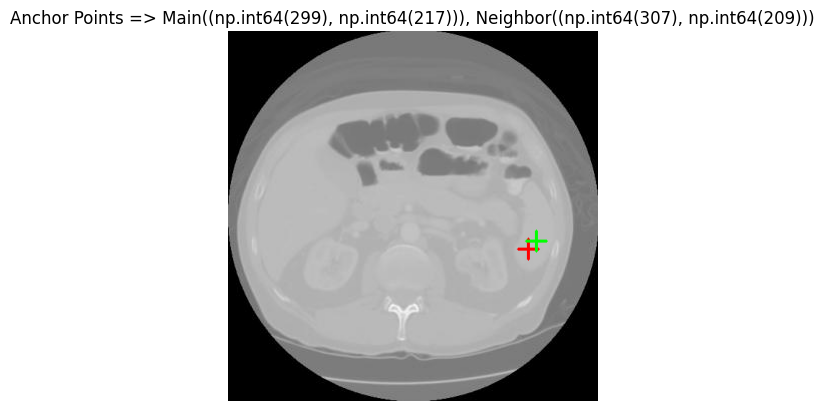

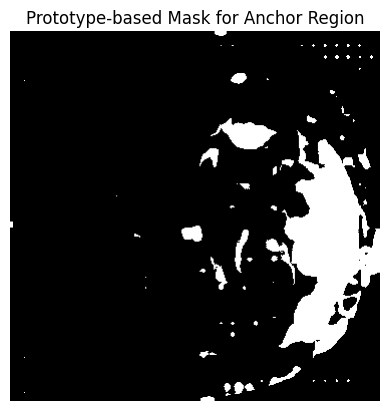

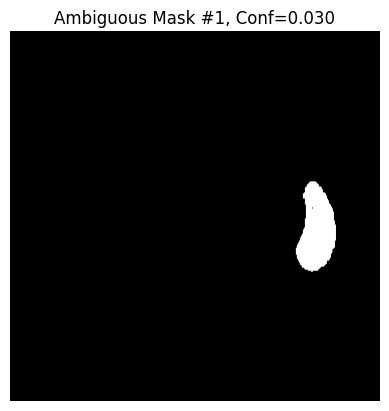

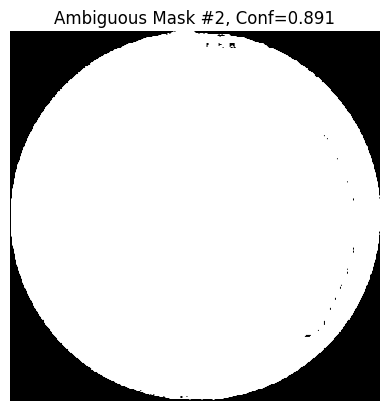

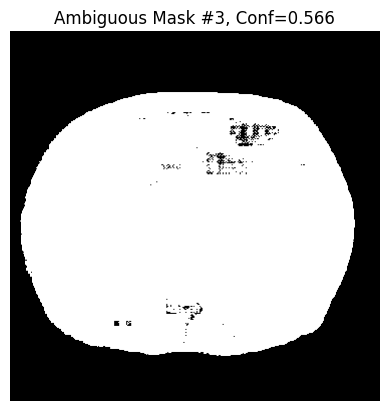

=== Ambiguous Mask Info ===
 Mask#1: Conf=0.030, Score=0.924
 Mask#2: Conf=0.891, Score=0.485
 Mask#3: Conf=0.566, Score=0.522
[Info] Best => Score=0.924
[Result] Dice Score => 0.961


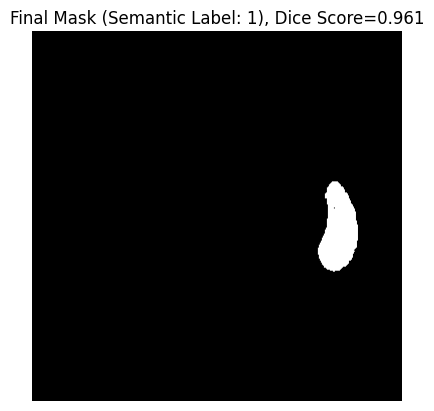


[Info] Evaluating for Class 2 (Memory Bank index: 1)
[Info] Evaluating for target_index: 1, semantic_label: 2
[Info] Anchor #1: (np.int64(112), np.int64(244)), Anchor #2: (np.int64(121), np.int64(235))


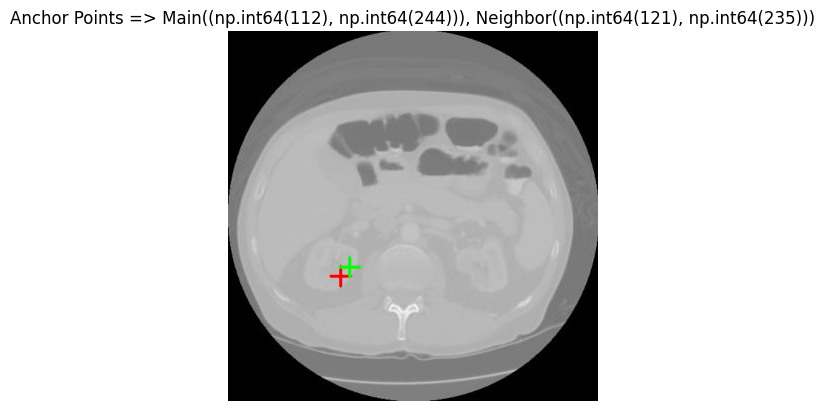

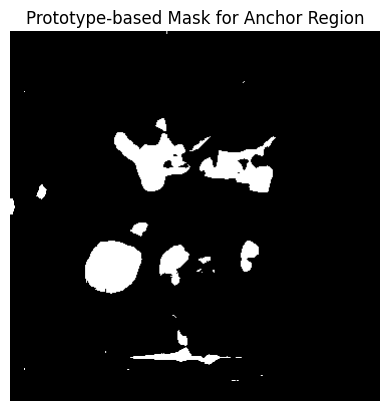

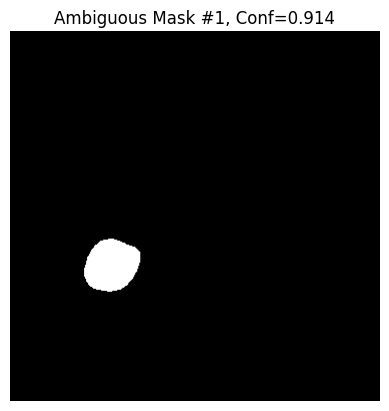

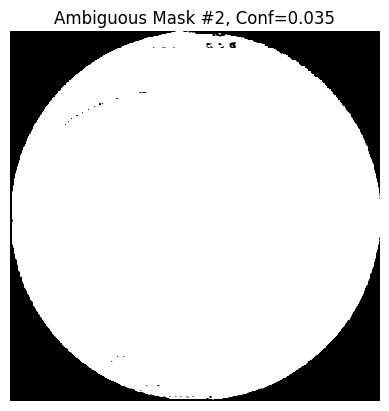

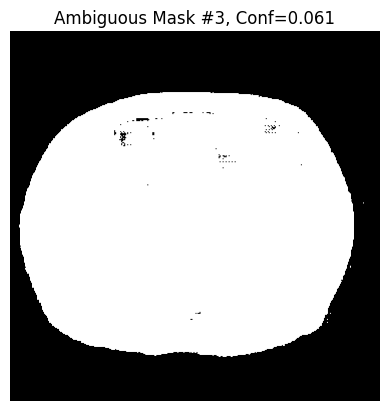

=== Ambiguous Mask Info ===
 Mask#1: Conf=0.914, Score=0.906
 Mask#2: Conf=0.035, Score=0.432
 Mask#3: Conf=0.061, Score=0.484
[Info] Best => Score=0.906
[Result] Dice Score => 0.952


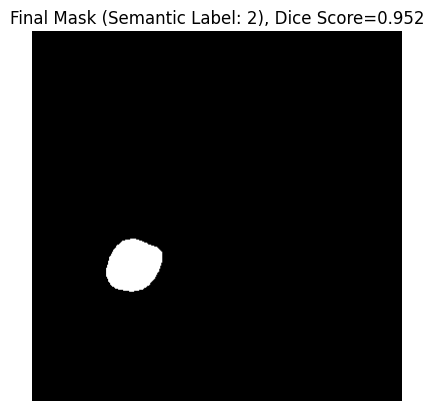


[Info] Evaluating for Class 3 (Memory Bank index: 2)
[Info] Evaluating for target_index: 2, semantic_label: 3
[Info] Anchor #1: (np.int64(264), np.int64(245)), Anchor #2: (np.int64(259), np.int64(240))


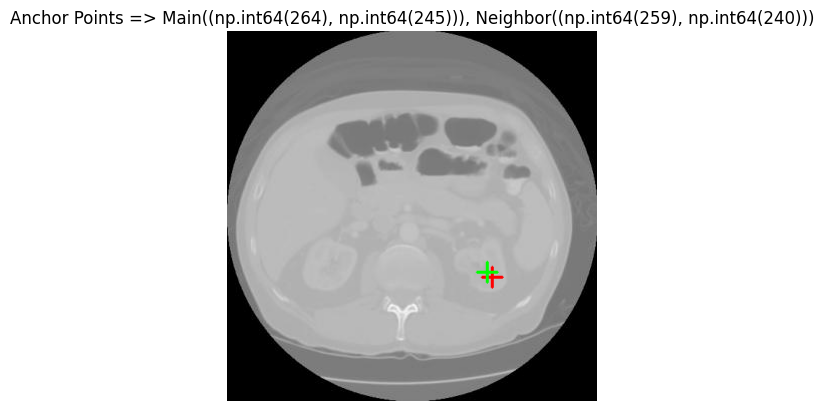

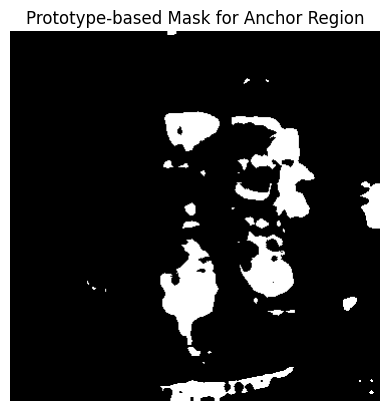

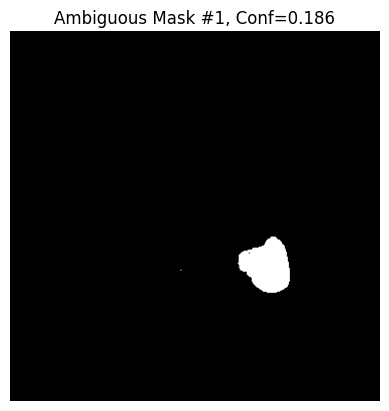

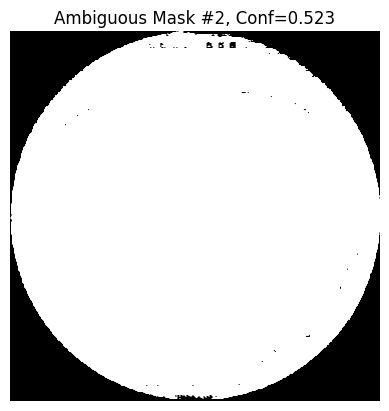

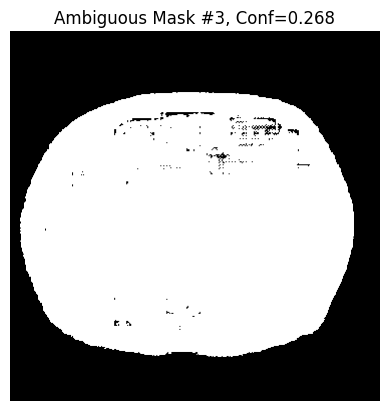

=== Ambiguous Mask Info ===
 Mask#1: Conf=0.186, Score=0.805
 Mask#2: Conf=0.523, Score=0.456
 Mask#3: Conf=0.268, Score=0.504
[Info] Best => Score=0.805
[Result] Dice Score => 0.924


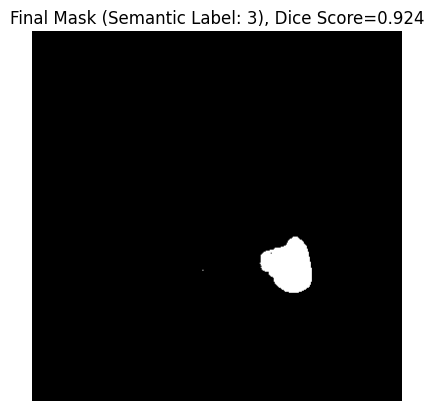


[Info] Evaluating for Class 6 (Memory Bank index: 3)
[Info] Evaluating for target_index: 3, semantic_label: 6
[Info] Anchor #1: (np.int64(79), np.int64(140)), Anchor #2: (np.int64(84), np.int64(145))


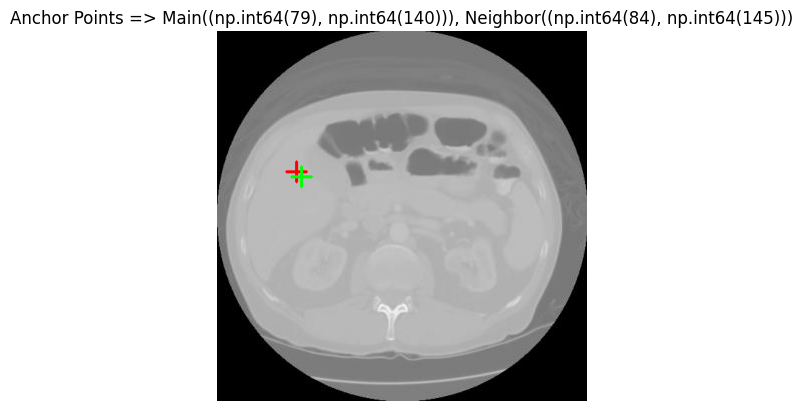

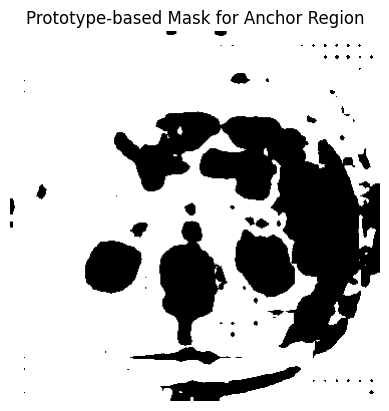

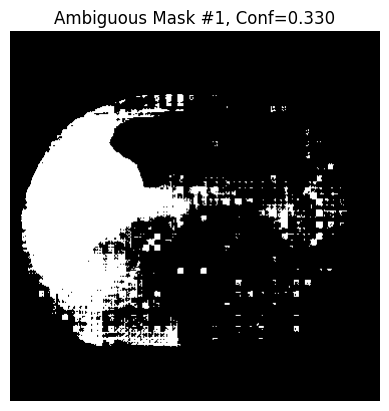

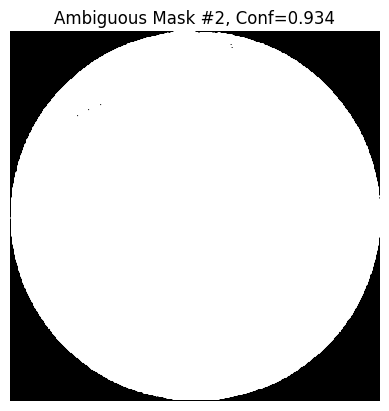

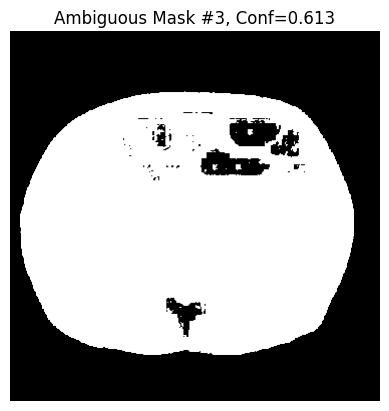

=== Ambiguous Mask Info ===
 Mask#1: Conf=0.330, Score=0.914
 Mask#2: Conf=0.934, Score=0.784
 Mask#3: Conf=0.613, Score=0.788
[Info] Best => Score=0.914
[Result] Dice Score => 0.486


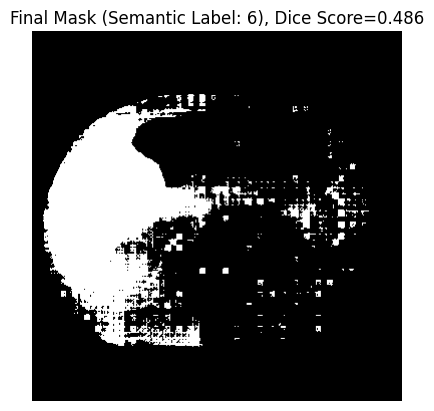


[Final Dice Scores]
 Class 1: Dice = 0.9612
 Class 2: Dice = 0.9519
 Class 3: Dice = 0.9242
 Class 6: Dice = 0.4865


In [15]:
import os
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt
import random

########################################
# 유틸리티: 이미지 및 라벨 로드 함수
########################################
def load_image_and_label(image_path, label_path):
    """
    image_path: 입력 이미지 경로 (BGR 이미지)
    label_path: GT 마스크 경로 (Grayscale)
    
    반환:
      - rgb_image: RGB 이미지 (numpy array)
      - gt_mask: 그레이스케일 GT 마스크 (numpy array)
    """
    rgb_image = cv2.imread(image_path)
    if rgb_image is None:
        raise ValueError(f"Cannot read image from {image_path}")
    # OpenCV는 기본 BGR이므로 RGB로 변환
    rgb_image = cv2.cvtColor(rgb_image, cv2.COLOR_BGR2RGB)
    
    gt_mask = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if gt_mask is None:
        raise ValueError(f"Cannot read label from {label_path}")
    return rgb_image, gt_mask

########################################
# 0) Dice Function (평가용)
########################################
def compute_dice_score(pred_mask, gt_mask, target_label):
    """
    pred_mask, gt_mask: (H,W) 배열, 예측 및 GT에서 target_label 영역만 평가 (배경=0은 무시)
    만약 두 마스크의 크기가 다르면, gt_mask를 pred_mask 크기로 resize (최근접 보간)
    """
    if pred_mask.shape != gt_mask.shape:
        gt_mask = cv2.resize(gt_mask, (pred_mask.shape[1], pred_mask.shape[0]), interpolation=cv2.INTER_NEAREST)
    # target_label인 영역만 추출 (배경 0 무시)
    pm = (pred_mask == target_label).astype(np.uint8)
    gm = (gt_mask == target_label).astype(np.uint8)
    inter = np.sum(pm * gm)
    union = np.sum(pm) + np.sum(gm)
    if union == 0:
        return 1.0 if inter == 0 else 0.0
    dice = 2.0 * inter / union
    return dice

########################################
# 1) Prototypes 및 Class Assignment
########################################
def normalize_prototypes(prototypes, device):
    pt = torch.from_numpy(prototypes).float().to(device)
    pt = torch.nn.functional.normalize(pt, p=2, dim=-1)
    return pt

def generate_class_masks(predictor, prototypes, rgb_image):
    """
    SAM2의 image_embed를 이용하여 픽셀 단위 특징을 추출하고,
    각 프로토타입과의 코사인 유사도를 계산하여 각 클래스별 마스크를 생성합니다.
    
    반환:
      - out_masks: (N,H,W), 각 채널은 해당 프로토타입 영역 (객체=255, 배경=0)
      - class_map: 각 픽셀에 대해 가장 높은 유사도를 가진 프로토타입 인덱스
      - sim: (N,H,W) 유사도 맵
    """
    predictor.reset_predictor()
    predictor.set_image(rgb_image)
    proto_t = normalize_prototypes(prototypes, device=predictor.device)
    feats = predictor._features["image_embed"]  # (1,C,H,W)
    feats_up = torch.nn.functional.interpolate(
        feats, size=(rgb_image.shape[0], rgb_image.shape[1]),
        mode='bilinear', align_corners=False
    )[0]  # (C,H,W)
    feats_norm = torch.nn.functional.normalize(feats_up, p=2, dim=0)
    sim = torch.einsum('nc,chw->nhw', proto_t, feats_norm)  # (N,H,W)
    class_map = torch.argmax(sim, dim=0).cpu().numpy()
    num_classes = proto_t.shape[0]
    H, W = class_map.shape
    out_masks = np.zeros((num_classes, H, W), dtype=np.uint8)
    for c in range(num_classes):
        out_masks[c] = (class_map == c).astype(np.uint8) * 255
    return out_masks, class_map, sim

########################################
# (구버전) 2) 단일 점 추출 함수 (참고용)
########################################
def compute_anchor_coordinate_similarity_only(anchor_mask, sim_map):
    """
    유사도 맵(sim_map)에서, anchor_mask 영역 중 가장 높은 값을 가지는 픽셀을
    앵커 좌표로 선택합니다.
    """
    sim_region = sim_map.copy()
    sim_region[anchor_mask == 0] = 0
    idx = np.argmax(sim_region)
    H, W = sim_map.shape
    cy, cx = np.unravel_index(idx, (H, W))
    return (cx, cy)

########################################
# (E) Multiscale Patch 기반 앵커 포인트
########################################
def multiscale_patch_similarity_center(sim_map, predicted_mask, scales=[3,5,7], method='mean'):
    """
    predicted_mask 영역 내에서 여러 스케일의 boxFilter를 통해
    유사도 맵을 집계하고, 그 중 가장 값이 높은 지점(cx, cy)를 반환
    """
    H, W = sim_map.shape
    mask_region = (predicted_mask > 0)

    # mask 영역 밖은 -inf로 설정
    aggregated_score = np.full((H, W), -np.inf, dtype=np.float32)
    aggregated_score[mask_region] = 0.0

    sim_map_float = sim_map.astype(np.float32)
    sim_map_masked = sim_map_float * mask_region.astype(np.float32)

    for s in scales:
        sim_sum = cv2.boxFilter(sim_map_masked, ddepth=-1, ksize=(s, s))
        valid_count = cv2.boxFilter(mask_region.astype(np.float32), ddepth=-1, ksize=(s, s))

        patch_mean = sim_sum / (valid_count + 1e-6)

        if method == 'mean':
            # 누적
            aggregated_score[mask_region] += patch_mean[mask_region]
        elif method == 'max':
            # 최대값 업데이트
            aggregated_score[mask_region] = np.maximum(aggregated_score[mask_region], patch_mean[mask_region])
        else:
            raise ValueError("method must be 'mean' or 'max'")

    idx = np.argmax(aggregated_score)
    cy, cx = np.unravel_index(idx, (H, W))
    return (cx, cy)  # (x, y)

########################################
# (F) 다중 점 생성: anchor 근처 점 구하기
########################################
def get_neighbor_point(anchor, shape, min_offset=5, max_offset=10):
    """
    anchor=(x,y)에 대해 최소 min_offset 이상 떨어진 neighbor 점을 반환.
    단, 이미지 범위를 벗어나지 않도록 조정.

    - min_offset: 최소 거리 (픽셀 단위)
    - max_offset: 최대 거리 (픽셀 단위)
    """
    x, y = anchor
    H, W = shape[:2]

    # 랜덤하게 거리(offset) 및 이동 방향 선택
    offset = random.randint(min_offset, max_offset)
    direction = random.choice([(1, 1), (1, -1), (-1, 1), (-1, -1)])  # 대각선 이동 방향

    # 새로운 neighbor 위치 계산
    nx = x + (offset * direction[0])
    ny = y + (offset * direction[1])

    # 이미지 범위 내로 조정 (clamping)
    nx = min(W-1, max(0, nx))
    ny = min(H-1, max(0, ny))

    return (nx, ny)
########################################
# 3) Compute Custom Score (Global Prototype 기반 평가)
########################################
def compute_custom_score(mask_bin, prototypes, predictor, target_index, class_mask, alpha=0.5):
    """
    score = alpha * similarity + (1 - alpha) * coverage
      - coverage: ambiguous mask와 prototype 기반 class_mask의 중첩 비율
      - similarity: ambiguous mask 내부 임베딩의 평균과 target prototype의 코사인 유사도
      
    target_index: 0-based 인덱스로, prototypes[target_index]를 대상 프로토타입으로 사용
    """
    if mask_bin.shape != class_mask.shape:
        cm_ = cv2.resize(class_mask, (mask_bin.shape[1], mask_bin.shape[0]), interpolation=cv2.INTER_NEAREST)
    else:
        cm_ = class_mask
    mask_reg = (mask_bin > 0)
    class_reg = (cm_ > 0)
    area_mask = float(mask_reg.sum())
    if area_mask < 1:
        coverage = 0.0
    else:
        overlap = float(np.sum(mask_reg & class_reg))
        coverage = overlap / area_mask

    feats = predictor.get_image_embedding()
    if isinstance(feats, dict):
        feats = feats["image_embed"]  # (1,C,H,W)
    if feats.ndim == 4:
        feats = feats[0]  # (C,H,W)
    base = feats.cpu().numpy()
    C_feat, H_feat, W_feat = base.shape
    if mask_bin.shape != (H_feat, W_feat):
        mask_rs = cv2.resize(mask_bin, (W_feat, H_feat), interpolation=cv2.INTER_NEAREST)
    else:
        mask_rs = mask_bin
    region = (mask_rs > 0)
    if region.sum() < 1:
        emb_mean = np.zeros((C_feat,), dtype=np.float32)
    else:
        pix = base[:, region]
        emb_mean = pix.mean(axis=1)
    device = predictor.device
    emb_mean_t = torch.tensor(emb_mean, dtype=torch.float32, device=device)
    if isinstance(prototypes, np.ndarray):
        prototypes_t = torch.tensor(prototypes, dtype=torch.float32, device=device)
    else:
        prototypes_t = prototypes
    proto_vec = prototypes_t[target_index]
    normA = emb_mean_t / (emb_mean_t.norm() + 1e-6)
    normB = proto_vec / (proto_vec.norm() + 1e-6)
    similarity = float((normA * normB).sum().detach().cpu())
    score = alpha * similarity + (1 - alpha) * coverage
    return score

########################################
# 4) Improved Final Mask Selection: 임계값 없이 최고 score 선택
########################################
def select_final_mask_by_maxscore(ambiguous_masks, confidences, prototypes, predictor, target_index, class_mask, alpha=0.5):
    """
    각 ambiguous mask에 대해 custom score를 계산한 후, 가장 높은 score를 가진 mask를 반환합니다.
    
    target_index: 0-based 인덱스로, 해당 프로토타입을 대상 클래스로 사용
    """
    best_score = -1e9
    best_mask = None
    info_list = []
    for i, amb_mask in enumerate(ambiguous_masks):
        sc = compute_custom_score(amb_mask, prototypes, predictor, target_index, class_mask, alpha=alpha)
        info = {"mask_idx": i, "score": sc, "confidence": confidences[i]}
        info_list.append(info)
        if sc > best_score:
            best_score = sc
            best_mask = amb_mask
    print("=== Ambiguous Mask Info ===")
    for e in info_list:
        print(f" Mask#{e['mask_idx']+1}: Conf={e['confidence']:.3f}, Score={e['score']:.3f}")
    print("================================")
    print(f"[Info] Best => Score={best_score:.3f}")
    return best_mask, info_list

########################################
# 5) Main Processing Function (테스트용)
########################################
def process_image_and_evaluate(predictor, prototypes, rgb_image, gt_mask,
                               target_index, semantic_label, alpha=0.5, threshold=0.3,
                               w_dist=0.5, w_sim=0.5):
    """
    평가 함수  
      - target_index: 0-based 인덱스 (예, prototypes[target_index]가 대상 프로토타입)
      - semantic_label: 최종 예측 마스크에 부여할 실제 semantic label (예, 63, 126, …)
    
    동작 순서:
      1) Prototype 기반 Class Mask 생성  
      2) 대상 클래스의 유사도 맵을 이용해 '멀티스케일 boxFilter'로 앵커 포인트 결정 + 이웃 포인트 생성  
      3) 2개의 점(point prompt)으로 ambiguous mask 후보 예측  
      4) 각 ambiguous mask에 대해 custom score 계산 후 최고 score mask 선택  
      5) 최종 mask (binary → semantic label mask 변환)와 GT mask 간 Dice score 계산 (배경 무시)
    """
    print(f"[Info] Evaluating for target_index: {target_index}, semantic_label: {semantic_label}")

    # (0) Prototype 기반 Class Mask 생성
    masks, class_map, sim = generate_class_masks(predictor, prototypes, rgb_image)
    target_mask = masks[target_index]
    
    # (1) 대상 클래스 유사도 맵 추출
    target_sim_map = sim[target_index].float().cpu().numpy()
    
    # (2) '멀티스케일 boxFilter'로 앵커 포인트 결정 + 이웃 포인트
   # (2) '멀티스케일 boxFilter'로 앵커 포인트 결정 + 이웃 포인트
    anchor_main = multiscale_patch_similarity_center(target_sim_map, target_mask, scales=[3,5,7], method='mean')
    if anchor_main is None:
        print("[Warn] Anchor coordinate not found, using fallback (zeros)")
        final_mask = np.zeros_like(target_mask)
        dice_val = compute_dice_score(final_mask, gt_mask, target_label=semantic_label)
        return final_mask, dice_val

    # 새롭게 개선된 get_neighbor_point() 함수 사용
    anchor_neighbor = get_neighbor_point(anchor_main, rgb_image.shape, min_offset=5, max_offset=10)
    print(f"[Info] Anchor #1: {anchor_main}, Anchor #2: {anchor_neighbor}")

    # (2-1) 앵커 시각화
    anchor_img = rgb_image.copy()
    cv2.drawMarker(anchor_img, anchor_main, (255, 0, 0), markerType=cv2.MARKER_CROSS, thickness=2)  # 🔴 Anchor
    cv2.drawMarker(anchor_img, anchor_neighbor, (0, 255, 0), markerType=cv2.MARKER_CROSS, thickness=2)  # 🟢 Neighbor
    plt.figure()
    plt.imshow(anchor_img)
    plt.title(f"Anchor Points => Main({anchor_main}), Neighbor({anchor_neighbor})")
    plt.axis("off")
    plt.show()

    
    # (2-2) 앵커 마스크 시각화
    plt.figure()
    plt.imshow(target_mask, cmap="gray")
    plt.title("Prototype-based Mask for Anchor Region")
    plt.axis("off")
    plt.show()
    
    # (3) ambiguous mask 예측 (2개 점)
    point_coords = np.array([
        [anchor_main[0], anchor_main[1]],
        [anchor_neighbor[0], anchor_neighbor[1]]
    ])
    point_labels = np.array([1, 1])  # 같은 클래스(Positive)
    ambiguous_masks, confidences, _ = predictor.predict(
        point_coords=point_coords,
        point_labels=point_labels,
        multimask_output=True
    )
    for i, (am, conf) in enumerate(zip(ambiguous_masks, confidences)):
        plt.figure()
        plt.imshow(am, cmap="gray")
        plt.title(f"Ambiguous Mask #{i+1}, Conf={conf:.3f}")
        plt.axis("off")
        plt.show()
    
    # (4) 최종 마스크 선택: 임계값 없이 최고 custom score
    final_mask, info_list = select_final_mask_by_maxscore(ambiguous_masks, confidences,
                                                          prototypes, predictor,
                                                          target_index, class_mask=target_mask,
                                                          alpha=alpha)
    if final_mask is None:
        print("[Warn] Final mask not selected, using empty mask")
        final_mask = np.zeros_like(target_mask)
    
    # (5) 최종 마스크 (binary → semantic label mask)
    final_mask = (final_mask > 0).astype(np.uint8) * semantic_label

    # (6) Dice Score 계산
    dice_val = compute_dice_score(final_mask, gt_mask, target_label=semantic_label)
    print(f"[Result] Dice Score => {dice_val:.3f}")
    
    plt.figure()
    plt.imshow(final_mask, cmap="gray")
    plt.title(f"Final Mask (Semantic Label: {semantic_label}), Dice Score={dice_val:.3f}")
    plt.axis("off")
    plt.show()
    
    return final_mask, dice_val

########################################
# 6) Main (테스트 실행 코드)
########################################
if __name__ == "__main__":
    from sam2.build_sam import build_sam2
    from sam2.sam2_image_predictor import SAM2ImagePredictor

    device = "cuda" if torch.cuda.is_available() else "cpu"
    ckpt = "../checkpoints/sam2.1_hiera_large.pt"
    cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"
    sam2_model = build_sam2(cfg, ckpt, device=device)
    predictor = SAM2ImagePredictor(sam2_model)

    # Memory Bank로부터 prototype 불러오기  
    # 예: 실제 클래스 번호가 [63, 126, 189, 252]라면, Memory Bank 순서는 0~3
    mem_bank = np.load("synapse_prototypes.npz")
    sorted_keys = sorted(mem_bank.files, key=lambda x: int(x))
    prototypes = np.stack([mem_bank[k] for k in sorted_keys], axis=0)
    # 실제 semantic label 값 (예, 63, 126, 189, 252)
    actual_class_ids = [int(k) for k in sorted_keys]
    print("[Debug] Prototypes shape:", prototypes.shape, "Actual Class IDs:", actual_class_ids)

    # 테스트 이미지 및 GT 마스크 로드
    img_path = "./videos/btcv/Test/image/img0037/70.jpg"
    label_path = "./converted_masks_test1236_original/img0037/70.png"
    rgb_image, gt_mask = load_image_and_label(img_path, label_path)

    # 각 클래스에 대해 Dice Score 계산 (배경 무시)
    dice_scores = {}
    for i, actual_cls in enumerate(actual_class_ids):
        print(f"\n[Info] Evaluating for Class {actual_cls} (Memory Bank index: {i})")
        final_mask, dice_val = process_image_and_evaluate(predictor, prototypes, rgb_image, gt_mask,
                                                          target_index=i, semantic_label=actual_cls,
                                                          alpha=0.6, threshold=0.3)
        dice_scores[actual_cls] = dice_val

    print("\n[Final Dice Scores]")
    for cls, d in dice_scores.items():
        print(f" Class {cls}: Dice = {d:.4f}")


## 전체 test 데이터 성능 

In [13]:
import os
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt

########################################
# (A) 데이터 로드 유틸
########################################

def load_image_and_label(image_path, label_path):
    """
    image_path: (BGR) JPG 이미지 경로
    label_path: (GRAY) PNG 라벨 경로

    반환:
      - rgb_image(H,W,3), np.uint8, RGB
      - gt_mask(H,W), np.uint8, Gray
    """
    bgr = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if bgr is None:
        raise FileNotFoundError(f"Cannot read image {image_path}")
    rgb_image = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

    gt_mask = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if gt_mask is None:
        raise FileNotFoundError(f"Cannot read label {label_path}")

    return rgb_image, gt_mask

########################################
# (B) Dice 계산 함수
########################################

def compute_dice_per_class(pred_map, gt_map, cls_val):
    """
    ✅ GT에 없는 클래스 예측을 배경으로 설정하여 Dice=1.0 보장
    
    pred_map, gt_map: (H,W), 각각 semantic label( ex. 0=배경, 63등 ) 
    cls_val: 평가 대상 클래스 (ex. 63,126,189,252)
    """
    # shape mismatch 시, gt_map을 pred_map 크기에 맞춤
    if pred_map.shape != gt_map.shape:
        gt_map = cv2.resize(gt_map, (pred_map.shape[1], pred_map.shape[0]),
                            interpolation=cv2.INTER_NEAREST)

    # pred_map에서 cls_val인 영역만 => pred_mask
    pred_mask = (pred_map == cls_val).astype(np.uint8) * 255
    # gt_map에서 cls_val인 영역만 => gt_mask
    gt_mask   = (gt_map  == cls_val).astype(np.uint8) * 255

    # ✅ GT에 해당 클래스가 없으면 => pred_map에서 cls_val을 전부 0(배경)으로 변경 => dice=1
    if np.sum(gt_mask) == 0:
        pred_map[pred_map == cls_val] = 0
        return 1.0

    pm = (pred_mask > 0).astype(np.uint8)
    gm = (gt_mask   > 0).astype(np.uint8)
    inter = np.sum(pm * gm)
    union = np.sum(pm) + np.sum(gm)
    if union == 0:
        return 1.0 if inter == 0 else 0.0
    dice = 2.0 * inter / union
    return dice

########################################
# (C) Prototype-based Mask 생성 로직
########################################

def normalize_prototypes(prototypes, device):
    pt = torch.from_numpy(prototypes).float().to(device)
    pt = torch.nn.functional.normalize(pt, p=2, dim=-1)
    return pt

def generate_class_masks(predictor, prototypes, rgb_image):
    """
    SAM2 image_embed와 prototype 간 cosine similarity => class_map => out_masks
    """
    predictor.reset_predictor()
    predictor.set_image(rgb_image)

    proto_t = normalize_prototypes(prototypes, predictor.device)
    feats = predictor._features["image_embed"]  # (1,C,H,W)
    feats_up = torch.nn.functional.interpolate(
        feats, size=(rgb_image.shape[0], rgb_image.shape[1]),
        mode='bilinear', align_corners=False
    )[0]  # (C,H,W)

    feats_norm = torch.nn.functional.normalize(feats_up, p=2, dim=0)
    sim = torch.einsum('nc,chw->nhw', proto_t, feats_norm)  # (N,H,W)
    class_map = sim.argmax(dim=0).cpu().numpy()

    num_classes = proto_t.shape[0]
    H, W = class_map.shape
    out_masks = np.zeros((num_classes, H, W), dtype=np.uint8)
    for c in range(num_classes):
        out_masks[c] = (class_map == c).astype(np.uint8) * 255

    return out_masks, class_map, sim

def compute_custom_score(mask_bin, prototypes, predictor, target_index, class_mask, alpha=0.5):
    """
    coverage + similarity를 종합한 custom score
    """
    # coverage
    if mask_bin.shape != class_mask.shape:
        cm_ = cv2.resize(class_mask, (mask_bin.shape[1], mask_bin.shape[0]),
                         interpolation=cv2.INTER_NEAREST)
    else:
        cm_ = class_mask
    mask_reg = (mask_bin > 0)
    class_reg = (cm_ > 0)
    area_mask = float(mask_reg.sum())
    coverage = 0.0
    if area_mask > 0:
        overlap = float(np.sum(mask_reg & class_reg))
        coverage = overlap / area_mask

    # similarity
    feats = predictor.get_image_embedding()
    if isinstance(feats, dict):
        feats = feats["image_embed"]
    if feats.ndim == 4:
        feats = feats[0]  # (C,H,W)
    base = feats.cpu().numpy()
    C_feat, H_feat, W_feat = base.shape

    if mask_bin.shape != (H_feat, W_feat):
        mask_rs = cv2.resize(mask_bin, (W_feat, H_feat), interpolation=cv2.INTER_NEAREST)
    else:
        mask_rs = mask_bin

    region = (mask_rs > 0)
    if region.sum() < 1:
        emb_mean = np.zeros((C_feat,), dtype=np.float32)
    else:
        pix = base[:, region]
        emb_mean = pix.mean(axis=1)

    device = predictor.device
    emb_mean_t = torch.tensor(emb_mean, dtype=torch.float32, device=device)
    if isinstance(prototypes, np.ndarray):
        proto_t = torch.tensor(prototypes, dtype=torch.float32, device=device)
    else:
        proto_t = prototypes

    proto_vec = proto_t[target_index]
    normA = emb_mean_t / (emb_mean_t.norm() + 1e-6)
    normB = proto_vec / (proto_vec.norm() + 1e-6)
    similarity = float((normA * normB).sum().detach().cpu())
    
    score = alpha * similarity + (1 - alpha) * coverage
    return score

def compute_anchor_coordinate_similarity_only(anchor_mask, sim_map):
    sim_region = sim_map.copy()
    sim_region[anchor_mask == 0] = 0
    idx = np.argmax(sim_region)
    H, W = sim_map.shape
    cy, cx = np.unravel_index(idx, (H, W))
    return (cx, cy)

def select_final_mask_by_maxscore(ambiguous_masks, confidences, prototypes, predictor,
                                  target_index, class_mask, alpha=0.5):
    """
    - 각 ambiguous mask에 대해 custom score를 계산 후, 최적 마스크 선택
    - 단, custom score < score_threshold이면 배경(0) 마스크 반환
    """
    best_score = -1e9
    best_mask = None
    info_list = []

    for i, amb_mask in enumerate(ambiguous_masks):
        sc = compute_custom_score(amb_mask, prototypes, predictor, target_index, class_mask, alpha=alpha)
        info_list.append({"mask_idx": i, "score": sc, "confidence": confidences[i]})

        if sc > best_score:
            best_score = sc
            best_mask = amb_mask

    # ✅ Best Score가 임계값 이하이면, 배경(0) 마스크 출력


    print(f"[Info] Best Score: {best_score:.3f}, selected mask")
    return best_mask, info_list


def predict_mask_for_one_class(predictor, prototypes, rgb_image, target_index, alpha=0.5):
    """
    한 클래스 인덱스(0-based)에 대해:
    1) prototype → class_mask
    2) class_mask → anchor
    3) anchor → ambiguous mask
    4) ambiguous mask 중 best 선택 (단, score < threshold면 배경)
    """
    # 1) prototype → class_mask
    masks, class_map, sim = generate_class_masks(predictor, prototypes, rgb_image)
    target_mask = masks[target_index]

    # 2) 유사도 맵 → anchor
    target_sim_map = sim[target_index].float().cpu().numpy()
    anchor = compute_anchor_coordinate_similarity_only(target_mask, target_sim_map)
    if anchor is None:
        return np.zeros_like(target_mask)

    # 3) SAM2 ambiguous mask 예측
    point_coords = np.array([[anchor[0], anchor[1]]])
    point_labels = np.array([1])
    amb_masks, confidences, _ = predictor.predict(
        point_coords=point_coords,
        point_labels=point_labels,
        multimask_output=True
    )

    # 4) 최적 마스크 선택 (Threshold 적용)
    best_mask, _ = select_final_mask_by_maxscore(amb_masks, confidences,
                                                 prototypes, predictor,
                                                 target_index, target_mask,
                                                 alpha=alpha)

    if best_mask is None:
        best_mask = np.zeros_like(target_mask)

    return best_mask


def predict_final_labelmap(predictor, prototypes, rgb_image, actual_class_ids, alpha=0.5):
    """
    - 각 클래스(0..N-1)에 대해 predict_mask_for_one_class → final_map
    - score_threshold 이하의 마스크는 배경(0) 처리
    """
    H, W = rgb_image.shape[:2]
    final_map = np.zeros((H, W), dtype=np.uint8)  # 배경=0

    for i, cls_val in enumerate(actual_class_ids):
        best_mask = predict_mask_for_one_class(predictor, prototypes, rgb_image,
                                               target_index=i, alpha=alpha)
        final_map[best_mask > 0] = cls_val  # 배경=0, 객체=cls_val

    return final_map


########################################
# 7) 데이터셋 평가 (전체 환자/슬라이스) + 결과 저장
########################################
def evaluate_dataset(
    image_root, label_root, predictor, prototypes, actual_class_ids, output_dir, alpha=0.5, score_threshold=0.6
):
    """
    1) final labelmap 예측
    2) 각 클래스 dice 계산 (compute_dice_per_class)
    3) 결과 마스크 저장
    4) 모든 슬라이스 종료 후 클래스별 평균 dice, overall dice 출력
    """
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    dice_scores_dict = {cls: [] for cls in actual_class_ids}
    total_slices = 0

    patient_ids = sorted([d for d in os.listdir(image_root) if os.path.isdir(os.path.join(image_root, d))])
    for pid in patient_ids:
        pid_img_dir = os.path.join(image_root, pid, "T2SPIR", "DICOM_anon")
        pid_lbl_dir = os.path.join(label_root, pid, "T2SPIR", "Ground")
        if not (os.path.isdir(pid_img_dir) and os.path.isdir(pid_lbl_dir)):
            continue

        pid_out_dir = os.path.join(output_dir, pid)
        os.makedirs(pid_out_dir, exist_ok=True)

        image_files = sorted(f for f in os.listdir(pid_img_dir) if f.lower().endswith(".jpg"))
        if not image_files:
            continue

        for img_name in image_files:
            img_path = os.path.join(pid_img_dir, img_name)
            lbl_path = os.path.join(pid_lbl_dir, os.path.splitext(img_name)[0] + ".png")
            if not os.path.isfile(lbl_path):
                print(f"[Warn] no label for {img_path}")
                continue

            try:
                rgb_image, gt_mask = load_image_and_label(img_path, lbl_path)
            except Exception as e:
                print(f"[Error] {e}")
                continue
            total_slices += 1

            print(f"\n[Slice] patient={pid}, {img_name}")

            # ✅ score_threshold 적용
            final_map = predict_final_labelmap(predictor, prototypes, rgb_image,
                                               actual_class_ids, alpha=alpha, score_threshold=score_threshold)

            dice_map_for_eval = final_map.copy()
            for cls_val in actual_class_ids:
                dsc = compute_dice_per_class(dice_map_for_eval, gt_mask, cls_val)
                dice_scores_dict[cls_val].append(dsc)
                print(f"  Class {cls_val}, Dice={dsc:.4f}")

            out_name = os.path.splitext(img_name)[0] + "_pred.png"
            out_path = os.path.join(pid_out_dir, out_name)
            cv2.imwrite(out_path, final_map)
            print(f"  => Saved mask => {out_path}")

    print("\n[Summary: Class-wise Dice]")
    mean_scores = {}
    for cls_val, sc_list in dice_scores_dict.items():
        mean_val = float(np.mean(sc_list)) if len(sc_list) else 0.0
        mean_scores[cls_val] = mean_val
        print(f" Class {cls_val}: {mean_val:.4f} over {len(sc_list)} slices")

    all_scores = [s for sc_list in dice_scores_dict.values() for s in sc_list]
    overall_mean = np.mean(all_scores) if len(all_scores) else 0.0
    print(f"\n[Overall Mean Dice] = {overall_mean:.4f} over {total_slices} slices")

########################
# main
########################
if __name__=="__main__":
    device = "cuda" if torch.cuda.is_available() else "cpu"
    sam2_ckpt = "../checkpoints/sam2.1_hiera_large.pt"
    model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"

    sam2_model = build_sam2(model_cfg, sam2_ckpt, device=device)
    predictor = SAM2ImagePredictor(sam2_model)
    print(f"[Info] SAM2 loaded on {device}")

    mem_bank = np.load("chaos_prototypes_com.npz")
    sorted_keys = sorted(mem_bank.files, key=lambda x: int(x))
    prototypes = np.stack([mem_bank[k] for k in sorted_keys], axis=0)
    actual_class_ids = [int(k) for k in sorted_keys]

    image_root = "./videos/CHAOS_Train_Sets/Train_Sets/MR"
    label_root = "./videos/CHAOS_Train_Sets/Train_Sets/MR"
    output_dir = "./chaos_predict_output4-1"

    evaluate_dataset(image_root, label_root, predictor, prototypes,
                     actual_class_ids, output_dir, alpha=0.6, score_threshold=0.6)



[Info] SAM2 loaded on cuda

[Slice] patient=1, IMG-0002-00001.jpg
[Info] Best Score: 0.846, selected mask
[Info] Best Score: 0.689, selected mask
[Info] Best Score: 0.783, selected mask
[Info] Best Score: 0.576, applying threshold -> Background Mask
  Class 63, Dice=1.0000
  Class 126, Dice=1.0000
  Class 189, Dice=1.0000
  Class 252, Dice=1.0000
  => Saved mask => ./chaos_predict_output4-1/1/IMG-0002-00001_pred.png

[Slice] patient=1, IMG-0002-00002.jpg
[Info] Best Score: 0.817, selected mask
[Info] Best Score: 0.453, applying threshold -> Background Mask
[Info] Best Score: 0.594, applying threshold -> Background Mask
[Info] Best Score: 0.508, applying threshold -> Background Mask
  Class 63, Dice=1.0000
  Class 126, Dice=1.0000
  Class 189, Dice=1.0000
  Class 252, Dice=1.0000
  => Saved mask => ./chaos_predict_output4-1/1/IMG-0002-00002_pred.png

[Slice] patient=1, IMG-0002-00003.jpg
[Info] Best Score: 0.810, selected mask
[Info] Best Score: 0.515, applying threshold -> Background M

### negative point 추가

In [52]:
import os
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt

########################################
# (A) 데이터 로드 유틸
########################################

def load_image_and_label(image_path, label_path):
    """
    image_path: (BGR) JPG 이미지 경로
    label_path: (GRAY) PNG 라벨 경로

    반환:
      - rgb_image(H,W,3), np.uint8, RGB
      - gt_mask(H,W), np.uint8, Gray
    """
    bgr = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if bgr is None:
        raise FileNotFoundError(f"Cannot read image {image_path}")
    rgb_image = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

    gt_mask = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if gt_mask is None:
        raise FileNotFoundError(f"Cannot read label {label_path}")

    return rgb_image, gt_mask

########################################
# (B) Dice 계산 함수
########################################

def compute_dice_per_class(pred_map, gt_map, cls_val):
    """
    GT에 없는 클래스 예측은 배경으로 설정하여 Dice=1.0 보장

    pred_map, gt_map: (H,W), 각각 semantic label (예: 0=배경, 63 등)
    cls_val: 평가 대상 클래스 (예: 63,126,189,252)
    """
    # 크기가 안맞으면 gt_map을 pred_map 크기로 리사이즈
    if pred_map.shape != gt_map.shape:
        gt_map = cv2.resize(gt_map, (pred_map.shape[1], pred_map.shape[0]),
                            interpolation=cv2.INTER_NEAREST)

    pred_mask = (pred_map == cls_val).astype(np.uint8) * 255
    gt_mask   = (gt_map  == cls_val).astype(np.uint8) * 255

    # GT에 해당 클래스가 전혀 없으면 => 예측도 배경으로 처리 => Dice=1
    if np.sum(gt_mask) == 0:
        pred_map[pred_map == cls_val] = 0
        return 1.0

    pm = (pred_mask > 0).astype(np.uint8)
    gm = (gt_mask   > 0).astype(np.uint8)
    inter = np.sum(pm * gm)
    union = np.sum(pm) + np.sum(gm)
    if union == 0:
        return 1.0 if inter == 0 else 0.0

    dice = 2.0 * inter / union
    return dice

########################################
# (C) Prototype-based Mask 생성 로직
########################################

def normalize_prototypes(prototypes, device):
    pt = torch.from_numpy(prototypes).float().to(device)
    pt = torch.nn.functional.normalize(pt, p=2, dim=-1)
    return pt

def generate_class_masks(predictor, prototypes, rgb_image):
    """
    SAM2 image_embed와 prototype 간 cosine similarity => class_map => out_masks
    """
    predictor.reset_predictor()
    predictor.set_image(rgb_image)

    proto_t = normalize_prototypes(prototypes, predictor.device)
    feats = predictor._features["image_embed"]  # (1,C,H,W)
    feats_up = torch.nn.functional.interpolate(
        feats, size=(rgb_image.shape[0], rgb_image.shape[1]),
        mode='bilinear', align_corners=False
    )[0]  # (C,H,W)

    feats_norm = torch.nn.functional.normalize(feats_up, p=2, dim=0)
    sim = torch.einsum('nc,chw->nhw', proto_t, feats_norm)  # (N,H,W)
    class_map = sim.argmax(dim=0).cpu().numpy()

    num_classes = proto_t.shape[0]
    H, W = class_map.shape
    out_masks = np.zeros((num_classes, H, W), dtype=np.uint8)
    for c in range(num_classes):
        out_masks[c] = (class_map == c).astype(np.uint8) * 255

    return out_masks, class_map, sim

########################################
# (C2) coverage & similarity 혼합 스코어
########################################

def compute_custom_score(mask_bin, prototypes, predictor, target_index, class_mask, alpha=0.5):
    """
    coverage + similarity를 종합한 custom score
    alpha: similarity 가중치 비율 (0~1)
    """
    # coverage 계산
    if mask_bin.shape != class_mask.shape:
        cm_ = cv2.resize(class_mask, (mask_bin.shape[1], mask_bin.shape[0]),
                         interpolation=cv2.INTER_NEAREST)
    else:
        cm_ = class_mask

    mask_reg = (mask_bin > 0)
    class_reg = (cm_ > 0)
    area_mask = float(mask_reg.sum())
    coverage = 0.0
    if area_mask > 0:
        overlap = float(np.sum(mask_reg & class_reg))
        coverage = overlap / area_mask

    # similarity 계산
    feats = predictor.get_image_embedding()
    if isinstance(feats, dict):
        feats = feats["image_embed"]
    if feats.ndim == 4:
        feats = feats[0]  # (C,H,W)
    base = feats.cpu().numpy()
    C_feat, H_feat, W_feat = base.shape

    if mask_bin.shape != (H_feat, W_feat):
        mask_rs = cv2.resize(mask_bin, (W_feat, H_feat), interpolation=cv2.INTER_NEAREST)
    else:
        mask_rs = mask_bin

    region = (mask_rs > 0)
    if region.sum() < 1:
        emb_mean = np.zeros((C_feat,), dtype=np.float32)
    else:
        pix = base[:, region]
        emb_mean = pix.mean(axis=1)

    device = predictor.device
    emb_mean_t = torch.tensor(emb_mean, dtype=torch.float32, device=device)
    if isinstance(prototypes, np.ndarray):
        proto_t = torch.tensor(prototypes, dtype=torch.float32, device=device)
    else:
        proto_t = prototypes

    proto_vec = proto_t[target_index]
    normA = emb_mean_t / (emb_mean_t.norm() + 1e-6)
    normB = proto_vec / (proto_vec.norm() + 1e-6)
    similarity = float((normA * normB).sum().detach().cpu())

    score = alpha * similarity + (1 - alpha) * coverage
    return score

########################################
# (D) Multi-Scale Patch Similarity Prompting
########################################

def multiscale_patch_similarity_center(sim_map, predicted_mask, scales=[3,5,7], method='mean'):
    """
    predicted_mask 내 각 픽셀에 대해,
    scales에 지정된 patch 크기에서의 sim_map 평균을 구해 누적/최대화.
    최종 점수가 가장 높은 픽셀(x, y)을 anchor로 반환.
    """
    H, W = sim_map.shape
    mask_region = (predicted_mask > 0)

    # mask 밖은 -inf로 초기화
    aggregated_score = np.full((H, W), -np.inf, dtype=np.float32)
    # mask 내부는 0으로 초기화
    aggregated_score[mask_region] = 0.0

    sim_map_float = sim_map.astype(np.float32)
    sim_map_masked = sim_map_float * mask_region.astype(np.float32)

    for s in scales:
        sim_sum = cv2.boxFilter(sim_map_masked, ddepth=-1, ksize=(s, s))
        valid_count = cv2.boxFilter(mask_region.astype(np.float32), ddepth=-1, ksize=(s, s))

        patch_mean = sim_sum / (valid_count + 1e-6)

        if method == 'mean':
            aggregated_score[mask_region] += patch_mean[mask_region]
        elif method == 'max':
            aggregated_score[mask_region] = np.maximum(aggregated_score[mask_region], patch_mean[mask_region])
        else:
            raise ValueError("method must be 'mean' or 'max'")

    idx = np.argmax(aggregated_score)
    cy, cx = np.unravel_index(idx, (H, W))
    return (cx, cy)

########################################
# (E) 최종 mask 선택 & SAM2 예측
########################################

def select_final_mask_by_maxscore(ambiguous_masks, confidences, prototypes, predictor,
                                  target_index, class_mask,
                                  alpha=0.5, score_threshold=0.5):
    """
    ambiguous_masks 각각에 대해 custom_score 계산 후 최대값을 선택.
    만약 최대 score < score_threshold이면 배경(0) 반환
    """
    best_score = -1e9
    best_mask = None
    info_list = []

    for i, amb_mask in enumerate(ambiguous_masks):
        sc = compute_custom_score(amb_mask, prototypes, predictor, target_index, class_mask, alpha=alpha)
        info_list.append({"mask_idx": i, "score": sc, "confidence": confidences[i]})

        if sc > best_score:
            best_score = sc
            best_mask = amb_mask

    if best_score < score_threshold:
        print(f"[Info] Best Score: {best_score:.3f}, < threshold => Background Mask")
        return np.zeros_like(class_mask), info_list

    print(f"[Info] Best Score: {best_score:.3f}, selected mask")
    return best_mask, info_list

########################################
# (F) "Predict mask for one class" 개선
########################################

def predict_mask_for_one_class(predictor, prototypes, rgb_image, target_index,
                               alpha=0.5, score_threshold=0.5,
                               patch_scales=[3,5,7], patch_method='mean',
                               sim_threshold=0.0,
                               apply_morph=True):
    """
    1) prototype -> predicted_mask, sim_map
    2) low-sim 영역 필터링(sim_threshold), morphological filtering(옵션)
    3) Multi-Scale Patch Similarity로 anchor
    4) SAM2 ambiguous mask 예측 -> custom_score 기반 mask 선택
    """
    # 1) predicted_mask
    masks, class_map, sim = generate_class_masks(predictor, prototypes, rgb_image)
    predicted_mask = masks[target_index]         # (H,W), 255 or 0
    sim_map = sim[target_index].float().cpu().numpy()  # (H,W)

    # 2-1) 유사도 임계값 적용
    #      너무 낮은 유사도를 보이는 픽셀은 배경 취급
    if sim_threshold > 0.0:
        thr_mask = (sim_map >= sim_threshold)  # True/False
        predicted_mask = ((predicted_mask > 0) & thr_mask).astype(np.uint8) * 255

    # 2-2) morphological filtering (optional)
    #      작은 잡음을 제거하거나 구멍을 메우기 위해 opening→closing 연속 수행
    if apply_morph:
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
        # Opening (erode → dilate)
        predicted_mask = cv2.morphologyEx(predicted_mask, cv2.MORPH_OPEN, kernel)
        # Closing (dilate → erode)
        predicted_mask = cv2.morphologyEx(predicted_mask, cv2.MORPH_CLOSE, kernel)

    # predicted_mask가 모두 0이면 종료
    if np.sum(predicted_mask) == 0:
        return np.zeros_like(predicted_mask)

    # 3) Multi-Scale Patch Similarity로 anchor
    anchor = multiscale_patch_similarity_center(sim_map, predicted_mask,
                                                scales=patch_scales,
                                                method=patch_method)
    print(f"[Prompt] anchor={anchor}, sim_threshold={sim_threshold}, morph={apply_morph}")

    # 4) SAM2 ambiguous mask 예측
    point_coords = np.array([[anchor[0], anchor[1]]], dtype=np.int32)
    point_labels = np.array([1], dtype=np.int32)
    amb_masks, confidences, _ = predictor.predict(
        point_coords=point_coords,
        point_labels=point_labels,
        multimask_output=True
    )

    # coverage+similarity로 최적 mask 선택
    best_mask, _ = select_final_mask_by_maxscore(
        amb_masks, confidences,
        prototypes, predictor,
        target_index, predicted_mask,
        alpha=alpha, score_threshold=score_threshold
    )

    if best_mask is None:
        best_mask = np.zeros_like(predicted_mask)
    return best_mask

########################################
# (G) 전체 클래스에 대해 최종 labelmap 생성
########################################

def predict_final_labelmap(predictor, prototypes, rgb_image, actual_class_ids,
                           alpha=0.5, score_threshold=0.6,
                           patch_scales=[3,5,7], patch_method='mean',
                           sim_threshold=0.0,
                           apply_morph=True):
    """
    각 클래스별로 predict_mask_for_one_class 수행 후, 배경 외 영역을 final_map에 할당
    """
    H, W = rgb_image.shape[:2]
    final_map = np.zeros((H, W), dtype=np.uint8)

    for idx, cls_val in enumerate(actual_class_ids):
        best_mask = predict_mask_for_one_class(
            predictor, prototypes, rgb_image, target_index=idx,
            alpha=alpha, score_threshold=score_threshold,
            patch_scales=patch_scales, patch_method=patch_method,
            sim_threshold=sim_threshold,
            apply_morph=apply_morph
        )
        final_map[best_mask > 0] = cls_val
    return final_map

########################################
# (H) 데이터셋 평가
########################################

def evaluate_dataset(image_root, label_root,
                     predictor, prototypes, actual_class_ids,
                     output_dir,
                     alpha=0.5, score_threshold=0.6,
                     patch_scales=[3,5,7], patch_method='mean',
                     sim_threshold=0.0,
                     apply_morph=True):
    """
    1) 환자별/슬라이스별로 predict_final_labelmap
    2) Dice 계산
    3) 결과 저장
    4) 전체 요약
    """
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    dice_scores_dict = {cls: [] for cls in actual_class_ids}
    total_slices = 0

    patient_ids = sorted([d for d in os.listdir(image_root) if os.path.isdir(os.path.join(image_root, d))])
    for pid in patient_ids:
        pid_img_dir = os.path.join(image_root, pid, "T2SPIR", "DICOM_anon")
        pid_lbl_dir = os.path.join(label_root, pid, "T2SPIR", "Ground")
        if not (os.path.isdir(pid_img_dir) and os.path.isdir(pid_lbl_dir)):
            continue

        pid_out_dir = os.path.join(output_dir, pid)
        os.makedirs(pid_out_dir, exist_ok=True)

        image_files = sorted([f for f in os.listdir(pid_img_dir) if f.lower().endswith(".jpg")])
        if not image_files:
            continue

        for img_name in image_files:
            img_path = os.path.join(pid_img_dir, img_name)
            lbl_path = os.path.join(pid_lbl_dir, os.path.splitext(img_name)[0] + ".png")
            if not os.path.isfile(lbl_path):
                print(f"[Warn] no label for {img_path}")
                continue

            try:
                rgb_image, gt_mask = load_image_and_label(img_path, lbl_path)
            except Exception as e:
                print(f"[Error] {e}")
                continue
            total_slices += 1

            print(f"\n[Slice] patient={pid}, {img_name}")

            # 최종 세그멘테이션
            final_map = predict_final_labelmap(
                predictor, prototypes, rgb_image, actual_class_ids,
                alpha=alpha, score_threshold=score_threshold,
                patch_scales=patch_scales, patch_method=patch_method,
                sim_threshold=sim_threshold,
                apply_morph=apply_morph
            )

            # Dice 계산
            for cls_val in actual_class_ids:
                dsc = compute_dice_per_class(final_map, gt_mask, cls_val)
                dice_scores_dict[cls_val].append(dsc)
                print(f"  Class {cls_val}, Dice={dsc:.4f}")

            out_name = os.path.splitext(img_name)[0] + "_pred.png"
            out_path = os.path.join(pid_out_dir, out_name)
            cv2.imwrite(out_path, final_map)
            print(f"  => Saved mask => {out_path}")

    print("\n[Summary: Class-wise Dice]")
    mean_scores = {}
    for cls_val, sc_list in dice_scores_dict.items():
        mean_val = float(np.mean(sc_list)) if len(sc_list) else 0.0
        mean_scores[cls_val] = mean_val
        print(f" Class {cls_val}: {mean_val:.4f} over {len(sc_list)} slices")

    all_scores = [s for sc_list in dice_scores_dict.values() for s in sc_list]
    overall_mean = np.mean(all_scores) if len(all_scores) else 0.0
    print(f"\n[Overall Mean Dice] = {overall_mean:.4f} over {total_slices} slices")


########################
# main
########################
if __name__=="__main__":
    device = "cuda" if torch.cuda.is_available() else "cpu"
    sam2_ckpt = "../checkpoints/sam2.1_hiera_large.pt"
    model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"

    # 예시: build_sam2, SAM2ImagePredictor는 실제 구현에 맞춰 사용
    sam2_model = build_sam2(model_cfg, sam2_ckpt, device=device)
    predictor = SAM2ImagePredictor(sam2_model)
    print(f"[Info] SAM2 loaded on {device}")

    # 클래스별 프로토타입 로드
    mem_bank = np.load("global_prototypes.npz")
    sorted_keys = sorted(mem_bank.files, key=lambda x: int(x))
    prototypes = np.stack([mem_bank[k] for k in sorted_keys], axis=0)
    actual_class_ids = [int(k) for k in sorted_keys]

    # 이미지 & 라벨 경로
    image_root = "./videos/CHAOS_Train_Sets/Train_Sets/MR"
    label_root = "./videos/CHAOS_Train_Sets/Train_Sets/MR"
    output_dir = "/chaos_predict_output_global"

    # 하이퍼 파라미터 (필요시 조절)
    alpha = 0.6               # similarity vs coverage 비중
    score_threshold = 0.6     # custom score 최저 임계값
    patch_scales = [3,5,7]    # 멀티스케일 패치 크기
    patch_method = 'mean'     # 'mean' or 'max'
    sim_threshold = 0.2       # 유사도 맵 임계값 (0 ~ 1 사이 권장)
    apply_morph = True        # morphological filtering 적용 여부

    evaluate_dataset(
        image_root, label_root,
        predictor, prototypes, actual_class_ids,
        output_dir,
        alpha=alpha,
        score_threshold=score_threshold,
        patch_scales=patch_scales,
        patch_method=patch_method,
        sim_threshold=sim_threshold,
        apply_morph=apply_morph
    )


[Info] SAM2 loaded on cuda

[Slice] patient=1, IMG-0002-00001.jpg
[Prompt] anchor=(np.int64(65), np.int64(122)), sim_threshold=0.2, morph=True
[Info] Best Score: 0.859, selected mask
[Prompt] anchor=(np.int64(128), np.int64(152)), sim_threshold=0.2, morph=True
[Info] Best Score: 0.692, selected mask
[Prompt] anchor=(np.int64(129), np.int64(95)), sim_threshold=0.2, morph=True
[Info] Best Score: 0.783, selected mask
[Prompt] anchor=(np.int64(193), np.int64(150)), sim_threshold=0.2, morph=True
[Info] Best Score: 0.625, selected mask
  Class 63, Dice=1.0000
  Class 126, Dice=1.0000
  Class 189, Dice=1.0000
  Class 252, Dice=1.0000
  => Saved mask => ./chaos_predict_output_global/1/IMG-0002-00001_pred.png

[Slice] patient=1, IMG-0002-00002.jpg
[Prompt] anchor=(np.int64(36), np.int64(158)), sim_threshold=0.2, morph=True
[Info] Best Score: 0.789, selected mask
[Prompt] anchor=(np.int64(127), np.int64(148)), sim_threshold=0.2, morph=True
[Info] Best Score: 0.695, selected mask
[Prompt] anchor=

KeyboardInterrupt: 

In [11]:
import os
import time
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt

########################################
# (A) 데이터 로드 유틸
########################################

def load_image_and_label(image_path, label_path):
    bgr = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if bgr is None:
        raise FileNotFoundError(f"Cannot read image {image_path}")
    rgb_image = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

    gt_mask = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if gt_mask is None:
        raise FileNotFoundError(f"Cannot read label {label_path}")

    return rgb_image, gt_mask

########################################
# (B) Dice 계산 함수
########################################

def compute_dice_per_class(pred_map, gt_map, cls_val):
    if pred_map.shape != gt_map.shape:
        gt_map = cv2.resize(gt_map, (pred_map.shape[1], pred_map.shape[0]),
                            interpolation=cv2.INTER_NEAREST)

    pred_mask = (pred_map == cls_val).astype(np.uint8) * 255
    gt_mask   = (gt_map  == cls_val).astype(np.uint8) * 255

    if np.sum(gt_mask) == 0:
        pred_map[pred_map == cls_val] = 0
        return 1.0

    pm = (pred_mask > 0).astype(np.uint8)
    gm = (gt_mask   > 0).astype(np.uint8)
    inter = np.sum(pm * gm)
    union = np.sum(pm) + np.sum(gm)
    if union == 0:
        return 1.0 if inter == 0 else 0.0
    dice = 2.0 * inter / union
    return dice

########################################
# (C) Prototype-based Mask 생성
########################################

def normalize_prototypes(prototypes, device):
    pt = torch.from_numpy(prototypes).float().to(device)
    pt = torch.nn.functional.normalize(pt, p=2, dim=-1)
    return pt

def generate_class_masks(predictor, prototypes, rgb_image):
    predictor.reset_predictor()
    predictor.set_image(rgb_image)

    proto_t = normalize_prototypes(prototypes, predictor.device)
    feats = predictor._features["image_embed"]  # (1,C,H,W)
    feats_up = torch.nn.functional.interpolate(
        feats, size=(rgb_image.shape[0], rgb_image.shape[1]),
        mode='bilinear', align_corners=False
    )[0]  # (C,H,W)

    feats_norm = torch.nn.functional.normalize(feats_up, p=2, dim=0)
    sim = torch.einsum('nc,chw->nhw', proto_t, feats_norm)  # (N,H,W)
    class_map = sim.argmax(dim=0).cpu().numpy()

    num_classes = proto_t.shape[0]
    H, W = class_map.shape
    out_masks = np.zeros((num_classes, H, W), dtype=np.uint8)
    for c in range(num_classes):
        out_masks[c] = (class_map == c).astype(np.uint8) * 255

    return out_masks, class_map, sim

########################################
# coverage & similarity 혼합 스코어
########################################

def compute_custom_score(mask_bin, prototypes, predictor, target_index, class_mask, alpha=0.5):
    if mask_bin.shape != class_mask.shape:
        cm_ = cv2.resize(class_mask, (mask_bin.shape[1], mask_bin.shape[0]),
                         interpolation=cv2.INTER_NEAREST)
    else:
        cm_ = class_mask

    mask_reg = (mask_bin > 0)
    class_reg = (cm_ > 0)
    area_mask = float(mask_reg.sum())
    coverage = 0.0
    if area_mask > 0:
        overlap = float(np.sum(mask_reg & class_reg))
        coverage = overlap / area_mask

    feats = predictor.get_image_embedding()
    if isinstance(feats, dict):
        feats = feats["image_embed"]
    if feats.ndim == 4:
        feats = feats[0]  # (C,H,W)
    base = feats.cpu().numpy()
    C_feat, H_feat, W_feat = base.shape

    if mask_bin.shape != (H_feat, W_feat):
        mask_rs = cv2.resize(mask_bin, (W_feat, H_feat), interpolation=cv2.INTER_NEAREST)
    else:
        mask_rs = mask_bin

    region = (mask_rs > 0)
    if region.sum() < 1:
        emb_mean = np.zeros((C_feat,), dtype=np.float32)
    else:
        pix = base[:, region]
        emb_mean = pix.mean(axis=1)

    device = predictor.device
    emb_mean_t = torch.tensor(emb_mean, dtype=torch.float32, device=device)
    if isinstance(prototypes, np.ndarray):
        proto_t = torch.tensor(prototypes, dtype=torch.float32, device=device)
    else:
        proto_t = prototypes

    proto_vec = proto_t[target_index]
    normA = emb_mean_t / (emb_mean_t.norm() + 1e-6)
    normB = proto_vec / (proto_vec.norm() + 1e-6)
    similarity = float((normA * normB).sum().detach().cpu())

    score = alpha * similarity + (1 - alpha) * coverage
    return score

########################################
# Multi-Scale Patch Similarity Prompting
########################################

def multiscale_patch_similarity_center(sim_map, predicted_mask, scales=[3,5,7], method='mean'):
    H, W = sim_map.shape
    mask_region = (predicted_mask > 0)

    aggregated_score = np.full((H, W), -np.inf, dtype=np.float32)
    aggregated_score[mask_region] = 0.0

    sim_map_float = sim_map.astype(np.float32)
    sim_map_masked = sim_map_float * mask_region.astype(np.float32)

    for s in scales:
        sim_sum = cv2.boxFilter(sim_map_masked, ddepth=-1, ksize=(s, s))
        valid_count = cv2.boxFilter(mask_region.astype(np.float32), ddepth=-1, ksize=(s, s))

        patch_mean = sim_sum / (valid_count + 1e-6)

        if method == 'mean':
            aggregated_score[mask_region] += patch_mean[mask_region]
        elif method == 'max':
            aggregated_score[mask_region] = np.maximum(aggregated_score[mask_region], patch_mean[mask_region])
        else:
            raise ValueError("method must be 'mean' or 'max'")

    idx = np.argmax(aggregated_score)
    cy, cx = np.unravel_index(idx, (H, W))
    return (cx, cy)

########################################
# ambiguous mask -> 최종 mask 선택
########################################

def select_final_mask_by_maxscore(ambiguous_masks, confidences, prototypes, predictor,
                                  target_index, class_mask,
                                  alpha=0.5, score_threshold=0.5):
    best_score = -1e9
    best_mask = None
    info_list = []

    for i, amb_mask in enumerate(ambiguous_masks):
        sc = compute_custom_score(amb_mask, prototypes, predictor, target_index, class_mask, alpha=alpha)
        info_list.append({"mask_idx": i, "score": sc, "confidence": confidences[i]})

        if sc > best_score:
            best_score = sc
            best_mask = amb_mask

    if best_score < score_threshold:
        print(f"[Info] Best Score: {best_score:.3f}, < threshold => Background Mask")
        return np.zeros_like(class_mask), info_list

    print(f"[Info] Best Score: {best_score:.3f}, selected mask")
    return best_mask, info_list

########################################
# "Predict mask for one class"
########################################

def predict_mask_for_one_class(predictor, prototypes, rgb_image, target_index,
                               alpha=0.5, score_threshold=0.5,
                               patch_scales=[3,5,7], patch_method='mean',
                               sim_threshold=0.0,
                               apply_morph=True):
    masks, class_map, sim = generate_class_masks(predictor, prototypes, rgb_image)
    predicted_mask = masks[target_index]
    sim_map = sim[target_index].float().cpu().numpy()

    if sim_threshold > 0.0:
        thr_mask = (sim_map >= sim_threshold)
        predicted_mask = ((predicted_mask > 0) & thr_mask).astype(np.uint8) * 255

    if apply_morph:
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
        predicted_mask = cv2.morphologyEx(predicted_mask, cv2.MORPH_OPEN, kernel)
        predicted_mask = cv2.morphologyEx(predicted_mask, cv2.MORPH_CLOSE, kernel)

    if np.sum(predicted_mask) == 0:
        return np.zeros_like(predicted_mask)

    anchor = multiscale_patch_similarity_center(sim_map, predicted_mask, scales=patch_scales, method=patch_method)
    print(f"[Prompt] anchor={anchor}, sim_threshold={sim_threshold}, morph={apply_morph}")

    point_coords = np.array([[anchor[0], anchor[1]]], dtype=np.int32)
    point_labels = np.array([1], dtype=np.int32)
    amb_masks, confidences, _ = predictor.predict(
        point_coords=point_coords,
        point_labels=point_labels,
        multimask_output=True
    )

    best_mask, _ = select_final_mask_by_maxscore(
        amb_masks, confidences,
        prototypes, predictor,
        target_index, predicted_mask,
        alpha=alpha, score_threshold=score_threshold
    )

    if best_mask is None:
        best_mask = np.zeros_like(predicted_mask)
    return best_mask

########################################
# 전체 클래스 -> 최종 labelmap
########################################

def predict_final_labelmap(predictor, prototypes, rgb_image, actual_class_ids,
                           alpha=0.5, score_threshold=0.6,
                           patch_scales=[3,5,7], patch_method='mean',
                           sim_threshold=0.0,
                           apply_morph=True):
    H, W = rgb_image.shape[:2]
    final_map = np.zeros((H, W), dtype=np.uint8)

    for idx, cls_val in enumerate(actual_class_ids):
        best_mask = predict_mask_for_one_class(
            predictor, prototypes, rgb_image, target_index=idx,
            alpha=alpha, score_threshold=score_threshold,
            patch_scales=patch_scales, patch_method=patch_method,
            sim_threshold=sim_threshold,
            apply_morph=apply_morph
        )
        final_map[best_mask > 0] = cls_val
    return final_map

########################################
# 데이터셋 평가 + Inference Time 측정
########################################

def evaluate_dataset(image_root, label_root,
                     predictor, prototypes, actual_class_ids,
                     output_dir,
                     alpha=0.5, score_threshold=0.6,
                     patch_scales=[3,5,7], patch_method='mean',
                     sim_threshold=0.0,
                     apply_morph=True):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    dice_scores_dict = {cls: [] for cls in actual_class_ids}
    total_slices = 0

    # inference time 측정 관련
    slice_inference_times = []

    patient_ids = sorted([d for d in os.listdir(image_root) if os.path.isdir(os.path.join(image_root, d))])
    for pid in patient_ids:
        pid_img_dir = os.path.join(image_root, pid, "T2SPIR", "DICOM_anon")
        pid_lbl_dir = os.path.join(label_root, pid, "T2SPIR", "Ground")
        if not (os.path.isdir(pid_img_dir) and os.path.isdir(pid_lbl_dir)):
            continue

        pid_out_dir = os.path.join(output_dir, pid)
        os.makedirs(pid_out_dir, exist_ok=True)

        image_files = sorted([f for f in os.listdir(pid_img_dir) if f.lower().endswith(".jpg")])
        if not image_files:
            continue

        for img_name in image_files:
            img_path = os.path.join(pid_img_dir, img_name)
            lbl_path = os.path.join(pid_lbl_dir, os.path.splitext(img_name)[0] + ".png")
            if not os.path.isfile(lbl_path):
                print(f"[Warn] no label for {img_path}")
                continue

            try:
                rgb_image, gt_mask = load_image_and_label(img_path, lbl_path)
            except Exception as e:
                print(f"[Error] {e}")
                continue
            total_slices += 1

            print(f"\n[Slice] patient={pid}, {img_name}")

            # ---- Inference Time 측정 시작 ----
            start_time = time.time()

            final_map = predict_final_labelmap(
                predictor, prototypes, rgb_image, actual_class_ids,
                alpha=alpha, score_threshold=score_threshold,
                patch_scales=patch_scales, patch_method=patch_method,
                sim_threshold=sim_threshold,
                apply_morph=apply_morph
            )

            end_time = time.time()
            slice_time = (end_time - start_time) * 1000.0  # ms 단위
            slice_inference_times.append(slice_time)
            # ---- Inference Time 측정 끝 ----

            for cls_val in actual_class_ids:
                dsc = compute_dice_per_class(final_map, gt_mask, cls_val)
                dice_scores_dict[cls_val].append(dsc)
                print(f"  Class {cls_val}, Dice={dsc:.4f}")

            out_name = os.path.splitext(img_name)[0] + "_pred.png"
            out_path = os.path.join(pid_out_dir, out_name)
            cv2.imwrite(out_path, final_map)
            print(f"  => Saved mask => {out_path}")

    print("\n[Summary: Class-wise Dice]")
    mean_scores = {}
    for cls_val, sc_list in dice_scores_dict.items():
        mean_val = float(np.mean(sc_list)) if len(sc_list) else 0.0
        mean_scores[cls_val] = mean_val
        print(f" Class {cls_val}: {mean_val:.4f} over {len(sc_list)} slices")

    all_scores = [s for sc_list in dice_scores_dict.values() for s in sc_list]
    overall_mean = np.mean(all_scores) if len(all_scores) else 0.0
    print(f"\n[Overall Mean Dice] = {overall_mean:.4f} over {total_slices} slices")

    # ---- 전체 슬라이스 평균 추론 시간 ----
    if total_slices > 0:
        avg_inference_time = np.mean(slice_inference_times)
        print(f"[Inference Time] Avg per slice = {avg_inference_time:.2f} ms")
    else:
        print("[Inference Time] No valid slices found")

########################
# main
########################
if __name__=="__main__":
    import time  # time 모듈 import

    device = "cuda" if torch.cuda.is_available() else "cpu"
    sam2_ckpt = "../checkpoints/sam2.1_hiera_large.pt"
    model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"

    # 예시: build_sam2, SAM2ImagePredictor는 실제 구현에 맞춰 사용
    sam2_model = build_sam2(model_cfg, sam2_ckpt, device=device)
    predictor = SAM2ImagePredictor(sam2_model)
    print(f"[Info] SAM2 loaded on {device}")

    # 클래스별 프로토타입 로드
    mem_bank = np.load("multi_image_prototypes_3pairs.npz")
    sorted_keys = sorted(mem_bank.files, key=lambda x: int(x))
    prototypes = np.stack([mem_bank[k] for k in sorted_keys], axis=0)
    actual_class_ids = [int(k) for k in sorted_keys]

    # 이미지 & 라벨 경로
    image_root = "./videos/CHAOS_Train_Sets/Train_Sets/MR"
    label_root = "./videos/CHAOS_Train_Sets/Train_Sets/MR"
    output_dir = "./chaos_predict_output_3p"

    # 하이퍼 파라미터
    alpha = 0.6
    score_threshold = 0.6
    patch_scales = [3,5,7]
    patch_method = 'mean'
    sim_threshold = 0.2
    apply_morph = True

    evaluate_dataset(
        image_root, label_root,
        predictor, prototypes, actual_class_ids,
        output_dir,
        alpha=alpha,
        score_threshold=score_threshold,
        patch_scales=patch_scales,
        patch_method=patch_method,
        sim_threshold=sim_threshold,
        apply_morph=apply_morph
    )



[Info] SAM2 loaded on cuda

[Slice] patient=1, IMG-0002-00001.jpg
[Prompt] anchor=(np.int64(61), np.int64(149)), sim_threshold=0.2, morph=True
[Info] Best Score: 0.815, selected mask
[Prompt] anchor=(np.int64(75), np.int64(101)), sim_threshold=0.2, morph=True
[Info] Best Score: 0.524, < threshold => Background Mask
[Prompt] anchor=(np.int64(177), np.int64(156)), sim_threshold=0.2, morph=True
[Info] Best Score: 0.624, selected mask
[Prompt] anchor=(np.int64(193), np.int64(150)), sim_threshold=0.2, morph=True
[Info] Best Score: 0.589, < threshold => Background Mask
  Class 63, Dice=1.0000
  Class 126, Dice=1.0000
  Class 189, Dice=1.0000
  Class 252, Dice=1.0000
  => Saved mask => ./chaos_predict_output_3p/1/IMG-0002-00001_pred.png

[Slice] patient=1, IMG-0002-00002.jpg
[Prompt] anchor=(np.int64(40), np.int64(157)), sim_threshold=0.2, morph=True
[Info] Best Score: 0.834, selected mask
[Prompt] anchor=(np.int64(74), np.int64(103)), sim_threshold=0.2, morph=True
[Info] Best Score: 0.734, s

### 점 1개+confidence

In [15]:
import os
import time
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt

########################################
# (A) 데이터 로드 유틸
########################################

def load_image_and_label(image_path, label_path):
    bgr = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if bgr is None:
        raise FileNotFoundError(f"Cannot read image {image_path}")
    rgb_image = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

    gt_mask = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if gt_mask is None:
        raise FileNotFoundError(f"Cannot read label {label_path}")

    return rgb_image, gt_mask

########################################
# (B) Dice 계산 함수
########################################

def compute_dice_per_class(pred_map, gt_map, cls_val):
    if pred_map.shape != gt_map.shape:
        gt_map = cv2.resize(gt_map, (pred_map.shape[1], pred_map.shape[0]),
                            interpolation=cv2.INTER_NEAREST)

    pred_mask = (pred_map == cls_val).astype(np.uint8) * 255
    gt_mask   = (gt_map  == cls_val).astype(np.uint8) * 255

    if np.sum(gt_mask) == 0:
        pred_map[pred_map == cls_val] = 0
        return 1.0

    pm = (pred_mask > 0).astype(np.uint8)
    gm = (gt_mask   > 0).astype(np.uint8)
    inter = np.sum(pm * gm)
    union = np.sum(pm) + np.sum(gm)
    if union == 0:
        return 1.0 if inter == 0 else 0.0
    dice = 2.0 * inter / union
    return dice

########################################
# (C) Prototype-based Mask 생성
########################################

def normalize_prototypes(prototypes, device):
    pt = torch.from_numpy(prototypes).float().to(device)
    pt = torch.nn.functional.normalize(pt, p=2, dim=-1)
    return pt

def generate_class_masks(predictor, prototypes, rgb_image):
    predictor.reset_predictor()
    predictor.set_image(rgb_image)

    proto_t = normalize_prototypes(prototypes, predictor.device)

    feats = predictor._features["image_embed"]  # (1,C,H,W)
    feats_up = torch.nn.functional.interpolate(
        feats, size=(rgb_image.shape[0], rgb_image.shape[1]),
        mode='bilinear', align_corners=False
    )[0]  # (C,H,W)

    feats_norm = torch.nn.functional.normalize(feats_up, p=2, dim=0)

    sim = torch.einsum('nc,chw->nhw', proto_t, feats_norm)
    class_map = sim.argmax(dim=0).cpu().numpy()

    num_classes = proto_t.shape[0]
    H, W = class_map.shape
    out_masks = np.zeros((num_classes, H, W), dtype=np.uint8)
    for c in range(num_classes):
        out_masks[c] = (class_map == c).astype(np.uint8) * 255

    return out_masks, class_map, sim

########################################
# (D) Multi-Scale Patch Similarity로 Anchor 찾기
########################################

def multiscale_patch_similarity_center(sim_map, predicted_mask,
                                       scales=[3,5,7], method='mean'):
    H, W = sim_map.shape
    mask_region = (predicted_mask > 0)

    aggregated_score = np.full((H, W), -np.inf, dtype=np.float32)
    aggregated_score[mask_region] = 0.0

    sim_map_float = sim_map.astype(np.float32)
    sim_map_masked = sim_map_float * mask_region.astype(np.float32)

    for s in scales:
        sim_sum = cv2.boxFilter(sim_map_masked, ddepth=-1, ksize=(s, s))
        valid_count = cv2.boxFilter(mask_region.astype(np.float32), ddepth=-1, ksize=(s, s))
        patch_mean = sim_sum / (valid_count + 1e-6)

        if method == 'mean':
            aggregated_score[mask_region] += patch_mean[mask_region]
        elif method == 'max':
            aggregated_score[mask_region] = np.maximum(
                aggregated_score[mask_region], patch_mean[mask_region]
            )
        else:
            raise ValueError("method must be 'mean' or 'max'")

    idx = np.argmax(aggregated_score)
    cy, cx = np.unravel_index(idx, (H, W))
    return (cx, cy)  # (x, y)

########################################
# (F) "Predict mask for one class" 
#  => 점 1개만 사용(anchor)
#  => confidence score 최고값 마스크 선택
########################################

def predict_mask_for_one_class(predictor, prototypes, rgb_image, target_index,
                               score_threshold=0.5,
                               patch_scales=[3,5,7], patch_method='mean',
                               sim_threshold=0.0,
                               apply_morph=True):
    # 1) prototype 기반 전체 클래스 분할
    masks, class_map, sim = generate_class_masks(predictor, prototypes, rgb_image)
    predicted_mask = masks[target_index]
    sim_map = sim[target_index].float().cpu().numpy()

    # 2) sim_threshold 적용
    if sim_threshold > 0.0:
        thr_mask = (sim_map >= sim_threshold)
        predicted_mask = ((predicted_mask > 0) & thr_mask).astype(np.uint8) * 255

    # Morphology
    if apply_morph:
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
        predicted_mask = cv2.morphologyEx(predicted_mask, cv2.MORPH_OPEN, kernel)
        predicted_mask = cv2.morphologyEx(predicted_mask, cv2.MORPH_CLOSE, kernel)

    if np.sum(predicted_mask) == 0:
        return np.zeros_like(predicted_mask)

    # 3) anchor 한 점만 계산
    anchor = multiscale_patch_similarity_center(
        sim_map, predicted_mask, scales=patch_scales, method=patch_method
    )
    print(f"[Prompt] anchor={anchor}")

    # predictor.predict()를 위한 point_coords, point_labels (단 1개 점)
    point_coords = np.array([[anchor[0], anchor[1]]], dtype=np.int32)
    point_labels = np.array([1], dtype=np.int32)

    # 4) multimask_output=True => 여러 마스크 + confidence
    amb_masks, confidences, _ = predictor.predict(
        point_coords=point_coords,
        point_labels=point_labels,
        multimask_output=True
    )

    # confidence가 가장 높은 마스크 선택
    best_idx = np.argmax(confidences)
    best_conf = confidences[best_idx]
    best_mask = amb_masks[best_idx]

    if best_conf < score_threshold:
        print(f"[Info] Best Confidence={best_conf:.3f} < threshold({score_threshold}) => Background")
        return np.zeros_like(best_mask, dtype=np.uint8)

    print(f"[Info] Best Confidence={best_conf:.3f}, selected mask")
    return best_mask

########################################
# (G) 전체 클래스 -> 최종 labelmap
########################################

def predict_final_labelmap(predictor, prototypes, rgb_image, actual_class_ids,
                           score_threshold=0.6,
                           patch_scales=[3,5,7], patch_method='mean',
                           sim_threshold=0.0,
                           apply_morph=True):
    H, W = rgb_image.shape[:2]
    final_map = np.zeros((H, W), dtype=np.uint8)

    for idx, cls_val in enumerate(actual_class_ids):
        best_mask = predict_mask_for_one_class(
            predictor,
            prototypes,
            rgb_image,
            target_index=idx,
            score_threshold=score_threshold,
            patch_scales=patch_scales,
            patch_method=patch_method,
            sim_threshold=sim_threshold,
            apply_morph=apply_morph
        )
        final_map[best_mask > 0] = cls_val

    return final_map

########################################
# (H) 데이터셋 평가 + Inference Time 측정
########################################

def evaluate_dataset(image_root, label_root,
                     predictor, prototypes, actual_class_ids,
                     output_dir,
                     score_threshold=0.6,
                     patch_scales=[3,5,7], patch_method='mean',
                     sim_threshold=0.0,
                     apply_morph=True):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    dice_scores_dict = {cls: [] for cls in actual_class_ids}
    total_slices = 0

    # inference time 측정
    slice_inference_times = []

    patient_ids = sorted([d for d in os.listdir(image_root) if os.path.isdir(os.path.join(image_root, d))])
    for pid in patient_ids:
        pid_img_dir = os.path.join(image_root, pid, "T2SPIR", "DICOM_anon")
        pid_lbl_dir = os.path.join(label_root, pid, "T2SPIR", "Ground")
        if not (os.path.isdir(pid_img_dir) and os.path.isdir(pid_lbl_dir)):
            continue

        pid_out_dir = os.path.join(output_dir, pid)
        os.makedirs(pid_out_dir, exist_ok=True)

        image_files = sorted([f for f in os.listdir(pid_img_dir) if f.lower().endswith(".jpg")])
        if not image_files:
            continue

        for img_name in image_files:
            img_path = os.path.join(pid_img_dir, img_name)
            lbl_path = os.path.join(pid_lbl_dir, os.path.splitext(img_name)[0] + ".png")
            if not os.path.isfile(lbl_path):
                print(f"[Warn] no label for {img_path}")
                continue

            try:
                rgb_image, gt_mask = load_image_and_label(img_path, lbl_path)
            except Exception as e:
                print(f"[Error] {e}")
                continue
            total_slices += 1

            print(f"\n[Slice] patient={pid}, {img_name}")

            # ---- Inference Time 측정 시작 ----
            start_time = time.time()

            final_map = predict_final_labelmap(
                predictor, prototypes, rgb_image, actual_class_ids,
                score_threshold=score_threshold,
                patch_scales=patch_scales,
                patch_method=patch_method,
                sim_threshold=sim_threshold,
                apply_morph=apply_morph
            )

            end_time = time.time()
            slice_time = (end_time - start_time) * 1000.0  # ms
            slice_inference_times.append(slice_time)
            # ---- Inference Time 측정 끝 ----

            # Dice 계산
            for cls_val in actual_class_ids:
                dsc = compute_dice_per_class(final_map, gt_mask, cls_val)
                dice_scores_dict[cls_val].append(dsc)
                print(f"  Class {cls_val}, Dice={dsc:.4f}")

            # 결과 저장
            out_name = os.path.splitext(img_name)[0] + "_pred.png"
            out_path = os.path.join(pid_out_dir, out_name)
            cv2.imwrite(out_path, final_map)
            print(f"  => Saved mask => {out_path}")

    print("\n[Summary: Class-wise Dice]")
    mean_scores = {}
    for cls_val, sc_list in dice_scores_dict.items():
        mean_val = float(np.mean(sc_list)) if len(sc_list) else 0.0
        mean_scores[cls_val] = mean_val
        print(f" Class {cls_val}: {mean_val:.4f} over {len(sc_list)} slices")

    all_scores = [s for sc_list in dice_scores_dict.values() for s in sc_list]
    overall_mean = np.mean(all_scores) if len(all_scores) else 0.0
    print(f"\n[Overall Mean Dice] = {overall_mean:.4f} over {total_slices} slices")

    if total_slices > 0:
        avg_inference_time = np.mean(slice_inference_times)
        print(f"[Inference Time] Avg per slice = {avg_inference_time:.2f} ms")
    else:
        print("[Inference Time] No valid slices found")

########################
# main
########################
if __name__=="__main__":
    device = "cuda" if torch.cuda.is_available() else "cpu"
    sam2_ckpt = "../checkpoints/sam2.1_hiera_large.pt"
    model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"

    # 가정: build_sam2, SAM2ImagePredictor는 사용자 환경에 맞춰 사용
    sam2_model = build_sam2(model_cfg, sam2_ckpt, device=device)
    predictor = SAM2ImagePredictor(sam2_model)
    print(f"[Info] SAM2 loaded on {device}")

    mem_bank = np.load("multi_image_prototypes_3pairs.npz")
    sorted_keys = sorted(mem_bank.files, key=lambda x: int(x))
    prototypes = np.stack([mem_bank[k] for k in sorted_keys], axis=0)
    actual_class_ids = [int(k) for k in sorted_keys]

    image_root = "./videos/CHAOS_Train_Sets/Train_Sets/MR"
    label_root = "./videos/CHAOS_Train_Sets/Train_Sets/MR"
    output_dir = "./chaos_predict_1point_confidence"

    # 하이퍼파라미터
    score_threshold = 0.6
    patch_scales = [3,5,7]
    patch_method = 'mean'
    sim_threshold = 0.2
    apply_morph = True

    evaluate_dataset(
        image_root, label_root,
        predictor, prototypes, actual_class_ids,
        output_dir,
        score_threshold=score_threshold,
        patch_scales=patch_scales,
        patch_method=patch_method,
        sim_threshold=sim_threshold,
        apply_morph=apply_morph
    )


[Info] SAM2 loaded on cuda

[Slice] patient=1, IMG-0002-00001.jpg
[Prompt] anchor=(np.int64(61), np.int64(149))
[Info] Best Confidence=0.926, selected mask
[Prompt] anchor=(np.int64(75), np.int64(101))
[Info] Best Confidence=0.605, selected mask
[Prompt] anchor=(np.int64(177), np.int64(156))
[Info] Best Confidence=0.961, selected mask
[Prompt] anchor=(np.int64(193), np.int64(150))
[Info] Best Confidence=0.965, selected mask
  Class 63, Dice=1.0000
  Class 126, Dice=1.0000
  Class 189, Dice=1.0000
  Class 252, Dice=1.0000
  => Saved mask => ./chaos_predict_1point_confidence/1/IMG-0002-00001_pred.png

[Slice] patient=1, IMG-0002-00002.jpg
[Prompt] anchor=(np.int64(40), np.int64(157))
[Info] Best Confidence=0.938, selected mask
[Prompt] anchor=(np.int64(74), np.int64(103))
[Info] Best Confidence=0.246 < threshold(0.6) => Background
[Prompt] anchor=(np.int64(178), np.int64(157))
[Info] Best Confidence=0.412 < threshold(0.6) => Background
[Prompt] anchor=(np.int64(201), np.int64(146))
[Info

### 점 2개 + confidence

In [7]:
import os
import time
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt

########################################
# (A) 데이터 로드 유틸
########################################

def load_image_and_label(image_path, label_path):
    bgr = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if bgr is None:
        raise FileNotFoundError(f"Cannot read image {image_path}")
    rgb_image = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

    gt_mask = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if gt_mask is None:
        raise FileNotFoundError(f"Cannot read label {label_path}")

    return rgb_image, gt_mask

########################################
# (B) Dice 계산 함수
########################################

def compute_dice_per_class(pred_map, gt_map, cls_val):
    # pred_map과 gt_map의 크기가 다르면, pred_map 크기로 리사이즈
    if pred_map.shape != gt_map.shape:
        gt_map = cv2.resize(gt_map, (pred_map.shape[1], pred_map.shape[0]),
                            interpolation=cv2.INTER_NEAREST)

    pred_mask = (pred_map == cls_val).astype(np.uint8) * 255
    gt_mask   = (gt_map  == cls_val).astype(np.uint8) * 255

    # GT 영역이 하나도 없으면 pred를 강제로 0으로 만들고 Dice=1 가정
    if np.sum(gt_mask) == 0:
        pred_map[pred_map == cls_val] = 0
        return 1.0

    pm = (pred_mask > 0).astype(np.uint8)
    gm = (gt_mask   > 0).astype(np.uint8)
    inter = np.sum(pm * gm)
    union = np.sum(pm) + np.sum(gm)
    if union == 0:
        return 1.0 if inter == 0 else 0.0
    dice = 2.0 * inter / union
    return dice

########################################
# (C) Prototype-based Mask 생성
########################################

def normalize_prototypes(prototypes, device):
    pt = torch.from_numpy(prototypes).float().to(device)
    pt = torch.nn.functional.normalize(pt, p=2, dim=-1)
    return pt

def generate_class_masks(predictor, prototypes, rgb_image):
    # 이미지를 predictor에 세팅
    predictor.reset_predictor()
    predictor.set_image(rgb_image)

    # 프로토타입 Normalize
    proto_t = normalize_prototypes(prototypes, predictor.device)

    # 이미지 임베딩(features)
    feats = predictor._features["image_embed"]  # (1,C,H,W)
    feats_up = torch.nn.functional.interpolate(
        feats, size=(rgb_image.shape[0], rgb_image.shape[1]),
        mode='bilinear', align_corners=False
    )[0]  # (C,H,W)

    # 픽셀 임베딩 Normalize
    feats_norm = torch.nn.functional.normalize(feats_up, p=2, dim=0)

    # 유사도 계산 => (N,H,W), N = 프로토타입 개수
    sim = torch.einsum('nc,chw->nhw', proto_t, feats_norm)

    # argmax => 클래스 맵 (각 픽셀이 어떤 prototype과 가장 유사한지)
    class_map = sim.argmax(dim=0).cpu().numpy()

    num_classes = proto_t.shape[0]
    H, W = class_map.shape
    out_masks = np.zeros((num_classes, H, W), dtype=np.uint8)
    for c in range(num_classes):
        out_masks[c] = (class_map == c).astype(np.uint8) * 255

    return out_masks, class_map, sim

########################################
# Multi-Scale Patch Similarity Prompting
########################################

def multiscale_patch_similarity_center(sim_map, predicted_mask, scales=[3,5,7], method='mean'):
    """
    predicted_mask 영역 내에서 여러 스케일의 boxFilter를 통해
    유사도 맵을 집계하고, 그 중 가장 값이 높은 지점(cx, cy)를 반환
    """
    H, W = sim_map.shape
    mask_region = (predicted_mask > 0)

    # mask 영역 밖은 -inf로 설정
    aggregated_score = np.full((H, W), -np.inf, dtype=np.float32)
    aggregated_score[mask_region] = 0.0

    sim_map_float = sim_map.astype(np.float32)
    sim_map_masked = sim_map_float * mask_region.astype(np.float32)

    for s in scales:
        sim_sum = cv2.boxFilter(sim_map_masked, ddepth=-1, ksize=(s, s))
        valid_count = cv2.boxFilter(mask_region.astype(np.float32), ddepth=-1, ksize=(s, s))

        patch_mean = sim_sum / (valid_count + 1e-6)

        if method == 'mean':
            aggregated_score[mask_region] += patch_mean[mask_region]
        elif method == 'max':
            aggregated_score[mask_region] = np.maximum(aggregated_score[mask_region], patch_mean[mask_region])
        else:
            raise ValueError("method must be 'mean' or 'max'")

    idx = np.argmax(aggregated_score)
    cy, cx = np.unravel_index(idx, (H, W))
    return (cx, cy)  # (x, y)

########################################
# 다중 점 생성: anchor 근처 점 구하기
########################################

def get_neighbor_point(anchor, shape, offset=2):
    """
    anchor=(x,y)에 대해 (x+offset, y+offset)을 반환.
    단, 이미지 범위를 벗어나지 않도록 클램핑.
    """
    x, y = anchor
    H, W = shape[:2]
    nx = min(W-1, max(0, x + offset))
    ny = min(H-1, max(0, y + offset))
    return (nx, ny)

########################################
# "Predict mask for one class"
#  => 2개의 점(Anchor + Anchor 근방)으로 프롬프트
#  => Confidence score가 가장 높은 마스크 선택
########################################

def predict_mask_for_one_class(predictor, prototypes, rgb_image, target_index,
                               score_threshold=0.5,
                               patch_scales=[3,5,7], patch_method='mean',
                               sim_threshold=0.0,
                               apply_morph=True):
    """
    1) prototype-based mask 생성
    2) sim_threshold로 필터링 & Morphology
    3) anchor & neighbor point로 2개 점 prompt
    4) confidence 가장 높은 mask 선택
    5) 만약 최대 confidence < score_threshold이면 background 취급
    """
    # 1) prototype 기반 전체 클래스 분할
    masks, class_map, sim = generate_class_masks(predictor, prototypes, rgb_image)
    predicted_mask = masks[target_index]
    sim_map = sim[target_index].float().cpu().numpy()

    # 2) sim_threshold 적용
    if sim_threshold > 0.0:
        thr_mask = (sim_map >= sim_threshold)
        predicted_mask = ((predicted_mask > 0) & thr_mask).astype(np.uint8) * 255

    # Morphology
    if apply_morph:
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
        predicted_mask = cv2.morphologyEx(predicted_mask, cv2.MORPH_OPEN, kernel)
        predicted_mask = cv2.morphologyEx(predicted_mask, cv2.MORPH_CLOSE, kernel)

    # 예측 mask가 없는 경우 => 바로 background
    if np.sum(predicted_mask) == 0:
        return np.zeros_like(predicted_mask)

    # 3) anchor & neighbor point 계산
    anchor = multiscale_patch_similarity_center(sim_map, predicted_mask, scales=patch_scales, method=patch_method)
    neighbor = get_neighbor_point(anchor, predicted_mask.shape, offset=2)

    print(f"[Prompt] anchor={anchor}, neighbor={neighbor}, sim_threshold={sim_threshold}, morph={apply_morph}")

    # predictor 활용하여 mask 예측
    # point_coords: [[x1,y1],[x2,y2]], point_labels 모두 1
    point_coords = np.array([[anchor[0], anchor[1]],
                             [neighbor[0], neighbor[1]]], dtype=np.int32)
    point_labels = np.array([1, 1], dtype=np.int32)

    # 4) multimask_output=True => 여러 마스크, 각 confidence 획득
    amb_masks, confidences, _ = predictor.predict(
        point_coords=point_coords,
        point_labels=point_labels,
        multimask_output=True
    )

    # confidence가 가장 높은 마스크 선택
    best_idx = np.argmax(confidences)
    best_conf = confidences[best_idx]
    best_mask = amb_masks[best_idx]

    # 5) 만약 최고 confidence < threshold => background
    if best_conf < score_threshold:
        print(f"[Info] Best Confidence={best_conf:.3f} < threshold({score_threshold}) => Background")
        return np.zeros_like(best_mask, dtype=np.uint8)

    print(f"[Info] Best Confidence={best_conf:.3f}, selected mask")
    return best_mask

########################################
# 전체 클래스 -> 최종 labelmap
########################################

def predict_final_labelmap(predictor, prototypes, rgb_image, actual_class_ids,
                           score_threshold=0.6,
                           patch_scales=[3,5,7], patch_method='mean',
                           sim_threshold=0.0,
                           apply_morph=True):
    """
    각 클래스별로 predict_mask_for_one_class 후,
    해당 클래스 픽셀에 할당
    """
    H, W = rgb_image.shape[:2]
    final_map = np.zeros((H, W), dtype=np.uint8)

    for idx, cls_val in enumerate(actual_class_ids):
        best_mask = predict_mask_for_one_class(
            predictor,
            prototypes,
            rgb_image,
            target_index=idx,
            score_threshold=score_threshold,
            patch_scales=patch_scales,
            patch_method=patch_method,
            sim_threshold=sim_threshold,
            apply_morph=apply_morph
        )
        final_map[best_mask > 0] = cls_val

    return final_map

########################################
# 데이터셋 평가 + Inference Time 측정
########################################

def evaluate_dataset(image_root, label_root,
                     predictor, prototypes, actual_class_ids,
                     output_dir,
                     score_threshold=0.6,
                     patch_scales=[3,5,7], patch_method='mean',
                     sim_threshold=0.0,
                     apply_morph=True):
    """
    CHAOS 등 디렉토리 구조에 맞춰 이미지를 순회하면서
    predict_final_labelmap -> Dice 계산 -> 결과 저장, 추론 시간 측정
    """
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    dice_scores_dict = {cls: [] for cls in actual_class_ids}
    total_slices = 0

    # inference time 측정
    slice_inference_times = []

    patient_ids = sorted([d for d in os.listdir(image_root) if os.path.isdir(os.path.join(image_root, d))])
    for pid in patient_ids:
        pid_img_dir = os.path.join(image_root, pid, "T2SPIR", "DICOM_anon")
        pid_lbl_dir = os.path.join(label_root, pid, "T2SPIR", "Ground")
        if not (os.path.isdir(pid_img_dir) and os.path.isdir(pid_lbl_dir)):
            continue

        pid_out_dir = os.path.join(output_dir, pid)
        os.makedirs(pid_out_dir, exist_ok=True)

        image_files = sorted([f for f in os.listdir(pid_img_dir) if f.lower().endswith(".jpg")])
        if not image_files:
            continue

        for img_name in image_files:
            img_path = os.path.join(pid_img_dir, img_name)
            lbl_path = os.path.join(pid_lbl_dir, os.path.splitext(img_name)[0] + ".png")
            if not os.path.isfile(lbl_path):
                print(f"[Warn] no label for {img_path}")
                continue

            try:
                rgb_image, gt_mask = load_image_and_label(img_path, lbl_path)
            except Exception as e:
                print(f"[Error] {e}")
                continue
            total_slices += 1

            print(f"\n[Slice] patient={pid}, {img_name}")

            # ---- Inference Time 측정 시작 ----
            start_time = time.time()

            final_map = predict_final_labelmap(
                predictor, prototypes, rgb_image, actual_class_ids,
                score_threshold=score_threshold,
                patch_scales=patch_scales,
                patch_method=patch_method,
                sim_threshold=sim_threshold,
                apply_morph=apply_morph
            )

            end_time = time.time()
            slice_time = (end_time - start_time) * 1000.0  # ms
            slice_inference_times.append(slice_time)
            # ---- Inference Time 측정 끝 ----

            # Dice 계산
            for cls_val in actual_class_ids:
                dsc = compute_dice_per_class(final_map, gt_mask, cls_val)
                dice_scores_dict[cls_val].append(dsc)
                print(f"  Class {cls_val}, Dice={dsc:.4f}")

            # 결과 저장
            out_name = os.path.splitext(img_name)[0] + "_pred.png"
            out_path = os.path.join(pid_out_dir, out_name)
            cv2.imwrite(out_path, final_map)
            print(f"  => Saved mask => {out_path}")

    # 최종 요약
    print("\n[Summary: Class-wise Dice]")
    mean_scores = {}
    for cls_val, sc_list in dice_scores_dict.items():
        mean_val = float(np.mean(sc_list)) if len(sc_list) else 0.0
        mean_scores[cls_val] = mean_val
        print(f" Class {cls_val}: {mean_val:.4f} over {len(sc_list)} slices")

    all_scores = [s for sc_list in dice_scores_dict.values() for s in sc_list]
    overall_mean = np.mean(all_scores) if len(all_scores) else 0.0
    print(f"\n[Overall Mean Dice] = {overall_mean:.4f} over {total_slices} slices")

    # 전체 슬라이스 평균 추론 시간
    if total_slices > 0:
        avg_inference_time = np.mean(slice_inference_times)
        print(f"[Inference Time] Avg per slice = {avg_inference_time:.2f} ms")
    else:
        print("[Inference Time] No valid slices found")

########################
# main
########################
if __name__=="__main__":
    import time

    device = "cuda" if torch.cuda.is_available() else "cpu"
    sam2_ckpt = "../checkpoints/sam2.1_hiera_large.pt"
    model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"

    # 예시: 실제 구현에 맞춰 수정 필요
    sam2_model = build_sam2(model_cfg, sam2_ckpt, device=device)
    predictor = SAM2ImagePredictor(sam2_model)
    print(f"[Info] SAM2 loaded on {device}")

    # 클래스별 프로토타입 로드
    mem_bank = np.load("chaos_prototypes4.npz")
    sorted_keys = sorted(mem_bank.files, key=lambda x: int(x))
    prototypes = np.stack([mem_bank[k] for k in sorted_keys], axis=0)
    actual_class_ids = [int(k) for k in sorted_keys]

    # 이미지 & 라벨 경로
    image_root = "./videos/CHAOS_Train_Sets/Train_Sets/MR"
    label_root = "./videos/CHAOS_Train_Sets/Train_Sets/MR"
    output_dir = "./chaos_predict_2point"

    # 하이퍼 파라미터
    score_threshold = 0.6
    patch_scales = [3,5,7]
    patch_method = 'mean'
    sim_threshold = 0.2
    apply_morph = True

    evaluate_dataset(
        image_root, label_root,
        predictor, prototypes, actual_class_ids,
        output_dir,
        score_threshold=score_threshold,
        patch_scales=patch_scales,
        patch_method=patch_method,
        sim_threshold=sim_threshold,
        apply_morph=apply_morph
    )


[Info] SAM2 loaded on cuda

[Slice] patient=1, IMG-0002-00001.jpg
[Prompt] anchor=(np.int64(79), np.int64(154)), neighbor=(np.int64(81), np.int64(156)), sim_threshold=0.2, morph=True
[Info] Best Confidence=0.926, selected mask
[Prompt] anchor=(np.int64(127), np.int64(152)), neighbor=(np.int64(129), np.int64(154)), sim_threshold=0.2, morph=True
[Info] Best Confidence=0.930, selected mask
[Prompt] anchor=(np.int64(129), np.int64(95)), neighbor=(np.int64(131), np.int64(97)), sim_threshold=0.2, morph=True
[Info] Best Confidence=0.793, selected mask
[Prompt] anchor=(np.int64(193), np.int64(150)), neighbor=(np.int64(195), np.int64(152)), sim_threshold=0.2, morph=True
[Info] Best Confidence=0.965, selected mask
  Class 63, Dice=1.0000
  Class 126, Dice=1.0000
  Class 189, Dice=1.0000
  Class 252, Dice=1.0000
  => Saved mask => ./chaos_predict_2point/1/IMG-0002-00001_pred.png

[Slice] patient=1, IMG-0002-00002.jpg
[Prompt] anchor=(np.int64(35), np.int64(157)), neighbor=(np.int64(37), np.int64(

### 점 2개 + PSC score

In [12]:
import os
import time
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt

########################################
# (A) 데이터 로드 유틸
########################################

def load_image_and_label(image_path, label_path):
    bgr = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if bgr is None:
        raise FileNotFoundError(f"Cannot read image {image_path}")
    rgb_image = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

    gt_mask = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if gt_mask is None:
        raise FileNotFoundError(f"Cannot read label {label_path}")

    return rgb_image, gt_mask

########################################
# (B) Dice 계산 함수
########################################

def compute_dice_per_class(pred_map, gt_map, cls_val):
    # pred_map과 gt_map의 크기가 다르면, pred_map 크기로 리사이즈
    if pred_map.shape != gt_map.shape:
        gt_map = cv2.resize(gt_map, (pred_map.shape[1], pred_map.shape[0]),
                            interpolation=cv2.INTER_NEAREST)

    pred_mask = (pred_map == cls_val).astype(np.uint8) * 255
    gt_mask   = (gt_map  == cls_val).astype(np.uint8) * 255

    # GT 영역이 하나도 없으면 pred를 강제로 0으로 만들고 Dice=1 가정
    if np.sum(gt_mask) == 0:
        pred_map[pred_map == cls_val] = 0
        return 1.0

    pm = (pred_mask > 0).astype(np.uint8)
    gm = (gt_mask   > 0).astype(np.uint8)
    inter = np.sum(pm * gm)
    union = np.sum(pm) + np.sum(gm)
    if union == 0:
        return 1.0 if inter == 0 else 0.0
    dice = 2.0 * inter / union
    return dice

########################################
# (C) Prototype-based Mask 생성
########################################

def normalize_prototypes(prototypes, device):
    pt = torch.from_numpy(prototypes).float().to(device)
    pt = torch.nn.functional.normalize(pt, p=2, dim=-1)
    return pt

def generate_class_masks(predictor, prototypes, rgb_image):
    # 이미지를 predictor에 세팅
    predictor.reset_predictor()
    predictor.set_image(rgb_image)

    # 프로토타입 Normalize
    proto_t = normalize_prototypes(prototypes, predictor.device)

    # 이미지 임베딩(features)
    feats = predictor._features["image_embed"]  # (1,C,H,W)
    feats_up = torch.nn.functional.interpolate(
        feats, size=(rgb_image.shape[0], rgb_image.shape[1]),
        mode='bilinear', align_corners=False
    )[0]  # (C,H,W)

    # 픽셀 임베딩 Normalize
    feats_norm = torch.nn.functional.normalize(feats_up, p=2, dim=0)

    # 유사도 계산 => (N,H,W), N = 프로토타입 개수
    sim = torch.einsum('nc,chw->nhw', proto_t, feats_norm)

    # argmax => 클래스 맵 (각 픽셀이 어떤 prototype과 가장 유사한지)
    class_map = sim.argmax(dim=0).cpu().numpy()

    num_classes = proto_t.shape[0]
    H, W = class_map.shape
    out_masks = np.zeros((num_classes, H, W), dtype=np.uint8)
    for c in range(num_classes):
        out_masks[c] = (class_map == c).astype(np.uint8) * 255

    return out_masks, class_map, sim

########################################
# (D) coverage & similarity 혼합 스코어
########################################

def compute_custom_score(mask_bin, prototypes, predictor, target_index, class_mask, alpha=0.5):
    """
    mask_bin  : 예측된 마스크 (이진)
    prototypes: (num_classes, C_feat)
    predictor : SAM2ImagePredictor (image embedding 보유)
    target_index: 몇 번째 프로토타입인지
    class_mask : prototype-based rough mask (같은 크기)
    alpha      : similarity vs coverage 가중치
    """
    # 크기 불일치시, class_mask를 mask_bin 크기에 맞춤
    if mask_bin.shape != class_mask.shape:
        cm_ = cv2.resize(class_mask, (mask_bin.shape[1], mask_bin.shape[0]),
                         interpolation=cv2.INTER_NEAREST)
    else:
        cm_ = class_mask

    # coverage 계산
    mask_reg = (mask_bin > 0)
    class_reg = (cm_ > 0)
    area_mask = float(mask_reg.sum())
    coverage = 0.0
    if area_mask > 0:
        overlap = float(np.sum(mask_reg & class_reg))
        coverage = overlap / area_mask

    # similarity 계산
    feats = predictor.get_image_embedding()
    if isinstance(feats, dict):
        feats = feats["image_embed"]
    if feats.ndim == 4:
        feats = feats[0]  # (C,H,W)
    base = feats.cpu().numpy()
    C_feat, H_feat, W_feat = base.shape

    if mask_bin.shape != (H_feat, W_feat):
        mask_rs = cv2.resize(mask_bin, (W_feat, H_feat), interpolation=cv2.INTER_NEAREST)
    else:
        mask_rs = mask_bin

    region = (mask_rs > 0)
    if region.sum() < 1:
        emb_mean = np.zeros((C_feat,), dtype=np.float32)
    else:
        pix = base[:, region]
        emb_mean = pix.mean(axis=1)

    device = predictor.device
    emb_mean_t = torch.tensor(emb_mean, dtype=torch.float32, device=device)
    if isinstance(prototypes, np.ndarray):
        proto_t = torch.tensor(prototypes, dtype=torch.float32, device=device)
    else:
        proto_t = prototypes

    proto_vec = proto_t[target_index]
    normA = emb_mean_t / (emb_mean_t.norm() + 1e-6)
    normB = proto_vec / (proto_vec.norm() + 1e-6)
    similarity = float((normA * normB).sum().detach().cpu())

    score = alpha * similarity + (1 - alpha) * coverage
    return score

def select_final_mask_by_maxscore(ambiguous_masks, confidences, prototypes, predictor,
                                  target_index, class_mask,
                                  alpha=0.5, score_threshold=0.5):
    """
    ambiguous_masks: predictor.predict()로 나온 여러 마스크
    confidences    : 해당 마스크들의 confidence
    """
    best_score = -1e9
    best_mask = None
    info_list = []

    for i, amb_mask in enumerate(ambiguous_masks):
        sc = compute_custom_score(amb_mask, prototypes, predictor, target_index, class_mask, alpha=alpha)
        info_list.append({"mask_idx": i, "score": sc, "confidence": confidences[i]})

        if sc > best_score:
            best_score = sc
            best_mask = amb_mask

    if best_score < score_threshold:
        print(f"[Info] Best Score: {best_score:.3f}, < threshold => Background Mask")
        return np.zeros_like(class_mask), info_list

    print(f"[Info] Best Score: {best_score:.3f}, selected mask")
    return best_mask, info_list

########################################
# (E) Multi-Scale Patch Similarity로 Anchor 찾기
########################################

def multiscale_patch_similarity_center(sim_map, predicted_mask, scales=[3,5,7], method='mean'):
    """
    predicted_mask 영역 내에서 여러 스케일의 boxFilter를 통해
    유사도 맵을 집계하고, 그 중 가장 값이 높은 지점(cx, cy)를 반환
    """
    H, W = sim_map.shape
    mask_region = (predicted_mask > 0)

    # mask 영역 밖은 -inf로 설정
    aggregated_score = np.full((H, W), -np.inf, dtype=np.float32)
    aggregated_score[mask_region] = 0.0

    sim_map_float = sim_map.astype(np.float32)
    sim_map_masked = sim_map_float * mask_region.astype(np.float32)

    for s in scales:
        sim_sum = cv2.boxFilter(sim_map_masked, ddepth=-1, ksize=(s, s))
        valid_count = cv2.boxFilter(mask_region.astype(np.float32), ddepth=-1, ksize=(s, s))

        patch_mean = sim_sum / (valid_count + 1e-6)

        if method == 'mean':
            aggregated_score[mask_region] += patch_mean[mask_region]
        elif method == 'max':
            aggregated_score[mask_region] = np.maximum(aggregated_score[mask_region], patch_mean[mask_region])
        else:
            raise ValueError("method must be 'mean' or 'max'")

    idx = np.argmax(aggregated_score)
    cy, cx = np.unravel_index(idx, (H, W))
    return (cx, cy)  # (x, y)

########################################
# (F) 다중 점 생성: anchor 근처 점 구하기
########################################

def get_neighbor_point(anchor, shape, offset=2):
    """
    anchor=(x,y)에 대해 (x+offset, y+offset)을 반환.
    단, 이미지 범위를 벗어나지 않도록 클램핑.
    """
    x, y = anchor
    H, W = shape[:2]
    nx = min(W-1, max(0, x + offset))
    ny = min(H-1, max(0, y + offset))
    return (nx, ny)

########################################
# (G) "Predict mask for one class"
#  => 2개의 점(Anchor + Anchor 근방)으로 프롬프트
#  => 여러 마스크 중 custom score 가장 높은 것 선택
########################################

def predict_mask_for_one_class(predictor, prototypes, rgb_image, target_index,
                               alpha=0.5,
                               score_threshold=0.5,
                               patch_scales=[3,5,7], patch_method='mean',
                               sim_threshold=0.0,
                               apply_morph=True):
    """
    1) prototype-based mask 생성
    2) sim_threshold로 필터링 & Morphology
    3) anchor & neighbor point로 2개 점 prompt
    4) custom score로 최적 마스크 선택 (score < threshold => background)
    """
    # 1) prototype 기반 전체 클래스 분할
    masks, class_map, sim = generate_class_masks(predictor, prototypes, rgb_image)
    predicted_mask = masks[target_index]
    sim_map = sim[target_index].float().cpu().numpy()

    # 2) sim_threshold 적용
    if sim_threshold > 0.0:
        thr_mask = (sim_map >= sim_threshold)
        predicted_mask = ((predicted_mask > 0) & thr_mask).astype(np.uint8) * 255

    # Morphology
    if apply_morph:
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
        predicted_mask = cv2.morphologyEx(predicted_mask, cv2.MORPH_OPEN, kernel)
        predicted_mask = cv2.morphologyEx(predicted_mask, cv2.MORPH_CLOSE, kernel)

    # 예측 mask가 없는 경우 => 바로 background
    if np.sum(predicted_mask) == 0:
        return np.zeros_like(predicted_mask)

    # 3) anchor & neighbor point 계산
    anchor = multiscale_patch_similarity_center(sim_map, predicted_mask, scales=patch_scales, method=patch_method)
    neighbor = get_neighbor_point(anchor, predicted_mask.shape, offset=2)

    print(f"[Prompt] anchor={anchor}, neighbor={neighbor}, sim_threshold={sim_threshold}, morph={apply_morph}")

    # predictor 활용하여 mask 예측
    # point_coords: [[x1,y1],[x2,y2]], point_labels 모두 1
    point_coords = np.array([[anchor[0], anchor[1]],
                             [neighbor[0], neighbor[1]]], dtype=np.int32)
    point_labels = np.array([1, 1], dtype=np.int32)

    # 4) multimask_output=True => 여러 마스크, 각 confidence 획득
    amb_masks, confidences, _ = predictor.predict(
        point_coords=point_coords,
        point_labels=point_labels,
        multimask_output=True
    )

    # custom score 기반으로 최적 마스크 선택
    best_mask, _ = select_final_mask_by_maxscore(
        amb_masks,
        confidences,
        prototypes,
        predictor,
        target_index,
        predicted_mask,
        alpha=alpha,
        score_threshold=score_threshold
    )

    return best_mask

########################################
# (H) 전체 클래스 -> 최종 labelmap
########################################

def predict_final_labelmap(predictor, prototypes, rgb_image, actual_class_ids,
                           alpha=0.5,
                           score_threshold=0.6,
                           patch_scales=[3,5,7], patch_method='mean',
                           sim_threshold=0.0,
                           apply_morph=True):
    """
    각 클래스별로 predict_mask_for_one_class 후,
    해당 클래스 픽셀에 할당
    """
    H, W = rgb_image.shape[:2]
    final_map = np.zeros((H, W), dtype=np.uint8)

    for idx, cls_val in enumerate(actual_class_ids):
        best_mask = predict_mask_for_one_class(
            predictor,
            prototypes,
            rgb_image,
            target_index=idx,
            alpha=alpha,
            score_threshold=score_threshold,
            patch_scales=patch_scales,
            patch_method=patch_method,
            sim_threshold=sim_threshold,
            apply_morph=apply_morph
        )
        final_map[best_mask > 0] = cls_val

    return final_map

########################################
# (I) 데이터셋 평가 + Inference Time 측정
########################################

def evaluate_dataset(image_root, label_root,
                     predictor, prototypes, actual_class_ids,
                     output_dir,
                     alpha=0.5,
                     score_threshold=0.6,
                     patch_scales=[3,5,7], patch_method='mean',
                     sim_threshold=0.0,
                     apply_morph=True):
    """
    CHAOS 등 디렉토리 구조에 맞춰 이미지를 순회하면서
    predict_final_labelmap -> Dice 계산 -> 결과 저장, 추론 시간 측정
    """
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    dice_scores_dict = {cls: [] for cls in actual_class_ids}
    total_slices = 0

    # inference time 측정
    slice_inference_times = []

    patient_ids = sorted([d for d in os.listdir(image_root) if os.path.isdir(os.path.join(image_root, d))])
    for pid in patient_ids:
        pid_img_dir = os.path.join(image_root, pid, "T2SPIR", "DICOM_anon")
        pid_lbl_dir = os.path.join(label_root, pid, "T2SPIR", "Ground")
        if not (os.path.isdir(pid_img_dir) and os.path.isdir(pid_lbl_dir)):
            continue

        pid_out_dir = os.path.join(output_dir, pid)
        os.makedirs(pid_out_dir, exist_ok=True)

        image_files = sorted([f for f in os.listdir(pid_img_dir) if f.lower().endswith(".jpg")])
        if not image_files:
            continue

        for img_name in image_files:
            img_path = os.path.join(pid_img_dir, img_name)
            lbl_path = os.path.join(pid_lbl_dir, os.path.splitext(img_name)[0] + ".png")
            if not os.path.isfile(lbl_path):
                print(f"[Warn] no label for {img_path}")
                continue

            try:
                rgb_image, gt_mask = load_image_and_label(img_path, lbl_path)
            except Exception as e:
                print(f"[Error] {e}")
                continue
            total_slices += 1

            print(f"\n[Slice] patient={pid}, {img_name}")

            # ---- Inference Time 측정 시작 ----
            start_time = time.time()

            final_map = predict_final_labelmap(
                predictor, prototypes, rgb_image, actual_class_ids,
                alpha=alpha,
                score_threshold=score_threshold,
                patch_scales=patch_scales,
                patch_method=patch_method,
                sim_threshold=sim_threshold,
                apply_morph=apply_morph
            )

            end_time = time.time()
            slice_time = (end_time - start_time) * 1000.0  # ms
            slice_inference_times.append(slice_time)
            # ---- Inference Time 측정 끝 ----

            # Dice 계산
            for cls_val in actual_class_ids:
                dsc = compute_dice_per_class(final_map, gt_mask, cls_val)
                dice_scores_dict[cls_val].append(dsc)
                print(f"  Class {cls_val}, Dice={dsc:.4f}")

            # 결과 저장
            out_name = os.path.splitext(img_name)[0] + "_pred.png"
            out_path = os.path.join(pid_out_dir, out_name)
            cv2.imwrite(out_path, final_map)
            print(f"  => Saved mask => {out_path}")

    # 최종 요약
    print("\n[Summary: Class-wise Dice]")
    mean_scores = {}
    for cls_val, sc_list in dice_scores_dict.items():
        mean_val = float(np.mean(sc_list)) if len(sc_list) else 0.0
        mean_scores[cls_val] = mean_val
        print(f" Class {cls_val}: {mean_val:.4f} over {len(sc_list)} slices")

    all_scores = [s for sc_list in dice_scores_dict.values() for s in sc_list]
    overall_mean = np.mean(all_scores) if len(all_scores) else 0.0
    print(f"\n[Overall Mean Dice] = {overall_mean:.4f} over {total_slices} slices")

    # 전체 슬라이스 평균 추론 시간
    if total_slices > 0:
        avg_inference_time = np.mean(slice_inference_times)
        print(f"[Inference Time] Avg per slice = {avg_inference_time:.2f} ms")
    else:
        print("[Inference Time] No valid slices found")

########################
# main
########################
if __name__=="__main__":
    import time

    device = "cuda" if torch.cuda.is_available() else "cpu"
    sam2_ckpt = "../checkpoints/sam2.1_hiera_large.pt"
    model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"

    # 예시: 실제 구현에 맞춰 수정 필요
    sam2_model = build_sam2(model_cfg, sam2_ckpt, device=device)
    predictor = SAM2ImagePredictor(sam2_model)
    print(f"[Info] SAM2 loaded on {device}")

    # 클래스별 프로토타입 로드
    mem_bank = np.load("multi_image_prototypes_3pairs.npz")
    sorted_keys = sorted(mem_bank.files, key=lambda x: int(x))
    prototypes = np.stack([mem_bank[k] for k in sorted_keys], axis=0)
    actual_class_ids = [int(k) for k in sorted_keys]

    # 이미지 & 라벨 경로
    image_root = "./videos/CHAOS_Train_Sets/Train_Sets/MR"
    label_root = "./videos/CHAOS_Train_Sets/Train_Sets/MR"
    output_dir = "./chaos_predict_2point_customscore"

    # 하이퍼 파라미터
    alpha = 0.6                # similarity vs coverage 혼합 비율
    score_threshold = 0.6      # custom score threshold
    patch_scales = [3,5,7]
    patch_method = 'mean'
    sim_threshold = 0.2
    apply_morph = True

    evaluate_dataset(
        image_root, 
        label_root,
        predictor, 
        prototypes, 
        actual_class_ids,
        output_dir,
        alpha=alpha,
        score_threshold=score_threshold,
        patch_scales=patch_scales,
        patch_method=patch_method,
        sim_threshold=sim_threshold,
        apply_morph=apply_morph
    )


[Info] SAM2 loaded on cuda

[Slice] patient=1, IMG-0002-00001.jpg
[Prompt] anchor=(np.int64(61), np.int64(149)), neighbor=(np.int64(63), np.int64(151)), sim_threshold=0.2, morph=True
[Info] Best Score: 0.833, selected mask
[Prompt] anchor=(np.int64(75), np.int64(101)), neighbor=(np.int64(77), np.int64(103)), sim_threshold=0.2, morph=True
[Info] Best Score: 0.524, < threshold => Background Mask
[Prompt] anchor=(np.int64(177), np.int64(156)), neighbor=(np.int64(179), np.int64(158)), sim_threshold=0.2, morph=True
[Info] Best Score: 0.623, selected mask
[Prompt] anchor=(np.int64(193), np.int64(150)), neighbor=(np.int64(195), np.int64(152)), sim_threshold=0.2, morph=True
[Info] Best Score: 0.594, < threshold => Background Mask
  Class 63, Dice=1.0000
  Class 126, Dice=1.0000
  Class 189, Dice=1.0000
  Class 252, Dice=1.0000
  => Saved mask => ./chaos_predict_2point_customscore/1/IMG-0002-00001_pred.png

[Slice] patient=1, IMG-0002-00002.jpg
[Prompt] anchor=(np.int64(40), np.int64(157)), nei

## 점 2개 + bbox

In [28]:
import os
import time
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt

########################################
# (A) 데이터 로드 유틸
########################################

def load_image_and_label(image_path, label_path):
    bgr = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if bgr is None:
        raise FileNotFoundError(f"Cannot read image {image_path}")
    rgb_image = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

    gt_mask = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if gt_mask is None:
        raise FileNotFoundError(f"Cannot read label {label_path}")

    return rgb_image, gt_mask

########################################
# (B) Dice 계산 함수
########################################

def compute_dice_per_class(pred_map, gt_map, cls_val):
    if pred_map.shape != gt_map.shape:
        gt_map = cv2.resize(gt_map, (pred_map.shape[1], pred_map.shape[0]),
                            interpolation=cv2.INTER_NEAREST)

    pred_mask = (pred_map == cls_val).astype(np.uint8) * 255
    gt_mask   = (gt_map  == cls_val).astype(np.uint8) * 255

    if np.sum(gt_mask) == 0:
        pred_map[pred_map == cls_val] = 0
        return 1.0

    pm = (pred_mask > 0).astype(np.uint8)
    gm = (gt_mask   > 0).astype(np.uint8)
    inter = np.sum(pm * gm)
    union = np.sum(pm) + np.sum(gm)
    if union == 0:
        return 1.0 if inter == 0 else 0.0
    dice = 2.0 * inter / union
    return dice

########################################
# (C) Prototype-based Mask 생성
########################################

def normalize_prototypes(prototypes, device):
    pt = torch.from_numpy(prototypes).float().to(device)
    pt = torch.nn.functional.normalize(pt, p=2, dim=-1)
    return pt

def generate_class_masks(predictor, prototypes, rgb_image):
    predictor.reset_predictor()
    predictor.set_image(rgb_image)

    proto_t = normalize_prototypes(prototypes, predictor.device)

    feats = predictor._features["image_embed"]  # (1,C,H,W)
    feats_up = torch.nn.functional.interpolate(
        feats, size=(rgb_image.shape[0], rgb_image.shape[1]),
        mode='bilinear', align_corners=False
    )[0]  # (C,H,W)

    feats_norm = torch.nn.functional.normalize(feats_up, p=2, dim=0)

    sim = torch.einsum('nc,chw->nhw', proto_t, feats_norm)
    class_map = sim.argmax(dim=0).cpu().numpy()

    num_classes = proto_t.shape[0]
    H, W = class_map.shape
    out_masks = np.zeros((num_classes, H, W), dtype=np.uint8)
    for c in range(num_classes):
        out_masks[c] = (class_map == c).astype(np.uint8) * 255

    return out_masks, class_map, sim

########################################
# (D) coverage & similarity 혼합 스코어
########################################

def compute_custom_score(mask_bin, prototypes, predictor, target_index, class_mask, alpha=0.5):
    if mask_bin.shape != class_mask.shape:
        cm_ = cv2.resize(class_mask, (mask_bin.shape[1], mask_bin.shape[0]),
                         interpolation=cv2.INTER_NEAREST)
    else:
        cm_ = class_mask

    mask_reg = (mask_bin > 0)
    class_reg = (cm_ > 0)
    area_mask = float(mask_reg.sum())
    coverage = 0.0
    if area_mask > 0:
        overlap = float(np.sum(mask_reg & class_reg))
        coverage = overlap / area_mask

    feats = predictor.get_image_embedding()
    if isinstance(feats, dict):
        feats = feats["image_embed"]
    if feats.ndim == 4:
        feats = feats[0]  # (C,H,W)
    base = feats.cpu().numpy()
    C_feat, H_feat, W_feat = base.shape

    if mask_bin.shape != (H_feat, W_feat):
        mask_rs = cv2.resize(mask_bin, (W_feat, H_feat), interpolation=cv2.INTER_NEAREST)
    else:
        mask_rs = mask_bin

    region = (mask_rs > 0)
    if region.sum() < 1:
        emb_mean = np.zeros((C_feat,), dtype=np.float32)
    else:
        pix = base[:, region]
        emb_mean = pix.mean(axis=1)

    device = predictor.device
    emb_mean_t = torch.tensor(emb_mean, dtype=torch.float32, device=device)
    if isinstance(prototypes, np.ndarray):
        proto_t = torch.tensor(prototypes, dtype=torch.float32, device=device)
    else:
        proto_t = prototypes

    proto_vec = proto_t[target_index]
    normA = emb_mean_t / (emb_mean_t.norm() + 1e-6)
    normB = proto_vec / (proto_vec.norm() + 1e-6)
    similarity = float((normA * normB).sum().detach().cpu())

    score = alpha * similarity + (1 - alpha) * coverage
    return score

def select_final_mask_by_maxscore(ambiguous_masks, confidences, prototypes, predictor,
                                  target_index, class_mask,
                                  alpha=0.5, score_threshold=0.5):
    best_score = -1e9
    best_mask = None
    info_list = []

    for i, amb_mask in enumerate(ambiguous_masks):
        sc = compute_custom_score(amb_mask, prototypes, predictor, target_index, class_mask, alpha=alpha)
        info_list.append({"mask_idx": i, "score": sc, "confidence": confidences[i]})

        if sc > best_score:
            best_score = sc
            best_mask = amb_mask

    if best_score < score_threshold:
        print(f"[Info] Best Score: {best_score:.3f}, < threshold => Background Mask")
        return np.zeros_like(class_mask), info_list

    print(f"[Info] Best Score: {best_score:.3f}, selected mask")
    return best_mask, info_list

########################################
# (E) Multi-Scale Patch Similarity로 Anchor 찾기
########################################

def multiscale_patch_similarity_center(sim_map, predicted_mask, scales=[3,5,7], method='mean'):
    H, W = sim_map.shape
    mask_region = (predicted_mask > 0)

    aggregated_score = np.full((H, W), -np.inf, dtype=np.float32)
    aggregated_score[mask_region] = 0.0

    sim_map_float = sim_map.astype(np.float32)
    sim_map_masked = sim_map_float * mask_region.astype(np.float32)

    for s in scales:
        sim_sum = cv2.boxFilter(sim_map_masked, ddepth=-1, ksize=(s, s))
        valid_count = cv2.boxFilter(mask_region.astype(np.float32), ddepth=-1, ksize=(s, s))
        patch_mean = sim_sum / (valid_count + 1e-6)

        if method == 'mean':
            aggregated_score[mask_region] += patch_mean[mask_region]
        elif method == 'max':
            aggregated_score[mask_region] = np.maximum(aggregated_score[mask_region], patch_mean[mask_region])
        else:
            raise ValueError("method must be 'mean' or 'max'")

    idx = np.argmax(aggregated_score)
    cy, cx = np.unravel_index(idx, (H, W))
    return (cx, cy)  # (x, y)

########################################
# (F) 다중 점 생성: anchor 근처 점 구하기
########################################

def get_neighbor_point(anchor, shape, offset=2):
    x, y = anchor
    H, W = shape[:2]
    nx = min(W-1, max(0, x + offset))
    ny = min(H-1, max(0, y + offset))
    return (nx, ny)

########################################
# (G) Bounding Box 생성 유틸
########################################

def generate_bounding_boxes(anchor, shape, widths, heights):
    """
    anchor: (x, y) - BBox의 중심점 (가정)
    shape: (H, W) - 이미지 크기
    widths, heights: bbox의 가로/세로 후보 크기 리스트
    
    반환:
      list of (x,y,w,h) => predictor.predict(..., box=(x,y,w,h)) 형태로 사용
      (x,y)는 bbox의 왼쪽 상단 좌표, (w,h)는 너비, 높이
    """
    H, W = shape
    center_x, center_y = anchor

    bbox_list = []
    for w in widths:
        for h in heights:
            # bbox 중심이 (center_x, center_y)가 되도록 => 왼쪽 상단을 계산
            x1 = int(center_x - w // 2)
            y1 = int(center_y - h // 2)

            # 이미지 범위로 클램핑
            x1 = max(0, min(W - 1, x1))
            y1 = max(0, min(H - 1, y1))

            # (w,h)도 범위 클램핑
            # 만약 x1+w > W이면 w를 줄임
            w_ = min(w, W - x1)
            h_ = min(h, H - y1)

            bbox_list.append((x1, y1, w_, h_))
    return bbox_list

########################################
# (H) "Predict mask for one class"
#  => 점 2개(Anchor + Neighbor) + 총 9개 bbox (다양한 크기)
#  => 각 bbox로 predictor.predict => custom score 최고인 마스크 최종
########################################

def predict_mask_for_one_class(predictor, prototypes, rgb_image, target_index,
                               alpha=0.5,
                               score_threshold=0.5,
                               patch_scales=[3,5,7], patch_method='mean',
                               sim_threshold=0.0,
                               apply_morph=True):
    # 1) prototype 기반 전체 클래스 분할
    masks, class_map, sim = generate_class_masks(predictor, prototypes, rgb_image)
    predicted_mask = masks[target_index]
    sim_map = sim[target_index].float().cpu().numpy()

    # 2) sim_threshold 적용
    if sim_threshold > 0.0:
        thr_mask = (sim_map >= sim_threshold)
        predicted_mask = ((predicted_mask > 0) & thr_mask).astype(np.uint8) * 255

    # Morphology
    if apply_morph:
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
        predicted_mask = cv2.morphologyEx(predicted_mask, cv2.MORPH_OPEN, kernel)
        predicted_mask = cv2.morphologyEx(predicted_mask, cv2.MORPH_CLOSE, kernel)

    if np.sum(predicted_mask) == 0:
        return np.zeros_like(predicted_mask)

    # 3) anchor & neighbor
    anchor = multiscale_patch_similarity_center(sim_map, predicted_mask, scales=patch_scales, method=patch_method)
    neighbor = get_neighbor_point(anchor, predicted_mask.shape, offset=2)

    print(f"[Prompt] anchor={anchor}, neighbor={neighbor}")

    point_coords = np.array([[anchor[0], anchor[1]],
                             [neighbor[0], neighbor[1]]], dtype=np.int32)
    point_labels = np.array([1, 1], dtype=np.int32)

    # 4) 여러 BBox(9개) 생성: 예시로 (widths=[30,50,70], heights=[30,50,70])
    widths = [30, 50, 70]
    heights= [30, 50, 70]
    bbox_candidates = generate_bounding_boxes(anchor, predicted_mask.shape, widths, heights)

    best_score_global = -1e9
    best_mask_global = None

    # 5) 모든 BBox 후보에 대해 predict -> custom score 평가
    for i, box_xywh in enumerate(bbox_candidates):
        # predictor 호출
        # box_xywh = (x, y, w, h)
        amb_masks, confidences, _ = predictor.predict(
            point_coords=point_coords,
            point_labels=point_labels,
            box=box_xywh,  # 추가된 파라미터
            multimask_output=True
        )

        # 각 BBox 후보에서 ambiguous masks 중 custom score 최고인 것 선택
        best_mask_box, info_list = select_final_mask_by_maxscore(
            amb_masks,
            confidences,
            prototypes,
            predictor,
            target_index,
            predicted_mask,
            alpha=alpha,
            score_threshold=score_threshold
        )

        # info_list[-1] 가 최고점이 아닐 수 있으므로, select_final_mask_by_maxscore 리턴값 참조
        # best_mask_box 는 이미 threshold 반영된 최종 mask
        # best_score는 info_list 중 최대값이 threshold 이상이면 그 값, 아니면 0 mask

        # best_mask_box 이 0 mask일 수도 있음(스코어 < threshold 인 경우)
        # -> custom_score 다시 구해서 global best와 비교
        if np.sum(best_mask_box) > 0:
            sc_box = compute_custom_score(best_mask_box, prototypes, predictor, target_index, predicted_mask, alpha=alpha)
            if sc_box > best_score_global:
                best_score_global = sc_box
                best_mask_global = best_mask_box

    # 6) bbox 후보 중 어떠한 것도 threshold 이상을 만족 못했다면 => 0 mask
    if best_mask_global is None:
        print("[Info] All BBox results are < threshold => Return background")
        return np.zeros_like(predicted_mask)

    print(f"[Info] Final Best Score Across All BBoxes = {best_score_global:.3f}")
    return best_mask_global

########################################
# (I) 전체 클래스 -> 최종 labelmap
########################################

def predict_final_labelmap(predictor, prototypes, rgb_image, actual_class_ids,
                           alpha=0.5,
                           score_threshold=0.6,
                           patch_scales=[3,5,7], patch_method='mean',
                           sim_threshold=0.0,
                           apply_morph=True):
    H, W = rgb_image.shape[:2]
    final_map = np.zeros((H, W), dtype=np.uint8)

    for idx, cls_val in enumerate(actual_class_ids):
        best_mask = predict_mask_for_one_class(
            predictor,
            prototypes,
            rgb_image,
            target_index=idx,
            alpha=alpha,
            score_threshold=score_threshold,
            patch_scales=patch_scales,
            patch_method=patch_method,
            sim_threshold=sim_threshold,
            apply_morph=apply_morph
        )
        final_map[best_mask > 0] = cls_val

    return final_map

########################################
# (J) 데이터셋 평가 + Inference Time 측정
########################################

def evaluate_dataset(image_root, label_root,
                     predictor, prototypes, actual_class_ids,
                     output_dir,
                     alpha=0.5,
                     score_threshold=0.6,
                     patch_scales=[3,5,7], patch_method='mean',
                     sim_threshold=0.0,
                     apply_morph=True):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    dice_scores_dict = {cls: [] for cls in actual_class_ids}
    total_slices = 0
    slice_inference_times = []

    patient_ids = sorted([d for d in os.listdir(image_root) if os.path.isdir(os.path.join(image_root, d))])
    for pid in patient_ids:
        pid_img_dir = os.path.join(image_root, pid, "T2SPIR", "DICOM_anon")
        pid_lbl_dir = os.path.join(label_root, pid, "T2SPIR", "Ground")
        if not (os.path.isdir(pid_img_dir) and os.path.isdir(pid_lbl_dir)):
            continue

        pid_out_dir = os.path.join(output_dir, pid)
        os.makedirs(pid_out_dir, exist_ok=True)

        image_files = sorted([f for f in os.listdir(pid_img_dir) if f.lower().endswith(".jpg")])
        if not image_files:
            continue

        for img_name in image_files:
            img_path = os.path.join(pid_img_dir, img_name)
            lbl_path = os.path.join(pid_lbl_dir, os.path.splitext(img_name)[0] + ".png")
            if not os.path.isfile(lbl_path):
                print(f"[Warn] no label for {img_path}")
                continue

            try:
                rgb_image, gt_mask = load_image_and_label(img_path, lbl_path)
            except Exception as e:
                print(f"[Error] {e}")
                continue
            total_slices += 1

            print(f"\n[Slice] patient={pid}, {img_name}")

            start_time = time.time()

            final_map = predict_final_labelmap(
                predictor, prototypes, rgb_image, actual_class_ids,
                alpha=alpha,
                score_threshold=score_threshold,
                patch_scales=patch_scales,
                patch_method=patch_method,
                sim_threshold=sim_threshold,
                apply_morph=apply_morph
            )

            end_time = time.time()
            slice_time = (end_time - start_time) * 1000.0
            slice_inference_times.append(slice_time)

            for cls_val in actual_class_ids:
                dsc = compute_dice_per_class(final_map, gt_mask, cls_val)
                dice_scores_dict[cls_val].append(dsc)
                print(f"  Class {cls_val}, Dice={dsc:.4f}")

            out_name = os.path.splitext(img_name)[0] + "_pred.png"
            out_path = os.path.join(pid_out_dir, out_name)
            cv2.imwrite(out_path, final_map)
            print(f"  => Saved mask => {out_path}")

    print("\n[Summary: Class-wise Dice]")
    mean_scores = {}
    for cls_val, sc_list in dice_scores_dict.items():
        mean_val = float(np.mean(sc_list)) if len(sc_list) else 0.0
        mean_scores[cls_val] = mean_val
        print(f" Class {cls_val}: {mean_val:.4f} over {len(sc_list)} slices")

    all_scores = [s for sc_list in dice_scores_dict.values() for s in sc_list]
    overall_mean = np.mean(all_scores) if len(all_scores) else 0.0
    print(f"\n[Overall Mean Dice] = {overall_mean:.4f} over {total_slices} slices")

    if total_slices > 0:
        avg_inference_time = np.mean(slice_inference_times)
        print(f"[Inference Time] Avg per slice = {avg_inference_time:.2f} ms")
    else:
        print("[Inference Time] No valid slices found")

########################
# main
########################
if __name__=="__main__":
    import time

    device = "cuda" if torch.cuda.is_available() else "cpu"
    sam2_ckpt = "../checkpoints/sam2.1_hiera_large.pt"
    model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"

    # 예시: 실제 구현에 맞춰 수정
    sam2_model = build_sam2(model_cfg, sam2_ckpt, device=device)
    predictor = SAM2ImagePredictor(sam2_model)
    print(f"[Info] SAM2 loaded on {device}")

    # 클래스별 프로토타입 로드
    mem_bank = np.load("multi_image_prototypes_3pairs.npz")
    sorted_keys = sorted(mem_bank.files, key=lambda x: int(x))
    prototypes = np.stack([mem_bank[k] for k in sorted_keys], axis=0)
    actual_class_ids = [int(k) for k in sorted_keys]

    # 이미지 & 라벨 경로
    image_root = "./videos/CHAOS_Train_Sets/Train_Sets/MR"
    label_root = "./videos/CHAOS_Train_Sets/Train_Sets/MR"
    output_dir = "./chaos_predict_2point_bbox_customscore"

    # 하이퍼 파라미터
    alpha = 0.6
    score_threshold = 0.6
    patch_scales = [3,5,7]
    patch_method = 'mean'
    sim_threshold = 0.2
    apply_morph = True

    evaluate_dataset(
        image_root,
        label_root,
        predictor,
        prototypes,
        actual_class_ids,
        output_dir,
        alpha=alpha,
        score_threshold=score_threshold,
        patch_scales=patch_scales,
        patch_method=patch_method,
        sim_threshold=sim_threshold,
        apply_morph=apply_morph
    )


[Info] SAM2 loaded on cuda

[Slice] patient=1, IMG-0002-00001.jpg
[Prompt] anchor=(np.int64(61), np.int64(149)), neighbor=(np.int64(63), np.int64(151))
[Info] Best Score: 0.828, selected mask
[Info] Best Score: 0.830, selected mask
[Info] Best Score: 0.833, selected mask
[Info] Best Score: 0.827, selected mask
[Info] Best Score: 0.843, selected mask
[Info] Best Score: 0.834, selected mask
[Info] Best Score: 0.853, selected mask
[Info] Best Score: 0.861, selected mask
[Info] Best Score: 0.869, selected mask
[Info] Final Best Score Across All BBoxes = 0.869
[Prompt] anchor=(np.int64(75), np.int64(101)), neighbor=(np.int64(77), np.int64(103))
[Info] Best Score: 0.426, < threshold => Background Mask
[Info] Best Score: 0.409, < threshold => Background Mask
[Info] Best Score: 0.413, < threshold => Background Mask
[Info] Best Score: 0.412, < threshold => Background Mask
[Info] Best Score: 0.532, < threshold => Background Mask
[Info] Best Score: 0.478, < threshold => Background Mask
[Info] Bes

### 점 2개 + mask

In [10]:
import os
import time
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt

########################################
# (A) facebookresearch/sam2 구조 반영:
#     build_sam2, SAM2ImagePredictor 사용
########################################
# 깃허브: https://github.com/facebookresearch/sam2
from sam2.build_sam import build_sam2                # SAM2 모델 빌드
from sam2.sam2_image_predictor import SAM2ImagePredictor  # Predictor


########################################
# (B) load_image_and_label
########################################
def load_image_and_label(image_path, label_path):
    bgr = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if bgr is None:
        raise FileNotFoundError(f"Cannot read image {image_path}")
    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

    gt = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if gt is None:
        raise FileNotFoundError(f"Cannot read label {label_path}")

    return rgb, gt

########################################
# (C) Dice
########################################
def compute_dice_per_class(pred_map, gt_map, cls_val):
    if pred_map.shape != gt_map.shape:
        gt_map = cv2.resize(gt_map, (pred_map.shape[1], pred_map.shape[0]),
                            interpolation=cv2.INTER_NEAREST)
    pred_mask = (pred_map == cls_val).astype(np.uint8)*255
    gt_mask   = (gt_map  == cls_val).astype(np.uint8)*255
    if np.sum(gt_mask)==0:
        pred_map[pred_map==cls_val]=0
        return 1.0

    pm= (pred_mask>0).astype(np.uint8)
    gm= (gt_mask>0).astype(np.uint8)
    inter= np.sum(pm*gm)
    union= np.sum(pm)+ np.sum(gm)
    if union==0:
        return 1.0 if inter==0 else 0.0
    dice= 2.0* inter/ union
    return dice

########################################
# (D) multi-scale embed → 마지막
########################################
def get_main_embed(image_embed):
    """
    SAM2.1 Hiera처럼 image_embed가 [embed_s4, embed_s8,...] 리스트일 수 있음
    => 마지막 임베딩(가장 해상도 높은 것으로 가정)
    """
    if isinstance(image_embed, (list, tuple)):
        selected_embed = image_embed[-1]
        print(f"[Debug] Selected feature shape: {selected_embed.shape}")  # 추가된 디버깅 코드
        return selected_embed
    print(f"[Debug] Single feature shape: {image_embed.shape}")  # 추가된 디버깅 코드
    return image_embed


########################################
# (E) prototype normalize
########################################
def normalize_prototypes(prototypes, device):
    pt= torch.from_numpy(prototypes).float().to(device)
    pt= torch.nn.functional.normalize(pt, p=2, dim=-1)
    return pt

########################################
# (F) generate_class_masks
#     => predictor.reset + set_image
#     => feats= get_main_embed(...) => upsample => sim => class_map
########################################
def generate_class_masks(predictor, prototypes, rgb):
    predictor.reset_predictor()
    predictor.set_image(rgb)

    feats_all= predictor._features["image_embed"]
    print(f"[Debug] Raw feature shape: {type(feats_all)}")  # 추가된 디버깅 코드
    feats_all= get_main_embed(feats_all) # shape(1,C,H_embed,W_embed)
    print(f"[Debug] Main embed shape: {feats_all.shape}")  # 추가된 디버깅 코드
    device= predictor.device

    proto_t= normalize_prototypes(prototypes, device)

    H_img, W_img= rgb.shape[:2]
    feats_up= torch.nn.functional.interpolate(
        feats_all, size=(H_img,W_img), mode='bilinear', align_corners=False
    )[0]  # shape(C,H_img,W_img)
    print(f"[Debug] Upsampled feature shape: {feats_up.shape}")  # 추가된 디버깅 코드

    feats_norm= torch.nn.functional.normalize(feats_up, p=2, dim=0)
    sim= torch.einsum('nc,chw->nhw', proto_t, feats_norm)  # (N,H_img,W_img)

    class_map= sim.argmax(dim=0).cpu().numpy()
    n_cls= proto_t.shape[0]
    out_masks= np.zeros((n_cls, H_img,W_img), dtype=np.uint8)
    for c in range(n_cls):
        out_masks[c]= (class_map==c).astype(np.uint8)*255

    return out_masks, class_map, sim

########################################
# (G) coverage+similarity custom score
########################################
def compute_custom_score(mask_bin, prototypes, predictor,
                         target_index, base_mask, alpha=0.5):
    # coverage
    if mask_bin.shape!= base_mask.shape:
        bm_= cv2.resize(base_mask,(mask_bin.shape[1],mask_bin.shape[0]),
                        interpolation=cv2.INTER_NEAREST)
    else:
        bm_= base_mask

    mm= (mask_bin>0)
    bb= (bm_>0)
    area= float(mm.sum())
    coverage=0.0
    if area>0:
        overlap= float(np.sum(mm & bb))
        coverage= overlap/ area

    # similarity
    feats_embed= predictor.get_image_embedding()
    if isinstance(feats_embed, dict):
        feats_embed= feats_embed["image_embed"]  # shape list or tensor
    feats_embed= get_main_embed(feats_embed)
    if feats_embed.ndim==4:
        feats_embed= feats_embed[0]  # (C,H_embed,W_embed)

    base= feats_embed.cpu().numpy()
    C_feat,H_embed,W_embed= base.shape

    mask_rs= mask_bin
    if mask_rs.shape!=(H_embed,W_embed):
        mask_rs= cv2.resize(mask_bin,(W_embed,H_embed), interpolation=cv2.INTER_NEAREST)
    region= (mask_rs>0)
    if region.sum()<1:
        emb_mean= np.zeros((C_feat,), dtype=np.float32)
    else:
        emb_mean= base[:, region].mean(axis=1)

    device= predictor.device
    emb_mean_t= torch.tensor(emb_mean,dtype=torch.float32, device=device)

    if isinstance(prototypes, np.ndarray):
        pt= torch.tensor(prototypes,dtype=torch.float32, device=device)
    else:
        pt= prototypes

    proto_vec= pt[target_index]
    normA= emb_mean_t/(emb_mean_t.norm()+1e-6)
    normB= proto_vec/(proto_vec.norm()+1e-6)
    similarity= float((normA*normB).sum().detach().cpu())

    score= alpha*similarity + (1-alpha)*coverage
    return score

def select_final_mask_by_maxscore(amb_masks, confs, prototypes, predictor,
                                  target_index, base_mask,
                                  alpha=0.5, score_threshold=0.5):
    best_score= -1e9
    best_mask= None
    for i, m_ in enumerate(amb_masks):
        sc= compute_custom_score(m_, prototypes, predictor, target_index, base_mask, alpha=alpha)
        print(f"   Mask#{i+1}, conf={confs[i]:.3f}, custom_score={sc:.3f}")
        if sc> best_score:
            best_score= sc
            best_mask= m_

    if best_score< score_threshold:
        print(f"[Info] best_score={best_score:.3f} < threshold => background")
        return np.zeros_like(base_mask)
    print(f"[Info] best_score={best_score:.3f}, selected mask")
    return best_mask

########################################
# (H) anchor 찾기 => multi-scale patch
########################################
def multiscale_patch_similarity_center(sim_map, predicted_mask,
                                       scales=[3,5,7], method='mean'):
    H,W= sim_map.shape
    region= (predicted_mask>0)
    agg= np.full((H,W), -np.inf,dtype=np.float32)
    agg[region]= 0
    sim_f= sim_map.astype(np.float32)
    sim_masked= sim_f* region.astype(np.float32)

    for s in scales:
        sim_sum= cv2.boxFilter(sim_masked, ddepth=-1, ksize=(s,s))
        cnt= cv2.boxFilter(region.astype(np.float32), ddepth=-1, ksize=(s,s))
        patch_mean= sim_sum/(cnt+1e-6)

        if method=='mean':
            agg[region]+= patch_mean[region]
        else:
            agg[region]= np.maximum(agg[region], patch_mean[region])

    idx= np.argmax(agg)
    cy,cx= np.unravel_index(idx,(H,W))
    return (cx,cy)

def get_neighbor_point(anchor, shape, offset=2):
    x,y= anchor
    H,W= shape[:2]
    nx= min(W-1,max(0,x+offset))
    ny= min(H-1,max(0,y+offset))
    return (nx,ny)


########################################
# (I) Iteration 2 => mask_input
########################################
def predict_mask_for_one_class(predictor, prototypes, rgb_image, target_index,
                               alpha=0.5, score_threshold=0.5,
                               patch_scales=[3,5,7], patch_method='mean',
                               sim_threshold=0.0,
                               apply_morph=True):
    """
    Step
    1) generate_class_masks => predicted_mask
    2) anchor+neighbor => iteration1 => best_mask_1
    3) best_mask_1 => mask_input => iteration2 => best_mask_2
    4) return best_mask_2
    """
    out_masks, class_map, sim= generate_class_masks(predictor, prototypes, rgb_image)
    predicted_mask= out_masks[target_index]
    sim_map= sim[target_index].float().cpu().numpy()

    if sim_threshold>0:
        thr= (sim_map>=sim_threshold)
        predicted_mask= ((predicted_mask>0)&thr).astype(np.uint8)*255

    if apply_morph:
        k= cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(3,3))
        predicted_mask= cv2.morphologyEx(predicted_mask, cv2.MORPH_OPEN,k)
        predicted_mask= cv2.morphologyEx(predicted_mask, cv2.MORPH_CLOSE,k)

    if np.sum(predicted_mask)==0:
        return np.zeros_like(predicted_mask)

    anchor= multiscale_patch_similarity_center(sim_map, predicted_mask,
                                               patch_scales, patch_method)
    neighbor= get_neighbor_point(anchor, predicted_mask.shape, offset=2)
    print(f"[Prompt] anchor={anchor}, neighbor={neighbor}")

    point_coords= np.array([
        [anchor[0], anchor[1]],
        [neighbor[0], neighbor[1]]
    ], dtype=np.int32)
    point_labels= np.array([1,1], dtype=np.int32)

    # iteration1
    amb_masks_1, confs_1, _= predictor.predict(
        point_coords= point_coords,
        point_labels= point_labels,
        multimask_output=True
    )
    best_mask_1= select_final_mask_by_maxscore(
        amb_masks_1, confs_1,
        prototypes, predictor,
        target_index, predicted_mask,
        alpha=alpha, score_threshold=score_threshold
    )
    if np.sum(best_mask_1)==0:
        return best_mask_1

    # iteration2 => mask_input => shape(1,1,H,W)
    mask_input_float= (best_mask_1>0).astype(np.float32)[None,None,...]
    amb_masks_2, confs_2, _= predictor.predict(
        point_coords= point_coords,
        point_labels= point_labels,
        mask_input= mask_input_float,
        multimask_output=True
    )
    best_mask_2= select_final_mask_by_maxscore(
        amb_masks_2, confs_2,
        prototypes, predictor,
        target_index, predicted_mask,
        alpha=alpha, score_threshold=score_threshold
    )
    return best_mask_2


########################################
# (J) labelmap for all classes
########################################
def predict_final_labelmap(predictor, prototypes, rgb_image, actual_class_ids,
                           alpha=0.5, score_threshold=0.6,
                           patch_scales=[3,5,7], patch_method='mean',
                           sim_threshold=0.0, apply_morph=True):
    H,W= rgb_image.shape[:2]
    final_map= np.zeros((H,W),dtype=np.uint8)
    for idx,clsval in enumerate(actual_class_ids):
        best_mask= predict_mask_for_one_class(
            predictor, prototypes, rgb_image, target_index=idx,
            alpha=alpha, score_threshold=score_threshold,
            patch_scales=patch_scales, patch_method=patch_method,
            sim_threshold=sim_threshold, apply_morph=apply_morph
        )
        final_map[best_mask>0]= clsval
    return final_map

########################################
# (K) evaluate_dataset
########################################
def evaluate_dataset(image_root, label_root,
                     sam2_model, prototypes, actual_class_ids,
                     output_dir,
                     alpha=0.5,
                     score_threshold=0.6,
                     sim_threshold=0.0,
                     patch_scales=[3,5,7],
                     patch_method='mean',
                     apply_morph=True):
    """
    CHAOS 폴더 구조 기준
    슬라이스마다 => SAM2ImagePredictor(sam2_model) 새로 생성
                 => 2번 iteration => Dice => 결과 저장
    """
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    dice_scores_dict= {c:[] for c in actual_class_ids}
    total_slices=0
    slice_inference_times=[]

    patient_ids= sorted(d for d in os.listdir(image_root) if os.path.isdir(os.path.join(image_root,d)))
    for pid in patient_ids:
        pid_img_dir= os.path.join(image_root, pid,"T2SPIR","DICOM_anon")
        pid_lbl_dir= os.path.join(label_root, pid,"T2SPIR","Ground")
        if not(os.path.isdir(pid_img_dir) and os.path.isdir(pid_lbl_dir)):
            continue

        pid_out_dir= os.path.join(output_dir, pid)
        os.makedirs(pid_out_dir, exist_ok=True)

        image_files= sorted(f for f in os.listdir(pid_img_dir) if f.lower().endswith(".jpg"))
        if not image_files:
            continue

        for img_name in image_files:
            img_path= os.path.join(pid_img_dir, img_name)
            lbl_path= os.path.join(pid_lbl_dir, os.path.splitext(img_name)[0]+".png")
            if not os.path.isfile(lbl_path):
                print(f"[Warn] no label => {img_path}")
                continue
            try:
                rgb_image, gt_mask= load_image_and_label(img_path, lbl_path)
            except Exception as e:
                print(f"[Error load] {e}")
                continue

            total_slices+=1
            print(f"\n[Slice] patient={pid}, {img_name}")

            st= time.time()
            # 슬라이스마다 predictor 생성
            predictor_new= SAM2ImagePredictor(sam2_model)

            final_map= predict_final_labelmap(
                predictor_new, prototypes, rgb_image, actual_class_ids,
                alpha=alpha,
                score_threshold=score_threshold,
                patch_scales=patch_scales,
                patch_method=patch_method,
                sim_threshold=sim_threshold,
                apply_morph=apply_morph
            )

            ed= time.time()
            slice_time= (ed-st)*1000.0
            slice_inference_times.append(slice_time)

            # Dice
            for cls in actual_class_ids:
                dsc= compute_dice_per_class(final_map, gt_mask, cls)
                dice_scores_dict[cls].append(dsc)
                print(f"  => Class {cls}, Dice={dsc:.4f}")

            out_name= os.path.splitext(img_name)[0]+"_pred.png"
            out_path= os.path.join(pid_out_dir, out_name)
            cv2.imwrite(out_path, final_map)
            print(f"  => Saved => {out_path}")

    # 요약
    print("\n[Summary: Class-wise Dice]")
    for c, sc_list in dice_scores_dict.items():
        mean_val= float(np.mean(sc_list)) if sc_list else 0.0
        print(f" Class {c}: {mean_val:.4f} over {len(sc_list)} slices")

    all_scores= [v for sc_list in dice_scores_dict.values() for v in sc_list]
    overall_mean= float(np.mean(all_scores)) if all_scores else 0.0
    print(f"\n[Overall Mean Dice]= {overall_mean:.4f} over {total_slices} slices")

    if total_slices>0:
        mt= np.mean(slice_inference_times)
        print(f"[Inference Time] Avg={mt:.2f} ms/slice")
    else:
        print("[Inference Time] No valid slices found")


########################
# main
########################
if __name__=="__main__":
    from sam2.build_sam import build_sam2
    from sam2.sam2_image_predictor import SAM2ImagePredictor

    device= "cuda" if torch.cuda.is_available() else "cpu"
    sam2_ckpt= "../checkpoints/sam2.1_hiera_large.pt"
    model_cfg= "configs/sam2.1/sam2.1_hiera_l.yaml"

    sam2_model= build_sam2(model_cfg, sam2_ckpt, device=device)
    print(f"[Info] SAM2 loaded on {device}")

    # 프로토타입 로드
    mem_bank= np.load("multi_image_prototypes_3pairs.npz")
    sorted_keys= sorted(mem_bank.files, key=lambda x:int(x))
    prototypes= np.stack([mem_bank[k] for k in sorted_keys], axis=0)
    actual_class_ids= [int(k) for k in sorted_keys]
    print(f"[Info] prototypes shape= {prototypes.shape}, classes= {actual_class_ids}")

    # CHAOS 예시
    image_root= "./videos/CHAOS_Train_Sets/Train_Sets/MR"
    label_root= "./videos/CHAOS_Train_Sets/Train_Sets/MR"
    output_dir= "./chaos_predict_2point_iter2_final"

    alpha= 0.6
    score_threshold= 0.6
    sim_threshold= 0.2
    patch_scales= [3,5,7]
    patch_method= 'mean'
    apply_morph= True

    evaluate_dataset(
        image_root,
        label_root,
        sam2_model,
        prototypes,
        actual_class_ids,
        output_dir,
        alpha=alpha,
        score_threshold=score_threshold,
        sim_threshold=sim_threshold,
        patch_scales=patch_scales,
        patch_method=patch_method,
        apply_morph=apply_morph
    )


[Info] SAM2 loaded on cuda
[Info] prototypes shape= (4, 256), classes= [63, 126, 189, 252]

[Slice] patient=1, IMG-0002-00001.jpg
[Prompt] anchor=(np.int64(61), np.int64(149)), neighbor=(np.int64(63), np.int64(151))
   Mask#1, conf=0.074, custom_score=0.833
   Mask#2, conf=0.836, custom_score=0.759
   Mask#3, conf=0.938, custom_score=0.746
[Info] best_score=0.833, selected mask
   Mask#1, conf=0.093, custom_score=0.833
   Mask#2, conf=0.613, custom_score=0.782
   Mask#3, conf=0.578, custom_score=0.746
[Info] best_score=0.833, selected mask
[Prompt] anchor=(np.int64(75), np.int64(101)), neighbor=(np.int64(77), np.int64(103))
   Mask#1, conf=0.113, custom_score=0.524
   Mask#2, conf=0.641, custom_score=0.423
   Mask#3, conf=0.270, custom_score=0.483
[Info] best_score=0.524 < threshold => background
[Prompt] anchor=(np.int64(177), np.int64(156)), neighbor=(np.int64(179), np.int64(158))
   Mask#1, conf=0.053, custom_score=0.623
   Mask#2, conf=0.953, custom_score=0.437
   Mask#3, conf=0.52

RuntimeError: The size of tensor a (64) must match the size of tensor b (80) at non-singleton dimension 3

### 점 3개 + PSC score

In [13]:
import os
import time
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt

########################################
# (A) 데이터 로드 유틸
########################################

def load_image_and_label(image_path, label_path):
    bgr = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if bgr is None:
        raise FileNotFoundError(f"Cannot read image {image_path}")
    rgb_image = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

    gt_mask = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if gt_mask is None:
        raise FileNotFoundError(f"Cannot read label {label_path}")

    return rgb_image, gt_mask

########################################
# (B) Dice 계산 함수
########################################

def compute_dice_per_class(pred_map, gt_map, cls_val):
    # pred_map과 gt_map의 크기가 다르면, pred_map 크기로 리사이즈
    if pred_map.shape != gt_map.shape:
        gt_map = cv2.resize(gt_map, (pred_map.shape[1], pred_map.shape[0]),
                            interpolation=cv2.INTER_NEAREST)

    pred_mask = (pred_map == cls_val).astype(np.uint8) * 255
    gt_mask   = (gt_map  == cls_val).astype(np.uint8) * 255

    # GT 영역이 하나도 없으면 pred를 강제로 0으로 만들고 Dice=1 가정
    if np.sum(gt_mask) == 0:
        pred_map[pred_map == cls_val] = 0
        return 1.0

    pm = (pred_mask > 0).astype(np.uint8)
    gm = (gt_mask   > 0).astype(np.uint8)
    inter = np.sum(pm * gm)
    union = np.sum(pm) + np.sum(gm)
    if union == 0:
        return 1.0 if inter == 0 else 0.0
    dice = 2.0 * inter / union
    return dice

########################################
# (C) Prototype-based Mask 생성
########################################

def normalize_prototypes(prototypes, device):
    pt = torch.from_numpy(prototypes).float().to(device)
    pt = torch.nn.functional.normalize(pt, p=2, dim=-1)
    return pt

def generate_class_masks(predictor, prototypes, rgb_image):
    # 이미지를 predictor에 세팅
    predictor.reset_predictor()
    predictor.set_image(rgb_image)

    # 프로토타입 Normalize
    proto_t = normalize_prototypes(prototypes, predictor.device)

    # 이미지 임베딩(features)
    feats = predictor._features["image_embed"]  # (1,C,H,W)
    feats_up = torch.nn.functional.interpolate(
        feats, size=(rgb_image.shape[0], rgb_image.shape[1]),
        mode='bilinear', align_corners=False
    )[0]  # (C,H,W)

    # 픽셀 임베딩 Normalize
    feats_norm = torch.nn.functional.normalize(feats_up, p=2, dim=0)

    # 유사도 계산 => (N,H,W), N = 프로토타입 개수
    sim = torch.einsum('nc,chw->nhw', proto_t, feats_norm)

    # argmax => 클래스 맵 (각 픽셀이 어떤 prototype과 가장 유사한지)
    class_map = sim.argmax(dim=0).cpu().numpy()

    num_classes = proto_t.shape[0]
    H, W = class_map.shape
    out_masks = np.zeros((num_classes, H, W), dtype=np.uint8)
    for c in range(num_classes):
        out_masks[c] = (class_map == c).astype(np.uint8) * 255

    return out_masks, class_map, sim

########################################
# (D) coverage & similarity 혼합 스코어
########################################

def compute_custom_score(mask_bin, prototypes, predictor, target_index, class_mask, alpha=0.5):
    """
    mask_bin  : 예측된 마스크 (이진)
    prototypes: (num_classes, C_feat)
    predictor : SAM2ImagePredictor (image embedding 보유)
    target_index: 몇 번째 프로토타입인지
    class_mask : prototype-based rough mask (같은 크기)
    alpha      : similarity vs coverage 가중치
    """
    # 크기 불일치시, class_mask를 mask_bin 크기에 맞춤
    if mask_bin.shape != class_mask.shape:
        cm_ = cv2.resize(class_mask, (mask_bin.shape[1], mask_bin.shape[0]),
                         interpolation=cv2.INTER_NEAREST)
    else:
        cm_ = class_mask

    # coverage 계산
    mask_reg = (mask_bin > 0)
    class_reg = (cm_ > 0)
    area_mask = float(mask_reg.sum())
    coverage = 0.0
    if area_mask > 0:
        overlap = float(np.sum(mask_reg & class_reg))
        coverage = overlap / area_mask

    # similarity 계산
    feats = predictor.get_image_embedding()
    if isinstance(feats, dict):
        feats = feats["image_embed"]
    if feats.ndim == 4:
        feats = feats[0]  # (C,H,W)
    base = feats.cpu().numpy()
    C_feat, H_feat, W_feat = base.shape

    if mask_bin.shape != (H_feat, W_feat):
        mask_rs = cv2.resize(mask_bin, (W_feat, H_feat), interpolation=cv2.INTER_NEAREST)
    else:
        mask_rs = mask_bin

    region = (mask_rs > 0)
    if region.sum() < 1:
        emb_mean = np.zeros((C_feat,), dtype=np.float32)
    else:
        pix = base[:, region]
        emb_mean = pix.mean(axis=1)

    device = predictor.device
    emb_mean_t = torch.tensor(emb_mean, dtype=torch.float32, device=device)
    if isinstance(prototypes, np.ndarray):
        proto_t = torch.tensor(prototypes, dtype=torch.float32, device=device)
    else:
        proto_t = prototypes

    proto_vec = proto_t[target_index]
    normA = emb_mean_t / (emb_mean_t.norm() + 1e-6)
    normB = proto_vec / (proto_vec.norm() + 1e-6)
    similarity = float((normA * normB).sum().detach().cpu())

    score = alpha * similarity + (1 - alpha) * coverage
    return score

def select_final_mask_by_maxscore(ambiguous_masks, confidences, prototypes, predictor,
                                  target_index, class_mask,
                                  alpha=0.5, score_threshold=0.5):
    """
    ambiguous_masks: predictor.predict()로 나온 여러 마스크
    confidences    : 해당 마스크들의 confidence
    """
    best_score = -1e9
    best_mask = None
    info_list = []

    for i, amb_mask in enumerate(ambiguous_masks):
        sc = compute_custom_score(amb_mask, prototypes, predictor, target_index, class_mask, alpha=alpha)
        info_list.append({"mask_idx": i, "score": sc, "confidence": confidences[i]})

        if sc > best_score:
            best_score = sc
            best_mask = amb_mask

    if best_score < score_threshold:
        print(f"[Info] Best Score: {best_score:.3f}, < threshold => Background Mask")
        return np.zeros_like(class_mask), info_list

    print(f"[Info] Best Score: {best_score:.3f}, selected mask")
    return best_mask, info_list

########################################
# (E) Multi-Scale Patch Similarity로 Anchor 찾기
########################################

def multiscale_patch_similarity_center(sim_map, predicted_mask, scales=[3,5,7], method='mean'):
    """
    predicted_mask 영역 내에서 여러 스케일의 boxFilter를 통해
    유사도 맵을 집계하고, 그 중 가장 값이 높은 지점(cx, cy)를 반환
    """
    H, W = sim_map.shape
    mask_region = (predicted_mask > 0)

    # mask 영역 밖은 -inf로 설정
    aggregated_score = np.full((H, W), -np.inf, dtype=np.float32)
    aggregated_score[mask_region] = 0.0

    sim_map_float = sim_map.astype(np.float32)
    sim_map_masked = sim_map_float * mask_region.astype(np.float32)

    for s in scales:
        sim_sum = cv2.boxFilter(sim_map_masked, ddepth=-1, ksize=(s, s))
        valid_count = cv2.boxFilter(mask_region.astype(np.float32), ddepth=-1, ksize=(s, s))

        patch_mean = sim_sum / (valid_count + 1e-6)

        if method == 'mean':
            aggregated_score[mask_region] += patch_mean[mask_region]
        elif method == 'max':
            aggregated_score[mask_region] = np.maximum(aggregated_score[mask_region], patch_mean[mask_region])
        else:
            raise ValueError("method must be 'mean' or 'max'")

    idx = np.argmax(aggregated_score)
    cy, cx = np.unravel_index(idx, (H, W))
    return (cx, cy)  # (x, y)

########################################
# (F) 다중 점 생성: anchor 근처 점 구하기
########################################

def get_neighbor_point(anchor, shape, offset_x=2, offset_y=2):
    """
    anchor=(x,y)에 대해 (x+offset_x, y+offset_y)을 반환.
    단, 이미지 범위를 벗어나지 않도록 클램핑.
    """
    x, y = anchor
    H, W = shape[:2]

    nx = min(W-1, max(0, x + offset_x))
    ny = min(H-1, max(0, y + offset_y))
    return (nx, ny)

########################################
# (G) "Predict mask for one class"
#  => 3개의 점(Anchor + Neighbor + Neighbor2)으로 프롬프트
#  => 여러 마스크 중 custom score 가장 높은 것 선택
########################################

def predict_mask_for_one_class(predictor, prototypes, rgb_image, target_index,
                               alpha=0.5,
                               score_threshold=0.5,
                               patch_scales=[3,5,7], patch_method='mean',
                               sim_threshold=0.0,
                               apply_morph=True):
    """
    1) prototype-based mask 생성
    2) sim_threshold로 필터링 & Morphology
    3) anchor & neighbor point 2개 더 (총 3점) prompt
    4) custom score로 최적 마스크 선택 (score < threshold => background)
    """
    # 1) prototype 기반 전체 클래스 분할
    masks, class_map, sim = generate_class_masks(predictor, prototypes, rgb_image)
    predicted_mask = masks[target_index]
    sim_map = sim[target_index].float().cpu().numpy()

    # 2) sim_threshold 적용
    if sim_threshold > 0.0:
        thr_mask = (sim_map >= sim_threshold)
        predicted_mask = ((predicted_mask > 0) & thr_mask).astype(np.uint8) * 255

    # Morphology
    if apply_morph:
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
        predicted_mask = cv2.morphologyEx(predicted_mask, cv2.MORPH_OPEN, kernel)
        predicted_mask = cv2.morphologyEx(predicted_mask, cv2.MORPH_CLOSE, kernel)

    # 예측 mask가 없는 경우 => 바로 background
    if np.sum(predicted_mask) == 0:
        return np.zeros_like(predicted_mask)

    # 3) anchor & neighbor points 계산
    anchor = multiscale_patch_similarity_center(sim_map, predicted_mask,
                                                scales=patch_scales, method=patch_method)

    # 예시) offset 조합 2가지로 neighbor 생성
    #  (anchor + (2,2)), (anchor + (2,-2))
    neighbor1 = get_neighbor_point(anchor, predicted_mask.shape, offset_x=2,  offset_y=2)
    neighbor2 = get_neighbor_point(anchor, predicted_mask.shape, offset_x=2,  offset_y=-2)

    print(f"[Prompt] anchor={anchor}, neighbor1={neighbor1}, neighbor2={neighbor2}, sim_threshold={sim_threshold}, morph={apply_morph}")

    # point_coords: [[x1,y1],[x2,y2],[x3,y3]], point_labels 모두 1
    point_coords = np.array([
        [anchor[0],    anchor[1]],
        [neighbor1[0], neighbor1[1]],
        [neighbor2[0], neighbor2[1]]
    ], dtype=np.int32)
    point_labels = np.array([1, 1, 1], dtype=np.int32)

    # 4) multimask_output=True => 여러 마스크, 각 confidence 획득
    amb_masks, confidences, _ = predictor.predict(
        point_coords=point_coords,
        point_labels=point_labels,
        multimask_output=True
    )

    # custom score 기반으로 최적 마스크 선택
    best_mask, _ = select_final_mask_by_maxscore(
        amb_masks,
        confidences,
        prototypes,
        predictor,
        target_index,
        predicted_mask,
        alpha=alpha,
        score_threshold=score_threshold
    )

    return best_mask

########################################
# (H) 전체 클래스 -> 최종 labelmap
########################################

def predict_final_labelmap(predictor, prototypes, rgb_image, actual_class_ids,
                           alpha=0.5,
                           score_threshold=0.6,
                           patch_scales=[3,5,7], patch_method='mean',
                           sim_threshold=0.0,
                           apply_morph=True):
    """
    각 클래스별로 predict_mask_for_one_class 후,
    해당 클래스 픽셀에 할당
    """
    H, W = rgb_image.shape[:2]
    final_map = np.zeros((H, W), dtype=np.uint8)

    for idx, cls_val in enumerate(actual_class_ids):
        best_mask = predict_mask_for_one_class(
            predictor,
            prototypes,
            rgb_image,
            target_index=idx,
            alpha=alpha,
            score_threshold=score_threshold,
            patch_scales=patch_scales,
            patch_method=patch_method,
            sim_threshold=sim_threshold,
            apply_morph=apply_morph
        )
        final_map[best_mask > 0] = cls_val

    return final_map

########################################
# (I) 데이터셋 평가 + Inference Time 측정
########################################

def evaluate_dataset(image_root, label_root,
                     predictor, prototypes, actual_class_ids,
                     output_dir,
                     alpha=0.5,
                     score_threshold=0.6,
                     patch_scales=[3,5,7], patch_method='mean',
                     sim_threshold=0.0,
                     apply_morph=True):
    """
    CHAOS 등 디렉토리 구조에 맞춰 이미지를 순회하면서
    predict_final_labelmap -> Dice 계산 -> 결과 저장, 추론 시간 측정
    """
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    dice_scores_dict = {cls: [] for cls in actual_class_ids}
    total_slices = 0

    # inference time 측정
    slice_inference_times = []

    patient_ids = sorted([d for d in os.listdir(image_root) if os.path.isdir(os.path.join(image_root, d))])
    for pid in patient_ids:
        pid_img_dir = os.path.join(image_root, pid, "T2SPIR", "DICOM_anon")
        pid_lbl_dir = os.path.join(label_root, pid, "T2SPIR", "Ground")
        if not (os.path.isdir(pid_img_dir) and os.path.isdir(pid_lbl_dir)):
            continue

        pid_out_dir = os.path.join(output_dir, pid)
        os.makedirs(pid_out_dir, exist_ok=True)

        image_files = sorted([f for f in os.listdir(pid_img_dir) if f.lower().endswith(".jpg")])
        if not image_files:
            continue

        for img_name in image_files:
            img_path = os.path.join(pid_img_dir, img_name)
            lbl_path = os.path.join(pid_lbl_dir, os.path.splitext(img_name)[0] + ".png")
            if not os.path.isfile(lbl_path):
                print(f"[Warn] no label for {img_path}")
                continue

            try:
                rgb_image, gt_mask = load_image_and_label(img_path, lbl_path)
            except Exception as e:
                print(f"[Error] {e}")
                continue
            total_slices += 1

            print(f"\n[Slice] patient={pid}, {img_name}")

            # ---- Inference Time 측정 시작 ----
            start_time = time.time()

            final_map = predict_final_labelmap(
                predictor, prototypes, rgb_image, actual_class_ids,
                alpha=alpha,
                score_threshold=score_threshold,
                patch_scales=patch_scales,
                patch_method=patch_method,
                sim_threshold=sim_threshold,
                apply_morph=apply_morph
            )

            end_time = time.time()
            slice_time = (end_time - start_time) * 1000.0  # ms
            slice_inference_times.append(slice_time)
            # ---- Inference Time 측정 끝 ----

            # Dice 계산
            for cls_val in actual_class_ids:
                dsc = compute_dice_per_class(final_map, gt_mask, cls_val)
                dice_scores_dict[cls_val].append(dsc)
                print(f"  Class {cls_val}, Dice={dsc:.4f}")

            # 결과 저장
            out_name = os.path.splitext(img_name)[0] + "_pred.png"
            out_path = os.path.join(pid_out_dir, out_name)
            cv2.imwrite(out_path, final_map)
            print(f"  => Saved mask => {out_path}")

    # 최종 요약
    print("\n[Summary: Class-wise Dice]")
    mean_scores = {}
    for cls_val, sc_list in dice_scores_dict.items():
        mean_val = float(np.mean(sc_list)) if len(sc_list) else 0.0
        mean_scores[cls_val] = mean_val
        print(f" Class {cls_val}: {mean_val:.4f} over {len(sc_list)} slices")

    all_scores = [s for sc_list in dice_scores_dict.values() for s in sc_list]
    overall_mean = np.mean(all_scores) if len(all_scores) else 0.0
    print(f"\n[Overall Mean Dice] = {overall_mean:.4f} over {total_slices} slices")

    # 전체 슬라이스 평균 추론 시간
    if total_slices > 0:
        avg_inference_time = np.mean(slice_inference_times)
        print(f"[Inference Time] Avg per slice = {avg_inference_time:.2f} ms")
    else:
        print("[Inference Time] No valid slices found")

########################
# main
########################
if __name__=="__main__":
    import time

    device = "cuda" if torch.cuda.is_available() else "cpu"
    sam2_ckpt = "../checkpoints/sam2.1_hiera_large.pt"
    model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"

    # 예시: 실제 구현에 맞춰 수정 필요
    sam2_model = build_sam2(model_cfg, sam2_ckpt, device=device)
    predictor = SAM2ImagePredictor(sam2_model)
    print(f"[Info] SAM2 loaded on {device}")

    # 클래스별 프로토타입 로드
    mem_bank = np.load("multi_image_prototypes_3pairs.npz")
    sorted_keys = sorted(mem_bank.files, key=lambda x: int(x))
    prototypes = np.stack([mem_bank[k] for k in sorted_keys], axis=0)
    actual_class_ids = [int(k) for k in sorted_keys]

    # 이미지 & 라벨 경로
    image_root = "./videos/CHAOS_Train_Sets/Train_Sets/MR"
    label_root = "./videos/CHAOS_Train_Sets/Train_Sets/MR"
    output_dir = "./chaos_predict_3point_customscore"

    # 하이퍼 파라미터
    alpha = 0.6                # similarity vs coverage 혼합 비율
    score_threshold = 0.6      # custom score threshold
    patch_scales = [3,5,7]
    patch_method = 'mean'
    sim_threshold = 0.2
    apply_morph = True

    evaluate_dataset(
        image_root, 
        label_root,
        predictor, 
        prototypes, 
        actual_class_ids,
        output_dir,
        alpha=alpha,
        score_threshold=score_threshold,
        patch_scales=patch_scales,
        patch_method=patch_method,
        sim_threshold=sim_threshold,
        apply_morph=apply_morph
    )


[Info] SAM2 loaded on cuda

[Slice] patient=1, IMG-0002-00001.jpg
[Prompt] anchor=(np.int64(61), np.int64(149)), neighbor1=(np.int64(63), np.int64(151)), neighbor2=(np.int64(63), np.int64(147)), sim_threshold=0.2, morph=True
[Info] Best Score: 0.835, selected mask
[Prompt] anchor=(np.int64(75), np.int64(101)), neighbor1=(np.int64(77), np.int64(103)), neighbor2=(np.int64(77), np.int64(99)), sim_threshold=0.2, morph=True
[Info] Best Score: 0.522, < threshold => Background Mask
[Prompt] anchor=(np.int64(177), np.int64(156)), neighbor1=(np.int64(179), np.int64(158)), neighbor2=(np.int64(179), np.int64(154)), sim_threshold=0.2, morph=True
[Info] Best Score: 0.600, selected mask
[Prompt] anchor=(np.int64(193), np.int64(150)), neighbor1=(np.int64(195), np.int64(152)), neighbor2=(np.int64(195), np.int64(148)), sim_threshold=0.2, morph=True
[Info] Best Score: 0.593, < threshold => Background Mask
  Class 63, Dice=1.0000
  Class 126, Dice=1.0000
  Class 189, Dice=1.0000
  Class 252, Dice=1.0000


### 점 3개 + confidence score

In [14]:
import os
import time
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt

########################################
# (A) 데이터 로드 유틸
########################################

def load_image_and_label(image_path, label_path):
    bgr = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if bgr is None:
        raise FileNotFoundError(f"Cannot read image {image_path}")
    rgb_image = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

    gt_mask = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if gt_mask is None:
        raise FileNotFoundError(f"Cannot read label {label_path}")

    return rgb_image, gt_mask

########################################
# (B) Dice 계산 함수
########################################

def compute_dice_per_class(pred_map, gt_map, cls_val):
    if pred_map.shape != gt_map.shape:
        gt_map = cv2.resize(gt_map, (pred_map.shape[1], pred_map.shape[0]),
                            interpolation=cv2.INTER_NEAREST)

    pred_mask = (pred_map == cls_val).astype(np.uint8) * 255
    gt_mask   = (gt_map  == cls_val).astype(np.uint8) * 255

    if np.sum(gt_mask) == 0:
        pred_map[pred_map == cls_val] = 0
        return 1.0

    pm = (pred_mask > 0).astype(np.uint8)
    gm = (gt_mask   > 0).astype(np.uint8)
    inter = np.sum(pm * gm)
    union = np.sum(pm) + np.sum(gm)
    if union == 0:
        return 1.0 if inter == 0 else 0.0
    dice = 2.0 * inter / union
    return dice

########################################
# (C) Prototype-based Mask 생성
########################################

def normalize_prototypes(prototypes, device):
    pt = torch.from_numpy(prototypes).float().to(device)
    pt = torch.nn.functional.normalize(pt, p=2, dim=-1)
    return pt

def generate_class_masks(predictor, prototypes, rgb_image):
    # 이미지를 predictor에 세팅
    predictor.reset_predictor()
    predictor.set_image(rgb_image)

    # 프로토타입 Normalize
    proto_t = normalize_prototypes(prototypes, predictor.device)

    # 이미지 임베딩(features)
    feats = predictor._features["image_embed"]  # (1,C,H,W)
    feats_up = torch.nn.functional.interpolate(
        feats, size=(rgb_image.shape[0], rgb_image.shape[1]),
        mode='bilinear', align_corners=False
    )[0]  # (C,H,W)

    # 픽셀 임베딩 Normalize
    feats_norm = torch.nn.functional.normalize(feats_up, p=2, dim=0)

    # 유사도 계산 => (N,H,W)
    sim = torch.einsum('nc,chw->nhw', proto_t, feats_norm)

    # argmax => 클래스 맵
    class_map = sim.argmax(dim=0).cpu().numpy()

    num_classes = proto_t.shape[0]
    H, W = class_map.shape
    out_masks = np.zeros((num_classes, H, W), dtype=np.uint8)
    for c in range(num_classes):
        out_masks[c] = (class_map == c).astype(np.uint8) * 255

    return out_masks, class_map, sim

########################################
# (D) Multi-Scale Patch Similarity로 Anchor 찾기
########################################

def multiscale_patch_similarity_center(sim_map, predicted_mask,
                                       scales=[3,5,7], method='mean'):
    H, W = sim_map.shape
    mask_region = (predicted_mask > 0)

    aggregated_score = np.full((H, W), -np.inf, dtype=np.float32)
    aggregated_score[mask_region] = 0.0

    sim_map_float = sim_map.astype(np.float32)
    sim_map_masked = sim_map_float * mask_region.astype(np.float32)

    for s in scales:
        sim_sum = cv2.boxFilter(sim_map_masked, ddepth=-1, ksize=(s, s))
        valid_count = cv2.boxFilter(mask_region.astype(np.float32), ddepth=-1, ksize=(s, s))
        patch_mean = sim_sum / (valid_count + 1e-6)

        if method == 'mean':
            aggregated_score[mask_region] += patch_mean[mask_region]
        elif method == 'max':
            aggregated_score[mask_region] = np.maximum(
                aggregated_score[mask_region], patch_mean[mask_region]
            )
        else:
            raise ValueError("method must be 'mean' or 'max'")

    idx = np.argmax(aggregated_score)
    cy, cx = np.unravel_index(idx, (H, W))
    return (cx, cy)  # (x, y)

########################################
# (E) 다중 점(3개) 생성: anchor & neighbors
########################################

def get_neighbor_point(anchor, shape, offset_x=2, offset_y=2):
    x, y = anchor
    H, W = shape[:2]
    nx = min(W-1, max(0, x + offset_x))
    ny = min(H-1, max(0, y + offset_y))
    return (nx, ny)

########################################
# (F) "Predict mask for one class" 
#  => 3개의 점
#  => confidence score 최고값 마스크 선택
########################################

def predict_mask_for_one_class(predictor, prototypes, rgb_image, target_index,
                               score_threshold=0.5,
                               patch_scales=[3,5,7], patch_method='mean',
                               sim_threshold=0.0,
                               apply_morph=True):
    """
    1) prototype-based mask 생성
    2) sim_threshold로 필터링 & Morphology
    3) anchor + neighbor1 + neighbor2 = 3점 prompt
    4) confidence score가 가장 높은 마스크 선택 (threshold 이하이면 background)
    """
    # 1) prototype 기반 전체 클래스 분할
    masks, class_map, sim = generate_class_masks(predictor, prototypes, rgb_image)
    predicted_mask = masks[target_index]
    sim_map = sim[target_index].float().cpu().numpy()

    # 2) sim_threshold 적용
    if sim_threshold > 0.0:
        thr_mask = (sim_map >= sim_threshold)
        predicted_mask = ((predicted_mask > 0) & thr_mask).astype(np.uint8) * 255

    # Morphology
    if apply_morph:
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
        predicted_mask = cv2.morphologyEx(predicted_mask, cv2.MORPH_OPEN, kernel)
        predicted_mask = cv2.morphologyEx(predicted_mask, cv2.MORPH_CLOSE, kernel)

    # 예측 mask가 없는 경우 => 바로 background
    if np.sum(predicted_mask) == 0:
        return np.zeros_like(predicted_mask)

    # 3) anchor & neighbor points(2개)
    anchor = multiscale_patch_similarity_center(sim_map, predicted_mask,
                                                scales=patch_scales, method=patch_method)

    # 예: (anchor + (2,2)), (anchor + (2,-2))
    neighbor1 = get_neighbor_point(anchor, predicted_mask.shape, offset_x=2,  offset_y=2)
    neighbor2 = get_neighbor_point(anchor, predicted_mask.shape, offset_x=2,  offset_y=-2)

    print(f"[Prompt] anchor={anchor}, neighbor1={neighbor1}, neighbor2={neighbor2}")

    # predictor.predict()를 위한 point_coords, point_labels
    point_coords = np.array([
        [anchor[0],    anchor[1]],
        [neighbor1[0], neighbor1[1]],
        [neighbor2[0], neighbor2[1]]
    ], dtype=np.int32)
    point_labels = np.array([1, 1, 1], dtype=np.int32)

    # 4) multimask_output=True => 여러 마스크 + confidence
    amb_masks, confidences, _ = predictor.predict(
        point_coords=point_coords,
        point_labels=point_labels,
        multimask_output=True
    )

    # confidence가 가장 높은 마스크 선택
    best_idx = np.argmax(confidences)
    best_conf = confidences[best_idx]
    best_mask = amb_masks[best_idx]

    if best_conf < score_threshold:
        print(f"[Info] Best Confidence={best_conf:.3f} < threshold({score_threshold}) => Background")
        return np.zeros_like(best_mask, dtype=np.uint8)

    print(f"[Info] Best Confidence={best_conf:.3f}, selected mask")
    return best_mask

########################################
# (G) 전체 클래스 -> 최종 labelmap
########################################

def predict_final_labelmap(predictor, prototypes, rgb_image, actual_class_ids,
                           score_threshold=0.6,
                           patch_scales=[3,5,7], patch_method='mean',
                           sim_threshold=0.0,
                           apply_morph=True):
    """
    각 클래스별로 predict_mask_for_one_class 후,
    해당 클래스 픽셀에 할당
    """
    H, W = rgb_image.shape[:2]
    final_map = np.zeros((H, W), dtype=np.uint8)

    for idx, cls_val in enumerate(actual_class_ids):
        best_mask = predict_mask_for_one_class(
            predictor,
            prototypes,
            rgb_image,
            target_index=idx,
            score_threshold=score_threshold,
            patch_scales=patch_scales,
            patch_method=patch_method,
            sim_threshold=sim_threshold,
            apply_morph=apply_morph
        )
        final_map[best_mask > 0] = cls_val

    return final_map

########################################
# (H) 데이터셋 평가 + Inference Time 측정
########################################

def evaluate_dataset(image_root, label_root,
                     predictor, prototypes, actual_class_ids,
                     output_dir,
                     score_threshold=0.6,
                     patch_scales=[3,5,7], patch_method='mean',
                     sim_threshold=0.0,
                     apply_morph=True):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    dice_scores_dict = {cls: [] for cls in actual_class_ids}
    total_slices = 0

    # inference time 측정
    slice_inference_times = []

    patient_ids = sorted([d for d in os.listdir(image_root) if os.path.isdir(os.path.join(image_root, d))])
    for pid in patient_ids:
        pid_img_dir = os.path.join(image_root, pid, "T2SPIR", "DICOM_anon")
        pid_lbl_dir = os.path.join(label_root, pid, "T2SPIR", "Ground")
        if not (os.path.isdir(pid_img_dir) and os.path.isdir(pid_lbl_dir)):
            continue

        pid_out_dir = os.path.join(output_dir, pid)
        os.makedirs(pid_out_dir, exist_ok=True)

        image_files = sorted([f for f in os.listdir(pid_img_dir) if f.lower().endswith(".jpg")])
        if not image_files:
            continue

        for img_name in image_files:
            img_path = os.path.join(pid_img_dir, img_name)
            lbl_path = os.path.join(pid_lbl_dir, os.path.splitext(img_name)[0] + ".png")
            if not os.path.isfile(lbl_path):
                print(f"[Warn] no label for {img_path}")
                continue

            try:
                rgb_image, gt_mask = load_image_and_label(img_path, lbl_path)
            except Exception as e:
                print(f"[Error] {e}")
                continue
            total_slices += 1

            print(f"\n[Slice] patient={pid}, {img_name}")

            # ---- Inference Time 측정 시작 ----
            start_time = time.time()

            final_map = predict_final_labelmap(
                predictor, prototypes, rgb_image, actual_class_ids,
                score_threshold=score_threshold,
                patch_scales=patch_scales,
                patch_method=patch_method,
                sim_threshold=sim_threshold,
                apply_morph=apply_morph
            )

            end_time = time.time()
            slice_time = (end_time - start_time) * 1000.0  # ms
            slice_inference_times.append(slice_time)
            # ---- Inference Time 측정 끝 ----

            # Dice 계산
            for cls_val in actual_class_ids:
                dsc = compute_dice_per_class(final_map, gt_mask, cls_val)
                dice_scores_dict[cls_val].append(dsc)
                print(f"  Class {cls_val}, Dice={dsc:.4f}")

            # 결과 저장
            out_name = os.path.splitext(img_name)[0] + "_pred.png"
            out_path = os.path.join(pid_out_dir, out_name)
            cv2.imwrite(out_path, final_map)
            print(f"  => Saved mask => {out_path}")

    print("\n[Summary: Class-wise Dice]")
    mean_scores = {}
    for cls_val, sc_list in dice_scores_dict.items():
        mean_val = float(np.mean(sc_list)) if len(sc_list) else 0.0
        mean_scores[cls_val] = mean_val
        print(f" Class {cls_val}: {mean_val:.4f} over {len(sc_list)} slices")

    all_scores = [s for sc_list in dice_scores_dict.values() for s in sc_list]
    overall_mean = np.mean(all_scores) if len(all_scores) else 0.0
    print(f"\n[Overall Mean Dice] = {overall_mean:.4f} over {total_slices} slices")

    if total_slices > 0:
        avg_inference_time = np.mean(slice_inference_times)
        print(f"[Inference Time] Avg per slice = {avg_inference_time:.2f} ms")
    else:
        print("[Inference Time] No valid slices found")

########################
# main
########################
if __name__=="__main__":
    device = "cuda" if torch.cuda.is_available() else "cpu"
    sam2_ckpt = "../checkpoints/sam2.1_hiera_large.pt"
    model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"

    # 가정: build_sam2, SAM2ImagePredictor는 사용자 환경에 맞춰 사용
    sam2_model = build_sam2(model_cfg, sam2_ckpt, device=device)
    predictor = SAM2ImagePredictor(sam2_model)
    print(f"[Info] SAM2 loaded on {device}")

    mem_bank = np.load("multi_image_prototypes_3pairs.npz")
    sorted_keys = sorted(mem_bank.files, key=lambda x: int(x))
    prototypes = np.stack([mem_bank[k] for k in sorted_keys], axis=0)
    actual_class_ids = [int(k) for k in sorted_keys]

    image_root = "./videos/CHAOS_Train_Sets/Train_Sets/MR"
    label_root = "./videos/CHAOS_Train_Sets/Train_Sets/MR"
    output_dir = "./chaos_predict_3point_confidence"

    # 하이퍼파라미터
    score_threshold = 0.6
    patch_scales = [3,5,7]
    patch_method = 'mean'
    sim_threshold = 0.2
    apply_morph = True

    evaluate_dataset(
        image_root, label_root,
        predictor, prototypes, actual_class_ids,
        output_dir,
        score_threshold=score_threshold,
        patch_scales=patch_scales,
        patch_method=patch_method,
        sim_threshold=sim_threshold,
        apply_morph=apply_morph
    )


[Info] SAM2 loaded on cuda

[Slice] patient=1, IMG-0002-00001.jpg
[Prompt] anchor=(np.int64(61), np.int64(149)), neighbor1=(np.int64(63), np.int64(151)), neighbor2=(np.int64(63), np.int64(147))
[Info] Best Confidence=0.938, selected mask
[Prompt] anchor=(np.int64(75), np.int64(101)), neighbor1=(np.int64(77), np.int64(103)), neighbor2=(np.int64(77), np.int64(99))
[Info] Best Confidence=0.334 < threshold(0.6) => Background
[Prompt] anchor=(np.int64(177), np.int64(156)), neighbor1=(np.int64(179), np.int64(158)), neighbor2=(np.int64(179), np.int64(154))
[Info] Best Confidence=0.781, selected mask
[Prompt] anchor=(np.int64(193), np.int64(150)), neighbor1=(np.int64(195), np.int64(152)), neighbor2=(np.int64(195), np.int64(148))
[Info] Best Confidence=0.824, selected mask
  Class 63, Dice=1.0000
  Class 126, Dice=1.0000
  Class 189, Dice=1.0000
  Class 252, Dice=1.0000
  => Saved mask => ./chaos_predict_3point_confidence/1/IMG-0002-00001_pred.png

[Slice] patient=1, IMG-0002-00002.jpg
[Prompt]

## synapse-ct test 성능

### label -> png 로 변경

In [72]:
import os
import numpy as np
import cv2
from tqdm import tqdm

def npy_to_png_for_all_patients(root_label_dir, output_base_dir, visualize=False):
    """
    Convert .npy label files to 8-bit grayscale .png mask images for multiple patients.
    
    Parameters:
    - root_label_dir (str): Root directory containing patient subdirectories with .npy label files.
    - output_base_dir (str): Root directory to save converted .png mask images.
    - visualize (bool): If True, scale class ID values to [0,255] for visualization.
                        If False, save the original class ID values.
    """
    os.makedirs(output_base_dir, exist_ok=True)
    
    patients = sorted(os.listdir(root_label_dir))
    
    for patient in tqdm(patients, desc="Processing patients"):
        patient_label_dir = os.path.join(root_label_dir, patient)
        if not os.path.isdir(patient_label_dir):
            continue
        
        output_patient_dir = os.path.join(output_base_dir, patient)
        os.makedirs(output_patient_dir, exist_ok=True)
        
        label_files = sorted(os.listdir(patient_label_dir))
        for label_file in tqdm(label_files, desc=f"Converting {patient}", leave=False):
            if not label_file.endswith('.npy'):
                continue
            
            label_path = os.path.join(patient_label_dir, label_file)
            label = np.load(label_path)
            # Print unique values for debugging if needed
            # print(f"File {label_file} unique values: {np.unique(label)}")
            
            # If label is floating point, round and convert to uint8
            if np.issubdtype(label.dtype, np.floating):
                label = np.rint(label)
            label = label.astype(np.uint8)
            
            if visualize:
                # Scale values for visualization
                max_val = label.max()
                if max_val > 0:
                    label_vis = (label.astype(np.float32) / max_val * 255).astype(np.uint8)
                else:
                    label_vis = label
                mask = label_vis
            else:
                mask = label
            
            # Save as 8-bit single-channel PNG (lossless)
            output_path = os.path.join(output_patient_dir, label_file.replace('.npy', '.png'))
            cv2.imwrite(output_path, mask)

if __name__ == "__main__":
    root_label_dir = "./videos/btcv/Test/mask"  # Directory containing patient subdirectories
    # 두 개의 디렉터리를 만들어서 각각 저장할 수 있습니다.
    output_base_dir_original = "./converted_masks_test_original"  # 원본 클래스 ID 그대로 저장
    output_base_dir_visual = "./converted_masks_test_visual"      # 시각화를 위한 스케일링 적용

    # 원본 (후속 처리용)
    npy_to_png_for_all_patients(root_label_dir, output_base_dir_original, visualize=False)
    print(f"Converted original masks saved to {output_base_dir_original}")
    
    # 시각화용
    npy_to_png_for_all_patients(root_label_dir, output_base_dir_visual, visualize=True)
    print(f"Converted visualization masks saved to {output_base_dir_visual}")


Processing patients: 100%|██████████| 6/6 [00:01<00:00,  4.06it/s]


Converted original masks saved to ./converted_masks_test_original


Processing patients: 100%|██████████| 6/6 [00:01<00:00,  3.53it/s]

Converted visualization masks saved to ./converted_masks_test_visual


### label --> 1,2,3,6번만 png로 저장

In [78]:
import os
import numpy as np
import cv2
from tqdm import tqdm

def npy_to_png_for_all_patients(root_label_dir, output_base_dir, visualize=False, allowed_classes=[1, 2, 3, 6]):
    """
    Convert .npy label files to 8-bit grayscale .png mask images for multiple patients.
    단, allowed_classes에 해당하는 클래스 (기본: [1, 2, 3, 6])만 남기고, 나머지는 0 (배경)으로 처리합니다.
    
    Parameters:
    - root_label_dir (str): Root directory containing patient subdirectories with .npy label files.
    - output_base_dir (str): Root directory to save converted .png mask images.
    - visualize (bool): If True, scale class ID values to [0,255] for visualization.
                        If False, save the original class ID values.
    - allowed_classes (list): List of class IDs to keep (others are set to 0).
    """
    os.makedirs(output_base_dir, exist_ok=True)
    
    patients = sorted(os.listdir(root_label_dir))
    
    for patient in tqdm(patients, desc="Processing patients"):
        patient_label_dir = os.path.join(root_label_dir, patient)
        if not os.path.isdir(patient_label_dir):
            continue
        
        output_patient_dir = os.path.join(output_base_dir, patient)
        os.makedirs(output_patient_dir, exist_ok=True)
        
        label_files = sorted(os.listdir(patient_label_dir))
        for label_file in tqdm(label_files, desc=f"Converting {patient}", leave=False):
            if not label_file.endswith('.npy'):
                continue
            
            label_path = os.path.join(patient_label_dir, label_file)
            label = np.load(label_path)
            
            # Optional: print unique values for debugging
            '''
            unique_vals = np.unique(label)
            print(f"File {label_file} unique values: {unique_vals}")
            '''
           
            
            # If label is floating point, round and convert to uint8
            if np.issubdtype(label.dtype, np.floating):
                label = np.rint(label)
            label = label.astype(np.uint8)
            
            # 필터링: allowed_classes에 해당하지 않는 픽셀은 배경(0)으로 설정
            label = np.where(np.isin(label, allowed_classes), label, 0)
            
            if visualize:
                # 시각화를 위해 스케일링: 최대 클래스 값에 따라 [0,255]로 재조정
                max_val = label.max()
                if max_val > 0:
                    label_vis = (label.astype(np.float32) / max_val * 255).astype(np.uint8)
                else:
                    label_vis = label
                mask = label_vis
            else:
                mask = label
            
            # Save as 8-bit single-channel PNG (lossless)
            output_path = os.path.join(output_patient_dir, label_file.replace('.npy', '.png'))
            cv2.imwrite(output_path, mask)

if __name__ == "__main__":
    root_label_dir = "./videos/btcv/Test/mask"  # 환자 서브디렉터리가 있는 루트 디렉터리
    # 두 개의 디렉터리를 만들어서 각각 저장할 수 있습니다.
    output_base_dir_original = "./converted_masks_test1236_original"  # 원본 클래스 ID 그대로 저장
    output_base_dir_visual = "./converted_masks_test1236_visual"      # 시각화를 위한 스케일링 적용

    # 후속 처리용: 원본 클래스 ID 값 그대로 저장 (allowed_classes=[1,2,3,6])
    npy_to_png_for_all_patients(root_label_dir, output_base_dir_original, visualize=False, allowed_classes=[1, 2, 3, 6])
    print(f"Converted original masks saved to {output_base_dir_original}")
    
    # 시각화용: 픽셀 값을 [0,255] 범위로 스케일링하여 저장
    npy_to_png_for_all_patients(root_label_dir, output_base_dir_visual, visualize=True, allowed_classes=[1, 2, 3, 6])
    print(f"Converted visualization masks saved to {output_base_dir_visual}")


Processing patients: 100%|██████████| 6/6 [00:02<00:00,  2.96it/s]


Converted original masks saved to ./converted_masks_test1236_original


Processing patients: 100%|██████████| 6/6 [00:02<00:00,  2.82it/s]

Converted visualization masks saved to ./converted_masks_test1236_visual


## 프로토타입 생성

In [26]:
pwd

'/home/jeongeun/eun/sam2/notebooks'

In [75]:
import os
import numpy as np
from tqdm import tqdm
from collections import defaultdict
from PIL import Image
import torch
import torch.nn as nn
import cv2
import matplotlib.pyplot as plt

import os
import numpy as np
import torch
import cv2
from PIL import Image

########################################
# (A) 유틸리티 함수: 이미지/라벨 로드 및 리사이즈
########################################

def load_image_and_label(image_path, label_path):
    """
    이미지를 로드하고, 해당 라벨(PNG 파일, 각 픽셀에 클래스 번호가 기록됨)을 함께 반환합니다.
    이미지: JPG, 라벨: PNG (grayscale)
    """
    image_rgb = np.array(Image.open(image_path).convert("RGB"))
    label_img = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if label_img is None:
        raise FileNotFoundError(f"Cannot read label image from {label_path}")
    return image_rgb, label_img

def resize_mask_to_match(image_shape, mask):
    """
    이미지 shape (H,W,3)와 mask (H,W)가 다르면, mask를 이미지 크기에 맞게 리사이즈합니다.
    """
    img_h, img_w = image_shape[:2]
    mask_h, mask_w = mask.shape
    if (img_h, img_w) != (mask_h, mask_w):
        resized_mask = cv2.resize(mask, (img_w, img_h), interpolation=cv2.INTER_NEAREST)
        return resized_mask
    return mask

def get_encoder_features(predictor, image_rgb):
    """
    SAM2 모델의 predictor를 이용해 encoder feature를 추출합니다.
    반환형식: {"image_embed": tensor, "high_res_feats": [...]}
    """
    predictor.set_image(image_rgb)
    feats = predictor.get_image_embedding()
    if isinstance(feats, torch.Tensor):
        return {"image_embed": feats.unsqueeze(0), "high_res_feats": []}
    elif isinstance(feats, dict):
        return {"image_embed": feats["image_embed"], "high_res_feats": feats.get("high_res_feats", [])}
    else:
        raise ValueError(f"Unexpected type from get_image_embedding(): {type(feats)}")

########################################
# (B) Feature와 Prototype 유사도 기반 중심 좌표 선택
########################################

def compute_sim_map_with_prototype(feature_map, prototype):
    """
    Feature Map과 Prototype 간의 유사도를 계산하여 유사도 맵(similarity map)을 반환합니다.
    - feature_map: (1, C, H, W)  # Feature Tensor
    - prototype: (C,)  # Prototype 벡터
    - return: (H, W) 유사도 맵 (0~1 정규화)
    """
    if feature_map.ndim == 5:
        feature_map = feature_map.squeeze(1)  # (C, H, W)

    # Feature와 Prototype을 Normalize
    feature_map = torch.nn.functional.normalize(feature_map, p=2, dim=0)
    prototype = torch.tensor(prototype, dtype=torch.float32, device=feature_map.device)
    prototype = torch.nn.functional.normalize(prototype, p=2, dim=0)

    # Cosine Similarity 계산
    sim_map = torch.einsum('c,chw->hw', prototype, feature_map)  # (H, W)

    # 0~1 정규화
    sim_map = (sim_map - sim_map.min()) / (sim_map.max() - sim_map.min() + 1e-6)
    return sim_map.cpu().numpy()  # NumPy 배열로 반환


def get_most_similar_region_center(label_bin, sim_map):
    """
    Feature와 Prototype 간 유사도 맵에서 가장 높은 유사도를 가진 영역의 중심 좌표 반환.
    - label_bin: (H, W) 바이너리 마스크 (해당 클래스 영역)
    - sim_map: (H, W) 유사도 맵
    - return: (cx, cy) 유사도가 가장 높은 좌표
    """
    if label_bin.shape != sim_map.shape:
        sim_map = cv2.resize(sim_map, (label_bin.shape[1], label_bin.shape[0]), interpolation=cv2.INTER_LINEAR)

    masked_sim_map = sim_map * (label_bin > 0)  # 클래스 영역에 대해서만 유사도 적용
    max_idx = np.argmax(masked_sim_map)
    cy, cx = np.unravel_index(max_idx, masked_sim_map.shape)
    return (cx, cy)

########################################
# (C) Feature 기반 중심점 선택 적용
########################################

def get_center_point_from_label(predictor, rgb_image, label_bin, prototype):
    """
    Feature Map과 Prototype 간 유사도를 기반으로 중심점을 선택하여 반환.
    - predictor: SAM2 Predictor
    - rgb_image: (H, W, 3) RGB 이미지
    - label_bin: (H, W) 바이너리 마스크 (해당 클래스 영역)
    - prototype: (C,) 해당 클래스의 프로토타입 벡터
    - return: (cx, cy) 가장 유사도가 높은 중심 좌표
    """
    # Feature Map 얻기
    feats_dict = get_encoder_features(predictor, rgb_image)
    feature_map = feats_dict["image_embed"]  # (1, C, H, W)

    # 유사도 맵 계산
    sim_map = compute_sim_map_with_prototype(feature_map[0], prototype)  # (H, W)

    # 유사도가 가장 높은 영역의 중심 좌표 선택
    center_point = get_most_similar_region_center(label_bin, sim_map)
    
    return center_point

########################################
# (C) Global Multi-scale Prototype 계산 관련 함수
########################################

def gather_class_embeddings(feat_map, label_2d, class_id, max_points=1000, boundary_margin=2):
    """
    주어진 feature map에서 특정 클래스에 해당하는 픽셀 임베딩들을 수집합니다.
    (경계 픽셀은 배제)
    반환: [N_points, C] numpy 배열
    """
    if feat_map.ndim == 5:
        feat_map = feat_map.squeeze(1)
    _, C, H, W = feat_map.shape
    coords = np.where(label_2d == class_id)
    if len(coords[0]) == 0:
        return None
    padded_label = np.pad(label_2d, pad_width=boundary_margin, mode='constant', constant_values=0)
    valid_mask = np.ones_like(label_2d, dtype=bool)
    for y, x in zip(coords[0], coords[1]):
        sub_region = padded_label[y:y+2*boundary_margin+1, x:x+2*boundary_margin+1]
        if not np.all(sub_region == class_id):
            valid_mask[y, x] = False
    coords = np.where((label_2d == class_id) & valid_mask)
    num_pixels = len(coords[0])
    if num_pixels == 0:
        return None
    if num_pixels > max_points:
        rand_idx = np.random.choice(num_pixels, max_points, replace=False)
        coords = (coords[0][rand_idx], coords[1][rand_idx])
    scale_y = H / label_2d.shape[0]
    scale_x = W / label_2d.shape[1]
    feat_map_np = feat_map[0].cpu().numpy()  # [C, H, W]
    embedding_list = []
    for y, x in zip(coords[0], coords[1]):
        hy = int(y * scale_y)
        hx = int(x * scale_x)
        if 0 <= hy < H and 0 <= hx < W:
            emb = feat_map_np[:, hy, hx]
            embedding_list.append(emb)
    if len(embedding_list) == 0:
        return None
    return np.stack(embedding_list, axis=0)

########################################
# (D) Local ROI 기반 Prototype 산출
########################################

def compute_roi_prototype(predictor, rgb_image, label_2d, class_id, margin=20, max_points=5000):
    """
    ROI(관심영역) 기반 프로토타입을 생성합니다.
    1) 해당 클래스의 영역을 바탕으로 ROI를 추출하고, margin을 적용해 확장합니다.
    2) 확장된 ROI 내 임베딩의 평균을 계산합니다.
    ROI의 너비나 높이가 0이면 None을 반환합니다.
    """
    coords = np.where(label_2d == class_id)
    if len(coords[0]) == 0:
        return None
    y_min, y_max = np.min(coords[0]), np.max(coords[0])
    x_min, x_max = np.min(coords[1]), np.max(coords[1])
    y_min = max(y_min - margin, 0)
    y_max = min(y_max + margin, label_2d.shape[0] - 1)
    x_min = max(x_min - margin, 0)
    x_max = min(x_max + margin, label_2d.shape[1] - 1)
    roi_width = x_max - x_min + 1
    roi_height = y_max - y_min + 1
    if roi_width <= 0 or roi_height <= 0:
        print(f"[Warning] ROI dimensions invalid: width={roi_width}, height={roi_height}")
        return None
    roi = rgb_image[y_min:y_max+1, x_min:x_max+1, :]
    roi_label = label_2d[y_min:y_max+1, x_min:x_max+1]
    print(f"[Debug] Valid ROI size: {roi.shape}")
    feats_dict = get_encoder_features(predictor, roi)
    feat_map = feats_dict["image_embed"]
    emb = gather_class_embeddings(feat_map, roi_label, class_id, max_points=max_points, boundary_margin=2)
    if emb is None or emb.shape[0] == 0:
        return None
    roi_proto = np.mean(emb, axis=0)
    return roi_proto

########################################
# (E) Cluster-based Anchor Coordinate Selection
########################################

def compute_clustered_anchor_coordinate(anchor_mask, sim_map, w_dist=0.5, w_sim=0.5, area_threshold=10):
    """
    앵커 마스크를 이진화한 후 connectedComponentsWithStats를 사용하여 클러스터를 검출합니다.
    각 클러스터 내에서 distance transform과 유사도 맵을 결합하여,
    클러스터 내 가중 중심(Weighted Centroid)을 계산하고,
    평균 점수가 가장 높은 클러스터의 중심 좌표를 반환합니다.
    """
    bin_mask = (anchor_mask > 0).astype(np.uint8)
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(bin_mask, connectivity=8)
    best_score = -1e9
    best_coord = None
    for label in range(1, num_labels):
        area = stats[label, cv2.CC_STAT_AREA]
        if area < area_threshold:
            continue
        comp_mask = (labels == label).astype(np.uint8)
        dist_map = cv2.distanceTransform(comp_mask, cv2.DIST_L2, maskSize=5)
        norm_dist = dist_map / (np.max(dist_map) + 1e-6) if np.max(dist_map) > 0 else dist_map
        comp_sim = sim_map * comp_mask
        norm_sim = comp_sim / (np.max(comp_sim) + 1e-6) if np.max(comp_sim) > 0 else comp_sim
        score_map = w_dist * norm_dist + w_sim * norm_sim
        indices = np.argwhere(comp_mask > 0)
        if indices.size == 0:
            continue
        scores = score_map[comp_mask > 0]
        weighted_y = np.sum(indices[:, 0] * scores) / (np.sum(scores) + 1e-6)
        weighted_x = np.sum(indices[:, 1] * scores) / (np.sum(scores) + 1e-6)
        avg_score = np.mean(scores)
        if avg_score > best_score:
            best_score = avg_score
            best_coord = (int(round(weighted_x)), int(round(weighted_y)))
    return best_coord

########################################
# (F) Hybrid Global+Local Prototype Fusion
########################################

def compute_hybrid_prototype(predictor, feat_maps, rgb_image, label_2d, class_id, max_points=1000, area_threshold=200):
    """
    1. Global Prototype: 여러 스케일 임베딩을 수집하여 전역 프로토타입을 계산합니다.
    2. 해당 클래스 영역이 area_threshold 미만이면, ROI 기반 프로토타입을 추가로 산출합니다.
    3. 두 프로토타입을 가중 평균하여 최종 프로토타입을 반환합니다.
    """
    # Global prototype: Adaptive Multi-scale weighted average
    all_embs = []
    all_scale_weights = []
    for idx, fm in enumerate(feat_maps):
        emb_arr = gather_class_embeddings(fm, label_2d, class_id, max_points=max_points)
        if emb_arr is not None:
            region_area = np.sum(label_2d == class_id)
            weight = 1.0 if region_area < area_threshold else 1.0 / (2 ** idx)
            all_embs.append(emb_arr)
            all_scale_weights.append(np.full((emb_arr.shape[0],), weight))
    if len(all_embs) == 0:
        return None
    X = np.concatenate(all_embs, axis=0)
    scale_weights = np.concatenate(all_scale_weights, axis=0)
    global_proto = np.sum(X * scale_weights[:, None], axis=0) / (np.sum(scale_weights) + 1e-6)
    
    # Local ROI-based prototype
    roi_proto = compute_roi_prototype(predictor, rgb_image, label_2d, class_id, margin=20, max_points=max_points)
    
    # Fusion: 영역이 작으면 ROI 기반 비중을 높게, 크면 global 비중을 높게
    region_area = np.sum(label_2d == class_id)
    if roi_proto is not None:
        if region_area < area_threshold:
            w_local = 0.7
            w_global = 0.3
        else:
            w_local = 0.3
            w_global = 0.7
        final_proto = w_global * global_proto + w_local * roi_proto
    else:
        final_proto = global_proto

    return final_proto

########################################
# (G) 단일 이미지에서 각 클래스 프로토타입 산출 (Memory Bank 대신)
########################################

def build_prototypes_from_single_image(predictor, image_path, label_path, output_path, max_points=1000, area_threshold=200):
    """
    단일 이미지와 라벨(PNG/JPG)를 입력받아, 해당 이미지 내 모든 클래스(배경 제외)의
    Hybrid Global+Local Prototype을 산출하고 npz 파일로 저장합니다.
    """
    rgb_image, label_2d = load_image_and_label(image_path, label_path)
    label_2d = resize_mask_to_match(rgb_image.shape, label_2d)
    feats_dict = get_encoder_features(predictor, rgb_image)
    feat_maps = [feats_dict["image_embed"]] + feats_dict["high_res_feats"]
    
    unique_classes = np.unique(label_2d)
    prototypes_dict = {}
    for cls_id in unique_classes:
        if cls_id == 0:
            continue  # 배경 제외
        print(f"[Info] Processing class {cls_id} ...")
        proto = compute_hybrid_prototype(predictor, feat_maps, rgb_image, label_2d, cls_id,
                                         max_points=max_points, area_threshold=area_threshold)
        if proto is not None:
            prototypes_dict[int(cls_id)] = proto
            print(f"[Debug] Class {cls_id} prototype shape: {proto.shape}")
        else:
            print(f"[Warn] Class {cls_id} prototype not computed.")
    
    np.savez(output_path, **{str(k): v for k, v in prototypes_dict.items()})
    print(f"Prototypes saved to {output_path}")
    return prototypes_dict

########################################
# (H) Main 실행 코드
########################################

if __name__ == "__main__":
    from sam2.build_sam import build_sam2
    from sam2.sam2_image_predictor import SAM2ImagePredictor

    # 단일 이미지 및 라벨 경로 설정 (예시)
    image_path = "./videos/btcv/Training/image/img0024/92.jpg"
    label_path = "/converted_masks_train1236_original/img0024/92.png"
    output_path = "synapse_prototypes.npz"

    # SAM2 모델 로드
    device = "cuda" if torch.cuda.is_available() else "cpu"
    sam2_ckpt = "../checkpoints/sam2.1_hiera_large.pt"
    model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"
    sam2_model = build_sam2(model_cfg, sam2_ckpt, device=device)
    predictor = SAM2ImagePredictor(sam2_model)
    print(f"Loaded SAM2 model on device {device}")

    # 단일 이미지에서 각 클래스 프로토타입 산출
    prototypes = build_prototypes_from_single_image(predictor, image_path, label_path, output_path,
                                                     max_points=1000, area_threshold=200)

    for cls, proto in prototypes.items():
        print(f"Class {cls}: Prototype shape: {proto.shape}")


Loaded SAM2 model on device cuda
[Info] Processing class 1 ...
[Debug] Valid ROI size: (133, 72, 3)
[Debug] Class 1 prototype shape: (256,)
[Info] Processing class 2 ...
[Debug] Valid ROI size: (84, 89, 3)
[Debug] Class 2 prototype shape: (256,)
[Info] Processing class 3 ...
[Debug] Valid ROI size: (88, 88, 3)
[Debug] Class 3 prototype shape: (256,)
[Info] Processing class 6 ...
[Debug] Valid ROI size: (177, 192, 3)
[Debug] Class 6 prototype shape: (256,)
Prototypes saved to synapse_prototypes.npz
Class 1: Prototype shape: (256,)
Class 2: Prototype shape: (256,)
Class 3: Prototype shape: (256,)
Class 6: Prototype shape: (256,)


In [76]:
import numpy as np

# npz 파일 로드
npz_file = "synapse_prototypes.npz"
data = np.load(npz_file)

# 저장된 키(클래스 ID) 확인
if len(data.files) == 13:
    print("No data found in the .npz file.")
else:
    print("Stored Class IDs:", data.files)

    # 각 클래스 ID에 대한 데이터 크기 출력
    for class_id in data.files:
        print(f"Class {class_id}: Prototype shape {data[class_id].shape}")


Stored Class IDs: ['1', '2', '3', '6']
Class 1: Prototype shape (256,)
Class 2: Prototype shape (256,)
Class 3: Prototype shape (256,)
Class 6: Prototype shape (256,)


### test 성능

In [81]:
import os
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt
from collections import defaultdict
from tqdm import tqdm
from PIL import Image

########################################
# (A) 데이터 로드 유틸
########################################

def load_image_and_label(image_path, label_path):
    """
    image_path: (BGR) JPG 이미지 경로
    label_path: (GRAY) PNG 라벨 경로

    반환:
      - rgb_image (H,W,3), np.uint8, RGB
      - gt_mask (H,W), np.uint8, Gray
    """
    bgr = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if bgr is None:
        raise FileNotFoundError(f"Cannot read image {image_path}")
    rgb_image = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

    gt_mask = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if gt_mask is None:
        raise FileNotFoundError(f"Cannot read label {label_path}")

    return rgb_image, gt_mask

########################################
# (B) Dice 계산 함수
########################################

def compute_dice_per_class(pred_map, gt_map, cls_val):
    """
    ✅ GT에 없는 클래스 예측을 배경으로 설정하여 Dice=1.0 보장
    
    pred_map, gt_map: (H,W), 각각 semantic label (예: 0=배경, 63 등)
    cls_val: 평가 대상 클래스 (예: 63,126,189,252)
    """
    # shape mismatch 시, gt_map을 pred_map 크기에 맞춤
    if pred_map.shape != gt_map.shape:
        gt_map = cv2.resize(gt_map, (pred_map.shape[1], pred_map.shape[0]), interpolation=cv2.INTER_NEAREST)

    # pred_map에서 cls_val 영역만 => pred_mask
    pred_mask = (pred_map == cls_val).astype(np.uint8) * 255
    # gt_map에서 cls_val 영역만 => gt_mask
    gt_mask = (gt_map == cls_val).astype(np.uint8) * 255

    # GT에 해당 클래스가 없으면 => pred_map에서 cls_val을 모두 0(배경)으로 변경하여 dice=1
    if np.sum(gt_mask) == 0:
        pred_map[pred_map == cls_val] = 0
        return 1.0

    pm = (pred_mask > 0).astype(np.uint8)
    gm = (gt_mask > 0).astype(np.uint8)
    inter = np.sum(pm * gm)
    union = np.sum(pm) + np.sum(gm)
    if union == 0:
        return 1.0 if inter == 0 else 0.0
    dice = 2.0 * inter / union
    return dice

########################################
# (C) Prototype-based Mask 생성 로직
########################################

def normalize_prototypes(prototypes, device):
    pt = torch.from_numpy(prototypes).float().to(device)
    pt = torch.nn.functional.normalize(pt, p=2, dim=-1)
    return pt

def generate_class_masks(predictor, prototypes, rgb_image):
    """
    SAM2 image_embed와 prototype 간 cosine similarity를 이용하여 
    class_map 및 각 클래스 mask(out_masks)를 생성합니다.
    """
    predictor.reset_predictor()
    predictor.set_image(rgb_image)

    proto_t = normalize_prototypes(prototypes, predictor.device)
    feats = predictor._features["image_embed"]  # (1,C,H,W)
    feats_up = torch.nn.functional.interpolate(
        feats, size=(rgb_image.shape[0], rgb_image.shape[1]),
        mode='bilinear', align_corners=False
    )[0]  # (C,H,W)

    feats_norm = torch.nn.functional.normalize(feats_up, p=2, dim=0)
    sim = torch.einsum('nc,chw->nhw', proto_t, feats_norm)  # (N,H,W)
    class_map = sim.argmax(dim=0).cpu().numpy()

    num_classes = proto_t.shape[0]
    H, W = class_map.shape
    out_masks = np.zeros((num_classes, H, W), dtype=np.uint8)
    for c in range(num_classes):
        out_masks[c] = (class_map == c).astype(np.uint8) * 255

    return out_masks, class_map, sim

def compute_custom_score(mask_bin, prototypes, predictor, target_index, class_mask, alpha=0.5):
    """
    coverage와 similarity를 결합한 custom score를 계산합니다.
    """
    # coverage 계산
    if mask_bin.shape != class_mask.shape:
        cm_ = cv2.resize(class_mask, (mask_bin.shape[1], mask_bin.shape[0]), interpolation=cv2.INTER_NEAREST)
    else:
        cm_ = class_mask
    mask_reg = (mask_bin > 0)
    class_reg = (cm_ > 0)
    area_mask = float(mask_reg.sum())
    coverage = 0.0
    if area_mask > 0:
        overlap = float(np.sum(mask_reg & class_reg))
        coverage = overlap / area_mask

    # similarity 계산
    feats = predictor.get_image_embedding()
    if isinstance(feats, dict):
        feats = feats["image_embed"]
    if feats.ndim == 4:
        feats = feats[0]  # (C,H,W)
    base = feats.cpu().numpy()
    C_feat, H_feat, W_feat = base.shape

    if mask_bin.shape != (H_feat, W_feat):
        mask_rs = cv2.resize(mask_bin, (W_feat, H_feat), interpolation=cv2.INTER_NEAREST)
    else:
        mask_rs = mask_bin

    region = (mask_rs > 0)
    if region.sum() < 1:
        emb_mean = np.zeros((C_feat,), dtype=np.float32)
    else:
        pix = base[:, region]
        emb_mean = pix.mean(axis=1)

    device = predictor.device
    emb_mean_t = torch.tensor(emb_mean, dtype=torch.float32, device=device)
    if isinstance(prototypes, np.ndarray):
        proto_t = torch.tensor(prototypes, dtype=torch.float32, device=device)
    else:
        proto_t = prototypes

    proto_vec = proto_t[target_index]
    normA = emb_mean_t / (emb_mean_t.norm() + 1e-6)
    normB = proto_vec / (proto_vec.norm() + 1e-6)
    similarity = float((normA * normB).sum().detach().cpu())
    
    score = alpha * similarity + (1 - alpha) * coverage
    return score

def compute_anchor_coordinate_similarity_only(anchor_mask, sim_map):
    sim_region = sim_map.copy()
    sim_region[anchor_mask == 0] = 0
    idx = np.argmax(sim_region)
    H, W = sim_map.shape
    cy, cx = np.unravel_index(idx, (H, W))
    return (cx, cy)

def select_final_mask_by_maxscore(ambiguous_masks, confidences, prototypes, predictor,
                                  target_index, class_mask, alpha=0.5, score_threshold=0.5):
    """
    각 ambiguous mask에 대해 custom score를 계산하여 최적 마스크를 선택합니다.
    만약 best score가 score_threshold 미만이면 배경(0) 마스크를 반환합니다.
    """
    best_score = -1e9
    best_mask = None
    info_list = []

    for i, amb_mask in enumerate(ambiguous_masks):
        sc = compute_custom_score(amb_mask, prototypes, predictor, target_index, class_mask, alpha=alpha)
        info_list.append({"mask_idx": i, "score": sc, "confidence": confidences[i]})
        if sc > best_score:
            best_score = sc
            best_mask = amb_mask

    if best_score < score_threshold:
        print(f"[Info] Best Score: {best_score:.3f}, applying threshold -> Background Mask")
        return np.zeros_like(class_mask), info_list

    print(f"[Info] Best Score: {best_score:.3f}, selected mask")
    return best_mask, info_list

def predict_mask_for_one_class(predictor, prototypes, rgb_image, target_index, alpha=0.5, score_threshold=0.5):
    """
    한 클래스(0-based 인덱스)에 대해:
      1) prototype을 이용해 class_mask 생성
      2) class_mask에서 anchor 좌표를 얻어 SAM2 ambiguous mask 예측
      3) ambiguous mask 중 custom score가 가장 높은 마스크 선택 (score_threshold 미만이면 배경)
    """
    masks, class_map, sim = generate_class_masks(predictor, prototypes, rgb_image)
    target_mask = masks[target_index]
    target_sim_map = sim[target_index].float().cpu().numpy()
    
    # anchor 좌표 계산 (sim_map 내 argmax)
    anchor = compute_anchor_coordinate_similarity_only(target_mask, target_sim_map)
    if anchor is None:
        return np.zeros_like(target_mask)

    point_coords = np.array([[anchor[0], anchor[1]]])
    point_labels = np.array([1])
    amb_masks, confidences, _ = predictor.predict(
        point_coords=point_coords,
        point_labels=point_labels,
        multimask_output=True
    )

    best_mask, _ = select_final_mask_by_maxscore(
        amb_masks, confidences, prototypes, predictor,
        target_index, target_mask,
        alpha=alpha, score_threshold=score_threshold
    )

    if best_mask is None:
        best_mask = np.zeros_like(target_mask)
    return best_mask

def predict_final_labelmap(predictor, prototypes, rgb_image, actual_class_ids, alpha=0.5, score_threshold=0.6):
    """
    각 클래스(0..N-1)에 대해 predict_mask_for_one_class를 실행하여 최종 labelmap을 생성합니다.
    score_threshold 이하의 마스크는 배경(0)으로 처리합니다.
    """
    H, W = rgb_image.shape[:2]
    final_map = np.zeros((H, W), dtype=np.uint8)
    for i, cls_val in enumerate(actual_class_ids):
        best_mask = predict_mask_for_one_class(predictor, prototypes, rgb_image,
                                               target_index=i, alpha=alpha, score_threshold=score_threshold)
        final_map[best_mask > 0] = cls_val
    return final_map

########################################
# (G) 데이터셋 평가 + 결과 저장
########################################

def evaluate_dataset(image_root, label_root, predictor, prototypes, actual_class_ids, output_dir, alpha=0.5, score_threshold=0.6):
    """
    1) 각 슬라이스에 대해 final labelmap 예측
    2) 각 클래스의 Dice 계산
    3) 결과 마스크를 저장
    4) 클래스별 및 전체 평균 Dice 출력
    """
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    dice_scores_dict = {cls: [] for cls in actual_class_ids}
    total_slices = 0

    # 새 디렉터리 구조: 이미지가 아래와 같이 저장됨
    #   image_root: "sam2/notebooks/videos/btcv/Test/image"
    #   label_root: "sam2/notebooks/converted_masks_test1236_original"
    patient_ids = sorted([d for d in os.listdir(image_root) if os.path.isdir(os.path.join(image_root, d))])
    for pid in patient_ids:
        pid_img_dir = os.path.join(image_root, pid)   # 이미지 파일들이 바로 이 폴더에 있음
        pid_lbl_dir = os.path.join(label_root, pid)     # 라벨 PNG들이 바로 이 폴더에 있음
        if not (os.path.isdir(pid_img_dir) and os.path.isdir(pid_lbl_dir)):
            continue

        pid_out_dir = os.path.join(output_dir, pid)
        os.makedirs(pid_out_dir, exist_ok=True)

        image_files = sorted([f for f in os.listdir(pid_img_dir) if f.lower().endswith(".jpg")])
        if not image_files:
            continue

        for img_name in image_files:
            img_path = os.path.join(pid_img_dir, img_name)
            lbl_path = os.path.join(pid_lbl_dir, os.path.splitext(img_name)[0] + ".png")
            if not os.path.isfile(lbl_path):
                print(f"[Warn] no label for {img_path}")
                continue

            try:
                rgb_image, gt_mask = load_image_and_label(img_path, lbl_path)
            except Exception as e:
                print(f"[Error] {e}")
                continue
            total_slices += 1

            print(f"\n[Slice] patient={pid}, {img_name}")

            final_map = predict_final_labelmap(predictor, prototypes, rgb_image,
                                               actual_class_ids, alpha=alpha, score_threshold=score_threshold)

            dice_map_for_eval = final_map.copy()
            for cls_val in actual_class_ids:
                dsc = compute_dice_per_class(dice_map_for_eval, gt_mask, cls_val)
                dice_scores_dict[cls_val].append(dsc)
                print(f"  Class {cls_val}, Dice={dsc:.4f}")

            out_name = os.path.splitext(img_name)[0] + "_pred.png"
            out_path = os.path.join(pid_out_dir, out_name)
            cv2.imwrite(out_path, final_map)
            print(f"  => Saved mask => {out_path}")

    print("\n[Summary: Class-wise Dice]")
    mean_scores = {}
    for cls_val, sc_list in dice_scores_dict.items():
        mean_val = float(np.mean(sc_list)) if sc_list else 0.0
        mean_scores[cls_val] = mean_val
        print(f" Class {cls_val}: {mean_val:.4f} over {len(sc_list)} slices")

    all_scores = [s for sc_list in dice_scores_dict.values() for s in sc_list]
    overall_mean = np.mean(all_scores) if all_scores else 0.0
    print(f"\n[Overall Mean Dice] = {overall_mean:.4f} over {total_slices} slices")

########################################
# main
########################################
if __name__ == "__main__":
    device = "cuda" if torch.cuda.is_available() else "cpu"
    sam2_ckpt = "../checkpoints/sam2.1_hiera_large.pt"
    model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"

    # SAM2 모델 빌드 (sam2/build_sam.py, sam2/sam2_image_predictor.py 필요)
    sam2_model = build_sam2(model_cfg, sam2_ckpt, device=device)
    predictor = SAM2ImagePredictor(sam2_model)
    print(f"[Info] SAM2 loaded on {device}")

    # Prototypes 로드
    mem_bank = np.load("synapse_prototypes.npz")
    sorted_keys = sorted(mem_bank.files, key=lambda x: int(x))
    prototypes = np.stack([mem_bank[k] for k in sorted_keys], axis=0)
    actual_class_ids = [int(k) for k in sorted_keys]

    # 새 디렉터리 구조에 맞게 경로 수정:
    # 이미지: "sam2/notebooks/videos/btcv/Test/image/<patient_id>/<slice>.jpg"
    # 라벨: "sam2/notebooks/converted_masks_test1236_original/<patient_id>/<slice>.png"
    image_root = "./videos/btcv/Test/image"
    label_root = "./converted_masks_test1236_original"
    output_dir = "./synapse_output"
    evaluate_dataset(
        image_root, label_root,
        predictor, prototypes, actual_class_ids,
        output_dir,
        alpha=0.6,
        score_threshold=0.6
    )


[Info] SAM2 loaded on cuda

[Slice] patient=img0035, 0.jpg
[Info] Best Score: 0.637, selected mask
[Info] Best Score: 0.570, applying threshold -> Background Mask
[Info] Best Score: 0.537, applying threshold -> Background Mask
[Info] Best Score: 0.865, selected mask
  Class 1, Dice=1.0000
  Class 2, Dice=1.0000
  Class 3, Dice=1.0000
  Class 6, Dice=1.0000
  => Saved mask => ./synapse_output/img0035/0_pred.png

[Slice] patient=img0035, 1.jpg
[Info] Best Score: 0.647, selected mask
[Info] Best Score: 0.557, applying threshold -> Background Mask
[Info] Best Score: 0.560, applying threshold -> Background Mask
[Info] Best Score: 0.884, selected mask
  Class 1, Dice=1.0000
  Class 2, Dice=1.0000
  Class 3, Dice=1.0000
  Class 6, Dice=1.0000
  => Saved mask => ./synapse_output/img0035/1_pred.png

[Slice] patient=img0035, 10.jpg
[Info] Best Score: 0.665, selected mask
[Info] Best Score: 0.658, selected mask
[Info] Best Score: 0.539, applying threshold -> Background Mask
[Info] Best Score: 0.8

### negative point 추가

In [24]:
import os
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt

########################################
# (A) 데이터 로드 유틸
########################################

def load_image_and_label(image_path, label_path):
    """
    image_path: (BGR) JPG 이미지 경로
    label_path: (GRAY) PNG 라벨 경로

    반환:
      - rgb_image(H,W,3), np.uint8, RGB
      - gt_mask(H,W), np.uint8, Gray
    """
    bgr = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if bgr is None:
        raise FileNotFoundError(f"Cannot read image {image_path}")
    rgb_image = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

    gt_mask = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if gt_mask is None:
        raise FileNotFoundError(f"Cannot read label {label_path}")

    return rgb_image, gt_mask

########################################
# (B) Dice 계산 함수
########################################

def compute_dice_per_class(pred_map, gt_map, cls_val):
    """
    GT에 없는 클래스 예측은 배경으로 설정하여 Dice=1.0 보장

    pred_map, gt_map: (H,W), 각각 semantic label (예: 0=배경, 63 등)
    cls_val: 평가 대상 클래스 (예: 63,126,189,252)
    """
    # 크기가 안맞으면 gt_map을 pred_map 크기로 리사이즈
    if pred_map.shape != gt_map.shape:
        gt_map = cv2.resize(gt_map, (pred_map.shape[1], pred_map.shape[0]),
                            interpolation=cv2.INTER_NEAREST)

    pred_mask = (pred_map == cls_val).astype(np.uint8) * 255
    gt_mask   = (gt_map  == cls_val).astype(np.uint8) * 255

    # GT에 해당 클래스가 전혀 없으면 => 예측도 배경으로 처리 => Dice=1
    if np.sum(gt_mask) == 0:
        pred_map[pred_map == cls_val] = 0
        return 1.0

    pm = (pred_mask > 0).astype(np.uint8)
    gm = (gt_mask   > 0).astype(np.uint8)
    inter = np.sum(pm * gm)
    union = np.sum(pm) + np.sum(gm)
    if union == 0:
        return 1.0 if inter == 0 else 0.0

    dice = 2.0 * inter / union
    return dice

########################################
# (C) Prototype-based Mask 생성 로직
########################################

def normalize_prototypes(prototypes, device):
    pt = torch.from_numpy(prototypes).float().to(device)
    pt = torch.nn.functional.normalize(pt, p=2, dim=-1)
    return pt

def generate_class_masks(predictor, prototypes, rgb_image):
    """
    SAM2 image_embed와 prototype 간 cosine similarity => class_map => out_masks
    """
    predictor.reset_predictor()
    predictor.set_image(rgb_image)

    proto_t = normalize_prototypes(prototypes, predictor.device)
    feats = predictor._features["image_embed"]  # (1,C,H,W)
    feats_up = torch.nn.functional.interpolate(
        feats, size=(rgb_image.shape[0], rgb_image.shape[1]),
        mode='bilinear', align_corners=False
    )[0]  # (C,H,W)

    feats_norm = torch.nn.functional.normalize(feats_up, p=2, dim=0)
    sim = torch.einsum('nc,chw->nhw', proto_t, feats_norm)  # (N,H,W)
    class_map = sim.argmax(dim=0).cpu().numpy()

    num_classes = proto_t.shape[0]
    H, W = class_map.shape
    out_masks = np.zeros((num_classes, H, W), dtype=np.uint8)
    for c in range(num_classes):
        out_masks[c] = (class_map == c).astype(np.uint8) * 255

    return out_masks, class_map, sim

########################################
# (C2) coverage & similarity 혼합 스코어
########################################

def compute_custom_score(mask_bin, prototypes, predictor, target_index, class_mask, alpha=0.5):
    """
    coverage + similarity를 종합한 custom score
    alpha: similarity 가중치 비율 (0~1)
    """
    # coverage 계산
    if mask_bin.shape != class_mask.shape:
        cm_ = cv2.resize(class_mask, (mask_bin.shape[1], mask_bin.shape[0]),
                         interpolation=cv2.INTER_NEAREST)
    else:
        cm_ = class_mask

    mask_reg = (mask_bin > 0)
    class_reg = (cm_ > 0)
    area_mask = float(mask_reg.sum())
    coverage = 0.0
    if area_mask > 0:
        overlap = float(np.sum(mask_reg & class_reg))
        coverage = overlap / area_mask

    # similarity 계산
    feats = predictor.get_image_embedding()
    if isinstance(feats, dict):
        feats = feats["image_embed"]
    if feats.ndim == 4:
        feats = feats[0]  # (C,H,W)
    base = feats.cpu().numpy()
    C_feat, H_feat, W_feat = base.shape

    if mask_bin.shape != (H_feat, W_feat):
        mask_rs = cv2.resize(mask_bin, (W_feat, H_feat), interpolation=cv2.INTER_NEAREST)
    else:
        mask_rs = mask_bin

    region = (mask_rs > 0)
    if region.sum() < 1:
        emb_mean = np.zeros((C_feat,), dtype=np.float32)
    else:
        pix = base[:, region]
        emb_mean = pix.mean(axis=1)

    device = predictor.device
    emb_mean_t = torch.tensor(emb_mean, dtype=torch.float32, device=device)
    if isinstance(prototypes, np.ndarray):
        proto_t = torch.tensor(prototypes, dtype=torch.float32, device=device)
    else:
        proto_t = prototypes

    proto_vec = proto_t[target_index]
    normA = emb_mean_t / (emb_mean_t.norm() + 1e-6)
    normB = proto_vec / (proto_vec.norm() + 1e-6)
    similarity = float((normA * normB).sum().detach().cpu())

    score = alpha * similarity + (1 - alpha) * coverage
    return score

########################################
# (D) Multi-Scale Patch Similarity Prompting
########################################

def multiscale_patch_similarity_center(sim_map, predicted_mask, scales=[3,5,7], method='mean'):
    """
    predicted_mask 내 각 픽셀에 대해,
    scales에 지정된 patch 크기에서의 sim_map 평균을 구해 누적/최대화.
    최종 점수가 가장 높은 픽셀(x, y)을 anchor로 반환.
    """
    H, W = sim_map.shape
    mask_region = (predicted_mask > 0)

    # mask 밖은 -inf로 초기화
    aggregated_score = np.full((H, W), -np.inf, dtype=np.float32)
    # mask 내부는 0으로 초기화
    aggregated_score[mask_region] = 0.0

    sim_map_float = sim_map.astype(np.float32)
    sim_map_masked = sim_map_float * mask_region.astype(np.float32)

    for s in scales:
        sim_sum = cv2.boxFilter(sim_map_masked, ddepth=-1, ksize=(s, s))
        valid_count = cv2.boxFilter(mask_region.astype(np.float32), ddepth=-1, ksize=(s, s))

        patch_mean = sim_sum / (valid_count + 1e-6)

        if method == 'mean':
            aggregated_score[mask_region] += patch_mean[mask_region]
        elif method == 'max':
            aggregated_score[mask_region] = np.maximum(aggregated_score[mask_region], patch_mean[mask_region])
        else:
            raise ValueError("method must be 'mean' or 'max'")

    idx = np.argmax(aggregated_score)
    cy, cx = np.unravel_index(idx, (H, W))
    return (cx, cy)

########################################
# (E) 최종 mask 선택 & SAM2 예측
########################################

def select_final_mask_by_maxscore(ambiguous_masks, confidences, prototypes, predictor,
                                  target_index, class_mask,
                                  alpha=0.5, score_threshold=0.5):
    """
    ambiguous_masks 각각에 대해 custom_score 계산 후 최대값을 선택.
    만약 최대 score < score_threshold이면 배경(0) 반환
    """
    best_score = -1e9
    best_mask = None
    info_list = []

    for i, amb_mask in enumerate(ambiguous_masks):
        sc = compute_custom_score(amb_mask, prototypes, predictor, target_index, class_mask, alpha=alpha)
        info_list.append({"mask_idx": i, "score": sc, "confidence": confidences[i]})

        if sc > best_score:
            best_score = sc
            best_mask = amb_mask

    if best_score < score_threshold:
        print(f"[Info] Best Score: {best_score:.3f}, < threshold => Background Mask")
        return np.zeros_like(class_mask), info_list

    print(f"[Info] Best Score: {best_score:.3f}, selected mask")
    return best_mask, info_list

########################################
# (F) "Predict mask for one class" 개선
########################################

def predict_mask_for_one_class(predictor, prototypes, rgb_image, target_index,
                               alpha=0.5, score_threshold=0.5,
                               patch_scales=[3,5,7], patch_method='mean',
                               sim_threshold=0.0,
                               apply_morph=True):
    """
    1) prototype -> predicted_mask, sim_map
    2) low-sim 영역 필터링(sim_threshold), morphological filtering(옵션)
    3) Multi-Scale Patch Similarity로 anchor
    4) SAM2 ambiguous mask 예측 -> custom_score 기반 mask 선택
    """
    # 1) predicted_mask
    masks, class_map, sim = generate_class_masks(predictor, prototypes, rgb_image)
    predicted_mask = masks[target_index]         # (H,W), 255 or 0
    sim_map = sim[target_index].float().cpu().numpy()  # (H,W)

    # 2-1) 유사도 임계값 적용
    #      너무 낮은 유사도를 보이는 픽셀은 배경 취급
    if sim_threshold > 0.0:
        thr_mask = (sim_map >= sim_threshold)  # True/False
        predicted_mask = ((predicted_mask > 0) & thr_mask).astype(np.uint8) * 255

    # 2-2) morphological filtering (optional)
    #      작은 잡음을 제거하거나 구멍을 메우기 위해 opening→closing 연속 수행
    if apply_morph:
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
        # Opening (erode → dilate)
        predicted_mask = cv2.morphologyEx(predicted_mask, cv2.MORPH_OPEN, kernel)
        # Closing (dilate → erode)
        predicted_mask = cv2.morphologyEx(predicted_mask, cv2.MORPH_CLOSE, kernel)

    # predicted_mask가 모두 0이면 종료
    if np.sum(predicted_mask) == 0:
        return np.zeros_like(predicted_mask)

    # 3) Multi-Scale Patch Similarity로 anchor
    anchor = multiscale_patch_similarity_center(sim_map, predicted_mask,
                                                scales=patch_scales,
                                                method=patch_method)
    print(f"[Prompt] anchor={anchor}, sim_threshold={sim_threshold}, morph={apply_morph}")

    # 4) SAM2 ambiguous mask 예측
    point_coords = np.array([[anchor[0], anchor[1]]], dtype=np.int32)
    point_labels = np.array([1], dtype=np.int32)
    amb_masks, confidences, _ = predictor.predict(
        point_coords=point_coords,
        point_labels=point_labels,
        multimask_output=True
    )

    # coverage+similarity로 최적 mask 선택
    best_mask, _ = select_final_mask_by_maxscore(
        amb_masks, confidences,
        prototypes, predictor,
        target_index, predicted_mask,
        alpha=alpha, score_threshold=score_threshold
    )

    if best_mask is None:
        best_mask = np.zeros_like(predicted_mask)
    return best_mask

########################################
# (G) 전체 클래스에 대해 최종 labelmap 생성
########################################

def predict_final_labelmap(predictor, prototypes, rgb_image, actual_class_ids,
                           alpha=0.5, score_threshold=0.6,
                           patch_scales=[3,5,7], patch_method='mean',
                           sim_threshold=0.0,
                           apply_morph=True):
    """
    각 클래스별로 predict_mask_for_one_class 수행 후, 배경 외 영역을 final_map에 할당
    """
    H, W = rgb_image.shape[:2]
    final_map = np.zeros((H, W), dtype=np.uint8)

    for idx, cls_val in enumerate(actual_class_ids):
        best_mask = predict_mask_for_one_class(
            predictor, prototypes, rgb_image, target_index=idx,
            alpha=alpha, score_threshold=score_threshold,
            patch_scales=patch_scales, patch_method=patch_method,
            sim_threshold=sim_threshold,
            apply_morph=apply_morph
        )
        final_map[best_mask > 0] = cls_val
    return final_map

########################################
# (H) 데이터셋 평가
########################################

def evaluate_dataset(image_root, label_root, predictor, prototypes, actual_class_ids, output_dir,
                     alpha=0.5, score_threshold=0.6, sim_threshold=0.0, apply_morph=True,
                     patch_scales=[3,5,7], patch_method='mean'):
    """
    데이터셋을 평가하여 Dice Score를 계산하고 결과 마스크를 저장합니다.
    """
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    dice_scores_dict = {cls: [] for cls in actual_class_ids}
    total_slices = 0

    patient_ids = sorted([d for d in os.listdir(image_root) if os.path.isdir(os.path.join(image_root, d))])
    for pid in patient_ids:
        pid_img_dir = os.path.join(image_root, pid)
        pid_lbl_dir = os.path.join(label_root, pid)
        if not (os.path.isdir(pid_img_dir) and os.path.isdir(pid_lbl_dir)):
            continue

        pid_out_dir = os.path.join(output_dir, pid)
        os.makedirs(pid_out_dir, exist_ok=True)

        image_files = sorted([f for f in os.listdir(pid_img_dir) if f.lower().endswith(".jpg")])
        if not image_files:
            continue

        for img_name in image_files:
            img_path = os.path.join(pid_img_dir, img_name)
            lbl_path = os.path.join(pid_lbl_dir, os.path.splitext(img_name)[0] + ".png")
            if not os.path.isfile(lbl_path):
                print(f"[Warn] no label for {img_path}")
                continue

            try:
                rgb_image, gt_mask = load_image_and_label(img_path, lbl_path)
            except Exception as e:
                print(f"[Error] {e}")
                continue
            total_slices += 1

            print(f"\n[Slice] patient={pid}, {img_name}")

            # predict_final_labelmap에 patch_scales, patch_method 추가
            final_map = predict_final_labelmap(
                predictor, prototypes, rgb_image,
                actual_class_ids, alpha=alpha, score_threshold=score_threshold,
                patch_scales=patch_scales, patch_method=patch_method,  # 추가된 인자
                sim_threshold=sim_threshold, apply_morph=apply_morph
            )

            dice_map_for_eval = final_map.copy()
            for cls_val in actual_class_ids:
                dsc = compute_dice_per_class(dice_map_for_eval, gt_mask, cls_val)
                dice_scores_dict[cls_val].append(dsc)
                print(f"  Class {cls_val}, Dice={dsc:.4f}")

            out_name = os.path.splitext(img_name)[0] + "_pred.png"
            out_path = os.path.join(pid_out_dir, out_name)
            cv2.imwrite(out_path, final_map)
            print(f"  => Saved mask => {out_path}")

    print("\n[Summary: Class-wise Dice]")
    mean_scores = {}
    for cls_val, sc_list in dice_scores_dict.items():
        mean_val = float(np.mean(sc_list)) if sc_list else 0.0
        mean_scores[cls_val] = mean_val
        print(f" Class {cls_val}: {mean_val:.4f} over {len(sc_list)} slices")

    all_scores = [s for sc_list in dice_scores_dict.values() for s in sc_list]
    overall_mean = np.mean(all_scores) if all_scores else 0.0
    print(f"\n[Overall Mean Dice] = {overall_mean:.4f} over {total_slices} slices")


########################
# main
########################
if __name__=="__main__":
    device = "cuda" if torch.cuda.is_available() else "cpu"
    sam2_ckpt = "../checkpoints/sam2.1_hiera_large.pt"
    model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"

    # 예시: build_sam2, SAM2ImagePredictor는 실제 구현에 맞춰 사용
    sam2_model = build_sam2(model_cfg, sam2_ckpt, device=device)
    predictor = SAM2ImagePredictor(sam2_model)
    print(f"[Info] SAM2 loaded on {device}")

    # 클래스별 프로토타입 로드
    mem_bank = np.load("synapse_prototypes.npz")
    sorted_keys = sorted(mem_bank.files, key=lambda x: int(x))
    prototypes = np.stack([mem_bank[k] for k in sorted_keys], axis=0)
    actual_class_ids = [int(k) for k in sorted_keys]

    # 이미지 & 라벨 경로
    image_root = "./videos/btcv/Test/image"
    label_root = "./converted_masks_test1236_original"
    output_dir = "./synapse_output-1"

    # 하이퍼 파라미터 (필요시 조절)
    alpha = 0.6               # similarity vs coverage 비중
    score_threshold = 0.6     # custom score 최저 임계값
    patch_scales = [3,5,7]    # 멀티스케일 패치 크기
    patch_method = 'mean'     # 'mean' or 'max'
    sim_threshold = 0.2       # 유사도 맵 임계값 (0 ~ 1 사이 권장)
    apply_morph = True        # morphological filtering 적용 여부

    evaluate_dataset(
        image_root, label_root,
        predictor, prototypes, actual_class_ids,
        output_dir,
        alpha=alpha,
        score_threshold=score_threshold,
        sim_threshold=sim_threshold,
        apply_morph=apply_morph  # patch_scales, patch_method 제거
    )

[Info] SAM2 loaded on cuda

[Slice] patient=img0035, 0.jpg
[Prompt] anchor=(np.int64(300), np.int64(227)), sim_threshold=0.2, morph=True
[Info] Best Score: 0.636, selected mask
[Prompt] anchor=(np.int64(112), np.int64(169)), sim_threshold=0.2, morph=True
[Info] Best Score: 0.564, < threshold => Background Mask
[Prompt] anchor=(np.int64(147), np.int64(170)), sim_threshold=0.2, morph=True
[Info] Best Score: 0.539, < threshold => Background Mask
[Prompt] anchor=(np.int64(41), np.int64(219)), sim_threshold=0.2, morph=True
[Info] Best Score: 0.866, selected mask
  Class 1, Dice=1.0000
  Class 2, Dice=1.0000
  Class 3, Dice=1.0000
  Class 6, Dice=1.0000
  => Saved mask => ./synapse_output-1/img0035/0_pred.png

[Slice] patient=img0035, 1.jpg
[Prompt] anchor=(np.int64(300), np.int64(228)), sim_threshold=0.2, morph=True
[Info] Best Score: 0.646, selected mask
[Prompt] anchor=(np.int64(101), np.int64(228)), sim_threshold=0.2, morph=True
[Info] Best Score: 0.625, selected mask
[Prompt] anchor=(np

### ablation--> our + confidence score

In [28]:
import os
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt

########################################
# (A) 데이터 로드 유틸
########################################

def load_image_and_label(image_path, label_path):
    """
    image_path: (BGR) JPG 이미지 경로
    label_path: (GRAY) PNG 라벨 경로

    반환:
      - rgb_image(H,W,3), np.uint8, RGB
      - gt_mask(H,W), np.uint8, Gray
    """
    bgr = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if bgr is None:
        raise FileNotFoundError(f"Cannot read image {image_path}")
    rgb_image = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

    gt_mask = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if gt_mask is None:
        raise FileNotFoundError(f"Cannot read label {label_path}")

    return rgb_image, gt_mask

########################################
# (B) Dice 계산 함수
########################################

def compute_dice_per_class(pred_map, gt_map, cls_val):
    """
    GT에 없는 클래스 예측은 배경으로 설정하여 Dice=1.0 보장
    """
    if pred_map.shape != gt_map.shape:
        gt_map = cv2.resize(gt_map, (pred_map.shape[1], pred_map.shape[0]), interpolation=cv2.INTER_NEAREST)

    pred_mask = (pred_map == cls_val).astype(np.uint8) * 255
    gt_mask = (gt_map == cls_val).astype(np.uint8) * 255

    if np.sum(gt_mask) == 0:
        return 1.0

    inter = np.sum((pred_mask > 0) * (gt_mask > 0))
    union = np.sum(pred_mask > 0) + np.sum(gt_mask > 0)
    
    return 2.0 * inter / union if union > 0 else 1.0

########################################
# (C) Prototype-based Mask 생성 로직
########################################

def normalize_prototypes(prototypes, device):
    pt = torch.from_numpy(prototypes).float().to(device)
    pt = torch.nn.functional.normalize(pt, p=2, dim=-1)
    return pt

def generate_class_masks(predictor, prototypes, rgb_image):
    """
    SAM2 image_embed와 prototype 간 cosine similarity => class_map => out_masks
    """
    predictor.reset_predictor()
    predictor.set_image(rgb_image)

    proto_t = normalize_prototypes(prototypes, predictor.device)
    feats = predictor._features["image_embed"]  # (1,C,H,W)
    feats_up = torch.nn.functional.interpolate(
        feats, size=(rgb_image.shape[0], rgb_image.shape[1]),
        mode='bilinear', align_corners=False
    )[0]  # (C,H,W)

    feats_norm = torch.nn.functional.normalize(feats_up, p=2, dim=0)
    sim = torch.einsum('nc,chw->nhw', proto_t, feats_norm)  # (N,H,W)
    class_map = sim.argmax(dim=0).cpu().numpy()

    num_classes = proto_t.shape[0]
    H, W = class_map.shape
    out_masks = np.zeros((num_classes, H, W), dtype=np.uint8)
    for c in range(num_classes):
        out_masks[c] = (class_map == c).astype(np.uint8) * 255

    return out_masks, class_map, sim

########################################
# (D) Confidence 기반 최적 mask 선택
########################################

def select_final_mask_by_confidence(ambiguous_masks, confidences):
    """
    ambiguous_masks 중에서 confidence가 가장 높은 마스크를 선택.
    """
    best_idx = np.argmax(confidences)  # Confidence가 가장 높은 인덱스 선택
    best_mask = ambiguous_masks[best_idx]

    print(f"[Info] Best Confidence Score: {confidences[best_idx]:.3f}, selected mask")
    return best_mask if best_mask is not None else np.zeros_like(ambiguous_masks[0])

########################################
# (E) "Predict mask for one class"
########################################

def predict_mask_for_one_class(predictor, prototypes, rgb_image, target_index):
    """
    1) prototype -> predicted_mask, sim_map
    2) SAM2 ambiguous mask 예측 -> confidence 기반 mask 선택
    """
    masks, class_map, sim = generate_class_masks(predictor, prototypes, rgb_image)
    predicted_mask = masks[target_index]  # (H,W), 255 or 0

    if np.sum(predicted_mask) == 0:
        return np.zeros_like(predicted_mask)

    anchor = np.unravel_index(np.argmax(sim[target_index].to(torch.float32).cpu().numpy()), sim[target_index].shape)
    point_coords = np.array([[anchor[1], anchor[0]]], dtype=np.int32)
    point_labels = np.array([1], dtype=np.int32)

    amb_masks, confidences, _ = predictor.predict(
        point_coords=point_coords,
        point_labels=point_labels,
        multimask_output=True
    )

    return select_final_mask_by_confidence(amb_masks, confidences)

########################################
# (F) 데이터셋 평가
########################################

def evaluate_dataset(image_root, label_root, predictor, prototypes, actual_class_ids, output_dir):
    """
    1) 각 슬라이스에 대해 final labelmap 예측
    2) 각 클래스의 Dice 계산
    3) 결과 마스크를 저장
    4) 클래스별 및 전체 평균 Dice 출력
    """
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    dice_scores_dict = {cls: [] for cls in actual_class_ids}
    total_slices = 0

    for pid in sorted(os.listdir(image_root)):
        pid_img_dir = os.path.join(image_root, pid)
        pid_lbl_dir = os.path.join(label_root, pid)
        if not os.path.isdir(pid_img_dir) or not os.path.isdir(pid_lbl_dir):
            continue

        os.makedirs(os.path.join(output_dir, pid), exist_ok=True)

        for img_name in sorted(os.listdir(pid_img_dir)):
            if not img_name.lower().endswith(".jpg"):
                continue

            img_path = os.path.join(pid_img_dir, img_name)
            lbl_path = os.path.join(pid_lbl_dir, os.path.splitext(img_name)[0] + ".png")
            if not os.path.isfile(lbl_path):
                continue

            rgb_image, gt_mask = load_image_and_label(img_path, lbl_path)
            final_map = predict_mask_for_one_class(predictor, prototypes, rgb_image, target_index=0)

            dice_map_for_eval = final_map.copy()
            for cls_val in actual_class_ids:
                dsc = compute_dice_per_class(dice_map_for_eval, gt_mask, cls_val)
                dice_scores_dict[cls_val].append(dsc)

            out_path = os.path.join(output_dir, pid, os.path.splitext(img_name)[0] + "_pred.png")
            cv2.imwrite(out_path, final_map)

    print("\n[Summary: Class-wise Dice]")
    for cls_val, scores in dice_scores_dict.items():
        print(f" Class {cls_val}: {np.mean(scores) if scores else 0.0:.4f} over {len(scores)} slices")

########################
# main
########################
if __name__ == "__main__":
    device = "cuda" if torch.cuda.is_available() else "cpu"
    sam2_ckpt = "../checkpoints/sam2.1_hiera_large.pt"
    model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"

    sam2_model = build_sam2(model_cfg, sam2_ckpt, device=device)
    predictor = SAM2ImagePredictor(sam2_model)

    mem_bank = np.load("synapse_prototypes.npz")
    actual_class_ids = sorted([int(k) for k in mem_bank.files])
    prototypes = np.stack([mem_bank[str(k)] for k in actual_class_ids], axis=0)

    evaluate_dataset("./videos/btcv/Test/image", "./converted_masks_test1236_original", predictor, prototypes, actual_class_ids, "./synapse_confidence")


[Info] Best Confidence Score: 0.465, selected mask


[ WARN:0@102215.813] global loadsave.cpp:848 imwrite_ Unsupported depth image for selected encoder is fallbacked to CV_8U.


[Info] Best Confidence Score: 0.582, selected mask
[Info] Best Confidence Score: 0.801, selected mask
[Info] Best Confidence Score: 0.836, selected mask
[Info] Best Confidence Score: 0.809, selected mask
[Info] Best Confidence Score: 0.828, selected mask
[Info] Best Confidence Score: 0.852, selected mask
[Info] Best Confidence Score: 0.809, selected mask
[Info] Best Confidence Score: 0.859, selected mask
[Info] Best Confidence Score: 0.590, selected mask
[Info] Best Confidence Score: 0.809, selected mask
[Info] Best Confidence Score: 0.863, selected mask
[Info] Best Confidence Score: 0.395, selected mask
[Info] Best Confidence Score: 0.863, selected mask
[Info] Best Confidence Score: 0.914, selected mask
[Info] Best Confidence Score: 0.895, selected mask
[Info] Best Confidence Score: 0.848, selected mask
[Info] Best Confidence Score: 0.840, selected mask
[Info] Best Confidence Score: 0.844, selected mask
[Info] Best Confidence Score: 0.875, selected mask
[Info] Best Confidence Score: 0

### ablation--> our + similarity score

In [30]:
import os
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt

########################################
# (A) 데이터 로드 유틸
########################################

def load_image_and_label(image_path, label_path):
    """
    image_path: (BGR) JPG 이미지 경로
    label_path: (GRAY) PNG 라벨 경로

    반환:
      - rgb_image(H,W,3), np.uint8, RGB
      - gt_mask(H,W), np.uint8, Gray
    """
    bgr = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if bgr is None:
        raise FileNotFoundError(f"Cannot read image {image_path}")
    rgb_image = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

    gt_mask = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if gt_mask is None:
        raise FileNotFoundError(f"Cannot read label {label_path}")

    return rgb_image, gt_mask

########################################
# (B) Dice 계산 함수
########################################

def compute_dice_per_class(pred_map, gt_map, cls_val):
    """
    GT에 없는 클래스 예측은 배경으로 설정하여 Dice=1.0 보장

    pred_map, gt_map: (H,W), 각각 semantic label (예: 0=배경, 63 등)
    cls_val: 평가 대상 클래스 (예: 63,126,189,252)
    """
    # 크기가 안맞으면 gt_map을 pred_map 크기로 리사이즈
    if pred_map.shape != gt_map.shape:
        gt_map = cv2.resize(gt_map, (pred_map.shape[1], pred_map.shape[0]),
                            interpolation=cv2.INTER_NEAREST)

    pred_mask = (pred_map == cls_val).astype(np.uint8) * 255
    gt_mask   = (gt_map  == cls_val).astype(np.uint8) * 255

    # GT에 해당 클래스가 전혀 없으면 => 예측도 배경으로 처리 => Dice=1
    if np.sum(gt_mask) == 0:
        pred_map[pred_map == cls_val] = 0
        return 1.0

    pm = (pred_mask > 0).astype(np.uint8)
    gm = (gt_mask   > 0).astype(np.uint8)
    inter = np.sum(pm * gm)
    union = np.sum(pm) + np.sum(gm)
    if union == 0:
        return 1.0 if inter == 0 else 0.0

    dice = 2.0 * inter / union
    return dice

########################################
# (C) Prototype-based Mask 생성 로직
########################################

def normalize_prototypes(prototypes, device):
    pt = torch.from_numpy(prototypes).float().to(device)
    pt = torch.nn.functional.normalize(pt, p=2, dim=-1)
    return pt

def generate_class_masks(predictor, prototypes, rgb_image):
    """
    SAM2 image_embed와 prototype 간 cosine similarity => class_map => out_masks
    """
    predictor.reset_predictor()
    predictor.set_image(rgb_image)

    proto_t = normalize_prototypes(prototypes, predictor.device)
    feats = predictor._features["image_embed"]  # (1,C,H,W)
    feats_up = torch.nn.functional.interpolate(
        feats, size=(rgb_image.shape[0], rgb_image.shape[1]),
        mode='bilinear', align_corners=False
    )[0]  # (C,H,W)

    feats_norm = torch.nn.functional.normalize(feats_up, p=2, dim=0)
    sim = torch.einsum('nc,chw->nhw', proto_t, feats_norm)  # (N,H,W)
    class_map = sim.argmax(dim=0).cpu().numpy()

    num_classes = proto_t.shape[0]
    H, W = class_map.shape
    out_masks = np.zeros((num_classes, H, W), dtype=np.uint8)
    for c in range(num_classes):
        out_masks[c] = (class_map == c).astype(np.uint8) * 255

    return out_masks, class_map, sim

########################################
# (C2) coverage & similarity 혼합 스코어
########################################

def compute_custom_score(mask_bin, prototypes, predictor, target_index, class_mask, alpha=1.0):
    """
    similarity만을 기반으로 점수를 계산하도록 변경
    """
    # coverage 계산 제거 (완전히 삭제됨)

    # similarity 계산
    feats = predictor.get_image_embedding()
    if isinstance(feats, dict):
        feats = feats["image_embed"]
    if feats.ndim == 4:
        feats = feats[0]  # (C,H,W)
    base = feats.cpu().numpy()
    C_feat, H_feat, W_feat = base.shape

    if mask_bin.shape != (H_feat, W_feat):
        mask_rs = cv2.resize(mask_bin, (W_feat, H_feat), interpolation=cv2.INTER_NEAREST)
    else:
        mask_rs = mask_bin

    region = (mask_rs > 0)
    if region.sum() < 1:
        emb_mean = np.zeros((C_feat,), dtype=np.float32)
    else:
        pix = base[:, region]
        emb_mean = pix.mean(axis=1)

    device = predictor.device
    emb_mean_t = torch.tensor(emb_mean, dtype=torch.float32, device=device)
    if isinstance(prototypes, np.ndarray):
        proto_t = torch.tensor(prototypes, dtype=torch.float32, device=device)
    else:
        proto_t = prototypes

    proto_vec = proto_t[target_index]
    normA = emb_mean_t / (emb_mean_t.norm() + 1e-6)
    normB = proto_vec / (proto_vec.norm() + 1e-6)
    similarity = float((normA * normB).sum().detach().cpu())

    return similarity  # 최종 점수를 similarity 값으로 설정


########################################
# (D) Multi-Scale Patch Similarity Prompting
########################################

def multiscale_patch_similarity_center(sim_map, predicted_mask, scales=[3,5,7], method='mean'):
    """
    predicted_mask 내 각 픽셀에 대해,
    scales에 지정된 patch 크기에서의 sim_map 평균을 구해 누적/최대화.
    최종 점수가 가장 높은 픽셀(x, y)을 anchor로 반환.
    """
    H, W = sim_map.shape
    mask_region = (predicted_mask > 0)

    # mask 밖은 -inf로 초기화
    aggregated_score = np.full((H, W), -np.inf, dtype=np.float32)
    # mask 내부는 0으로 초기화
    aggregated_score[mask_region] = 0.0

    sim_map_float = sim_map.astype(np.float32)
    sim_map_masked = sim_map_float * mask_region.astype(np.float32)

    for s in scales:
        sim_sum = cv2.boxFilter(sim_map_masked, ddepth=-1, ksize=(s, s))
        valid_count = cv2.boxFilter(mask_region.astype(np.float32), ddepth=-1, ksize=(s, s))

        patch_mean = sim_sum / (valid_count + 1e-6)

        if method == 'mean':
            aggregated_score[mask_region] += patch_mean[mask_region]
        elif method == 'max':
            aggregated_score[mask_region] = np.maximum(aggregated_score[mask_region], patch_mean[mask_region])
        else:
            raise ValueError("method must be 'mean' or 'max'")

    idx = np.argmax(aggregated_score)
    cy, cx = np.unravel_index(idx, (H, W))
    return (cx, cy)

########################################
# (E) 최종 mask 선택 & SAM2 예측
########################################

def select_final_mask_by_maxscore(ambiguous_masks, confidences, prototypes, predictor,
                                  target_index, class_mask,
                                  alpha=0.5, score_threshold=0.5):
    """
    ambiguous_masks 각각에 대해 custom_score 계산 후 최대값을 선택.
    만약 최대 score < score_threshold이면 배경(0) 반환
    """
    best_score = -1e9
    best_mask = None
    info_list = []

    for i, amb_mask in enumerate(ambiguous_masks):
        sc = compute_custom_score(amb_mask, prototypes, predictor, target_index, class_mask, alpha=alpha)
        info_list.append({"mask_idx": i, "score": sc, "confidence": confidences[i]})

        if sc > best_score:
            best_score = sc
            best_mask = amb_mask

    if best_score < score_threshold:
        print(f"[Info] Best Score: {best_score:.3f}, < threshold => Background Mask")
        return np.zeros_like(class_mask), info_list

    print(f"[Info] Best Score: {best_score:.3f}, selected mask")
    return best_mask, info_list

########################################
# (F) "Predict mask for one class" 개선
########################################

def predict_mask_for_one_class(predictor, prototypes, rgb_image, target_index,
                               alpha=0.5, score_threshold=0.5,
                               patch_scales=[3,5,7], patch_method='mean',
                               sim_threshold=0.0,
                               apply_morph=True):
    """
    1) prototype -> predicted_mask, sim_map
    2) low-sim 영역 필터링(sim_threshold), morphological filtering(옵션)
    3) Multi-Scale Patch Similarity로 anchor
    4) SAM2 ambiguous mask 예측 -> custom_score 기반 mask 선택
    """
    # 1) predicted_mask
    masks, class_map, sim = generate_class_masks(predictor, prototypes, rgb_image)
    predicted_mask = masks[target_index]         # (H,W), 255 or 0
    sim_map = sim[target_index].float().cpu().numpy()  # (H,W)

    # 2-1) 유사도 임계값 적용
    #      너무 낮은 유사도를 보이는 픽셀은 배경 취급
    if sim_threshold > 0.0:
        thr_mask = (sim_map >= sim_threshold)  # True/False
        predicted_mask = ((predicted_mask > 0) & thr_mask).astype(np.uint8) * 255

    # 2-2) morphological filtering (optional)
    #      작은 잡음을 제거하거나 구멍을 메우기 위해 opening→closing 연속 수행
    if apply_morph:
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
        # Opening (erode → dilate)
        predicted_mask = cv2.morphologyEx(predicted_mask, cv2.MORPH_OPEN, kernel)
        # Closing (dilate → erode)
        predicted_mask = cv2.morphologyEx(predicted_mask, cv2.MORPH_CLOSE, kernel)

    # predicted_mask가 모두 0이면 종료
    if np.sum(predicted_mask) == 0:
        return np.zeros_like(predicted_mask)

    # 3) Multi-Scale Patch Similarity로 anchor
    anchor = multiscale_patch_similarity_center(sim_map, predicted_mask,
                                                scales=patch_scales,
                                                method=patch_method)
    print(f"[Prompt] anchor={anchor}, sim_threshold={sim_threshold}, morph={apply_morph}")

    # 4) SAM2 ambiguous mask 예측
    point_coords = np.array([[anchor[0], anchor[1]]], dtype=np.int32)
    point_labels = np.array([1], dtype=np.int32)
    amb_masks, confidences, _ = predictor.predict(
        point_coords=point_coords,
        point_labels=point_labels,
        multimask_output=True
    )

    # coverage+similarity로 최적 mask 선택
    best_mask, _ = select_final_mask_by_maxscore(
        amb_masks, confidences,
        prototypes, predictor,
        target_index, predicted_mask,
        alpha=alpha, score_threshold=score_threshold
    )

    if best_mask is None:
        best_mask = np.zeros_like(predicted_mask)
    return best_mask

########################################
# (G) 전체 클래스에 대해 최종 labelmap 생성
########################################

def predict_final_labelmap(predictor, prototypes, rgb_image, actual_class_ids,
                           alpha=0.5, score_threshold=0.6,
                           patch_scales=[3,5,7], patch_method='mean',
                           sim_threshold=0.0,
                           apply_morph=True):
    """
    각 클래스별로 predict_mask_for_one_class 수행 후, 배경 외 영역을 final_map에 할당
    """
    H, W = rgb_image.shape[:2]
    final_map = np.zeros((H, W), dtype=np.uint8)

    for idx, cls_val in enumerate(actual_class_ids):
        best_mask = predict_mask_for_one_class(
            predictor, prototypes, rgb_image, target_index=idx,
            alpha=alpha, score_threshold=score_threshold,
            patch_scales=patch_scales, patch_method=patch_method,
            sim_threshold=sim_threshold,
            apply_morph=apply_morph
        )
        final_map[best_mask > 0] = cls_val
    return final_map

########################################
# (H) 데이터셋 평가
########################################

def evaluate_dataset(image_root, label_root, predictor, prototypes, actual_class_ids, output_dir,
                     alpha=0.5, score_threshold=0.6, sim_threshold=0.0, apply_morph=True,
                     patch_scales=[3,5,7], patch_method='mean'):
    """
    데이터셋을 평가하여 Dice Score를 계산하고 결과 마스크를 저장합니다.
    """
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    dice_scores_dict = {cls: [] for cls in actual_class_ids}
    total_slices = 0

    patient_ids = sorted([d for d in os.listdir(image_root) if os.path.isdir(os.path.join(image_root, d))])
    for pid in patient_ids:
        pid_img_dir = os.path.join(image_root, pid)
        pid_lbl_dir = os.path.join(label_root, pid)
        if not (os.path.isdir(pid_img_dir) and os.path.isdir(pid_lbl_dir)):
            continue

        pid_out_dir = os.path.join(output_dir, pid)
        os.makedirs(pid_out_dir, exist_ok=True)

        image_files = sorted([f for f in os.listdir(pid_img_dir) if f.lower().endswith(".jpg")])
        if not image_files:
            continue

        for img_name in image_files:
            img_path = os.path.join(pid_img_dir, img_name)
            lbl_path = os.path.join(pid_lbl_dir, os.path.splitext(img_name)[0] + ".png")
            if not os.path.isfile(lbl_path):
                print(f"[Warn] no label for {img_path}")
                continue

            try:
                rgb_image, gt_mask = load_image_and_label(img_path, lbl_path)
            except Exception as e:
                print(f"[Error] {e}")
                continue
            total_slices += 1

            print(f"\n[Slice] patient={pid}, {img_name}")

            # predict_final_labelmap에 patch_scales, patch_method 추가
            final_map = predict_final_labelmap(
                predictor, prototypes, rgb_image,
                actual_class_ids, alpha=alpha, score_threshold=score_threshold,
                patch_scales=patch_scales, patch_method=patch_method,  # 추가된 인자
                sim_threshold=sim_threshold, apply_morph=apply_morph
            )

            dice_map_for_eval = final_map.copy()
            for cls_val in actual_class_ids:
                dsc = compute_dice_per_class(dice_map_for_eval, gt_mask, cls_val)
                dice_scores_dict[cls_val].append(dsc)
                print(f"  Class {cls_val}, Dice={dsc:.4f}")

            out_name = os.path.splitext(img_name)[0] + "_pred.png"
            out_path = os.path.join(pid_out_dir, out_name)
            cv2.imwrite(out_path, final_map)
            print(f"  => Saved mask => {out_path}")

    print("\n[Summary: Class-wise Dice]")
    mean_scores = {}
    for cls_val, sc_list in dice_scores_dict.items():
        mean_val = float(np.mean(sc_list)) if sc_list else 0.0
        mean_scores[cls_val] = mean_val
        print(f" Class {cls_val}: {mean_val:.4f} over {len(sc_list)} slices")

    all_scores = [s for sc_list in dice_scores_dict.values() for s in sc_list]
    overall_mean = np.mean(all_scores) if all_scores else 0.0
    print(f"\n[Overall Mean Dice] = {overall_mean:.4f} over {total_slices} slices")


########################
# main
########################
if __name__=="__main__":
    device = "cuda" if torch.cuda.is_available() else "cpu"
    sam2_ckpt = "../checkpoints/sam2.1_hiera_large.pt"
    model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"

    # 예시: build_sam2, SAM2ImagePredictor는 실제 구현에 맞춰 사용
    sam2_model = build_sam2(model_cfg, sam2_ckpt, device=device)
    predictor = SAM2ImagePredictor(sam2_model)
    print(f"[Info] SAM2 loaded on {device}")

    # 클래스별 프로토타입 로드
    mem_bank = np.load("synapse_prototypes.npz")
    sorted_keys = sorted(mem_bank.files, key=lambda x: int(x))
    prototypes = np.stack([mem_bank[k] for k in sorted_keys], axis=0)
    actual_class_ids = [int(k) for k in sorted_keys]

    # 이미지 & 라벨 경로
    image_root = "./videos/btcv/Test/image"
    label_root = "./converted_masks_test1236_original"
    output_dir = "./synapse_output-sim"

    # 하이퍼 파라미터 (필요시 조절)
    alpha = 0.6               # similarity vs coverage 비중
    score_threshold = 0.6     # custom score 최저 임계값
    patch_scales = [3,5,7]    # 멀티스케일 패치 크기
    patch_method = 'mean'     # 'mean' or 'max'
    sim_threshold = 0.2       # 유사도 맵 임계값 (0 ~ 1 사이 권장)
    apply_morph = True        # morphological filtering 적용 여부

    evaluate_dataset(
        image_root, label_root,
        predictor, prototypes, actual_class_ids,
        output_dir,
        alpha=alpha,
        score_threshold=score_threshold,
        sim_threshold=sim_threshold,
        apply_morph=apply_morph  # patch_scales, patch_method 제거
    )

[Info] SAM2 loaded on cuda

[Slice] patient=img0035, 0.jpg
[Prompt] anchor=(np.int64(300), np.int64(227)), sim_threshold=0.2, morph=True
[Info] Best Score: 0.799, selected mask
[Prompt] anchor=(np.int64(112), np.int64(169)), sim_threshold=0.2, morph=True
[Info] Best Score: 0.797, selected mask
[Prompt] anchor=(np.int64(147), np.int64(170)), sim_threshold=0.2, morph=True
[Info] Best Score: 0.771, selected mask
[Prompt] anchor=(np.int64(41), np.int64(219)), sim_threshold=0.2, morph=True
[Info] Best Score: 0.901, selected mask
  Class 1, Dice=1.0000
  Class 2, Dice=1.0000
  Class 3, Dice=1.0000
  Class 6, Dice=1.0000
  => Saved mask => ./synapse_output-sim/img0035/0_pred.png

[Slice] patient=img0035, 1.jpg
[Prompt] anchor=(np.int64(300), np.int64(228)), sim_threshold=0.2, morph=True
[Info] Best Score: 0.807, selected mask
[Prompt] anchor=(np.int64(101), np.int64(228)), sim_threshold=0.2, morph=True
[Info] Best Score: 0.813, selected mask
[Prompt] anchor=(np.int64(149), np.int64(169)), sim

### ablation study - coverage

### 

In [32]:
import os
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt

########################################
# (A) 데이터 로드 유틸
########################################

def load_image_and_label(image_path, label_path):
    """
    image_path: (BGR) JPG 이미지 경로
    label_path: (GRAY) PNG 라벨 경로

    반환:
      - rgb_image(H,W,3), np.uint8, RGB
      - gt_mask(H,W), np.uint8, Gray
    """
    bgr = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if bgr is None:
        raise FileNotFoundError(f"Cannot read image {image_path}")
    rgb_image = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

    gt_mask = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if gt_mask is None:
        raise FileNotFoundError(f"Cannot read label {label_path}")

    return rgb_image, gt_mask

########################################
# (B) Dice 계산 함수
########################################

def compute_dice_per_class(pred_map, gt_map, cls_val):
    """
    GT에 없는 클래스 예측은 배경으로 설정하여 Dice=1.0 보장

    pred_map, gt_map: (H,W), 각각 semantic label (예: 0=배경, 63 등)
    cls_val: 평가 대상 클래스 (예: 63,126,189,252)
    """
    # 크기가 안맞으면 gt_map을 pred_map 크기로 리사이즈
    if pred_map.shape != gt_map.shape:
        gt_map = cv2.resize(gt_map, (pred_map.shape[1], pred_map.shape[0]),
                            interpolation=cv2.INTER_NEAREST)

    pred_mask = (pred_map == cls_val).astype(np.uint8) * 255
    gt_mask   = (gt_map  == cls_val).astype(np.uint8) * 255

    # GT에 해당 클래스가 전혀 없으면 => 예측도 배경으로 처리 => Dice=1
    if np.sum(gt_mask) == 0:
        pred_map[pred_map == cls_val] = 0
        return 1.0

    pm = (pred_mask > 0).astype(np.uint8)
    gm = (gt_mask   > 0).astype(np.uint8)
    inter = np.sum(pm * gm)
    union = np.sum(pm) + np.sum(gm)
    if union == 0:
        return 1.0 if inter == 0 else 0.0

    dice = 2.0 * inter / union
    return dice

########################################
# (C) Prototype-based Mask 생성 로직
########################################

def normalize_prototypes(prototypes, device):
    pt = torch.from_numpy(prototypes).float().to(device)
    pt = torch.nn.functional.normalize(pt, p=2, dim=-1)
    return pt

def generate_class_masks(predictor, prototypes, rgb_image):
    """
    SAM2 image_embed와 prototype 간 cosine similarity => class_map => out_masks
    """
    predictor.reset_predictor()
    predictor.set_image(rgb_image)

    proto_t = normalize_prototypes(prototypes, predictor.device)
    feats = predictor._features["image_embed"]  # (1,C,H,W)
    feats_up = torch.nn.functional.interpolate(
        feats, size=(rgb_image.shape[0], rgb_image.shape[1]),
        mode='bilinear', align_corners=False
    )[0]  # (C,H,W)

    feats_norm = torch.nn.functional.normalize(feats_up, p=2, dim=0)
    sim = torch.einsum('nc,chw->nhw', proto_t, feats_norm)  # (N,H,W)
    class_map = sim.argmax(dim=0).cpu().numpy()

    num_classes = proto_t.shape[0]
    H, W = class_map.shape
    out_masks = np.zeros((num_classes, H, W), dtype=np.uint8)
    for c in range(num_classes):
        out_masks[c] = (class_map == c).astype(np.uint8) * 255

    return out_masks, class_map, sim

########################################
# (C2) coverage & similarity 혼합 스코어
########################################

def compute_custom_score(mask_bin, prototypes, predictor, target_index, class_mask):
    """
    coverage만을 기반으로 점수를 계산하도록 변경
    """
    # similarity 계산 제거 (완전히 삭제됨)

    # coverage 계산
    if mask_bin.shape != class_mask.shape:
        cm_ = cv2.resize(class_mask, (mask_bin.shape[1], mask_bin.shape[0]),
                         interpolation=cv2.INTER_NEAREST)
    else:
        cm_ = class_mask

    mask_reg = (mask_bin > 0)
    class_reg = (cm_ > 0)
    area_mask = float(mask_reg.sum())
    coverage = 0.0
    if area_mask > 0:
        overlap = float(np.sum(mask_reg & class_reg))
        coverage = overlap / area_mask

    return coverage  # 최종 점수를 coverage 값으로 설정



########################################
# (D) Multi-Scale Patch Similarity Prompting
########################################

def multiscale_patch_similarity_center(sim_map, predicted_mask, scales=[3,5,7], method='mean'):
    """
    predicted_mask 내 각 픽셀에 대해,
    scales에 지정된 patch 크기에서의 sim_map 평균을 구해 누적/최대화.
    최종 점수가 가장 높은 픽셀(x, y)을 anchor로 반환.
    """
    H, W = sim_map.shape
    mask_region = (predicted_mask > 0)

    # mask 밖은 -inf로 초기화
    aggregated_score = np.full((H, W), -np.inf, dtype=np.float32)
    # mask 내부는 0으로 초기화
    aggregated_score[mask_region] = 0.0

    sim_map_float = sim_map.astype(np.float32)
    sim_map_masked = sim_map_float * mask_region.astype(np.float32)

    for s in scales:
        sim_sum = cv2.boxFilter(sim_map_masked, ddepth=-1, ksize=(s, s))
        valid_count = cv2.boxFilter(mask_region.astype(np.float32), ddepth=-1, ksize=(s, s))

        patch_mean = sim_sum / (valid_count + 1e-6)

        if method == 'mean':
            aggregated_score[mask_region] += patch_mean[mask_region]
        elif method == 'max':
            aggregated_score[mask_region] = np.maximum(aggregated_score[mask_region], patch_mean[mask_region])
        else:
            raise ValueError("method must be 'mean' or 'max'")

    idx = np.argmax(aggregated_score)
    cy, cx = np.unravel_index(idx, (H, W))
    return (cx, cy)

########################################
# (E) 최종 mask 선택 & SAM2 예측
########################################

def select_final_mask_by_maxscore(ambiguous_masks, confidences, prototypes, predictor,
                                  target_index, class_mask,
                                  alpha=0.5, score_threshold=0.5):
    """
    ambiguous_masks 각각에 대해 custom_score 계산 후 최대값을 선택.
    만약 최대 score < score_threshold이면 배경(0) 반환
    """
    best_score = -1e9
    best_mask = None
    info_list = []

    for i, amb_mask in enumerate(ambiguous_masks):
        sc = compute_custom_score(amb_mask, prototypes, predictor, target_index, class_mask)

        info_list.append({"mask_idx": i, "score": sc, "confidence": confidences[i]})

        if sc > best_score:
            best_score = sc
            best_mask = amb_mask

    if best_score < score_threshold:
        print(f"[Info] Best Score: {best_score:.3f}, < threshold => Background Mask")
        return np.zeros_like(class_mask), info_list

    print(f"[Info] Best Score: {best_score:.3f}, selected mask")
    return best_mask, info_list

########################################
# (F) "Predict mask for one class" 개선
########################################

def predict_mask_for_one_class(predictor, prototypes, rgb_image, target_index,
                               alpha=0.5, score_threshold=0.5,
                               patch_scales=[3,5,7], patch_method='mean',
                               sim_threshold=0.0,
                               apply_morph=True):
    """
    1) prototype -> predicted_mask, sim_map
    2) low-sim 영역 필터링(sim_threshold), morphological filtering(옵션)
    3) Multi-Scale Patch Similarity로 anchor
    4) SAM2 ambiguous mask 예측 -> custom_score 기반 mask 선택
    """
    # 1) predicted_mask
    masks, class_map, sim = generate_class_masks(predictor, prototypes, rgb_image)
    predicted_mask = masks[target_index]         # (H,W), 255 or 0
    sim_map = sim[target_index].float().cpu().numpy()  # (H,W)

    # 2-1) 유사도 임계값 적용
    #      너무 낮은 유사도를 보이는 픽셀은 배경 취급
    if sim_threshold > 0.0:
        thr_mask = (sim_map >= sim_threshold)  # True/False
        predicted_mask = ((predicted_mask > 0) & thr_mask).astype(np.uint8) * 255

    # 2-2) morphological filtering (optional)
    #      작은 잡음을 제거하거나 구멍을 메우기 위해 opening→closing 연속 수행
    if apply_morph:
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
        # Opening (erode → dilate)
        predicted_mask = cv2.morphologyEx(predicted_mask, cv2.MORPH_OPEN, kernel)
        # Closing (dilate → erode)
        predicted_mask = cv2.morphologyEx(predicted_mask, cv2.MORPH_CLOSE, kernel)

    # predicted_mask가 모두 0이면 종료
    if np.sum(predicted_mask) == 0:
        return np.zeros_like(predicted_mask)

    # 3) Multi-Scale Patch Similarity로 anchor
    anchor = multiscale_patch_similarity_center(sim_map, predicted_mask,
                                                scales=patch_scales,
                                                method=patch_method)
    print(f"[Prompt] anchor={anchor}, sim_threshold={sim_threshold}, morph={apply_morph}")

    # 4) SAM2 ambiguous mask 예측
    point_coords = np.array([[anchor[0], anchor[1]]], dtype=np.int32)
    point_labels = np.array([1], dtype=np.int32)
    amb_masks, confidences, _ = predictor.predict(
        point_coords=point_coords,
        point_labels=point_labels,
        multimask_output=True
    )

    # coverage+similarity로 최적 mask 선택
    best_mask, _ = select_final_mask_by_maxscore(
        amb_masks, confidences,
        prototypes, predictor,
        target_index, predicted_mask,
        alpha=alpha, score_threshold=score_threshold
    )

    if best_mask is None:
        best_mask = np.zeros_like(predicted_mask)
    return best_mask

########################################
# (G) 전체 클래스에 대해 최종 labelmap 생성
########################################

def predict_final_labelmap(predictor, prototypes, rgb_image, actual_class_ids,
                           alpha=0.5, score_threshold=0.6,
                           patch_scales=[3,5,7], patch_method='mean',
                           sim_threshold=0.0,
                           apply_morph=True):
    """
    각 클래스별로 predict_mask_for_one_class 수행 후, 배경 외 영역을 final_map에 할당
    """
    H, W = rgb_image.shape[:2]
    final_map = np.zeros((H, W), dtype=np.uint8)

    for idx, cls_val in enumerate(actual_class_ids):
        best_mask = predict_mask_for_one_class(
            predictor, prototypes, rgb_image, target_index=idx,
            alpha=alpha, score_threshold=score_threshold,
            patch_scales=patch_scales, patch_method=patch_method,
            sim_threshold=sim_threshold,
            apply_morph=apply_morph
        )
        final_map[best_mask > 0] = cls_val
    return final_map

########################################
# (H) 데이터셋 평가
########################################

def evaluate_dataset(image_root, label_root, predictor, prototypes, actual_class_ids, output_dir,
                     alpha=0.5, score_threshold=0.6, sim_threshold=0.0, apply_morph=True,
                     patch_scales=[3,5,7], patch_method='mean'):
    """
    데이터셋을 평가하여 Dice Score를 계산하고 결과 마스크를 저장합니다.
    """
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    dice_scores_dict = {cls: [] for cls in actual_class_ids}
    total_slices = 0

    patient_ids = sorted([d for d in os.listdir(image_root) if os.path.isdir(os.path.join(image_root, d))])
    for pid in patient_ids:
        pid_img_dir = os.path.join(image_root, pid)
        pid_lbl_dir = os.path.join(label_root, pid)
        if not (os.path.isdir(pid_img_dir) and os.path.isdir(pid_lbl_dir)):
            continue

        pid_out_dir = os.path.join(output_dir, pid)
        os.makedirs(pid_out_dir, exist_ok=True)

        image_files = sorted([f for f in os.listdir(pid_img_dir) if f.lower().endswith(".jpg")])
        if not image_files:
            continue

        for img_name in image_files:
            img_path = os.path.join(pid_img_dir, img_name)
            lbl_path = os.path.join(pid_lbl_dir, os.path.splitext(img_name)[0] + ".png")
            if not os.path.isfile(lbl_path):
                print(f"[Warn] no label for {img_path}")
                continue

            try:
                rgb_image, gt_mask = load_image_and_label(img_path, lbl_path)
            except Exception as e:
                print(f"[Error] {e}")
                continue
            total_slices += 1

            print(f"\n[Slice] patient={pid}, {img_name}")

            # predict_final_labelmap에 patch_scales, patch_method 추가
            final_map = predict_final_labelmap(
                predictor, prototypes, rgb_image,
                actual_class_ids, alpha=alpha, score_threshold=score_threshold,
                patch_scales=patch_scales, patch_method=patch_method,  # 추가된 인자
                sim_threshold=sim_threshold, apply_morph=apply_morph
            )

            dice_map_for_eval = final_map.copy()
            for cls_val in actual_class_ids:
                dsc = compute_dice_per_class(dice_map_for_eval, gt_mask, cls_val)
                dice_scores_dict[cls_val].append(dsc)
                print(f"  Class {cls_val}, Dice={dsc:.4f}")

            out_name = os.path.splitext(img_name)[0] + "_pred.png"
            out_path = os.path.join(pid_out_dir, out_name)
            cv2.imwrite(out_path, final_map)
            print(f"  => Saved mask => {out_path}")

    print("\n[Summary: Class-wise Dice]")
    mean_scores = {}
    for cls_val, sc_list in dice_scores_dict.items():
        mean_val = float(np.mean(sc_list)) if sc_list else 0.0
        mean_scores[cls_val] = mean_val
        print(f" Class {cls_val}: {mean_val:.4f} over {len(sc_list)} slices")

    all_scores = [s for sc_list in dice_scores_dict.values() for s in sc_list]
    overall_mean = np.mean(all_scores) if all_scores else 0.0
    print(f"\n[Overall Mean Dice] = {overall_mean:.4f} over {total_slices} slices")


########################
# main
########################
if __name__=="__main__":
    device = "cuda" if torch.cuda.is_available() else "cpu"
    sam2_ckpt = "../checkpoints/sam2.1_hiera_large.pt"
    model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"

    # 예시: build_sam2, SAM2ImagePredictor는 실제 구현에 맞춰 사용
    sam2_model = build_sam2(model_cfg, sam2_ckpt, device=device)
    predictor = SAM2ImagePredictor(sam2_model)
    print(f"[Info] SAM2 loaded on {device}")

    # 클래스별 프로토타입 로드
    mem_bank = np.load("synapse_prototypes.npz")
    sorted_keys = sorted(mem_bank.files, key=lambda x: int(x))
    prototypes = np.stack([mem_bank[k] for k in sorted_keys], axis=0)
    actual_class_ids = [int(k) for k in sorted_keys]

    # 이미지 & 라벨 경로
    image_root = "./videos/btcv/Test/image"
    label_root = "./converted_masks_test1236_original"
    output_dir = "./synapse_output-cov"

    # 하이퍼 파라미터 (필요시 조절)
    alpha = 0.6               # similarity vs coverage 비중
    score_threshold = 0.6     # custom score 최저 임계값
    patch_scales = [3,5,7]    # 멀티스케일 패치 크기
    patch_method = 'mean'     # 'mean' or 'max'
    sim_threshold = 0.2       # 유사도 맵 임계값 (0 ~ 1 사이 권장)
    apply_morph = True        # morphological filtering 적용 여부

    evaluate_dataset(
        image_root, label_root,
        predictor, prototypes, actual_class_ids,
        output_dir,
        alpha=alpha,
        score_threshold=score_threshold,
        sim_threshold=sim_threshold,
        apply_morph=apply_morph  # patch_scales, patch_method 제거
    )

[Info] SAM2 loaded on cuda

[Slice] patient=img0035, 0.jpg
[Prompt] anchor=(np.int64(300), np.int64(227)), sim_threshold=0.2, morph=True
[Info] Best Score: 0.391, < threshold => Background Mask
[Prompt] anchor=(np.int64(112), np.int64(169)), sim_threshold=0.2, morph=True
[Info] Best Score: 0.214, < threshold => Background Mask
[Prompt] anchor=(np.int64(147), np.int64(170)), sim_threshold=0.2, morph=True
[Info] Best Score: 0.190, < threshold => Background Mask
[Prompt] anchor=(np.int64(41), np.int64(219)), sim_threshold=0.2, morph=True
[Info] Best Score: 0.813, selected mask
  Class 1, Dice=1.0000
  Class 2, Dice=1.0000
  Class 3, Dice=1.0000
  Class 6, Dice=1.0000
  => Saved mask => ./synapse_output-cov/img0035/0_pred.png

[Slice] patient=img0035, 1.jpg
[Prompt] anchor=(np.int64(300), np.int64(228)), sim_threshold=0.2, morph=True
[Info] Best Score: 0.404, < threshold => Background Mask
[Prompt] anchor=(np.int64(101), np.int64(228)), sim_threshold=0.2, morph=True
[Info] Best Score: 0.34

### Kvasir-SEG

#### data preprocessing
sam2/notebooks/videos/Kvasir-SEG/images/cju2lz8vqktne0993fuym6drw.jpg

In [36]:
import os
import numpy as np
from tqdm import tqdm
from collections import defaultdict
from PIL import Image
import torch
import torch.nn as nn
import cv2
import matplotlib.pyplot as plt

import os
import numpy as np
import torch
import cv2
from PIL import Image

########################################
# (A) 유틸리티 함수: 이미지/라벨 로드 및 리사이즈
########################################

def load_image_and_label(image_path, label_path):
    """
    이미지를 로드하고, 해당 라벨(PNG 파일, 각 픽셀에 클래스 번호가 기록됨)을 함께 반환합니다.
    이미지: JPG, 라벨: PNG (grayscale)
    """
    image_rgb = np.array(Image.open(image_path).convert("RGB"))
    label_img = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if label_img is None:
        raise FileNotFoundError(f"Cannot read label image from {label_path}")
    return image_rgb, label_img

def resize_mask_to_match(image_shape, mask):
    """
    이미지 shape (H,W,3)와 mask (H,W)가 다르면, mask를 이미지 크기에 맞게 리사이즈합니다.
    """
    img_h, img_w = image_shape[:2]
    mask_h, mask_w = mask.shape
    if (img_h, img_w) != (mask_h, mask_w):
        resized_mask = cv2.resize(mask, (img_w, img_h), interpolation=cv2.INTER_NEAREST)
        return resized_mask
    return mask

def get_encoder_features(predictor, image_rgb):
    """
    SAM2 모델의 predictor를 이용해 encoder feature를 추출합니다.
    반환형식: {"image_embed": tensor, "high_res_feats": [...]}
    """
    predictor.set_image(image_rgb)
    feats = predictor.get_image_embedding()
    if isinstance(feats, torch.Tensor):
        return {"image_embed": feats.unsqueeze(0), "high_res_feats": []}
    elif isinstance(feats, dict):
        return {"image_embed": feats["image_embed"], "high_res_feats": feats.get("high_res_feats", [])}
    else:
        raise ValueError(f"Unexpected type from get_image_embedding(): {type(feats)}")

########################################
# (B) Feature와 Prototype 유사도 기반 중심 좌표 선택
########################################

def compute_sim_map_with_prototype(feature_map, prototype):
    """
    Feature Map과 Prototype 간의 유사도를 계산하여 유사도 맵(similarity map)을 반환합니다.
    - feature_map: (1, C, H, W)  # Feature Tensor
    - prototype: (C,)  # Prototype 벡터
    - return: (H, W) 유사도 맵 (0~1 정규화)
    """
    if feature_map.ndim == 5:
        feature_map = feature_map.squeeze(1)  # (C, H, W)

    # Feature와 Prototype을 Normalize
    feature_map = torch.nn.functional.normalize(feature_map, p=2, dim=0)
    prototype = torch.tensor(prototype, dtype=torch.float32, device=feature_map.device)
    prototype = torch.nn.functional.normalize(prototype, p=2, dim=0)

    # Cosine Similarity 계산
    sim_map = torch.einsum('c,chw->hw', prototype, feature_map)  # (H, W)

    # 0~1 정규화
    sim_map = (sim_map - sim_map.min()) / (sim_map.max() - sim_map.min() + 1e-6)
    return sim_map.cpu().numpy()  # NumPy 배열로 반환


def get_most_similar_region_center(label_bin, sim_map):
    """
    Feature와 Prototype 간 유사도 맵에서 가장 높은 유사도를 가진 영역의 중심 좌표 반환.
    - label_bin: (H, W) 바이너리 마스크 (해당 클래스 영역)
    - sim_map: (H, W) 유사도 맵
    - return: (cx, cy) 유사도가 가장 높은 좌표
    """
    if label_bin.shape != sim_map.shape:
        sim_map = cv2.resize(sim_map, (label_bin.shape[1], label_bin.shape[0]), interpolation=cv2.INTER_LINEAR)

    masked_sim_map = sim_map * (label_bin > 0)  # 클래스 영역에 대해서만 유사도 적용
    max_idx = np.argmax(masked_sim_map)
    cy, cx = np.unravel_index(max_idx, masked_sim_map.shape)
    return (cx, cy)

########################################
# (C) Feature 기반 중심점 선택 적용
########################################

def get_center_point_from_label(predictor, rgb_image, label_bin, prototype):
    """
    Feature Map과 Prototype 간 유사도를 기반으로 중심점을 선택하여 반환.
    - predictor: SAM2 Predictor
    - rgb_image: (H, W, 3) RGB 이미지
    - label_bin: (H, W) 바이너리 마스크 (해당 클래스 영역)
    - prototype: (C,) 해당 클래스의 프로토타입 벡터
    - return: (cx, cy) 가장 유사도가 높은 중심 좌표
    """
    # Feature Map 얻기
    feats_dict = get_encoder_features(predictor, rgb_image)
    feature_map = feats_dict["image_embed"]  # (1, C, H, W)

    # 유사도 맵 계산
    sim_map = compute_sim_map_with_prototype(feature_map[0], prototype)  # (H, W)

    # 유사도가 가장 높은 영역의 중심 좌표 선택
    center_point = get_most_similar_region_center(label_bin, sim_map)
    
    return center_point

########################################
# (C) Global Multi-scale Prototype 계산 관련 함수
########################################

def gather_class_embeddings(feat_map, label_2d, class_id, max_points=1000, boundary_margin=2):
    """
    주어진 feature map에서 특정 클래스에 해당하는 픽셀 임베딩들을 수집합니다.
    (경계 픽셀은 배제)
    반환: [N_points, C] numpy 배열
    """
    if feat_map.ndim == 5:
        feat_map = feat_map.squeeze(1)
    _, C, H, W = feat_map.shape
    coords = np.where(label_2d == class_id)
    if len(coords[0]) == 0:
        return None
    padded_label = np.pad(label_2d, pad_width=boundary_margin, mode='constant', constant_values=0)
    valid_mask = np.ones_like(label_2d, dtype=bool)
    for y, x in zip(coords[0], coords[1]):
        sub_region = padded_label[y:y+2*boundary_margin+1, x:x+2*boundary_margin+1]
        if not np.all(sub_region == class_id):
            valid_mask[y, x] = False
    coords = np.where((label_2d == class_id) & valid_mask)
    num_pixels = len(coords[0])
    if num_pixels == 0:
        return None
    if num_pixels > max_points:
        rand_idx = np.random.choice(num_pixels, max_points, replace=False)
        coords = (coords[0][rand_idx], coords[1][rand_idx])
    scale_y = H / label_2d.shape[0]
    scale_x = W / label_2d.shape[1]
    feat_map_np = feat_map[0].cpu().numpy()  # [C, H, W]
    embedding_list = []
    for y, x in zip(coords[0], coords[1]):
        hy = int(y * scale_y)
        hx = int(x * scale_x)
        if 0 <= hy < H and 0 <= hx < W:
            emb = feat_map_np[:, hy, hx]
            embedding_list.append(emb)
    if len(embedding_list) == 0:
        return None
    return np.stack(embedding_list, axis=0)

########################################
# (D) Local ROI 기반 Prototype 산출
########################################

def compute_roi_prototype(predictor, rgb_image, label_2d, class_id, margin=20, max_points=5000):
    """
    ROI(관심영역) 기반 프로토타입을 생성합니다.
    1) 해당 클래스의 영역을 바탕으로 ROI를 추출하고, margin을 적용해 확장합니다.
    2) 확장된 ROI 내 임베딩의 평균을 계산합니다.
    ROI의 너비나 높이가 0이면 None을 반환합니다.
    """
    coords = np.where(label_2d == class_id)
    if len(coords[0]) == 0:
        return None
    y_min, y_max = np.min(coords[0]), np.max(coords[0])
    x_min, x_max = np.min(coords[1]), np.max(coords[1])
    y_min = max(y_min - margin, 0)
    y_max = min(y_max + margin, label_2d.shape[0] - 1)
    x_min = max(x_min - margin, 0)
    x_max = min(x_max + margin, label_2d.shape[1] - 1)
    roi_width = x_max - x_min + 1
    roi_height = y_max - y_min + 1
    if roi_width <= 0 or roi_height <= 0:
        print(f"[Warning] ROI dimensions invalid: width={roi_width}, height={roi_height}")
        return None
    roi = rgb_image[y_min:y_max+1, x_min:x_max+1, :]
    roi_label = label_2d[y_min:y_max+1, x_min:x_max+1]
    print(f"[Debug] Valid ROI size: {roi.shape}")
    feats_dict = get_encoder_features(predictor, roi)
    feat_map = feats_dict["image_embed"]
    emb = gather_class_embeddings(feat_map, roi_label, class_id, max_points=max_points, boundary_margin=2)
    if emb is None or emb.shape[0] == 0:
        return None
    roi_proto = np.mean(emb, axis=0)
    return roi_proto

########################################
# (E) Cluster-based Anchor Coordinate Selection
########################################

def compute_clustered_anchor_coordinate(anchor_mask, sim_map, w_dist=0.5, w_sim=0.5, area_threshold=10):
    """
    앵커 마스크를 이진화한 후 connectedComponentsWithStats를 사용하여 클러스터를 검출합니다.
    각 클러스터 내에서 distance transform과 유사도 맵을 결합하여,
    클러스터 내 가중 중심(Weighted Centroid)을 계산하고,
    평균 점수가 가장 높은 클러스터의 중심 좌표를 반환합니다.
    """
    bin_mask = (anchor_mask > 0).astype(np.uint8)
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(bin_mask, connectivity=8)
    best_score = -1e9
    best_coord = None
    for label in range(1, num_labels):
        area = stats[label, cv2.CC_STAT_AREA]
        if area < area_threshold:
            continue
        comp_mask = (labels == label).astype(np.uint8)
        dist_map = cv2.distanceTransform(comp_mask, cv2.DIST_L2, maskSize=5)
        norm_dist = dist_map / (np.max(dist_map) + 1e-6) if np.max(dist_map) > 0 else dist_map
        comp_sim = sim_map * comp_mask
        norm_sim = comp_sim / (np.max(comp_sim) + 1e-6) if np.max(comp_sim) > 0 else comp_sim
        score_map = w_dist * norm_dist + w_sim * norm_sim
        indices = np.argwhere(comp_mask > 0)
        if indices.size == 0:
            continue
        scores = score_map[comp_mask > 0]
        weighted_y = np.sum(indices[:, 0] * scores) / (np.sum(scores) + 1e-6)
        weighted_x = np.sum(indices[:, 1] * scores) / (np.sum(scores) + 1e-6)
        avg_score = np.mean(scores)
        if avg_score > best_score:
            best_score = avg_score
            best_coord = (int(round(weighted_x)), int(round(weighted_y)))
    return best_coord

########################################
# (F) Hybrid Global+Local Prototype Fusion
########################################

def compute_hybrid_prototype(predictor, feat_maps, rgb_image, label_2d, class_id, max_points=1000, area_threshold=200):
    """
    1. Global Prototype: 여러 스케일 임베딩을 수집하여 전역 프로토타입을 계산합니다.
    2. 해당 클래스 영역이 area_threshold 미만이면, ROI 기반 프로토타입을 추가로 산출합니다.
    3. 두 프로토타입을 가중 평균하여 최종 프로토타입을 반환합니다.
    """
    # Global prototype: Adaptive Multi-scale weighted average
    all_embs = []
    all_scale_weights = []
    for idx, fm in enumerate(feat_maps):
        emb_arr = gather_class_embeddings(fm, label_2d, class_id, max_points=max_points)
        if emb_arr is not None:
            region_area = np.sum(label_2d == class_id)
            weight = 1.0 if region_area < area_threshold else 1.0 / (2 ** idx)
            all_embs.append(emb_arr)
            all_scale_weights.append(np.full((emb_arr.shape[0],), weight))
    if len(all_embs) == 0:
        return None
    X = np.concatenate(all_embs, axis=0)
    scale_weights = np.concatenate(all_scale_weights, axis=0)
    global_proto = np.sum(X * scale_weights[:, None], axis=0) / (np.sum(scale_weights) + 1e-6)
    
    # Local ROI-based prototype
    roi_proto = compute_roi_prototype(predictor, rgb_image, label_2d, class_id, margin=20, max_points=max_points)
    
    # Fusion: 영역이 작으면 ROI 기반 비중을 높게, 크면 global 비중을 높게
    region_area = np.sum(label_2d == class_id)
    if roi_proto is not None:
        if region_area < area_threshold:
            w_local = 0.7
            w_global = 0.3
        else:
            w_local = 0.3
            w_global = 0.7
        final_proto = w_global * global_proto + w_local * roi_proto
    else:
        final_proto = global_proto

    return final_proto

########################################
# (G) 단일 이미지에서 각 클래스 프로토타입 산출 (Memory Bank 대신)
########################################

def build_prototypes_from_single_image(predictor, image_path, label_path, output_path, max_points=1000, area_threshold=200):
    """
    단일 이미지와 라벨(PNG/JPG)를 입력받아, 해당 이미지 내 모든 클래스(배경 제외)의
    Hybrid Global+Local Prototype을 산출하고 npz 파일로 저장합니다.
    """
    rgb_image, label_2d = load_image_and_label(image_path, label_path)
    label_2d = resize_mask_to_match(rgb_image.shape, label_2d)
    feats_dict = get_encoder_features(predictor, rgb_image)
    feat_maps = [feats_dict["image_embed"]] + feats_dict["high_res_feats"]
    
    unique_classes = np.unique(label_2d)
    prototypes_dict = {}
    for cls_id in unique_classes:
        if cls_id == 0:
            continue  # 배경 제외
        print(f"[Info] Processing class {cls_id} ...")
        proto = compute_hybrid_prototype(predictor, feat_maps, rgb_image, label_2d, cls_id,
                                         max_points=max_points, area_threshold=area_threshold)
        if proto is not None:
            prototypes_dict[int(cls_id)] = proto
            print(f"[Debug] Class {cls_id} prototype shape: {proto.shape}")
        else:
            print(f"[Warn] Class {cls_id} prototype not computed.")
    
    np.savez(output_path, **{str(k): v for k, v in prototypes_dict.items()})
    print(f"Prototypes saved to {output_path}")
    return prototypes_dict

########################################
# (H) Main 실행 코드
########################################

if __name__ == "__main__":
    from sam2.build_sam import build_sam2
    from sam2.sam2_image_predictor import SAM2ImagePredictor

    # 단일 이미지 및 라벨 경로 설정 (예시)
    image_path = "./videos/Kvasir-SEG/Test_images/cju88vx2uoocy075531lc63n3.png"
    label_path = "./videos/Kvasir-SEG/Test_masks/cju88vx2uoocy075531lc63n3.png"
    output_path = "Kvasir_prototypes1.npz"

    # SAM2 모델 로드
    device = "cuda" if torch.cuda.is_available() else "cpu"
    sam2_ckpt = "../checkpoints/sam2.1_hiera_large.pt"
    model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"
    sam2_model = build_sam2(model_cfg, sam2_ckpt, device=device)
    predictor = SAM2ImagePredictor(sam2_model)
    print(f"Loaded SAM2 model on device {device}")

    # 단일 이미지에서 각 클래스 프로토타입 산출
    prototypes = build_prototypes_from_single_image(predictor, image_path, label_path, output_path,
                                                     max_points=1000, area_threshold=200)

    for cls, proto in prototypes.items():
        print(f"Class {cls}: Prototype shape: {proto.shape}")


Loaded SAM2 model on device cuda
[Info] Processing class 255 ...
[Debug] Valid ROI size: (140, 170, 3)
[Debug] Class 255 prototype shape: (256,)
Prototypes saved to Kvasir_prototypes1.npz
Class 255: Prototype shape: (256,)


### global 중심

In [34]:
import os
import numpy as np
from tqdm import tqdm
from collections import defaultdict
from PIL import Image
import torch
import torch.nn as nn
import cv2
import matplotlib.pyplot as plt

import os
import numpy as np
import torch
import cv2
from PIL import Image

########################################
# (A) 유틸리티 함수: 이미지/라벨 로드 및 리사이즈
########################################

def load_image_and_label(image_path, label_path):
    image_rgb = np.array(Image.open(image_path).convert("RGB"))
    label_img = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if label_img is None:
        raise FileNotFoundError(f"Cannot read label image from {label_path}")
    return image_rgb, label_img

def resize_mask_to_match(image_shape, mask):
    img_h, img_w = image_shape[:2]
    mask_h, mask_w = mask.shape
    if (img_h, img_w) != (mask_h, mask_w):
        resized_mask = cv2.resize(mask, (img_w, img_h), interpolation=cv2.INTER_NEAREST)
        return resized_mask
    return mask

def get_encoder_features(predictor, image_rgb):
    predictor.set_image(image_rgb)
    feats = predictor.get_image_embedding()
    if isinstance(feats, torch.Tensor):
        return {"image_embed": feats.unsqueeze(0), "high_res_feats": []}
    elif isinstance(feats, dict):
        return {"image_embed": feats["image_embed"], "high_res_feats": feats.get("high_res_feats", [])}
    else:
        raise ValueError(f"Unexpected type from get_image_embedding(): {type(feats)}")

########################################
# (B) Feature와 Prototype 유사도 기반 중심 좌표 선택
########################################

def compute_sim_map_with_prototype(feature_map, prototype):
    if feature_map.ndim == 5:
        feature_map = feature_map.squeeze(1)

    feature_map = torch.nn.functional.normalize(feature_map, p=2, dim=0)
    prototype = torch.tensor(prototype, dtype=torch.float32, device=feature_map.device)
    prototype = torch.nn.functional.normalize(prototype, p=2, dim=0)

    sim_map = torch.einsum('c,chw->hw', prototype, feature_map)
    sim_map = (sim_map - sim_map.min()) / (sim_map.max() - sim_map.min() + 1e-6)
    return sim_map.cpu().numpy()

def get_most_similar_region_center(label_bin, sim_map):
    if label_bin.shape != sim_map.shape:
        sim_map = cv2.resize(sim_map, (label_bin.shape[1], label_bin.shape[0]), interpolation=cv2.INTER_LINEAR)
    masked_sim_map = sim_map * (label_bin > 0)
    max_idx = np.argmax(masked_sim_map)
    cy, cx = np.unravel_index(max_idx, masked_sim_map.shape)
    return (cx, cy)

########################################
# (C) Feature 기반 중심점 선택 적용
########################################

def get_center_point_from_label(predictor, rgb_image, label_bin, prototype):
    feats_dict = get_encoder_features(predictor, rgb_image)
    feature_map = feats_dict["image_embed"]
    sim_map = compute_sim_map_with_prototype(feature_map[0], prototype)
    center_point = get_most_similar_region_center(label_bin, sim_map)
    return center_point

########################################
# (D) Global Multi-scale Prototype 계산 관련 함수
########################################

def gather_class_embeddings(feat_map, label_2d, class_id, max_points=5000, boundary_margin=1):
    if feat_map.ndim == 5:
        feat_map = feat_map.squeeze(1)
    _, C, H, W = feat_map.shape
    coords = np.where(label_2d == class_id)
    if len(coords[0]) == 0:
        return None
    padded_label = np.pad(label_2d, pad_width=boundary_margin, mode='constant', constant_values=0)
    valid_mask = np.ones_like(label_2d, dtype=bool)
    for y, x in zip(coords[0], coords[1]):
        sub_region = padded_label[y:y+2*boundary_margin+1, x:x+2*boundary_margin+1]
        if not np.all(sub_region == class_id):
            valid_mask[y, x] = False
    coords = np.where((label_2d == class_id) & valid_mask)
    num_pixels = len(coords[0])
    if num_pixels == 0:
        return None
    if num_pixels > max_points:
        rand_idx = np.random.choice(num_pixels, max_points, replace=False)
        coords = (coords[0][rand_idx], coords[1][rand_idx])
    scale_y = H / label_2d.shape[0]
    scale_x = W / label_2d.shape[1]
    feat_map_np = feat_map[0].cpu().numpy()
    embedding_list = []
    for y, x in zip(coords[0], coords[1]):
        hy = int(y * scale_y)
        hx = int(x * scale_x)
        if 0 <= hy < H and 0 <= hx < W:
            emb = feat_map_np[:, hy, hx]
            embedding_list.append(emb)
    if len(embedding_list) == 0:
        return None
    return np.stack(embedding_list, axis=0)

########################################
# (E) Hybrid Global+Local Prototype Fusion
########################################

def compute_hybrid_prototype(predictor, feat_maps, rgb_image, label_2d, class_id, max_points=5000, area_threshold=500):
    all_embs = []
    all_scale_weights = []
    for idx, fm in enumerate(feat_maps):
        emb_arr = gather_class_embeddings(fm, label_2d, class_id, max_points=max_points)
        if emb_arr is not None:
            region_area = np.sum(label_2d == class_id)
            weight = 1.0 / (2 ** idx)  # 글로벌 정보 강조
            all_embs.append(emb_arr)
            all_scale_weights.append(np.full((emb_arr.shape[0],), weight))
    if len(all_embs) == 0:
        return None
    X = np.concatenate(all_embs, axis=0)
    scale_weights = np.concatenate(all_scale_weights, axis=0)
    global_proto = np.sum(X * scale_weights[:, None], axis=0) / (np.sum(scale_weights) + 1e-6)
    return global_proto

########################################
# (F) 단일 이미지에서 각 클래스 프로토타입 산출
########################################

def build_prototypes_from_single_image(predictor, image_path, label_path, output_path, max_points=5000, area_threshold=500):
    rgb_image, label_2d = load_image_and_label(image_path, label_path)
    label_2d = resize_mask_to_match(rgb_image.shape, label_2d)
    feats_dict = get_encoder_features(predictor, rgb_image)
    feat_maps = [feats_dict["image_embed"]] + feats_dict["high_res_feats"]
    unique_classes = np.unique(label_2d)
    prototypes_dict = {}
    for cls_id in unique_classes:
        if cls_id == 0:
            continue
        proto = compute_hybrid_prototype(predictor, feat_maps, rgb_image, label_2d, cls_id, max_points=max_points, area_threshold=area_threshold)
        if proto is not None:
            prototypes_dict[int(cls_id)] = proto
    np.savez(output_path, **{str(k): v for k, v in prototypes_dict.items()})
    return prototypes_dict

########################################
# (G) Main 실행 코드
########################################

if __name__ == "__main__":
    from sam2.build_sam import build_sam2
    from sam2.sam2_image_predictor import SAM2ImagePredictor
    # 단일 이미지 및 라벨 경로 설정 (예시)
    image_path = "./videos/Kvasir-SEG/Test_images/cju45ty6zn9oz0850qy4qnck1.png"
    label_path = "./videos/Kvasir-SEG/Test_masks/cju45ty6zn9oz0850qy4qnck1.png"
    output_path = "Kvasir_prototypes1.npz"

    device = "cuda" if torch.cuda.is_available() else "cpu"
    sam2_ckpt = "../checkpoints/sam2.1_hiera_large.pt"
    model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"
    sam2_model = build_sam2(model_cfg, sam2_ckpt, device=device)
    predictor = SAM2ImagePredictor(sam2_model)

    prototypes = build_prototypes_from_single_image(predictor, image_path, label_path, output_path,
                                                     max_points=5000, area_threshold=500)

    for cls, proto in prototypes.items():
        print(f"Class {cls}: Prototype shape: {proto.shape}")


Class 255: Prototype shape: (256,)


In [43]:
import os
import numpy as np
from tqdm import tqdm
from collections import defaultdict
from PIL import Image
import torch
import torch.nn as nn
import cv2
import matplotlib.pyplot as plt

import os
import numpy as np
import torch
import cv2
from PIL import Image

########################################
# (A) 유틸리티 함수: 이미지/라벨 로드 및 리사이즈
########################################

def load_image_and_label(image_path, label_path):
    image_rgb = np.array(Image.open(image_path).convert("RGB"))
    label_img = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if label_img is None:
        raise FileNotFoundError(f"Cannot read label image from {label_path}")
    return image_rgb, label_img

def resize_mask_to_match(image_shape, mask):
    img_h, img_w = image_shape[:2]
    mask_h, mask_w = mask.shape
    if (img_h, img_w) != (mask_h, mask_w):
        resized_mask = cv2.resize(mask, (img_w, img_h), interpolation=cv2.INTER_NEAREST)
        return resized_mask
    return mask

def get_encoder_features(predictor, image_rgb):
    predictor.set_image(image_rgb)
    feats = predictor.get_image_embedding()
    if isinstance(feats, torch.Tensor):
        # feats.shape: (C,H,W). SAM2 predictor는 4D로 반환할 수도 있으므로 처리
        return {"image_embed": feats.unsqueeze(0), "high_res_feats": []}
    elif isinstance(feats, dict):
        # feats["image_embed"]: (1,C,H,W)
        # feats["high_res_feats"]: 다중 scale feature list (있을 수 있음)
        return {
            "image_embed": feats["image_embed"],
            "high_res_feats": feats.get("high_res_feats", [])
        }
    else:
        raise ValueError(f"Unexpected type from get_image_embedding(): {type(feats)}")

########################################
# (B) Feature와 Prototype 유사도 기반 중심 좌표 선택
########################################

def compute_sim_map_with_prototype(feature_map, prototype):
    """
    feature_map: (1, C, H, W) or (C,H,W) 형태
    prototype  : (C,) 형태
    """
    if feature_map.ndim == 5:
        feature_map = feature_map.squeeze(1)  # (C,H,W)

    # feature와 prototype 모두 L2 정규화
    feature_map = torch.nn.functional.normalize(feature_map, p=2, dim=0)
    prototype = torch.tensor(prototype, dtype=torch.float32, device=feature_map.device)
    prototype = torch.nn.functional.normalize(prototype, p=2, dim=0)

    # 유사도 맵 계산
    sim_map = torch.einsum('c,chw->hw', prototype, feature_map)
    # min~max 정규화
    sim_map = (sim_map - sim_map.min()) / (sim_map.max() - sim_map.min() + 1e-6)
    return sim_map.cpu().numpy()

def get_most_similar_region_center(label_bin, sim_map):
    """
    label_bin: (H,W), 0/1 or 0/255
    sim_map  : (H,W), float
    """
    if label_bin.shape != sim_map.shape:
        sim_map = cv2.resize(sim_map, (label_bin.shape[1], label_bin.shape[0]),
                             interpolation=cv2.INTER_LINEAR)
    masked_sim_map = sim_map * (label_bin > 0)
    max_idx = np.argmax(masked_sim_map)
    cy, cx = np.unravel_index(max_idx, masked_sim_map.shape)
    return (cx, cy)

########################################
# (C) Feature 기반 중심점 선택 적용
########################################

def get_center_point_from_label(predictor, rgb_image, label_bin, prototype):
    """
    - predictor: SAM2ImagePredictor
    - rgb_image: (H,W,3) RGB
    - label_bin: (H,W), 0/255
    - prototype: (C,) shape prototype
    """
    feats_dict = get_encoder_features(predictor, rgb_image)
    feature_map = feats_dict["image_embed"]
    sim_map = compute_sim_map_with_prototype(feature_map[0], prototype)
    center_point = get_most_similar_region_center(label_bin, sim_map)
    return center_point

########################################
# (D) Global Multi-scale Prototype 계산 관련 함수
########################################

def gather_class_embeddings(feat_map, label_2d, class_id, max_points=5000, boundary_margin=1):
    """
    - feat_map: (1,C,H,W) or (C,H,W)
    - label_2d: (H_mask,W_mask), 단일채널 클래스 ID
    - class_id: 추출할 클래스 ID
    - boundary_margin: 테두리 주변 제외여부(옵션)
    """
    if feat_map.ndim == 5:
        feat_map = feat_map.squeeze(1)  # (C,H,W)
    _, C, H, W = (1,)+feat_map.shape if feat_map.ndim==3 else feat_map.shape

    coords = np.where(label_2d == class_id)
    if len(coords[0]) == 0:
        return None

    # (옵션) boundary_margin 내에 다른 클래스가 있는 픽셀은 제외
    # 여기서는 간단히 이미지 padding 후, 주변이 동일 class인지 확인
    padded_label = np.pad(label_2d, pad_width=boundary_margin,
                          mode='constant', constant_values=0)
    valid_mask = np.ones_like(label_2d, dtype=bool)
    for y, x in zip(coords[0], coords[1]):
        sub_region = padded_label[y:y+2*boundary_margin+1, x:x+2*boundary_margin+1]
        if not np.all(sub_region == class_id):
            valid_mask[y, x] = False

    coords = np.where((label_2d == class_id) & valid_mask)
    num_pixels = len(coords[0])
    if num_pixels == 0:
        return None

    # 너무 많은 픽셀일 경우 샘플링
    if num_pixels > max_points:
        rand_idx = np.random.choice(num_pixels, max_points, replace=False)
        coords = (coords[0][rand_idx], coords[1][rand_idx])

    scale_y = H / label_2d.shape[0]
    scale_x = W / label_2d.shape[1]
    feat_map_np = feat_map[0].cpu().numpy() if feat_map.ndim==4 else feat_map.cpu().numpy()
    # feat_map_np: (C,H,W)

    embedding_list = []
    for y, x in zip(coords[0], coords[1]):
        hy = int(y * scale_y)
        hx = int(x * scale_x)
        if 0 <= hy < H and 0 <= hx < W:
            emb = feat_map_np[:, hy, hx]
            embedding_list.append(emb)

    if len(embedding_list) == 0:
        return None
    return np.stack(embedding_list, axis=0)

########################################
# (E) Hybrid Global+Local Prototype Fusion
########################################

def compute_hybrid_prototype(predictor, feat_maps, rgb_image, label_2d,
                             class_id, max_points=5000, area_threshold=500):
    """
    feat_maps: [image_embed, high_res_feats...]
    """
    all_embs = []
    all_scale_weights = []

    for idx, fm in enumerate(feat_maps):
        emb_arr = gather_class_embeddings(fm, label_2d, class_id,
                                          max_points=max_points)
        if emb_arr is not None:
            # 더 글로벌 정보에 집중하기 위해 스케일이 높을수록 가중치를 더 작게 부여
            # weight = 1.0 / (2**idx) -> 기존
            # weight = 1.0 / (4**idx) -> 더 빠르게 줄어듦 -> 글로벌 스케일( idx=0 ) 비중 증가
            weight = 1.0 / (4 ** idx)

            all_embs.append(emb_arr)
            # scale_weights: emb_arr.shape[0]개 모두 동일 weight
            all_scale_weights.append(np.full((emb_arr.shape[0],), weight))

    if len(all_embs) == 0:
        return None

    X = np.concatenate(all_embs, axis=0)  # (N,C)
    scale_weights = np.concatenate(all_scale_weights, axis=0)  # (N,)

    # 가중 평균
    global_proto = np.sum(X * scale_weights[:, None], axis=0) / (np.sum(scale_weights) + 1e-6)
    return global_proto

########################################
# (F) 단일 이미지에서 각 클래스 프로토타입 산출
########################################

def build_prototypes_from_single_image(predictor, image_path, label_path, output_path,
                                       max_points=5000, area_threshold=500):
    """
    - predictor: SAM2ImagePredictor
    - image_path, label_path: 단일 이미지/라벨 경로
    - output_path: .npz 형태로 프로토타입 저장
    - max_points: 라벨 내 픽셀 최대 샘플링 개수
    - area_threshold: 작은 영역 무시할 최소 크기(옵션)
    """
    rgb_image, label_2d = load_image_and_label(image_path, label_path)
    label_2d = resize_mask_to_match(rgb_image.shape, label_2d)

    feats_dict = get_encoder_features(predictor, rgb_image)
    # feat_maps: [저해상도 임베딩, 고해상도 임베딩들...]
    feat_maps = [feats_dict["image_embed"]] + feats_dict["high_res_feats"]

    unique_classes = np.unique(label_2d)
    prototypes_dict = {}

    for cls_id in unique_classes:
        if cls_id == 0:
            continue
        # (옵션) 너무 작은 영역은 무시 (area_threshold)
        if np.sum(label_2d == cls_id) < area_threshold:
            continue

        proto = compute_hybrid_prototype(predictor, feat_maps, rgb_image, label_2d,
                                         cls_id, max_points=max_points, area_threshold=area_threshold)
        if proto is not None:
            prototypes_dict[int(cls_id)] = proto

    np.savez(output_path, **{str(k): v for k, v in prototypes_dict.items()})
    return prototypes_dict

########################################
# (G) Main 실행 코드
########################################

if __name__ == "__main__":
    from sam2.build_sam import build_sam2
    from sam2.sam2_image_predictor import SAM2ImagePredictor

    # 예시로 단일 이미지/라벨 경로 지정
    image_path = "./videos/Kvasir-SEG/Test_images/cju7fcgbe2z3p07550vaflqdb.png"
    label_path = "./videos/Kvasir-SEG/Test_masks/cju7fcgbe2z3p07550vaflqdb.png"
    output_path = "Kvasir_prototypes2.npz"

    device = "cuda" if torch.cuda.is_available() else "cpu"
    sam2_ckpt = "../checkpoints/sam2.1_hiera_large.pt"
    model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"
    sam2_model = build_sam2(model_cfg, sam2_ckpt, device=device)
    predictor = SAM2ImagePredictor(sam2_model)

    # max_points, area_threshold 등 하이퍼파라미터 조정
    # - max_points: 라벨 픽셀 중 최대 몇 개를 샘플링할지
    # - area_threshold: 클래스 영역이 이보다 작으면 프로토타입 계산 무시
    max_points = 5000
    area_threshold = 500

    prototypes = build_prototypes_from_single_image(
        predictor, image_path, label_path, output_path,
        max_points=max_points,
        area_threshold=area_threshold
    )

    for cls, proto in prototypes.items():
        print(f"Class {cls}: Prototype shape: {proto.shape}")


Class 255: Prototype shape: (256,)


## 프로토타입 생성 하이퍼파라미터 조정

In [7]:
import os
import numpy as np
from tqdm import tqdm
from collections import defaultdict
from PIL import Image
import torch
import torch.nn as nn
import cv2
import matplotlib.pyplot as plt

import os
import numpy as np
import torch
import cv2
from PIL import Image

########################################
# (A) 유틸리티 함수: 이미지/라벨 로드 및 리사이즈
########################################

def load_image_and_label(image_path, label_path):
    image_rgb = np.array(Image.open(image_path).convert("RGB"))
    label_img = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if label_img is None:
        raise FileNotFoundError(f"Cannot read label image from {label_path}")
    return image_rgb, label_img

def resize_mask_to_match(image_shape, mask):
    img_h, img_w = image_shape[:2]
    mask_h, mask_w = mask.shape
    if (img_h, img_w) != (mask_h, mask_w):
        resized_mask = cv2.resize(mask, (img_w, img_h), interpolation=cv2.INTER_NEAREST)
        return resized_mask
    return mask

def get_encoder_features(predictor, image_rgb):
    predictor.set_image(image_rgb)
    feats = predictor.get_image_embedding()
    if isinstance(feats, torch.Tensor):
        return {"image_embed": feats.unsqueeze(0), "high_res_feats": []}
    elif isinstance(feats, dict):
        return {"image_embed": feats["image_embed"], "high_res_feats": feats.get("high_res_feats", [])}
    else:
        raise ValueError(f"Unexpected type from get_image_embedding(): {type(feats)}")

########################################
# (B) Feature와 Prototype 유사도 기반 중심 좌표 선택
########################################

def compute_sim_map_with_prototype(feature_map, prototype):
    if feature_map.ndim == 5:
        feature_map = feature_map.squeeze(1)

    feature_map = torch.nn.functional.normalize(feature_map, p=2, dim=0)
    prototype = torch.tensor(prototype, dtype=torch.float32, device=feature_map.device)
    prototype = torch.nn.functional.normalize(prototype, p=2, dim=0)

    sim_map = torch.einsum('c,chw->hw', prototype, feature_map)
    sim_map = (sim_map - sim_map.min()) / (sim_map.max() - sim_map.min() + 1e-6)
    return sim_map.cpu().numpy()

def get_most_similar_region_center(label_bin, sim_map):
    if label_bin.shape != sim_map.shape:
        sim_map = cv2.resize(sim_map, (label_bin.shape[1], label_bin.shape[0]), interpolation=cv2.INTER_LINEAR)
    masked_sim_map = sim_map * (label_bin > 0)
    max_idx = np.argmax(masked_sim_map)
    cy, cx = np.unravel_index(max_idx, masked_sim_map.shape)
    return (cx, cy)

########################################
# (C) Feature 기반 중심점 선택 적용
########################################

def get_center_point_from_label(predictor, rgb_image, label_bin, prototype):
    feats_dict = get_encoder_features(predictor, rgb_image)
    feature_map = feats_dict["image_embed"]
    sim_map = compute_sim_map_with_prototype(feature_map[0], prototype)
    center_point = get_most_similar_region_center(label_bin, sim_map)
    return center_point

########################################
# (D) Global Multi-scale Prototype 계산 관련 함수
########################################

def gather_class_embeddings(feat_map, label_2d, class_id, max_points=5000, boundary_margin=1):
    if feat_map.ndim == 5:
        feat_map = feat_map.squeeze(1)
    _, C, H, W = feat_map.shape
    coords = np.where(label_2d == class_id)
    if len(coords[0]) == 0:
        return None
    padded_label = np.pad(label_2d, pad_width=boundary_margin, mode='constant', constant_values=0)
    valid_mask = np.ones_like(label_2d, dtype=bool)
    for y, x in zip(coords[0], coords[1]):
        sub_region = padded_label[y:y+2*boundary_margin+1, x:x+2*boundary_margin+1]
        if not np.all(sub_region == class_id):
            valid_mask[y, x] = False
    coords = np.where((label_2d == class_id) & valid_mask)
    num_pixels = len(coords[0])
    if num_pixels == 0:
        return None
    if num_pixels > max_points:
        rand_idx = np.random.choice(num_pixels, max_points, replace=False)
        coords = (coords[0][rand_idx], coords[1][rand_idx])
    scale_y = H / label_2d.shape[0]
    scale_x = W / label_2d.shape[1]
    feat_map_np = feat_map[0].cpu().numpy()
    embedding_list = []
    for y, x in zip(coords[0], coords[1]):
        hy = int(y * scale_y)
        hx = int(x * scale_x)
        if 0 <= hy < H and 0 <= hx < W:
            emb = feat_map_np[:, hy, hx]
            embedding_list.append(emb)
    if len(embedding_list) == 0:
        return None
    return np.stack(embedding_list, axis=0)

########################################
# (E) Hybrid Global+Local Prototype Fusion
########################################

def compute_hybrid_prototype(predictor, feat_maps, rgb_image, label_2d, class_id, max_points=5000, area_threshold=500):
    all_embs = []
    all_scale_weights = []
    for idx, fm in enumerate(feat_maps):
        emb_arr = gather_class_embeddings(fm, label_2d, class_id, max_points=max_points)
        if emb_arr is not None:
            region_area = np.sum(label_2d == class_id)
            weight = 1.0 / (2 ** idx)  # 글로벌 정보 강조
            all_embs.append(emb_arr)
            all_scale_weights.append(np.full((emb_arr.shape[0],), weight))
    if len(all_embs) == 0:
        return None
    X = np.concatenate(all_embs, axis=0)
    scale_weights = np.concatenate(all_scale_weights, axis=0)
    global_proto = np.sum(X * scale_weights[:, None], axis=0) / (np.sum(scale_weights) + 1e-6)
    return global_proto

########################################
# (F) 단일 이미지에서 각 클래스 프로토타입 산출
########################################

def build_prototypes_from_single_image(predictor, image_path, label_path, output_path, max_points=5000, area_threshold=500):
    rgb_image, label_2d = load_image_and_label(image_path, label_path)
    label_2d = resize_mask_to_match(rgb_image.shape, label_2d)
    feats_dict = get_encoder_features(predictor, rgb_image)
    feat_maps = [feats_dict["image_embed"]] + feats_dict["high_res_feats"]
    unique_classes = np.unique(label_2d)
    prototypes_dict = {}
    for cls_id in unique_classes:
        if cls_id == 0:
            continue
        proto = compute_hybrid_prototype(predictor, feat_maps, rgb_image, label_2d, cls_id, max_points=max_points, area_threshold=area_threshold)
        if proto is not None:
            prototypes_dict[int(cls_id)] = proto
    np.savez(output_path, **{str(k): v for k, v in prototypes_dict.items()})
    return prototypes_dict

########################################
# (G) Main 실행 코드
########################################

if __name__ == "__main__":
    from sam2.build_sam import build_sam2
    from sam2.sam2_image_predictor import SAM2ImagePredictor

    image_path = "./videos/ETIS-LaribPolypDB/images/136.png"
    label_path = "./videos/ETIS-LaribPolypDB/masks/136.png"
    output_path = "etis_prototypes_global2.npz"

    device = "cuda" if torch.cuda.is_available() else "cpu"
    sam2_ckpt = "../checkpoints/sam2.1_hiera_large.pt"
    model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"
    sam2_model = build_sam2(model_cfg, sam2_ckpt, device=device)
    predictor = SAM2ImagePredictor(sam2_model)

    prototypes = build_prototypes_from_single_image(predictor, image_path, label_path, output_path,
                                                     max_points=5000, area_threshold=500)

    for cls, proto in prototypes.items():
        print(f"Class {cls}: Prototype shape: {proto.shape}")


Class 255: Prototype shape: (256,)


In [11]:
import os
import numpy as np
from tqdm import tqdm
from collections import defaultdict
from PIL import Image
import torch
import torch.nn as nn
import cv2
import matplotlib.pyplot as plt

########################################
# (A) 유틸리티 함수: 이미지/라벨 로드 및 리사이즈
########################################

def load_image_and_label(image_path, label_path):
    """
    이미지를 로드하고, 해당 라벨(PNG 파일, 각 픽셀에 클래스 번호가 기록됨)을 함께 반환합니다.
    이미지: JPG, 라벨: PNG (grayscale)
    """
    image_rgb = np.array(Image.open(image_path).convert("RGB"))
    label_img = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if label_img is None:
        raise FileNotFoundError(f"Cannot read label image from {label_path}")
    return image_rgb, label_img

def resize_mask_to_match(image_shape, mask):
    """
    이미지 shape (H,W,3)와 mask (H,W)가 다르면, mask를 이미지 크기에 맞게 리사이즈합니다.
    """
    img_h, img_w = image_shape[:2]
    mask_h, mask_w = mask.shape
    if (img_h, img_w) != (mask_h, mask_w):
        resized_mask = cv2.resize(mask, (img_w, img_h), interpolation=cv2.INTER_NEAREST)
        return resized_mask
    return mask

def get_encoder_features(predictor, image_rgb):
    """
    SAM2 모델의 predictor를 이용해 encoder feature를 추출합니다.
    반환형식: {"image_embed": tensor, "high_res_feats": [...]}
    """
    predictor.set_image(image_rgb)
    feats = predictor.get_image_embedding()
    if isinstance(feats, torch.Tensor):
        return {"image_embed": feats.unsqueeze(0), "high_res_feats": []}
    elif isinstance(feats, dict):
        return {"image_embed": feats["image_embed"], "high_res_feats": feats.get("high_res_feats", [])}
    else:
        raise ValueError(f"Unexpected type from get_image_embedding(): {type(feats)}")

########################################
# (B) Feature와 Prototype 유사도 기반 중심 좌표 선택
########################################

def compute_sim_map_with_prototype(feature_map, prototype):
    """
    Feature Map과 Prototype 간의 유사도를 계산하여 유사도 맵(similarity map)을 반환합니다.
    - feature_map: (1, C, H, W)  # Feature Tensor
    - prototype: (C,)  # Prototype 벡터
    - return: (H, W) 유사도 맵 (0~1 정규화)
    """
    if feature_map.ndim == 5:
        feature_map = feature_map.squeeze(1)  # (C, H, W)
    feature_map = torch.nn.functional.normalize(feature_map, p=2, dim=0)
    prototype = torch.tensor(prototype, dtype=torch.float32, device=feature_map.device)
    prototype = torch.nn.functional.normalize(prototype, p=2, dim=0)
    sim_map = torch.einsum('c,chw->hw', prototype, feature_map)  # (H, W)
    sim_map = (sim_map - sim_map.min()) / (sim_map.max() - sim_map.min() + 1e-6)
    return sim_map.cpu().numpy()

def get_most_similar_region_center(label_bin, sim_map):
    """
    Feature와 Prototype 간 유사도 맵에서 가장 높은 유사도를 가진 영역의 중심 좌표 반환.
    - label_bin: (H, W) 바이너리 마스크 (해당 클래스 영역)
    - sim_map: (H, W) 유사도 맵
    - return: (cx, cy) 유사도가 가장 높은 좌표
    """
    if label_bin.shape != sim_map.shape:
        sim_map = cv2.resize(sim_map, (label_bin.shape[1], label_bin.shape[0]), interpolation=cv2.INTER_LINEAR)
    masked_sim_map = sim_map * (label_bin > 0)
    max_idx = np.argmax(masked_sim_map)
    cy, cx = np.unravel_index(max_idx, masked_sim_map.shape)
    return (cx, cy)

def get_center_point_from_label(predictor, rgb_image, label_bin, prototype):
    """
    Feature Map과 Prototype 간 유사도를 기반으로 중심점을 선택하여 반환.
    """
    feats_dict = get_encoder_features(predictor, rgb_image)
    feature_map = feats_dict["image_embed"]
    sim_map = compute_sim_map_with_prototype(feature_map[0], prototype)
    center_point = get_most_similar_region_center(label_bin, sim_map)
    return center_point

########################################
# (C) Global Multi-scale Prototype 계산 관련 함수
########################################

def gather_class_embeddings(feat_map, label_2d, class_id, max_points=1000, boundary_margin=2):
    """
    주어진 feature map에서 특정 클래스에 해당하는 픽셀 임베딩들을 수집합니다.
    (경계 픽셀은 배제)
    반환: [N_points, C] numpy 배열
    """
    if feat_map.ndim == 5:
        feat_map = feat_map.squeeze(1)
    _, C, H, W = feat_map.shape
    coords = np.where(label_2d == class_id)
    if len(coords[0]) == 0:
        return None
    padded_label = np.pad(label_2d, pad_width=boundary_margin, mode='constant', constant_values=0)
    valid_mask = np.ones_like(label_2d, dtype=bool)
    for y, x in zip(coords[0], coords[1]):
        sub_region = padded_label[y:y+2*boundary_margin+1, x:x+2*boundary_margin+1]
        if not np.all(sub_region == class_id):
            valid_mask[y, x] = False
    coords = np.where((label_2d == class_id) & valid_mask)
    num_pixels = len(coords[0])
    if num_pixels == 0:
        return None
    if num_pixels > max_points:
        rand_idx = np.random.choice(num_pixels, max_points, replace=False)
        coords = (coords[0][rand_idx], coords[1][rand_idx])
    scale_y = H / label_2d.shape[0]
    scale_x = W / label_2d.shape[1]
    feat_map_np = feat_map[0].cpu().numpy()
    embedding_list = []
    for y, x in zip(coords[0], coords[1]):
        hy = int(y * scale_y)
        hx = int(x * scale_x)
        if 0 <= hy < H and 0 <= hx < W:
            emb = feat_map_np[:, hy, hx]
            embedding_list.append(emb)
    if len(embedding_list) == 0:
        return None
    return np.stack(embedding_list, axis=0)

def compute_roi_prototype(predictor, rgb_image, label_2d, class_id, margin=20, max_points=5000):
    """
    ROI 기반 프로토타입을 생성합니다.
    """
    coords = np.where(label_2d == class_id)
    if len(coords[0]) == 0:
        return None
    y_min, y_max = np.min(coords[0]), np.max(coords[0])
    x_min, x_max = np.min(coords[1]), np.max(coords[1])
    y_min = max(y_min - margin, 0)
    y_max = min(y_max + margin, label_2d.shape[0] - 1)
    x_min = max(x_min - margin, 0)
    x_max = min(x_max + margin, label_2d.shape[1] - 1)
    roi_width = x_max - x_min + 1
    roi_height = y_max - y_min + 1
    if roi_width <= 0 or roi_height <= 0:
        print(f"[Warning] ROI dimensions invalid: width={roi_width}, height={roi_height}")
        return None
    roi = rgb_image[y_min:y_max+1, x_min:x_max+1, :]
    roi_label = label_2d[y_min:y_max+1, x_min:x_max+1]
    print(f"[Debug] Valid ROI size: {roi.shape}")
    feats_dict = get_encoder_features(predictor, roi)
    feat_map = feats_dict["image_embed"]
    emb = gather_class_embeddings(feat_map, roi_label, class_id, max_points=max_points, boundary_margin=2)
    if emb is None or emb.shape[0] == 0:
        return None
    roi_proto = np.mean(emb, axis=0)
    return roi_proto

def compute_hybrid_prototype(predictor, feat_maps, rgb_image, label_2d, class_id, max_points=1000, area_threshold=200):
    """
    Global + Local (ROI) 프로토타입 Fusion 방식.
    """
    all_embs = []
    all_scale_weights = []
    for idx, fm in enumerate(feat_maps):
        emb_arr = gather_class_embeddings(fm, label_2d, class_id, max_points=max_points)
        if emb_arr is not None:
            region_area = np.sum(label_2d == class_id)
            weight = 1.0 if region_area < area_threshold else 1.0 / (2 ** idx)
            all_embs.append(emb_arr)
            all_scale_weights.append(np.full((emb_arr.shape[0],), weight))
    if len(all_embs) == 0:
        return None
    X = np.concatenate(all_embs, axis=0)
    scale_weights = np.concatenate(all_scale_weights, axis=0)
    global_proto = np.sum(X * scale_weights[:, None], axis=0) / (np.sum(scale_weights) + 1e-6)
    
    roi_proto = compute_roi_prototype(predictor, rgb_image, label_2d, class_id, margin=20, max_points=max_points)
    
    region_area = np.sum(label_2d == class_id)
    if roi_proto is not None:
        if region_area < area_threshold:
            w_local = 0.7
            w_global = 0.3
        else:
            w_local = 0.3
            w_global = 0.7
        final_proto = w_global * global_proto + w_local * roi_proto
    else:
        final_proto = global_proto

    return final_proto

########################################
# (New) 여러 이미지에서 각 클래스별 프로토타입 산출
########################################

def build_prototypes_from_multiple_images(predictor, image_label_pairs, output_path, max_points=1000, area_threshold=200):
    """
    여러 이미지/라벨 쌍에 대해, 각 클래스(배경 제외)별 임베딩을 모아서
    하나의 최종 프로토타입을 산출하고 npz 파일로 저장합니다.
    
    image_label_pairs: [(image_path, label_path), ...]
    """
    classes_embeddings_dict = defaultdict(list)  # {class_id: [prototype_vector_from_image, ...]}
    
    for (img_path, lbl_path) in image_label_pairs:
        print(f"\n[Multi] Processing: {img_path}")
        rgb_image, label_2d = load_image_and_label(img_path, lbl_path)
        label_2d = resize_mask_to_match(rgb_image.shape, label_2d)
        feats_dict = get_encoder_features(predictor, rgb_image)
        feat_maps = [feats_dict["image_embed"]] + feats_dict["high_res_feats"]
        
        unique_classes = np.unique(label_2d)
        for cls_id in unique_classes:
            if cls_id == 0:
                continue
            print(f"  [Multi] Collecting for class {cls_id} ...")
            proto = compute_hybrid_prototype(predictor, feat_maps, rgb_image, label_2d, cls_id,
                                             max_points=max_points, area_threshold=area_threshold)
            if proto is not None:
                classes_embeddings_dict[cls_id].append(proto)
    
    prototypes_dict = {}
    for cls_id, proto_list in classes_embeddings_dict.items():
        proto_arr = np.stack(proto_list, axis=0)  # (N, C)
        final_proto = np.mean(proto_arr, axis=0)
        prototypes_dict[int(cls_id)] = final_proto
        print(f"[Multi] Class {cls_id}: Aggregated {len(proto_list)} prototypes, final shape: {final_proto.shape}")
    
    np.savez(output_path, **{str(k): v for k, v in prototypes_dict.items()})
    print(f"[Multi] Prototypes saved to {output_path}")
    return prototypes_dict

########################################
# (H) Main 실행 코드: 3쌍 이미지/라벨 버전
########################################

if __name__ == "__main__":
    from sam2.build_sam import build_sam2
    from sam2.sam2_image_predictor import SAM2ImagePredictor

    # SAM2 모델 로드
    device = "cuda" if torch.cuda.is_available() else "cpu"
    sam2_ckpt = "../checkpoints/sam2.1_hiera_large.pt"
    model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"
    sam2_model = build_sam2(model_cfg, sam2_ckpt, device=device)
    predictor = SAM2ImagePredictor(sam2_model)
    print(f"[Main] Loaded SAM2 model on {device}")

    # 3쌍의 이미지 및 라벨 경로 목록
    image_label_pairs = [
        (
            "./videos/Kvasir-SEG/images/cju45rj7ln8980850a7821fov.jpg",
            "./videos/Kvasir-SEG/masks/cju45rj7ln8980850a7821fov.jpg"
        ),
        (
            "./videos/Kvasir-SEG/images/cju2lz8vqktne0993fuym6drw.jpg",
            "./videos/Kvasir-SEG/masks/cju2lz8vqktne0993fuym6drw.jpg"
        ),
        (
            "./videos/Kvasir-SEG/images/cju43b8daly4408170e5ev06g.jpg",
            "./videos/Kvasir-SEG/s/cju43b8daly4408170e5ev06g.jpg"
        ),
    ]

    output_path = "Kvasir_prototypes_3pairs.npz"
    prototypes = build_prototypes_from_multiple_images(
        predictor,
        image_label_pairs=image_label_pairs,
        output_path=output_path,
        max_points=1000,
        area_threshold=200
    )

    print("\n[Main] Final aggregated prototypes:")
    for cls, proto in prototypes.items():
        print(f"  Class {cls}: Prototype shape: {proto.shape}")

[Main] Loaded SAM2 model on cuda

[Multi] Processing: ./videos/Kvasir-SEG/images/cju45rj7ln8980850a7821fov.jpg
  [Multi] Collecting for class 1 ...
  [Multi] Collecting for class 2 ...
  [Multi] Collecting for class 3 ...
  [Multi] Collecting for class 4 ...
  [Multi] Collecting for class 5 ...
  [Multi] Collecting for class 6 ...
  [Multi] Collecting for class 7 ...
  [Multi] Collecting for class 248 ...
  [Multi] Collecting for class 249 ...
  [Multi] Collecting for class 250 ...
  [Multi] Collecting for class 251 ...
  [Multi] Collecting for class 252 ...
  [Multi] Collecting for class 253 ...
  [Multi] Collecting for class 254 ...
  [Multi] Collecting for class 255 ...
[Debug] Valid ROI size: (432, 505, 3)

[Multi] Processing: ./videos/Kvasir-SEG/images/cju2lz8vqktne0993fuym6drw.jpg
  [Multi] Collecting for class 1 ...
  [Multi] Collecting for class 2 ...
  [Multi] Collecting for class 3 ...
  [Multi] Collecting for class 4 ...
  [Multi] Collecting for class 5 ...
  [Multi] Collect

In [44]:
import os
import time
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt

########################################
# (A) 데이터 로드 유틸
########################################
def load_image_and_label(image_path, label_path):
    """이미지(BGR->RGB), 마스크(단일 채널) 로드"""
    bgr = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if bgr is None:
        raise FileNotFoundError(f"Cannot read image {image_path}")
    rgb_image = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

    gt_mask = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if gt_mask is None:
        raise FileNotFoundError(f"Cannot read label {label_path}")

    return rgb_image, gt_mask

########################################
# (B) Dice 계산 함수 (단일 클래스 이진 마스크)
########################################
def compute_dice_binary(pred_mask, gt_mask):
    """
    pred_mask: 0 or 255 형태의 단일 클래스 예측마스크 (shape: H x W)
    gt_mask:   0 or 255 형태의 GT마스크         (shape: H x W)
    """
    if pred_mask.shape != gt_mask.shape:
        gt_mask = cv2.resize(gt_mask, (pred_mask.shape[1], pred_mask.shape[0]),
                             interpolation=cv2.INTER_NEAREST)

    pm = (pred_mask > 0).astype(np.uint8)
    gm = (gt_mask > 0).astype(np.uint8)

    inter = np.sum(pm * gm)
    union = np.sum(pm) + np.sum(gm)
    if union == 0:
        return 1.0 if inter == 0 else 0.0

    dice = 2.0 * inter / union
    return dice

########################################
# (B') IoU(Intersection over Union) 계산 함수
########################################
def compute_iou_binary(pred_mask, gt_mask):
    """
    pred_mask: 0 or 255 형태의 단일 클래스 예측마스크 (shape: H x W)
    gt_mask:   0 or 255 형태의 GT마스크         (shape: H x W)
    """
    if pred_mask.shape != gt_mask.shape:
        gt_mask = cv2.resize(gt_mask, (pred_mask.shape[1], pred_mask.shape[0]),
                             interpolation=cv2.INTER_NEAREST)

    pm = (pred_mask > 0).astype(np.uint8)
    gm = (gt_mask > 0).astype(np.uint8)

    inter = np.sum(pm * gm)
    union = np.sum(pm) + np.sum(gm) - inter
    if union == 0:
        return 1.0 if inter == 0 else 0.0

    iou = inter / union
    return iou

########################################
# (C) Prototype 기반 기본 마스크 생성
########################################
def normalize_prototypes(prototypes, device):
    pt = torch.from_numpy(prototypes).float().to(device)
    pt = torch.nn.functional.normalize(pt, p=2, dim=-1)
    return pt

def generate_class_masks(predictor, prototypes, rgb_image):
    """
    prototypes.shape = (num_classes, embed_dim)
    rgb_image.shape  = (H, W, 3)

    반환:
      out_masks: (num_classes, H, W) -> 클래스별 이진(0/255) 마스크
      class_map: (H, W) -> argmax 결과 (픽셀별 클래스 인덱스)
      sim      : (num_classes, H, W) -> similarity map
    """
    # predictor 초기화
    predictor.reset_predictor()
    predictor.set_image(rgb_image)

    proto_t = normalize_prototypes(prototypes, predictor.device)
    feats = predictor._features["image_embed"]  # (1, embed_dim, featH, featW)

    feats_up = torch.nn.functional.interpolate(
        feats, size=(rgb_image.shape[0], rgb_image.shape[1]),
        mode='bilinear', align_corners=False
    )[0]  # (embed_dim, H, W)

    feats_norm = torch.nn.functional.normalize(feats_up, p=2, dim=0)  # (embed_dim, H, W)

    # sim.shape = (num_classes, H, W)
    sim = torch.einsum('nc,chw->nhw', proto_t, feats_norm)
    class_map = sim.argmax(dim=0).cpu().numpy()

    num_classes = proto_t.shape[0]
    H, W = class_map.shape
    out_masks = np.zeros((num_classes, H, W), dtype=np.uint8)

    for c in range(num_classes):
        out_masks[c] = ((class_map == c).astype(np.uint8)) * 255

    return out_masks, class_map, sim

########################################
# (D) Coverage & Similarity Custom Score
########################################
def compute_custom_score(mask_bin, prototypes, predictor, target_index, class_mask,
                         alpha=0.5):
    """
    mask_bin   : 0/255 형태 (H, W)
    prototypes : (num_classes, embed_dim)
    predictor  : SAM2ImagePredictor
    target_index: 사용할 prototype 인덱스 (단일 클래스이면 0)
    class_mask : 0/255 형태, "generate_class_masks"로 구한 해당 클래스 맵 (초기 예측)
    alpha      : coverage(0~1)와 similarity(0~1)를 섞는 비율
    """
    # (1) Coverage 계산
    if mask_bin.shape != class_mask.shape:
        cm_ = cv2.resize(class_mask, (mask_bin.shape[1], mask_bin.shape[0]),
                         interpolation=cv2.INTER_NEAREST)
    else:
        cm_ = class_mask

    mask_reg = (mask_bin > 0)
    class_reg = (cm_ > 0)
    area_mask = float(mask_reg.sum())
    coverage = 0.0
    if area_mask > 0:
        overlap = float(np.sum(mask_reg & class_reg))
        coverage = overlap / area_mask  # 0~1

    # (2) Similarity 계산
    feats = predictor.get_image_embedding()  # (C,H,W) or dict 형태
    if isinstance(feats, dict):
        feats = feats["image_embed"]
    if feats.ndim == 4:
        feats = feats[0]  # (C,H,W)

    base = feats.cpu().numpy()  # (C_feat, H_feat, W_feat)
    C_feat, H_feat, W_feat = base.shape

    # 마스크 해상도와 feature 해상도가 다르면 resize
    if mask_bin.shape != (H_feat, W_feat):
        mask_rs = cv2.resize(mask_bin, (W_feat, H_feat), interpolation=cv2.INTER_NEAREST)
    else:
        mask_rs = mask_bin

    region = (mask_rs > 0)
    if region.sum() < 1:
        emb_mean = np.zeros((C_feat,), dtype=np.float32)
    else:
        pix = base[:, region]        # (C_feat, #pixels)
        emb_mean = pix.mean(axis=1)  # (C_feat,)

    device = predictor.device
    emb_mean_t = torch.tensor(emb_mean, dtype=torch.float32, device=device)
    if isinstance(prototypes, np.ndarray):
        proto_t = torch.tensor(prototypes, dtype=torch.float32, device=device)
    else:
        proto_t = prototypes

    proto_vec = proto_t[target_index]  # (embed_dim, )
    normA = emb_mean_t / (emb_mean_t.norm() + 1e-6)
    normB = proto_vec   / (proto_vec.norm() + 1e-6)
    similarity = float((normA * normB).sum().detach().cpu())  # -1~1

    # (3) 최종 스코어: alpha*similarity + (1-alpha)*coverage
    score = alpha * similarity + (1 - alpha) * coverage
    return score

########################################
# (E) Multi-Scale Patch Similarity (MSP)로 Anchor 선정
########################################
def multiscale_patch_similarity_center(sim_map, predicted_mask,
                                       scales=[3,5,7], method='mean'):
    """
    sim_map: (H, W), float32
    predicted_mask: 0/255 -> (H, W)
    """
    H, W = sim_map.shape
    mask_region = (predicted_mask > 0)

    # 초기 -inf로 설정 후, 마스크 영역은 0으로.
    aggregated_score = np.full((H, W), -np.inf, dtype=np.float32)
    aggregated_score[mask_region] = 0.0

    sim_map_masked = sim_map * mask_region.astype(np.float32)

    for s in scales:
        # boxFilter로 (s x s) 윈도우 평균
        sim_sum = cv2.boxFilter(sim_map_masked, ddepth=-1, ksize=(s, s))
        valid_count = cv2.boxFilter(mask_region.astype(np.float32), ddepth=-1, ksize=(s, s))

        patch_mean = sim_sum / (valid_count + 1e-6)

        if method == 'mean':
            aggregated_score[mask_region] += patch_mean[mask_region]
        elif method == 'max':
            aggregated_score[mask_region] = np.maximum(
                aggregated_score[mask_region],
                patch_mean[mask_region]
            )
        else:
            raise ValueError("method must be 'mean' or 'max'")

    idx = np.argmax(aggregated_score)
    cy, cx = np.unravel_index(idx, (H, W))
    return (cx, cy)  # (x,y) 순서

########################################
# (F) 여러 candidate 마스크 중 Custom Score 최댓값 선택
########################################
def select_final_mask_by_maxscore(ambiguous_masks, confidences,
                                  prototypes, predictor, target_index,
                                  class_mask,
                                  alpha=0.5):
    """
    ambiguous_masks: SAM2 predictor.predict(..., multimask_output=True)로 얻은 후보
                     Shape (n, H, W), 0 or 1(또는 0/255)
    confidences    : 후보별 confidence (list)
    prototypes, predictor, target_index : custom_score 계산 시 필요
    class_mask     : 초기 argmax로 얻은 마스크 (0/255)
    alpha          : coverage+similarity 비중
    """
    best_score = -9999.0
    best_mask = None
    info_list = []

    for i, amb_mask in enumerate(ambiguous_masks):
        # amb_mask가 (H,W)에서 0/1 일수도, 0/255 일수도 있으므로 변환
        if amb_mask.max() == 1:
            mask_255 = amb_mask.astype(np.uint8) * 255
        else:
            mask_255 = amb_mask

        sc = compute_custom_score(mask_255, prototypes, predictor,
                                  target_index, class_mask, alpha=alpha)

        info_list.append({"mask_idx": i, "score": sc, "confidence": confidences[i]})

        if sc > best_score:
            best_score = sc
            best_mask = mask_255

    # 여기서 threshold 체크를 제거합니다. 항상 best_mask 반환.
    print(f"[Info] Best Score among candidates: {best_score:.3f}")
    return best_mask, info_list

########################################
# (G) 단일 클래스 마스크 예측 함수
########################################
def predict_mask_for_one_class(predictor, prototypes, rgb_image,
                               target_index=0,
                               alpha=0.5,
                               patch_scales=[3,5,7], patch_method='mean'):
    """
    1) argmax 기반 초기마스크 얻기
    2) MSP로 anchor(x,y) 찾기
    3) anchor로 SAM2 predictor.predict(point_coords=..., multimask_output=True)
    4) Coverage+Similarity 스코어 최댓값 마스크 선택
    """
    # (1) 초기 argmax 마스크
    masks, class_map, sim = generate_class_masks(predictor, prototypes, rgb_image)
    predicted_mask = masks[target_index]  # 0/255

    # 만약 초기 argmax 마스크가 비어 있으면 그대로 반환
    if np.sum(predicted_mask) == 0:
        print("[Warn] Argmax mask is empty, returning BG.")
        return predicted_mask

    # (2) Multi-scale patch similarity로 Anchor point 찾기
    sim_map = sim[target_index].float().cpu().numpy()
    anchor = multiscale_patch_similarity_center(sim_map, predicted_mask,
                                                scales=patch_scales,
                                                method=patch_method)
    print(f"[Prompt] anchor={anchor}")

    # (3) SAM2 predictor를 이용해 candidate masks 얻기 (MultiMask)
    point_coords = np.array([[anchor[0], anchor[1]]], dtype=np.int32)  # (x,y)
    point_labels = np.array([1], dtype=np.int32)

    amb_masks, confidences, _ = predictor.predict(
        point_coords=point_coords,
        point_labels=point_labels,
        multimask_output=True
    )  # (N, H, W)

    # (4) Coverage+Similarity 중 최댓값 고르기
    best_mask, info_list = select_final_mask_by_maxscore(
        amb_masks, confidences,
        prototypes, predictor,
        target_index,
        predicted_mask,
        alpha=alpha
    )
    return best_mask  # 0/255

########################################
# (H) 전체 데이터셋 평가 (단일 클래스)
########################################
def evaluate_dataset(image_root, label_root,
                     predictor, prototypes,
                     output_dir,
                     alpha=0.5,
                     patch_scales=[3,5,7], patch_method='mean'):
    """
    - image_root 내의 .jpg (또는 .png) 이미지를 순회
    - label_root 에 동일 파일명으로 GT마스크 (이진)
    - predict_mask_for_one_class(...)로 예측 -> Dice, IoU
    - output_dir에 최종 마스크 저장
    """
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    dice_scores = []
    iou_scores = []

    # 단일 클래스 프로토타입이므로 target_idx=0
    target_idx = 0

    # 이미지 목록 가져오기 (예시: 확장자를 .png 로 가정)
    image_files = sorted([f for f in os.listdir(image_root) if f.lower().endswith(".png")])
    if not image_files:
        print(f"[Warn] No images in {image_root}")
        return

    for img_name in image_files:
        img_path = os.path.join(image_root, img_name)
        lbl_path = os.path.join(label_root, os.path.splitext(img_name)[0] + ".png")

        if not os.path.isfile(lbl_path):
            print(f"[Warn] No label for {img_name}")
            continue

        try:
            rgb_image, gt_mask = load_image_and_label(img_path, lbl_path)
        except Exception as e:
            print(f"[Error] {e}")
            continue

        print(f"\n[Image] {img_name}")

        # (1) 최종 마스크 예측 (0/255)
        pred_mask = predict_mask_for_one_class(
            predictor, prototypes, rgb_image,
            target_index=target_idx,
            alpha=alpha,
            patch_scales=patch_scales,
            patch_method=patch_method
        )

        # (2) Dice & IoU 계산
        dice = compute_dice_binary(pred_mask, gt_mask)
        iou = compute_iou_binary(pred_mask, gt_mask)
        dice_scores.append(dice)
        iou_scores.append(iou)

        print(f"  [Dice] {dice:.4f} | [IoU] {iou:.4f}")

        # (3) 결과 저장
        out_name = os.path.splitext(img_name)[0] + "_pred.png"
        out_path = os.path.join(output_dir, out_name)
        cv2.imwrite(out_path, pred_mask)
        print(f"  => Saved: {out_path}")

    if dice_scores:
        mean_dice = np.mean(dice_scores)
        mean_iou = np.mean(iou_scores)
        print(f"\n[Summary] Mean Dice = {mean_dice:.4f}, Mean IoU = {mean_iou:.4f}")
    else:
        print("\n[Summary] No Dice / IoU Scores computed.")

########################
# main
########################
if __name__=="__main__":
    """
    예시 실행 (사용 환경에 맞춰 경로/확장자 수정):
      1) SAM2 모델 + Predictor 준비
      2) single-class prototype 로드 (shape=(1,256) 가정)
      3) evaluate_dataset(...)
    """

    # 예시로, 아래와 같이 구성했다고 가정:
    # (필요한 부분: build_sam2, SAM2ImagePredictor 등의 클래스/함수는
    #  사용 환경에서 import 또는 정의된 상태여야 합니다.)
    device = "cuda" if torch.cuda.is_available() else "cpu"
    sam2_ckpt = "../checkpoints/sam2.1_hiera_large.pt"
    model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"
    sam2_model = build_sam2(model_cfg, sam2_ckpt, device=device)
    predictor = SAM2ImagePredictor(sam2_model)
    print(f"[Info] SAM2 loaded on {device}")

    # 단일 클래스 프로토타입 로드
    mem_bank = np.load("Kvasir_prototypes2.npz")
    sorted_keys = sorted(mem_bank.files, key=lambda x: int(x))
    prototypes = np.stack([mem_bank[k] for k in sorted_keys], axis=0)
    print(f"[Info] prototypes.shape = {prototypes.shape}")

    # 데이터셋 경로 (사용 환경에 맞춰 수정)
    image_root = "./videos/Kvasir-SEG/Test_images"  # 이미지(.jpg / .png)
    label_root = "./videos/Kvasir-SEG/Test_masks"   # 마스크(.png)
    output_dir = "./Kvasir_predictions_customscore"

    # 하이퍼파라미터
    alpha = 0.6
    patch_scales = [3,5,7]
    patch_method = 'mean'

    evaluate_dataset(
         image_root, label_root,
         predictor, prototypes,
         output_dir,
         alpha=alpha,
         patch_scales=patch_scales,
         patch_method=patch_method
     )

    print("Sample code (no threshold, no morphology) is ready.")


[Info] SAM2 loaded on cuda
[Info] prototypes.shape = (1, 256)

[Image] cju0u82z3cuma0835wlxrnrjv.png
[Prompt] anchor=(np.int64(469), np.int64(279))
[Info] Best Score among candidates: 0.918
  [Dice] 0.9653 | [IoU] 0.9330
  => Saved: ./Kvasir_predictions_customscore/cju0u82z3cuma0835wlxrnrjv_pred.png

[Image] cju15wdt3zla10801odjiw7sy.png
[Prompt] anchor=(np.int64(475), np.int64(412))
[Info] Best Score among candidates: 0.904
  [Dice] 0.9570 | [IoU] 0.9175
  => Saved: ./Kvasir_predictions_customscore/cju15wdt3zla10801odjiw7sy_pred.png

[Image] cju16ach3m1da0993r1dq3sn2.png
[Prompt] anchor=(np.int64(153), np.int64(259))
[Info] Best Score among candidates: 0.884
  [Dice] 0.9792 | [IoU] 0.9592
  => Saved: ./Kvasir_predictions_customscore/cju16ach3m1da0993r1dq3sn2_pred.png

[Image] cju16whaj0e7n0855q7b6cjkm.png
[Prompt] anchor=(np.int64(274), np.int64(306))
[Info] Best Score among candidates: 0.775
  [Dice] 0.4645 | [IoU] 0.3025
  => Saved: ./Kvasir_predictions_customscore/cju16whaj0e7n0855

### ETIS

In [8]:
import os
import time
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt

########################################
# (A) 데이터 로드 유틸
########################################
def load_image_and_label(image_path, label_path):
    """이미지(BGR->RGB), 마스크(단일 채널) 로드"""
    bgr = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if bgr is None:
        raise FileNotFoundError(f"Cannot read image {image_path}")
    rgb_image = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

    gt_mask = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if gt_mask is None:
        raise FileNotFoundError(f"Cannot read label {label_path}")

    return rgb_image, gt_mask

########################################
# (B) Dice 계산 함수 (단일 클래스 이진 마스크)
########################################
def compute_dice_binary(pred_mask, gt_mask):
    """
    pred_mask: 0 or 255 형태의 단일 클래스 예측마스크 (shape: H x W)
    gt_mask:   0 or 255 형태의 GT마스크         (shape: H x W)
    """
    if pred_mask.shape != gt_mask.shape:
        gt_mask = cv2.resize(gt_mask, (pred_mask.shape[1], pred_mask.shape[0]),
                             interpolation=cv2.INTER_NEAREST)

    pm = (pred_mask > 0).astype(np.uint8)
    gm = (gt_mask > 0).astype(np.uint8)

    inter = np.sum(pm * gm)
    union = np.sum(pm) + np.sum(gm)
    if union == 0:
        return 1.0 if inter == 0 else 0.0

    dice = 2.0 * inter / union
    return dice

########################################
# (B') IoU(Intersection over Union) 계산 함수
########################################
def compute_iou_binary(pred_mask, gt_mask):
    """
    pred_mask: 0 or 255 형태의 단일 클래스 예측마스크 (shape: H x W)
    gt_mask:   0 or 255 형태의 GT마스크         (shape: H x W)
    """
    if pred_mask.shape != gt_mask.shape:
        gt_mask = cv2.resize(gt_mask, (pred_mask.shape[1], pred_mask.shape[0]),
                             interpolation=cv2.INTER_NEAREST)

    pm = (pred_mask > 0).astype(np.uint8)
    gm = (gt_mask > 0).astype(np.uint8)

    inter = np.sum(pm * gm)
    union = np.sum(pm) + np.sum(gm) - inter
    if union == 0:
        return 1.0 if inter == 0 else 0.0

    iou = inter / union
    return iou

########################################
# (C) Prototype 기반 기본 마스크 생성
########################################
def normalize_prototypes(prototypes, device):
    pt = torch.from_numpy(prototypes).float().to(device)
    pt = torch.nn.functional.normalize(pt, p=2, dim=-1)
    return pt

def generate_class_masks(predictor, prototypes, rgb_image):
    """
    prototypes.shape = (num_classes, embed_dim)
    rgb_image.shape  = (H, W, 3)

    반환:
      out_masks: (num_classes, H, W) -> 클래스별 이진(0/255) 마스크
      class_map: (H, W) -> argmax 결과 (픽셀별 클래스 인덱스)
      sim      : (num_classes, H, W) -> similarity map
    """
    # predictor 초기화
    predictor.reset_predictor()
    predictor.set_image(rgb_image)

    proto_t = normalize_prototypes(prototypes, predictor.device)
    feats = predictor._features["image_embed"]  # (1, embed_dim, featH, featW)

    feats_up = torch.nn.functional.interpolate(
        feats, size=(rgb_image.shape[0], rgb_image.shape[1]),
        mode='bilinear', align_corners=False
    )[0]  # (embed_dim, H, W)

    feats_norm = torch.nn.functional.normalize(feats_up, p=2, dim=0)  # (embed_dim, H, W)

    # sim.shape = (num_classes, H, W)
    sim = torch.einsum('nc,chw->nhw', proto_t, feats_norm)
    class_map = sim.argmax(dim=0).cpu().numpy()

    num_classes = proto_t.shape[0]
    H, W = class_map.shape
    out_masks = np.zeros((num_classes, H, W), dtype=np.uint8)

    for c in range(num_classes):
        out_masks[c] = ((class_map == c).astype(np.uint8)) * 255

    return out_masks, class_map, sim

########################################
# (D) Coverage & Similarity Custom Score
########################################
def compute_custom_score(mask_bin, prototypes, predictor, target_index, class_mask,
                         alpha=0.5):
    """
    mask_bin   : 0/255 형태 (H, W)
    prototypes : (num_classes, embed_dim)
    predictor  : SAM2ImagePredictor
    target_index: 사용할 prototype 인덱스 (단일 클래스이면 0)
    class_mask : 0/255 형태, "generate_class_masks"로 구한 해당 클래스 맵 (초기 예측)
    alpha      : coverage(0~1)와 similarity(0~1)를 섞는 비율
    """
    # (1) Coverage 계산
    if mask_bin.shape != class_mask.shape:
        cm_ = cv2.resize(class_mask, (mask_bin.shape[1], mask_bin.shape[0]),
                         interpolation=cv2.INTER_NEAREST)
    else:
        cm_ = class_mask

    mask_reg = (mask_bin > 0)
    class_reg = (cm_ > 0)
    area_mask = float(mask_reg.sum())
    coverage = 0.0
    if area_mask > 0:
        overlap = float(np.sum(mask_reg & class_reg))
        coverage = overlap / area_mask  # 0~1

    # (2) Similarity 계산
    feats = predictor.get_image_embedding()  # (C,H,W) or dict 형태
    if isinstance(feats, dict):
        feats = feats["image_embed"]
    if feats.ndim == 4:
        feats = feats[0]  # (C,H,W)

    base = feats.cpu().numpy()  # (C_feat, H_feat, W_feat)
    C_feat, H_feat, W_feat = base.shape

    # 마스크 해상도와 feature 해상도가 다르면 resize
    if mask_bin.shape != (H_feat, W_feat):
        mask_rs = cv2.resize(mask_bin, (W_feat, H_feat), interpolation=cv2.INTER_NEAREST)
    else:
        mask_rs = mask_bin

    region = (mask_rs > 0)
    if region.sum() < 1:
        emb_mean = np.zeros((C_feat,), dtype=np.float32)
    else:
        pix = base[:, region]        # (C_feat, #pixels)
        emb_mean = pix.mean(axis=1)  # (C_feat,)

    device = predictor.device
    emb_mean_t = torch.tensor(emb_mean, dtype=torch.float32, device=device)
    if isinstance(prototypes, np.ndarray):
        proto_t = torch.tensor(prototypes, dtype=torch.float32, device=device)
    else:
        proto_t = prototypes

    proto_vec = proto_t[target_index]  # (embed_dim, )
    normA = emb_mean_t / (emb_mean_t.norm() + 1e-6)
    normB = proto_vec   / (proto_vec.norm() + 1e-6)
    similarity = float((normA * normB).sum().detach().cpu())  # -1~1

    # (3) 최종 스코어: alpha*similarity + (1-alpha)*coverage
    score = alpha * similarity + (1 - alpha) * coverage
    return score

########################################
# (E) Multi-Scale Patch Similarity (MSP)로 Anchor 선정
########################################
def multiscale_patch_similarity_center(sim_map, predicted_mask,
                                       scales=[3,5,7], method='mean'):
    """
    sim_map: (H, W), float32
    predicted_mask: 0/255 -> (H, W)
    """
    H, W = sim_map.shape
    mask_region = (predicted_mask > 0)

    # 초기 -inf로 설정 후, 마스크 영역은 0으로.
    aggregated_score = np.full((H, W), -np.inf, dtype=np.float32)
    aggregated_score[mask_region] = 0.0

    sim_map_masked = sim_map * mask_region.astype(np.float32)

    for s in scales:
        # boxFilter로 (s x s) 윈도우 평균
        sim_sum = cv2.boxFilter(sim_map_masked, ddepth=-1, ksize=(s, s))
        valid_count = cv2.boxFilter(mask_region.astype(np.float32), ddepth=-1, ksize=(s, s))

        patch_mean = sim_sum / (valid_count + 1e-6)

        if method == 'mean':
            aggregated_score[mask_region] += patch_mean[mask_region]
        elif method == 'max':
            aggregated_score[mask_region] = np.maximum(
                aggregated_score[mask_region],
                patch_mean[mask_region]
            )
        else:
            raise ValueError("method must be 'mean' or 'max'")

    idx = np.argmax(aggregated_score)
    cy, cx = np.unravel_index(idx, (H, W))
    return (cx, cy)  # (x,y) 순서

########################################
# (F) 여러 candidate 마스크 중 Custom Score 최댓값 선택
########################################
def select_final_mask_by_maxscore(ambiguous_masks, confidences,
                                  prototypes, predictor, target_index,
                                  class_mask,
                                  alpha=0.5):
    """
    ambiguous_masks: SAM2 predictor.predict(..., multimask_output=True)로 얻은 후보
                     Shape (n, H, W), 0 or 1(또는 0/255)
    confidences    : 후보별 confidence (list)
    prototypes, predictor, target_index : custom_score 계산 시 필요
    class_mask     : 초기 argmax로 얻은 마스크 (0/255)
    alpha          : coverage+similarity 비중
    """
    best_score = -9999.0
    best_mask = None
    info_list = []

    for i, amb_mask in enumerate(ambiguous_masks):
        # amb_mask가 (H,W)에서 0/1 일수도, 0/255 일수도 있으므로 변환
        if amb_mask.max() == 1:
            mask_255 = amb_mask.astype(np.uint8) * 255
        else:
            mask_255 = amb_mask

        sc = compute_custom_score(mask_255, prototypes, predictor,
                                  target_index, class_mask, alpha=alpha)

        info_list.append({"mask_idx": i, "score": sc, "confidence": confidences[i]})

        if sc > best_score:
            best_score = sc
            best_mask = mask_255

    # 여기서 threshold 체크를 제거합니다. 항상 best_mask 반환.
    print(f"[Info] Best Score among candidates: {best_score:.3f}")
    return best_mask, info_list

########################################
# (G) 단일 클래스 마스크 예측 함수
########################################
def predict_mask_for_one_class(predictor, prototypes, rgb_image,
                               target_index=0,
                               alpha=0.5,
                               patch_scales=[3,5,7], patch_method='mean'):
    """
    1) argmax 기반 초기마스크 얻기
    2) MSP로 anchor(x,y) 찾기
    3) anchor로 SAM2 predictor.predict(point_coords=..., multimask_output=True)
    4) Coverage+Similarity 스코어 최댓값 마스크 선택
    """
    # (1) 초기 argmax 마스크
    masks, class_map, sim = generate_class_masks(predictor, prototypes, rgb_image)
    predicted_mask = masks[target_index]  # 0/255

    # 만약 초기 argmax 마스크가 비어 있으면 그대로 반환
    if np.sum(predicted_mask) == 0:
        print("[Warn] Argmax mask is empty, returning BG.")
        return predicted_mask

    # (2) Multi-scale patch similarity로 Anchor point 찾기
    sim_map = sim[target_index].float().cpu().numpy()
    anchor = multiscale_patch_similarity_center(sim_map, predicted_mask,
                                                scales=patch_scales,
                                                method=patch_method)
    print(f"[Prompt] anchor={anchor}")

    # (3) SAM2 predictor를 이용해 candidate masks 얻기 (MultiMask)
    point_coords = np.array([[anchor[0], anchor[1]]], dtype=np.int32)  # (x,y)
    point_labels = np.array([1], dtype=np.int32)

    amb_masks, confidences, _ = predictor.predict(
        point_coords=point_coords,
        point_labels=point_labels,
        multimask_output=True
    )  # (N, H, W)

    # (4) Coverage+Similarity 중 최댓값 고르기
    best_mask, info_list = select_final_mask_by_maxscore(
        amb_masks, confidences,
        prototypes, predictor,
        target_index,
        predicted_mask,
        alpha=alpha
    )
    return best_mask  # 0/255

########################################
# (H) 전체 데이터셋 평가 (단일 클래스)
########################################
def evaluate_dataset(image_root, label_root,
                     predictor, prototypes,
                     output_dir, 
                     alpha=0.5,
                     patch_scales=[3,5,7], patch_method='mean'):
    """
    - image_root 내의 .jpg (또는 .png) 이미지를 순회
    - label_root 에 동일 파일명으로 GT마스크 (이진)
    - predict_mask_for_one_class(...)로 예측 -> Dice, IoU
    - output_dir에 최종 마스크 저장
    """
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    dice_scores = []
    iou_scores = []

    # 단일 클래스 프로토타입이므로 target_idx=0
    target_idx = 0

    # 이미지 목록 가져오기 (예시: 확장자를 .png 로 가정)
    image_files = sorted([f for f in os.listdir(image_root) if f.lower().endswith(".png")])
    if not image_files:
        print(f"[Warn] No images in {image_root}")
        return

    for img_name in image_files:
        img_path = os.path.join(image_root, img_name)
        lbl_path = os.path.join(label_root, os.path.splitext(img_name)[0] + ".png")

        if not os.path.isfile(lbl_path):
            print(f"[Warn] No label for {img_name}")
            continue

        try:
            rgb_image, gt_mask = load_image_and_label(img_path, lbl_path)
        except Exception as e:
            print(f"[Error] {e}")
            continue

        print(f"\n[Image] {img_name}")

        # (1) 최종 마스크 예측 (0/255)
        pred_mask = predict_mask_for_one_class(
            predictor, prototypes, rgb_image,
            target_index=target_idx,
            alpha=alpha,
            patch_scales=patch_scales,
            patch_method=patch_method
        )

        # (2) Dice & IoU 계산
        dice = compute_dice_binary(pred_mask, gt_mask)
        iou = compute_iou_binary(pred_mask, gt_mask)
        dice_scores.append(dice)
        iou_scores.append(iou)

        print(f"  [Dice] {dice:.4f} | [IoU] {iou:.4f}")

        # (3) 결과 저장
        out_name = os.path.splitext(img_name)[0] + "_pred.png"
        out_path = os.path.join(output_dir, out_name)
        cv2.imwrite(out_path, pred_mask)
        print(f"  => Saved: {out_path}")

    if dice_scores:
        mean_dice = np.mean(dice_scores)
        mean_iou = np.mean(iou_scores)
        print(f"\n[Summary] Mean Dice = {mean_dice:.4f}, Mean IoU = {mean_iou:.4f}")
    else:
        print("\n[Summary] No Dice / IoU Scores computed.")

########################
# main
########################
if __name__=="__main__":
    """
    예시 실행 (사용 환경에 맞춰 경로/확장자 수정):
      1) SAM2 모델 + Predictor 준비
      2) single-class prototype 로드 (shape=(1,256) 가정)
      3) evaluate_dataset(...)
    """

    # 예시로, 아래와 같이 구성했다고 가정:
    # (필요한 부분: build_sam2, SAM2ImagePredictor 등의 클래스/함수는
    #  사용 환경에서 import 또는 정의된 상태여야 합니다.)
    device = "cuda" if torch.cuda.is_available() else "cpu"
    sam2_ckpt = "../checkpoints/sam2.1_hiera_large.pt"
    model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"
    sam2_model = build_sam2(model_cfg, sam2_ckpt, device=device)
    predictor = SAM2ImagePredictor(sam2_model)
    print(f"[Info] SAM2 loaded on {device}")

    # 단일 클래스 프로토타입 로드
    mem_bank = np.load("etis_prototypes_global2.npz")
    sorted_keys = sorted(mem_bank.files, key=lambda x: int(x))
    prototypes = np.stack([mem_bank[k] for k in sorted_keys], axis=0)
    print(f"[Info] prototypes.shape = {prototypes.shape}")

    # 데이터셋 경로 (사용 환경에 맞춰 수정)
    image_root = "./videos/ETIS-LaribPolypDB/images"  # 이미지(.jpg / .png)
    label_root = "./videos/ETIS-LaribPolypDB/masks"   # 마스크(.png)
    output_dir = "./ETIS_predictions_customscore_noThreshold_NoMorph"

    # 하이퍼파라미터
    alpha = 0.6
    patch_scales = [3,5,7]
    patch_method = 'mean'

    evaluate_dataset(
         image_root, label_root,
         predictor, prototypes,
         output_dir,
         alpha=alpha,
         patch_scales=patch_scales,
         patch_method=patch_method
     )

    print("Sample code (no threshold, no morphology) is ready.")


[Info] SAM2 loaded on cuda
[Info] prototypes.shape = (1, 256)

[Image] 1.png
[Prompt] anchor=(np.int64(116), np.int64(814))
[Info] Best Score among candidates: 0.725
  [Dice] 0.0393 | [IoU] 0.0200
  => Saved: ./ETIS_predictions_customscore_noThreshold_NoMorph/1_pred.png

[Image] 10.png
[Prompt] anchor=(np.int64(694), np.int64(830))
[Info] Best Score among candidates: 0.814
  [Dice] 0.0000 | [IoU] 0.0000
  => Saved: ./ETIS_predictions_customscore_noThreshold_NoMorph/10_pred.png

[Image] 100.png
[Prompt] anchor=(np.int64(439), np.int64(792))
[Info] Best Score among candidates: 0.788
  [Dice] 0.0019 | [IoU] 0.0009
  => Saved: ./ETIS_predictions_customscore_noThreshold_NoMorph/100_pred.png

[Image] 101.png
[Prompt] anchor=(np.int64(783), np.int64(390))
[Info] Best Score among candidates: 0.822
  [Dice] 0.1708 | [IoU] 0.0934
  => Saved: ./ETIS_predictions_customscore_noThreshold_NoMorph/101_pred.png

[Image] 102.png
[Prompt] anchor=(np.int64(786), np.int64(431))
[Info] Best Score among cand

In [18]:
import os
import time
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt

########################################
# (A) 데이터 로드 유틸
########################################
def load_image_and_label(image_path, label_path):
    """이미지(BGR->RGB), 마스크(단일 채널) 로드"""
    bgr = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if bgr is None:
        raise FileNotFoundError(f"Cannot read image {image_path}")
    rgb_image = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

    gt_mask = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if gt_mask is None:
        raise FileNotFoundError(f"Cannot read label {label_path}")

    return rgb_image, gt_mask

########################################
# (B) Dice 계산 함수 (단일 클래스 이진 마스크)
########################################
def compute_dice_binary(pred_mask, gt_mask):
    """
    pred_mask: 0 or 255 형태의 단일 클래스 예측마스크 (shape: H x W)
    gt_mask:   0 or 255 형태의 GT마스크         (shape: H x W)
    """
    if pred_mask.shape != gt_mask.shape:
        gt_mask = cv2.resize(gt_mask, (pred_mask.shape[1], pred_mask.shape[0]),
                             interpolation=cv2.INTER_NEAREST)

    pm = (pred_mask > 0).astype(np.uint8)
    gm = (gt_mask > 0).astype(np.uint8)

    inter = np.sum(pm * gm)
    union = np.sum(pm) + np.sum(gm)
    if union == 0:
        return 1.0 if inter == 0 else 0.0

    dice = 2.0 * inter / union
    return dice

########################################
# (B') IoU(Intersection over Union) 계산 함수
########################################
def compute_iou_binary(pred_mask, gt_mask):
    """
    pred_mask: 0 or 255 형태의 단일 클래스 예측마스크 (shape: H x W)
    gt_mask:   0 or 255 형태의 GT마스크         (shape: H x W)
    """
    if pred_mask.shape != gt_mask.shape:
        gt_mask = cv2.resize(gt_mask, (pred_mask.shape[1], pred_mask.shape[0]),
                             interpolation=cv2.INTER_NEAREST)

    pm = (pred_mask > 0).astype(np.uint8)
    gm = (gt_mask > 0).astype(np.uint8)

    inter = np.sum(pm * gm)
    union = np.sum(pm) + np.sum(gm) - inter
    if union == 0:
        return 1.0 if inter == 0 else 0.0

    iou = inter / union
    return iou

########################################
# (C) Prototype 기반 기본 마스크 생성
########################################
def normalize_prototypes(prototypes, device):
    pt = torch.from_numpy(prototypes).float().to(device)
    pt = torch.nn.functional.normalize(pt, p=2, dim=-1)
    return pt

def generate_class_masks(predictor, prototypes, rgb_image):
    """
    prototypes.shape = (num_classes, embed_dim)
    rgb_image.shape  = (H, W, 3)

    반환:
      out_masks: (num_classes, H, W) -> 클래스별 이진(0/255) 마스크
      class_map: (H, W) -> argmax 결과 (픽셀별 클래스 인덱스)
      sim      : (num_classes, H, W) -> similarity map
    """
    # predictor 초기화
    predictor.reset_predictor()
    predictor.set_image(rgb_image)

    proto_t = normalize_prototypes(prototypes, predictor.device)
    feats = predictor._features["image_embed"]  # (1, embed_dim, featH, featW)

    feats_up = torch.nn.functional.interpolate(
        feats, size=(rgb_image.shape[0], rgb_image.shape[1]),
        mode='bilinear', align_corners=False
    )[0]  # (embed_dim, H, W)

    feats_norm = torch.nn.functional.normalize(feats_up, p=2, dim=0)  # (embed_dim, H, W)

    # sim.shape = (num_classes, H, W)
    sim = torch.einsum('nc,chw->nhw', proto_t, feats_norm)
    class_map = sim.argmax(dim=0).cpu().numpy()

    num_classes = proto_t.shape[0]
    H, W = class_map.shape
    out_masks = np.zeros((num_classes, H, W), dtype=np.uint8)

    for c in range(num_classes):
        out_masks[c] = ((class_map == c).astype(np.uint8)) * 255

    return out_masks, class_map, sim

########################################
# (D) Coverage & Similarity Custom Score
########################################
def compute_custom_score(mask_bin, prototypes, predictor, target_index, class_mask,
                         alpha=0.5):
    """
    mask_bin   : 0/255 형태 (H, W)
    prototypes : (num_classes, embed_dim)
    predictor  : SAM2ImagePredictor
    target_index: 사용할 prototype 인덱스 (단일 클래스이면 0)
    class_mask : 0/255 형태, 'generate_class_masks'로 구한 해당 클래스 맵 (초기 예측)
    alpha      : coverage(0~1)와 similarity(0~1)를 섞는 비율
    """
    # (1) Coverage 계산
    if mask_bin.shape != class_mask.shape:
        cm_ = cv2.resize(class_mask, (mask_bin.shape[1], mask_bin.shape[0]),
                         interpolation=cv2.INTER_NEAREST)
    else:
        cm_ = class_mask

    mask_reg = (mask_bin > 0)
    class_reg = (cm_ > 0)
    area_mask = float(mask_reg.sum())
    coverage = 0.0
    if area_mask > 0:
        overlap = float(np.sum(mask_reg & class_reg))
        coverage = overlap / area_mask  # 0~1

    # (2) Similarity 계산
    feats = predictor.get_image_embedding()  # (C,H,W) or dict 형태
    if isinstance(feats, dict):
        feats = feats["image_embed"]
    if feats.ndim == 4:
        feats = feats[0]  # (C,H,W)

    base = feats.cpu().numpy()  # (C_feat, H_feat, W_feat)
    C_feat, H_feat, W_feat = base.shape

    # 마스크 해상도와 feature 해상도가 다르면 resize
    if mask_bin.shape != (H_feat, W_feat):
        mask_rs = cv2.resize(mask_bin, (W_feat, H_feat), interpolation=cv2.INTER_NEAREST)
    else:
        mask_rs = mask_bin

    region = (mask_rs > 0)
    if region.sum() < 1:
        emb_mean = np.zeros((C_feat,), dtype=np.float32)
    else:
        pix = base[:, region]        # (C_feat, #pixels)
        emb_mean = pix.mean(axis=1)  # (C_feat,)

    device = predictor.device
    emb_mean_t = torch.tensor(emb_mean, dtype=torch.float32, device=device)
    if isinstance(prototypes, np.ndarray):
        proto_t = torch.tensor(prototypes, dtype=torch.float32, device=device)
    else:
        proto_t = prototypes

    proto_vec = proto_t[target_index]  # (embed_dim, )
    normA = emb_mean_t / (emb_mean_t.norm() + 1e-6)
    normB = proto_vec   / (proto_vec.norm() + 1e-6)
    similarity = float((normA * normB).sum().detach().cpu())  # -1~1

    # (3) 최종 스코어: alpha*similarity + (1-alpha)*coverage
    score = alpha * similarity + (1 - alpha) * coverage
    return score

########################################
# (E) Multi-Scale Patch Similarity (MSP)로 Anchor 선정
########################################
def multiscale_patch_similarity_center(
    sim_map,
    predicted_mask,
    scales=[3, 5, 7],
    method='mean',
    debug=False,
    debug_dir=""
):
    """
    sim_map:  (H, W), float32
    predicted_mask: 0/255 -> (H, W)
    scales: multi-scale patch 크기 리스트
    method: 'mean' or 'max'
    debug: True면 스케일별 / 최종 시각화 및 좌표 로그 출력
    debug_dir: 디버그 이미지 저장 경로 (이미지마다 별도 폴더 가능)
    """

    import os
    if debug and debug_dir:
        os.makedirs(debug_dir, exist_ok=True)

    H, W = sim_map.shape
    mask_region = (predicted_mask > 0)

    # 초기 -inf로 설정 후, 마스크 영역은 0으로
    aggregated_score = np.full((H, W), -np.inf, dtype=np.float32)
    aggregated_score[mask_region] = 0.0

    sim_map_masked = sim_map * mask_region.astype(np.float32)

    # 스케일별 최적 patch 정보를 저장할 리스트
    best_coords_per_scale = []

    for s in scales:
        # boxFilter로 (s x s) 윈도우 합(sim_sum) / 유효 픽셀 수(valid_count) 계산
        sim_sum = cv2.boxFilter(sim_map_masked, ddepth=-1, ksize=(s, s))
        valid_count = cv2.boxFilter(mask_region.astype(np.float32), ddepth=-1, ksize=(s, s))

        patch_mean = sim_sum / (valid_count + 1e-6)

        # method에 따라 aggregated_score 업데이트
        if method == 'mean':
            aggregated_score[mask_region] += patch_mean[mask_region]
        elif method == 'max':
            aggregated_score[mask_region] = np.maximum(
                aggregated_score[mask_region],
                patch_mean[mask_region]
            )
        else:
            raise ValueError("method must be 'mean' or 'max'")

        temp_score = patch_mean.copy()
        temp_score[~mask_region] = -np.inf
        idx_best = np.argmax(temp_score)
        cy_best, cx_best = np.unravel_index(idx_best, temp_score.shape)
        best_val = temp_score[cy_best, cx_best]
        best_coords_per_scale.append((s, cx_best, cy_best, best_val))

        if debug and debug_dir:
            scale_vis_name = f"{debug_dir}/scale_{s}_bestpatch.png"
            draw_debug_image_single_scale(
                sim_map, predicted_mask,
                patch_size=s,
                best_x=cx_best,
                best_y=cy_best,
                best_val=best_val,
                out_path=scale_vis_name
            )
            print(f"[Scale={s}] Best patch center=({cx_best},{cy_best}), patch_mean={best_val:.4f}")
            print(f" => {scale_vis_name}")

    # 종합 anchor
    idx = np.argmax(aggregated_score)
    cy, cx = np.unravel_index(idx, (H, W))
    final_val = aggregated_score[cy, cx]

    if debug and debug_dir:
        final_vis_name = f"{debug_dir}/final_anchor_all_scales.png"
        draw_debug_image_all_scales(
            sim_map, predicted_mask,
            best_coords_per_scale,
            final_x=cx,
            final_y=cy,
            final_val=final_val,
            out_path=final_vis_name
        )
        print(f"[Final Anchor] (x={cx}, y={cy}), aggregated_score={final_val:.4f}")
        print(f" => {final_vis_name}")

    return (cx, cy)

def draw_debug_image_single_scale(
    sim_map,
    predicted_mask,
    patch_size,
    best_x,
    best_y,
    best_val,
    out_path="scale_debug.png"
):
    import matplotlib.pyplot as plt
    from matplotlib.patches import Rectangle

    H, W = sim_map.shape
    mask_region = (predicted_mask > 0)

    fig, ax = plt.subplots(figsize=(8, 6))
    ax.imshow(sim_map, cmap='jet', alpha=0.7)
    ax.set_title(f"Scale={patch_size}, best=({best_x},{best_y}), val={best_val:.4f}")

    # 반투명 녹색 마스크
    mask_vis = np.zeros((H, W, 4), dtype=np.float32)
    mask_vis[mask_region, :] = [0.0, 1.0, 0.0, 0.2]
    ax.imshow(mask_vis)

    # best patch 중심 (흰색 점)
    ax.plot(best_x, best_y, 'wo', markersize=6)

    # 사각형 patch
    half_s = patch_size // 2
    rect_x = best_x - half_s
    rect_y = best_y - half_s
    rect = Rectangle(
        (rect_x, rect_y), patch_size, patch_size,
        linewidth=1.5, edgecolor='white', facecolor='none'
    )
    ax.add_patch(rect)

    plt.savefig(out_path, dpi=200)
    plt.close(fig)

def draw_debug_image_all_scales(
    sim_map,
    predicted_mask,
    best_coords_per_scale,
    final_x,
    final_y,
    final_val,
    out_path="final_anchor_all_scales.png"
):
    import matplotlib.pyplot as plt

    H, W = sim_map.shape
    mask_region = (predicted_mask > 0)

    fig, ax = plt.subplots(figsize=(8, 6))
    ax.imshow(sim_map, cmap='jet', alpha=0.7)
    ax.set_title("Final Anchor (All Scales Aggregated)")

    # 반투명 녹색 마스크
    mask_vis = np.zeros((H, W, 4), dtype=np.float32)
    mask_vis[mask_region, :] = [0.0, 1.0, 0.0, 0.2]
    ax.imshow(mask_vis)

    # ✅ 스케일별 best patch 흰색 점 및 사각형 제거 ✅
    
    # ✅ 최종 anchor (final_x, final_y) 연두색 점만 표시 ✅
    ax.plot(final_x, final_y, marker='o', color='lime', markersize=8,
            markeredgewidth=2, markeredgecolor='k')
    ax.text(
        final_x+2, final_y+2,
        f"final={final_val:.4f}",
        color='lime', fontsize=9, ha='left', va='bottom',
        bbox=dict(facecolor='black', alpha=0.3, pad=1)
    )

    plt.savefig(out_path, dpi=200)
    plt.close(fig)

########################################
# (F) 여러 candidate 마스크 중 Custom Score 최댓값 선택
########################################
def select_final_mask_by_maxscore(ambiguous_masks, confidences,
                                  prototypes, predictor, target_index,
                                  class_mask,
                                  alpha=0.5):
    """
    ambiguous_masks: SAM2 predictor.predict(..., multimask_output=True)로 얻은 후보
                     Shape (n, H, W), 0 or 1(또는 0/255)
    confidences    : 후보별 confidence (list)
    prototypes, predictor, target_index : custom_score 계산 시 필요
    class_mask     : 초기 argmax로 얻은 마스크 (0/255)
    alpha          : coverage+similarity 비중
    """
    best_score = -9999.0
    best_mask = None
    info_list = []

    for i, amb_mask in enumerate(ambiguous_masks):
        if amb_mask.max() == 1:
            mask_255 = amb_mask.astype(np.uint8) * 255
        else:
            mask_255 = amb_mask

        sc = compute_custom_score(mask_255, prototypes, predictor,
                                  target_index, class_mask, alpha=alpha)
        info_list.append({"mask_idx": i, "score": sc, "confidence": confidences[i]})

        if sc > best_score:
            best_score = sc
            best_mask = mask_255

    print(f"[Info] Best Score among candidates: {best_score:.3f}")
    return best_mask, info_list

########################################
# (G) 단일 클래스 마스크 예측 함수
########################################
def predict_mask_for_one_class(
    predictor,
    prototypes,
    rgb_image,
    target_index=0,
    alpha=0.5,
    patch_scales=[3,5,7],
    patch_method='mean',
    debug=False,
    debug_subdir=""
):
    """
    1) argmax 기반 초기마스크 얻기
    2) MSP로 anchor(x,y) 찾기
    3) anchor로 SAM2 predictor.predict(point_coords=..., multimask_output=True)
    4) Coverage+Similarity 스코어 최댓값 마스크 선택
    """
    # (1) 초기 argmax 마스크
    masks, class_map, sim = generate_class_masks(predictor, prototypes, rgb_image)
    predicted_mask = masks[target_index]  # 0/255

    # 만약 초기 argmax 마스크가 비어 있으면 그대로 반환
    if np.sum(predicted_mask) == 0:
        print("[Warn] Argmax mask is empty, returning BG.")
        return predicted_mask

    # (2) Multi-scale patch similarity로 Anchor point 찾기
    sim_map = sim[target_index].float().cpu().numpy()
    anchor = multiscale_patch_similarity_center(
        sim_map,
        predicted_mask,
        scales=patch_scales,
        method=patch_method,
        debug=debug,
        debug_dir=debug_subdir
    )

    print("Final anchor:", anchor)
    print(f"[Prompt] anchor={anchor}")

    # (3) SAM2 predictor를 이용해 candidate masks 얻기 (MultiMask)
    point_coords = np.array([[anchor[0], anchor[1]]], dtype=np.int32)  # (x,y)
    point_labels = np.array([1], dtype=np.int32)

    amb_masks, confidences, _ = predictor.predict(
        point_coords=point_coords,
        point_labels=point_labels,
        multimask_output=True
    )

    # (4) Coverage+Similarity 중 최댓값 고르기
    best_mask, info_list = select_final_mask_by_maxscore(
        amb_masks, confidences,
        prototypes, predictor,
        target_index,
        predicted_mask,
        alpha=alpha
    )
    return best_mask  # 0/255

########################################
# (H) 전체 데이터셋 평가 (단일 클래스)
########################################
def evaluate_dataset(
    image_root,
    label_root,
    predictor,
    prototypes,
    output_dir,
    alpha=0.5,
    patch_scales=[3,5,7],
    patch_method='mean',
    debug=False
):
    """
    - image_root 내의 .jpg (또는 .png) 이미지를 순회
    - label_root 에 동일 파일명으로 GT마스크 (이진)
    - predict_mask_for_one_class(...)로 예측 -> Dice, IoU
    - output_dir에 최종 마스크 저장
    - debug=True 로 지정 시, 이미지별 디렉토리에 debug 시각화 저장
    """
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    dice_scores = []
    iou_scores = []

    # 단일 클래스 프로토타입이므로 target_idx=0
    target_idx = 0

    image_files = sorted([f for f in os.listdir(image_root) if f.lower().endswith(".png")])
    if not image_files:
        print(f"[Warn] No images in {image_root}")
        return

    for img_name in image_files:
        img_path = os.path.join(image_root, img_name)
        lbl_path = os.path.join(label_root, os.path.splitext(img_name)[0] + ".png")

        if not os.path.isfile(lbl_path):
            print(f"[Warn] No label for {img_name}")
            continue

        try:
            rgb_image, gt_mask = load_image_and_label(img_path, lbl_path)
        except Exception as e:
            print(f"[Error] {e}")
            continue

        print(f"\n[Image] {img_name}")
        # 이미지별 디버그 폴더
        img_debug_dir = ""
        if debug:
            # 확장자 제거하여 디렉토리 이름으로
            base_name = os.path.splitext(img_name)[0]
            img_debug_dir = os.path.join(output_dir, f"{base_name}_debug")
            os.makedirs(img_debug_dir, exist_ok=True)

        # (1) 최종 마스크 예측 (0/255)
        pred_mask = predict_mask_for_one_class(
            predictor,
            prototypes,
            rgb_image,
            target_index=target_idx,
            alpha=alpha,
            patch_scales=patch_scales,
            patch_method=patch_method,
            debug=debug,
            debug_subdir=img_debug_dir
        )

        # (2) Dice & IoU 계산
        dice = compute_dice_binary(pred_mask, gt_mask)
        iou = compute_iou_binary(pred_mask, gt_mask)
        dice_scores.append(dice)
        iou_scores.append(iou)

        print(f"  [Dice] {dice:.4f} | [IoU] {iou:.4f}")

        # (3) 결과 저장
        out_name = os.path.splitext(img_name)[0] + "_pred.png"
        out_path = os.path.join(output_dir, out_name)
        cv2.imwrite(out_path, pred_mask)
        print(f"  => Saved: {out_path}")

    if dice_scores:
        mean_dice = np.mean(dice_scores)
        mean_iou = np.mean(iou_scores)
        print(f"\n[Summary] Mean Dice = {mean_dice:.4f}, Mean IoU = {mean_iou:.4f}")
    else:
        print("\n[Summary] No Dice / IoU Scores computed.")

########################
# main
########################
if __name__=="__main__":
    """
    예시 실행 (사용 환경에 맞춰 경로/확장자 수정):
      1) SAM2 모델 + Predictor 준비
      2) single-class prototype 로드 (shape=(1,256) 가정)
      3) evaluate_dataset(..., debug=True)  # 디버그 이미지 저장
    """

    # 예시로, 아래와 같이 구성했다고 가정:
    # (필요한 부분: build_sam2, SAM2ImagePredictor 등의 클래스/함수는
    #  사용 환경에서 import 또는 정의된 상태여야 합니다.)
    device = "cuda" if torch.cuda.is_available() else "cpu"
    sam2_ckpt = "../checkpoints/sam2.1_hiera_large.pt"
    model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"
    sam2_model = build_sam2(model_cfg, sam2_ckpt, device=device)
    predictor = SAM2ImagePredictor(sam2_model)
    print(f"[Info] SAM2 loaded on {device}")

    # 단일 클래스 프로토타입 로드
    mem_bank = np.load("etis_prototypes_global2.npz")
    sorted_keys = sorted(mem_bank.files, key=lambda x: int(x))
    prototypes = np.stack([mem_bank[k] for k in sorted_keys], axis=0)
    print(f"[Info] prototypes.shape = {prototypes.shape}")

    # 데이터셋 경로 (사용 환경에 맞춰 수정)
    image_root = "./videos/ETIS-LaribPolypDB/images"  # 이미지(.jpg / .png)
    label_root = "./videos/ETIS-LaribPolypDB/masks"   # 마스크(.png)
    output_dir = "./ETIS_predictions_customscore_noThreshold_NoMorph"

    # 하이퍼파라미터
    alpha = 0.6
    patch_scales = [3,5,7]
    patch_method = 'mean'

    # 디버그 True => 이미지별 디렉토리에 시각화 파일 생성
    evaluate_dataset(
         image_root, label_root,
         predictor, prototypes,
         output_dir,
         alpha=alpha,
         patch_scales=patch_scales,
         patch_method=patch_method,
         debug=True
    )

    print("Sample code with per-image debug subdirectories is ready.")


[Info] SAM2 loaded on cuda
[Info] prototypes.shape = (1, 256)

[Image] 1.png
[Scale=3] Best patch center=(459,647), patch_mean=0.5508
 => ./ETIS_predictions_customscore_noThreshold_NoMorph/1_debug/scale_3_bestpatch.png
[Scale=5] Best patch center=(116,814), patch_mean=0.5505
 => ./ETIS_predictions_customscore_noThreshold_NoMorph/1_debug/scale_5_bestpatch.png
[Scale=7] Best patch center=(116,814), patch_mean=0.5496
 => ./ETIS_predictions_customscore_noThreshold_NoMorph/1_debug/scale_7_bestpatch.png
[Final Anchor] (x=116, y=814), aggregated_score=1.6508
 => ./ETIS_predictions_customscore_noThreshold_NoMorph/1_debug/final_anchor_all_scales.png
Final anchor: (np.int64(116), np.int64(814))
[Prompt] anchor=(np.int64(116), np.int64(814))
[Info] Best Score among candidates: 0.725
  [Dice] 0.0393 | [IoU] 0.0200
  => Saved: ./ETIS_predictions_customscore_noThreshold_NoMorph/1_pred.png

[Image] 10.png
[Scale=3] Best patch center=(694,830), patch_mean=0.7109
 => ./ETIS_predictions_customscore_noTh

In [17]:
import os
import time
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt

########################################
# (A) 데이터 로드 유틸
########################################
def load_image_and_label(image_path, label_path):
    """이미지(BGR->RGB), 마스크(단일 채널) 로드"""
    bgr = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if bgr is None:
        raise FileNotFoundError(f"Cannot read image {image_path}")
    rgb_image = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

    gt_mask = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    if gt_mask is None:
        raise FileNotFoundError(f"Cannot read label {label_path}")

    return rgb_image, gt_mask

########################################
# (B) Dice 계산 함수 (단일 클래스 이진 마스크)
########################################
def compute_dice_binary(pred_mask, gt_mask):
    """
    pred_mask: 0 or 255 형태의 단일 클래스 예측마스크 (shape: H x W)
    gt_mask:   0 or 255 형태의 GT마스크         (shape: H x W)
    """
    if pred_mask.shape != gt_mask.shape:
        gt_mask = cv2.resize(gt_mask, (pred_mask.shape[1], pred_mask.shape[0]),
                             interpolation=cv2.INTER_NEAREST)

    pm = (pred_mask > 0).astype(np.uint8)
    gm = (gt_mask > 0).astype(np.uint8)

    inter = np.sum(pm * gm)
    union = np.sum(pm) + np.sum(gm)
    if union == 0:
        return 1.0 if inter == 0 else 0.0

    dice = 2.0 * inter / union
    return dice

########################################
# (B') IoU(Intersection over Union) 계산 함수
########################################
def compute_iou_binary(pred_mask, gt_mask):
    """
    pred_mask: 0 or 255 형태의 단일 클래스 예측마스크 (shape: H x W)
    gt_mask:   0 or 255 형태의 GT마스크         (shape: H x W)
    """
    if pred_mask.shape != gt_mask.shape:
        gt_mask = cv2.resize(gt_mask, (pred_mask.shape[1], pred_mask.shape[0]),
                             interpolation=cv2.INTER_NEAREST)

    pm = (pred_mask > 0).astype(np.uint8)
    gm = (gt_mask > 0).astype(np.uint8)

    inter = np.sum(pm * gm)
    union = np.sum(pm) + np.sum(gm) - inter
    if union == 0:
        return 1.0 if inter == 0 else 0.0

    iou = inter / union
    return iou



########################################
# (C) Prototype 기반 기본 마스크 생성
########################################
def normalize_prototypes(prototypes, device):
    pt = torch.from_numpy(prototypes).float().to(device)
    pt = torch.nn.functional.normalize(pt, p=2, dim=-1)
    return pt

def generate_class_masks(predictor, prototypes, rgb_image):
    """
    prototypes.shape = (num_classes, embed_dim)
    rgb_image.shape  = (H, W, 3)

    반환:
      out_masks: (num_classes, H, W) -> 클래스별 이진(0/255) 마스크
      class_map: (H, W) -> argmax 결과 (픽셀별 클래스 인덱스)
      sim      : (num_classes, H, W) -> similarity map
    """
    # predictor 초기화
    predictor.reset_predictor()
    predictor.set_image(rgb_image)

    proto_t = normalize_prototypes(prototypes, predictor.device)
    feats = predictor._features["image_embed"]  # (1, embed_dim, featH, featW)

    feats_up = torch.nn.functional.interpolate(
        feats, size=(rgb_image.shape[0], rgb_image.shape[1]),
        mode='bilinear', align_corners=False
    )[0]  # (embed_dim, H, W)

    feats_norm = torch.nn.functional.normalize(feats_up, p=2, dim=0)  # (embed_dim, H, W)

    # sim.shape = (num_classes, H, W)
    sim = torch.einsum('nc,chw->nhw', proto_t, feats_norm)
    class_map = sim.argmax(dim=0).cpu().numpy()

    num_classes = proto_t.shape[0]
    H, W = class_map.shape
    out_masks = np.zeros((num_classes, H, W), dtype=np.uint8)

    for c in range(num_classes):
        out_masks[c] = ((class_map == c).astype(np.uint8)) * 255

    return out_masks, class_map, sim

########################################
# (D) Coverage & Similarity Custom Score
########################################
def compute_custom_score(mask_bin, prototypes, predictor, target_index, class_mask,
                         alpha=0.5):
    """
    mask_bin   : 0/255 형태 (H, W)
    prototypes : (num_classes, embed_dim)
    predictor  : SAM2ImagePredictor
    target_index: 사용할 prototype 인덱스 (단일 클래스이면 0)
    class_mask : 0/255 형태, 'generate_class_masks'로 구한 해당 클래스 맵 (초기 예측)
    alpha      : coverage(0~1)와 similarity(0~1)를 섞는 비율
    """
    # (1) Coverage 계산
    if mask_bin.shape != class_mask.shape:
        cm_ = cv2.resize(class_mask, (mask_bin.shape[1], mask_bin.shape[0]),
                         interpolation=cv2.INTER_NEAREST)
    else:
        cm_ = class_mask

    mask_reg = (mask_bin > 0)
    class_reg = (cm_ > 0)
    area_mask = float(mask_reg.sum())
    coverage = 0.0
    if area_mask > 0:
        overlap = float(np.sum(mask_reg & class_reg))
        coverage = overlap / area_mask  # 0~1

    # (2) Similarity 계산
    feats = predictor.get_image_embedding()  # (C,H,W) or dict 형태
    if isinstance(feats, dict):
        feats = feats["image_embed"]
    if feats.ndim == 4:
        feats = feats[0]  # (C,H,W)

    base = feats.cpu().numpy()  # (C_feat, H_feat, W_feat)
    C_feat, H_feat, W_feat = base.shape

    # 마스크 해상도와 feature 해상도가 다르면 resize
    if mask_bin.shape != (H_feat, W_feat):
        mask_rs = cv2.resize(mask_bin, (W_feat, H_feat), interpolation=cv2.INTER_NEAREST)
    else:
        mask_rs = mask_bin

    region = (mask_rs > 0)
    if region.sum() < 1:
        emb_mean = np.zeros((C_feat,), dtype=np.float32)
    else:
        pix = base[:, region]        # (C_feat, #pixels)
        emb_mean = pix.mean(axis=1)  # (C_feat,)

    device = predictor.device
    emb_mean_t = torch.tensor(emb_mean, dtype=torch.float32, device=device)
    if isinstance(prototypes, np.ndarray):
        proto_t = torch.tensor(prototypes, dtype=torch.float32, device=device)
    else:
        proto_t = prototypes

    proto_vec = proto_t[target_index]  # (embed_dim, )
    normA = emb_mean_t / (emb_mean_t.norm() + 1e-6)
    normB = proto_vec   / (proto_vec.norm() + 1e-6)
    similarity = float((normA * normB).sum().detach().cpu())  # -1~1

    # (3) 최종 스코어: alpha*similarity + (1-alpha)*coverage
    score = alpha * similarity + (1 - alpha) * coverage
    return score

########################################
# (E) Multi-Scale Patch Similarity (MSP)로 Anchor 선정
########################################
def multiscale_patch_similarity_center(
    sim_map,
    predicted_mask,
    scales=[3, 5, 7],
    method='mean',
    debug=False,
    debug_dir="",
    scale_weights=[1.0, 0.8, 0.6],
    random_offset=True
):
    """
    최적의 프롬프트 위치(Anchor Point)를 Multi-Scale Patch Similarity (MSP)로 찾는 함수.

    sim_map       : (H, W) - 유사도 맵 (prototype과의 유사도)
    predicted_mask: (H, W) - 초기 argmax 기반 클래스 마스크 (0/255)
    scales        : [3, 5, 7] - 사용할 패치 크기 리스트
    method        : 'mean' 또는 'max' (유사도 계산 방법)
    debug         : 디버그 이미지 저장 여부
    debug_dir     : 디버그 이미지 저장 경로
    scale_weights : 각 스케일별 가중치 (ex: [1.0, 0.8, 0.6])
    random_offset : True면 작은 오프셋을 추가하여 스케일별 차이를 만듦
    """

    if debug and debug_dir:
        os.makedirs(debug_dir, exist_ok=True)

    H, W = sim_map.shape
    mask_region = (predicted_mask > 0)

    # 초기값 (-inf) 설정 후, 마스크 영역만 0으로 초기화
    aggregated_score = np.full((H, W), -np.inf, dtype=np.float32)
    aggregated_score[mask_region] = 0.0

    # 마스크 영역만 유사도 연산
    sim_map_masked = sim_map * mask_region.astype(np.float32)

    best_coords_per_scale = []

    for i, s in enumerate(scales):
        weight = scale_weights[i] if i < len(scale_weights) else 1.0  # 스케일별 가중치 적용
        temp_map = sim_map_masked.copy()

        # (선택) 랜덤 오프셋 적용 (픽셀 단위)
        if random_offset:
            rand_offsets = (np.random.rand(H, W).astype(np.float32) - 0.5) * 0.04
            rand_offsets[~mask_region] = 0.0
            temp_map += rand_offsets

        # (1) boxFilter를 사용해 (s x s) 패치의 평균 유사도 계산
        sim_sum = cv2.boxFilter(temp_map, ddepth=-1, ksize=(s, s))
        valid_count = cv2.boxFilter(mask_region.astype(np.float32), ddepth=-1, ksize=(s, s))

        patch_mean = sim_sum / (valid_count + 1e-6)  # 유효한 픽셀 개수로 나눠 평균 계산

        # (2) 시각화를 위한 `patch_mean` 저장
        if debug and debug_dir:
            plt.figure(figsize=(6,5))
            plt.imshow(patch_mean, cmap='jet')
            plt.colorbar()
            plt.title(f"Patch Mean Similarity (Scale {s})")
            plt.savefig(f"{debug_dir}/patch_mean_scale_{s}.png")
            plt.close()

        # (3) 스케일별 가중치 적용 후, 최적 위치 찾기
        if method == 'mean':
            aggregated_score[mask_region] += (patch_mean[mask_region] * weight)
        elif method == 'max':
            weighted_map = patch_mean * weight
            aggregated_score[mask_region] = np.maximum(
                aggregated_score[mask_region],
                weighted_map[mask_region]
            )
        else:
            raise ValueError("method must be 'mean' or 'max'")

        # (4) 최적 패치 좌표 찾기
        temp_score = patch_mean.copy()
        temp_score[~mask_region] = -np.inf
        idx_best = np.argmax(temp_score)
        cy_best, cx_best = np.unravel_index(idx_best, temp_score.shape)
        best_val = temp_score[cy_best, cx_best]

        best_coords_per_scale.append((s, cx_best, cy_best, best_val))

    # (5) Raw similarity map에서 최고 유사도 좌표 찾기
    raw_idx = np.argmax(sim_map)
    raw_cy, raw_cx = np.unravel_index(raw_idx, (H, W))
    raw_max_val = sim_map[raw_cy, raw_cx]

    # (6) 시각화를 위한 `raw similarity peak` 저장
    if debug and debug_dir:
        fig, ax = plt.subplots(figsize=(6,5))
        ax.imshow(sim_map, cmap='jet', alpha=0.7)
        ax.set_title("Raw Similarity Map Peak")
        ax.plot(raw_cx, raw_cy, 'ro', markersize=8, markeredgewidth=2, markeredgecolor='k')
        ax.text(raw_cx+2, raw_cy+2, f"Max={raw_max_val:.4f}", color='red', fontsize=9)
        plt.savefig(f"{debug_dir}/raw_highest_similarity.png")
        plt.close()

    # (7) 최종 프롬프트 위치 결정 (aggregated_score에서 최대값)
    idx = np.argmax(aggregated_score)
    cy, cx = np.unravel_index(idx, (H, W))
    final_val = aggregated_score[cy, cx]

    # (8) 최종 anchor vs. Raw similarity peak 비교 시각화
    if debug and debug_dir:
        fig, ax = plt.subplots(figsize=(6,5))
        ax.imshow(sim_map, cmap='jet', alpha=0.7)
        ax.set_title("Final Anchor Selection vs. Raw Peak")

        # (a) Raw similarity peak (Red)
        ax.plot(raw_cx, raw_cy, 'ro', markersize=8, markeredgewidth=2, markeredgecolor='k', label="Raw Max Similarity")

        # (b) MSP 기반 최종 anchor (Lime)
        ax.plot(cx, cy, 'o', color='lime', markersize=8, markeredgewidth=2, markeredgecolor='k', label="MSP Final Anchor")

        plt.legend()
        plt.savefig(f"{debug_dir}/final_anchor_comparison.png")
        plt.close()

    return (cx, cy)  # 최종 anchor 반환

def draw_debug_image_single_scale(
    sim_map,
    predicted_mask,
    patch_size,
    best_x,
    best_y,
    best_val,
    out_path="scale_debug.png"
):
    import matplotlib.pyplot as plt
    from matplotlib.patches import Rectangle

    H, W = sim_map.shape
    mask_region = (predicted_mask > 0)

    fig, ax = plt.subplots(figsize=(8, 6))
    ax.imshow(sim_map, cmap='jet', alpha=0.7)
    ax.set_title(f"Scale={patch_size}, best=({best_x},{best_y}), val={best_val:.4f}")

    # 반투명 녹색 마스크
    mask_vis = np.zeros((H, W, 4), dtype=np.float32)
    mask_vis[mask_region, :] = [0.0, 1.0, 0.0, 0.2]
    ax.imshow(mask_vis)

    # best patch 중심 (흰색 점)
    ax.plot(best_x, best_y, 'wo', markersize=6)

    # 사각형 patch
    half_s = patch_size // 2
    rect_x = best_x - half_s
    rect_y = best_y - half_s
    rect = Rectangle(
        (rect_x, rect_y), patch_size, patch_size,
        linewidth=1.5, edgecolor='white', facecolor='none'
    )
    ax.add_patch(rect)

    plt.savefig(out_path, dpi=200)
    plt.close(fig)

def draw_debug_image_all_scales(
    sim_map,
    predicted_mask,
    best_coords_per_scale,
    final_x,
    final_y,
    final_val,
    out_path="final_anchor_all_scales.png"
):
    import matplotlib.pyplot as plt

    H, W = sim_map.shape
    mask_region = (predicted_mask > 0)

    fig, ax = plt.subplots(figsize=(8, 6))
    ax.imshow(sim_map, cmap='jet', alpha=0.7)
    ax.set_title("Final Anchor (All Scales Aggregated)")

    # 반투명 녹색 마스크
    mask_vis = np.zeros((H, W, 4), dtype=np.float32)
    mask_vis[mask_region, :] = [0.0, 1.0, 0.0, 0.2]
    ax.imshow(mask_vis)

    # (흰색 점, 사각형 제거 - 최종 anchor만 표시)
    ax.plot(final_x, final_y, marker='o', color='lime', markersize=8,
            markeredgewidth=2, markeredgecolor='k')
    ax.text(
        final_x+2, final_y+2,
        f"final={final_val:.4f}",
        color='lime', fontsize=9, ha='left', va='bottom',
        bbox=dict(facecolor='black', alpha=0.3, pad=1)
    )

    plt.savefig(out_path, dpi=200)
    plt.close(fig)

########################################
# (F) 여러 candidate 마스크 중 Custom Score 최댓값 선택
########################################
def select_final_mask_by_maxscore(ambiguous_masks, confidences,
                                  prototypes, predictor, target_index,
                                  class_mask,
                                  alpha=0.5):
    best_score = -9999.0
    best_mask = None
    info_list = []

    for i, amb_mask in enumerate(ambiguous_masks):
        if amb_mask.max() == 1:
            mask_255 = amb_mask.astype(np.uint8) * 255
        else:
            mask_255 = amb_mask

        sc = compute_custom_score(mask_255, prototypes, predictor,
                                  target_index, class_mask, alpha=alpha)
        info_list.append({"mask_idx": i, "score": sc, "confidence": confidences[i]})

        if sc > best_score:
            best_score = sc
            best_mask = mask_255

    print(f"[Info] Best Score among candidates: {best_score:.3f}")
    return best_mask, info_list

########################################
# (G) 단일 클래스 마스크 예측 함수
########################################
def predict_mask_for_one_class(
    predictor,
    prototypes,
    rgb_image,
    target_index=0,
    alpha=0.5,
    patch_scales=[3,5,7],
    patch_method='mean',
    debug=False,
    debug_subdir="",
    scale_weights=[1.0, 0.8, 0.6],
    random_offset=True
):
    """
    1) argmax 기반 초기마스크 얻기
    2) MSP로 anchor(x,y) 찾기
    3) anchor로 SAM2 predictor.predict(point_coords=..., multimask_output=True)
    4) Coverage+Similarity 스코어 최댓값 마스크 선택
    """
    masks, class_map, sim = generate_class_masks(predictor, prototypes, rgb_image)
    predicted_mask = masks[target_index]  # 0/255

    if np.sum(predicted_mask) == 0:
        print("[Warn] Argmax mask is empty, returning BG.")
        return predicted_mask

    sim_map = sim[target_index].float().cpu().numpy()

    # 다양한 스케일 + 가중치 + 임의오프셋 적용
    anchor = multiscale_patch_similarity_center(
        sim_map,
        predicted_mask,
        scales=patch_scales,
        method=patch_method,
        debug=debug,
        debug_dir=debug_subdir,
        scale_weights=scale_weights,
        random_offset=random_offset
    )

    print("Final anchor:", anchor)
    print(f"[Prompt] anchor={anchor}")

    point_coords = np.array([[anchor[0], anchor[1]]], dtype=np.int32)  # (x,y)
    point_labels = np.array([1], dtype=np.int32)

    amb_masks, confidences, _ = predictor.predict(
        point_coords=point_coords,
        point_labels=point_labels,
        multimask_output=True
    )

    best_mask, info_list = select_final_mask_by_maxscore(
        amb_masks, confidences,
        prototypes, predictor,
        target_index,
        predicted_mask,
        alpha=alpha
    )
    return best_mask  # 0/255

########################################
# (H) 전체 데이터셋 평가 (단일 클래스)
########################################
def evaluate_dataset(
    image_root,
    label_root,
    predictor,
    prototypes,
    output_dir,
    alpha=0.5,
    patch_scales=[3,5,7],
    patch_method='mean',
    debug=False,
    scale_weights=[1.0, 0.8, 0.6],
    random_offset=True
):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    dice_scores = []
    iou_scores = []

    target_idx = 0
    image_files = sorted([f for f in os.listdir(image_root) if f.lower().endswith(".png")])
    if not image_files:
        print(f"[Warn] No images in {image_root}")
        return

    for img_name in image_files:
        img_path = os.path.join(image_root, img_name)
        lbl_path = os.path.join(label_root, os.path.splitext(img_name)[0] + ".png")

        if not os.path.isfile(lbl_path):
            print(f"[Warn] No label for {img_name}")
            continue

        try:
            rgb_image, gt_mask = load_image_and_label(img_path, lbl_path)
        except Exception as e:
            print(f"[Error] {e}")
            continue

        print(f"\n[Image] {img_name}")
        img_debug_dir = ""
        if debug:
            base_name = os.path.splitext(img_name)[0]
            img_debug_dir = os.path.join(output_dir, f"{base_name}_debug")
            os.makedirs(img_debug_dir, exist_ok=True)

        pred_mask = predict_mask_for_one_class(
            predictor,
            prototypes,
            rgb_image,
            target_index=target_idx,
            alpha=alpha,
            patch_scales=patch_scales,
            patch_method=patch_method,
            debug=debug,
            debug_subdir=img_debug_dir,
            scale_weights=scale_weights,      # 스케일별 가중치
            random_offset=random_offset       # 임의 오프셋 적용
        )

        dice = compute_dice_binary(pred_mask, gt_mask)
        iou = compute_iou_binary(pred_mask, gt_mask)
        dice_scores.append(dice)
        iou_scores.append(iou)

        print(f"  [Dice] {dice:.4f} | [IoU] {iou:.4f}")

        out_name = os.path.splitext(img_name)[0] + "_pred.png"
        out_path = os.path.join(output_dir, out_name)
        cv2.imwrite(out_path, pred_mask)
        print(f"  => Saved: {out_path}")

    if dice_scores:
        mean_dice = np.mean(dice_scores)
        mean_iou = np.mean(iou_scores)
        print(f"\n[Summary] Mean Dice = {mean_dice:.4f}, Mean IoU = {mean_iou:.4f}")
    else:
        print("\n[Summary] No Dice / IoU Scores computed.")

########################
# main
########################
if __name__=="__main__":
    """
    예시 실행:
      1) SAM2 모델 + Predictor 준비
      2) single-class prototype 로드 (shape=(1,256) 가정)
      3) evaluate_dataset(..., debug=True, scale_weights=[1.0,0.8,0.6], random_offset=True)
    """
    device = "cuda" if torch.cuda.is_available() else "cpu"
    sam2_ckpt = "../checkpoints/sam2.1_hiera_large.pt"
    model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"
    sam2_model = build_sam2(model_cfg, sam2_ckpt, device=device)
    predictor = SAM2ImagePredictor(sam2_model)
    print(f"[Info] SAM2 loaded on {device}")

    mem_bank = np.load("etis_prototypes_global2.npz")
    sorted_keys = sorted(mem_bank.files, key=lambda x: int(x))
    prototypes = np.stack([mem_bank[k] for k in sorted_keys], axis=0)
    print(f"[Info] prototypes.shape = {prototypes.shape}")

    image_root = "./videos/ETIS-LaribPolypDB/images"
    label_root = "./videos/ETIS-LaribPolypDB/masks"
    output_dir = "./ETIS_predictions_customscore_withScaleWeights_Offsets"

    alpha = 0.6
    patch_scales = [3,5,7]
    patch_method = 'mean'
    scale_weights = [1.0, 0.8, 0.6]  # 스케일별 가중치
    random_offset = True            # 스케일별로 미세한 난수 오프셋 적용

    evaluate_dataset(
         image_root, label_root,
         predictor, prototypes,
         output_dir,
         alpha=alpha,
         patch_scales=patch_scales,
         patch_method=patch_method,
         debug=True,
         scale_weights=scale_weights,
         random_offset=random_offset
    )

    print("Sample code with scale weights & random offset for multi-scale patch is ready.")


[Info] SAM2 loaded on cuda
[Info] prototypes.shape = (1, 256)

[Image] 1.png
Final anchor: (np.int64(113), np.int64(815))
[Prompt] anchor=(np.int64(113), np.int64(815))
[Info] Best Score among candidates: 0.726
  [Dice] 0.0393 | [IoU] 0.0201
  => Saved: ./ETIS_predictions_customscore_withScaleWeights_Offsets/1_pred.png

[Image] 10.png
Final anchor: (np.int64(693), np.int64(830))
[Prompt] anchor=(np.int64(693), np.int64(830))
[Info] Best Score among candidates: 0.814
  [Dice] 0.0000 | [IoU] 0.0000
  => Saved: ./ETIS_predictions_customscore_withScaleWeights_Offsets/10_pred.png

[Image] 100.png
Final anchor: (np.int64(442), np.int64(794))
[Prompt] anchor=(np.int64(442), np.int64(794))
[Info] Best Score among candidates: 0.788
  [Dice] 0.0018 | [IoU] 0.0009
  => Saved: ./ETIS_predictions_customscore_withScaleWeights_Offsets/100_pred.png

[Image] 101.png
Final anchor: (np.int64(784), np.int64(389))
[Prompt] anchor=(np.int64(784), np.int64(389))
[Info] Best Score among candidates: 0.822
  [D